In [1]:
#install.packages('corpcor', lib="/stor/home/fri_esanchez")
#install.packages('party', lib="/stor/home/fri_esanchez")
#result <- vector("list", n) 

In [2]:
require("randomForest")
require("e1071")
require('penalizedSVM', lib.loc="/stor/home/fri_esanchez")
require('party', lib.loc="/stor/home/fri_esanchez")
require('caret', lib.loc="/stor/home/fri_esanchez")
library(ggplot2)
library(caret)

Loading required package: randomForest
randomForest 4.6-12
Type rfNews() to see new features/changes/bug fixes.
Loading required package: e1071
Loading required package: penalizedSVM
Loading required package: MASS
Loading required package: party
Loading required package: grid
Loading required package: mvtnorm
Loading required package: modeltools
Loading required package: stats4
Loading required package: strucchange
Loading required package: zoo

Attaching package: 'zoo'

The following objects are masked from 'package:base':

    as.Date, as.Date.numeric

Loading required package: sandwich
Loading required package: caret
Loading required package: lattice
Loading required package: ggplot2

Attaching package: 'ggplot2'

The following object is masked from 'package:randomForest':

    margin



In [3]:

lang_df = read.csv("languages_complete.csv", header = TRUE, stringsAsFactors = FALSE)

is.na(lang_df) <- lang_df == ''
rand<-(sample(1:4,nrow(lang_df),replace=T))
lang_df["random"] <-rand
nonnacount<-apply(lang_df, 2,function(x) length(which(!is.na(x))))
lang_df<-rbind(lang_df,nonnacount)
lang_df<-lang_df[,-c(1:3,5,6)]
#colnames(lang_df[2680])
lang_df <- lang_df[as.numeric(lang_df[nrow(lang_df),])>100]

In [18]:
rownames(lang_df[2680,])<-'nonnacount'

In [25]:
lang_df<-lang_df[-2679,]

In [442]:
#random column for baseline variable importance - before last two mixed Dataset the random categories was 4
rand<-sample(1:6,nrow(lang_df),replace=T)
lang_df["random"] <- as.factor(as.character(rand))

#list of ordered factors for feauture
l_ord<-c("")
lang_df<-lang_df[-nrow(lang_df),]
lang_df[sapply(lang_df, is.character)] <- lapply(lang_df[sapply(lang_df, is.character)], as.factor)

In [4]:
lang_df

Name,genus,family,macroarea,countrycodes,X1A.Consonant.Inventories,X2A.Vowel.Quality.Inventories,X3A.Consonant.Vowel.Ratio,X4A.Voicing.in.Plosives.and.Fricatives,X5A.Voicing.and.Gaps.in.Plosive.Systems,⋯,X137B.M.in.Second.Person.Singular,X136B.M.in.First.Person.Singular,X109B.Other.Roles.of.Applied.Objects,X25B.Zero.Marking.of.A.and.P.Arguments,X21B.Exponence.of.Tense.Aspect.Mood.Inflection,X108B.Productivity.of.the.Antipassive.Construction,X58B.Number.of.Possessive.Nouns,X79B.Suppletion.in.Imperatives.and.Hortatives,Climate,random
Arapesh (Abu),Kombio-Arapesh,Torricelli,NA,PG,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,A,1
Aari,South Omotic,Afro-Asiatic,Africa,ET,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,C,1
Abau,Upper Sepik,Sepik,Papunesia,PG,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,A,3
Arabic (Abb??ch?? Chad),Semitic,Afro-Asiatic,Africa,TD,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,B,4
Abidji,Kwa,Niger-Congo,Africa,CI,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,A,3
Arabic (Beirut),Semitic,Afro-Asiatic,Eurasia,LB,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,C,4
Arabic (Bahrain),Semitic,Afro-Asiatic,Eurasia,BH,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,B,4
Abip?_n,South Guaicuruan,Guaicuruan,South America,AR,2 Moderately small,2 Average (5-6),3 Average,1 No voicing contrast,1 Other,,NA,NA,NA,NA,1 monoexponential TAM,NA,NA,NA,C,4
Abkhaz,Northwest Caucasian,Northwest Caucasian,Eurasia,GE,5 Large,1 Small (2-4),5 High,4 In both plosives and fricatives,2 None missing in /p t k b d g/,,2 m in second person singular,1 No m in first person singular,1 Instrument,2 Non-zero marking,1 monoexponential TAM,4 no antipassive,1 None reported,5 None (= no suppletive imperatives reported in the reference material),D,3
Alabama,Muskogean,Muskogean,North America,US,1 Small,1 Small (2-4),4 Moderately high,2 In plosives alone,1 Other,,NA,NA,NA,NA,NA,NA,NA,NA,C,3


In [184]:
#print(newRow)

In [183]:
pre_lang_df <- lang_df[nonnacount>100]


,X,Unnamed..0,wals_code,Name,latitude,longitude,genus,family,macroarea,countrycodes,⋯,X143G.Minor.morphological.means.of.signaling.negation,X137B.M.in.Second.Person.Singular,X136B.M.in.First.Person.Singular,X109B.Other.Roles.of.Applied.Objects,X25B.Zero.Marking.of.A.and.P.Arguments,X21B.Exponence.of.Tense.Aspect.Mood.Inflection,X108B.Productivity.of.the.Antipassive.Construction,X58B.Number.of.Possessive.Nouns,X79B.Suppletion.in.Imperatives.and.Hortatives,Climate
2236,2237,2237,tbt,Tobati,-2.583333,140.6667,Oceanic,Austronesian,Papunesia,ID,,4 None,NA,NA,NA,NA,NA,NA,NA,NA,A


In [8]:
pre_lang_df$countnna <- rowSums(!is.na(pre_lang_df))

In [20]:
lang_df<-lang_df[-941,]

,Name,genus,family,macroarea,countrycodes,X1A.Consonant.Inventories,X2A.Vowel.Quality.Inventories,X3A.Consonant.Vowel.Ratio,X4A.Voicing.in.Plosives.and.Fricatives,X5A.Voicing.and.Gaps.in.Plosive.Systems,⋯,X137B.M.in.Second.Person.Singular,X136B.M.in.First.Person.Singular,X109B.Other.Roles.of.Applied.Objects,X25B.Zero.Marking.of.A.and.P.Arguments,X21B.Exponence.of.Tense.Aspect.Mood.Inflection,X108B.Productivity.of.the.Antipassive.Construction,X58B.Number.of.Possessive.Nouns,X79B.Suppletion.in.Imperatives.and.Hortatives,Climate,random
941,International Sign,Sign Languages,other,North America,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,4


In [21]:
missing <- lang_df[is.na(lang_df$Climate),]

In [9]:
nrow(pre_lang_df[pre_lang_df$countnna > 73,])

[1] 289

In [715]:
#Select rows from a mixed of Morphology and Phonology
l= c('X4A.Voicing.in.Plosives.and.Fricatives','X5A.Voicing.and.Gaps.in.Plosive.Systems','X6A.Uvular.Consonants','X7A.Glottalized.Consonants','X8A.Lateral.Consonants', 'X9A.The.Velar.Nasal','X11A.Front.Rounded.Vowels',
    'X12A.Syllable.Structure', 'X13A.Tone','X15A.Weight.Sensitive.Stress','X18A.Absence.of.Common.Consonants','X19A.Presence.of.Uncommon.Consonants','X23A.Locus.of.Marking.in.the.Clause',
    'X24A.Locus.of.Marking.in.Possessive.Noun.Phrases','X25A.Locus.of.Marking..Whole.language.Typology','X25B.Zero.Marking.of.A.and.P.Arguments', 'X26A.Prefixing.vs..Suffixing.in.Inflectional.Morphology',
    'X27A.Reduplication','X28A.Case.Syncretism', 'X29A.Syncretism.in.Verbal.Person.Number.Marking','Climate')
lg_df<-subset(lang_df, select = l)

lg_df<-na.omit(lg_df)

In [12]:
summary(pre_lang_df[pre_lang_df$countnna > 35,]$countnna)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  36.00   44.00   53.00   66.26   74.00  170.00 

In [13]:
summary(pre_lang_df$countnna)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   9.00   15.00   30.00   39.22   48.00  170.00 

In [31]:
#Aux Function - Climate Distribution
dist<-function(data){
tg<-table(data$Climate)/nrow(data)
return(tg)
}

In [32]:
dist(l_df)

ERROR: Error in table(data$Climate): object 'l_df' not found


In [36]:
#Axulilary function - Count similar element-wise between same length vectors
count_sim_list <- function(x,y){
count<-0
for (i in 1:length(x)){
        if (x[[i]] == y[[i]]){
             count<-count+1
        }
}
    return(count)
        }


In [11]:
cls=c('a','b','c')
m_val<-c('darkgreen','brown', 'blue', 'orange', 'black')
b_val <- c('red', 'darkgreen')

val<-ifelse(length(cls)>2, m_val, b_val)
val<-if (length(cls)>2) {m_val} else { b_val}

print(cls)
print(val)

[1] "a" "b" "c"
[1] "darkgreen" "brown"     "blue"      "orange"    "black"    


In [12]:
#Auxilary function - Scatter box of top 2 features for 
scatter_bx <- function(imp,cls, df, a, b){
nms<-names(imp)
m_val=c('darkgreen','brown', 'blue', 'orange', 'black')
b_val = c('red', 'darkgreen')

val<-if (length(cls)>2) {m_val} else { b_val}

p = ggplot(df,aes(x=a,  
                    y=b, 
                    color=Climate))

p + geom_jitter(alpha=0.3) +  
  scale_color_manual(breaks = cls,
                     values=val)



}

In [535]:
#Auxilary function - Feature Importance Graph
imp_bar <- function(imp,t){

  #imp<-imp[1:10]
  
  featureImportance <- data.frame(Feature=names(imp), Importance=imp)
  p <- ggplot(featureImportance, aes(x=reorder(Feature, Importance), y=Importance)) +
        ggtitle(paste0("Climate: ",t[1],t[2])) + 
       geom_bar(stat="identity", fill="#53cfff", width = 0.5) +
       coord_flip() + 
       theme_light(base_size=10) +
       theme(axis.title.x=element_blank(),
             axis.title.y=element_blank(),
             axis.text.x = element_text(size = 5, color = "black"),
             axis.text.y = element_text(size = 5, color = "black"))
  return(p)
}

In [14]:
#Auxilary function to binarize or convert multiclass DF to One vs One
bin_df_ovo <- function(df){
    sub <- c('A','B','C','D','E')
    t<-combn(sub, 2, simplify = FALSE)
    l<-vector(mode = "any", length = length(t))
    for (i in t){
    #new dataframe with those two classes
    n_df<-df[df$Climate %in% i ,]
    n_df$Climate<-as.character(n_df$Climate)
    n_df$Climate<- as.factor(n_df$Climate)
    return(l)
    }
}

In [73]:
#Auxilary funtion for Two vs Three in DF
bin_2v3 <- function(df){
sub = c('A','B','C','D','E')
t<-combn(sub, 2, simplify = FALSE)
t<-as.list(t)
Y<-df[,(ncol(df)-1)]
X<-df[,-(ncol(df)-1)]

for (i in t){
T<-Y
T<-ifelse( T %in% i , 'Y', 'Z')
prob<-table(T)/length(T)
clim<-c('Tropical','Arid', 'Temperate','Cold','Polar')
names(clim)<-sub
D<-X
D["Climate"] <- as.factor(T)
print("Climate: ")
print(i)
#c is the class vector, v is the real data, and p is the probability distribution for each class
cl<-c("Y","Z")
print("Dummy Classifier")
print(dummy_clas(cl,D$Climate,dist(D)))
cvrf(D,i)
svmc(D,i)
}

}

[1] "Climate: "
[1] "A" "B"
   
       Y    Z
  Y 1699  577
  Z   59  343
[1] "Climate: "
[1] "A" "C"
   
       Y    Z
  Y 1998  549
  Z   14  117


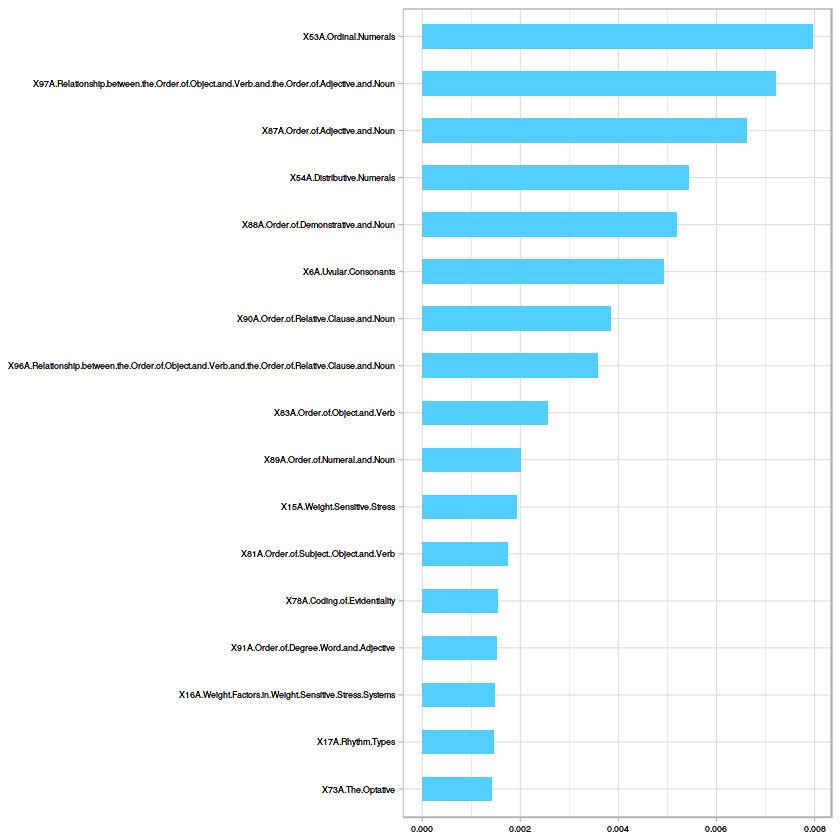

[1] "Climate: "
[1] "A" "D"
   
       Y    Z
  Y 1580  677
  Z   60  361


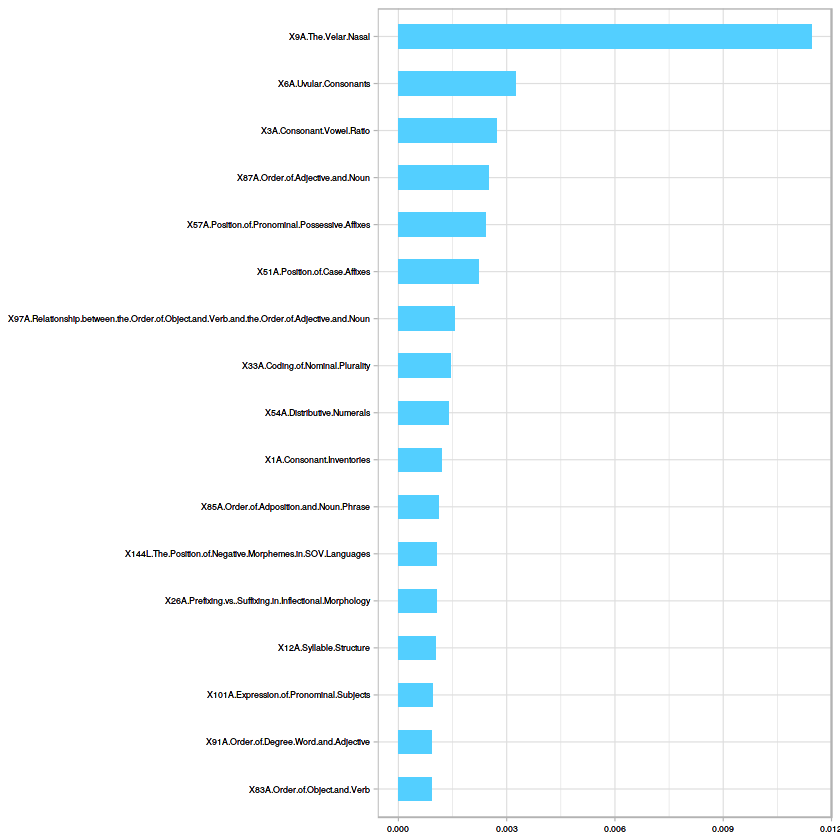

[1] "Climate: "
[1] "A" "E"
   
       Y    Z
  Y 1336  560
  Z  141  641


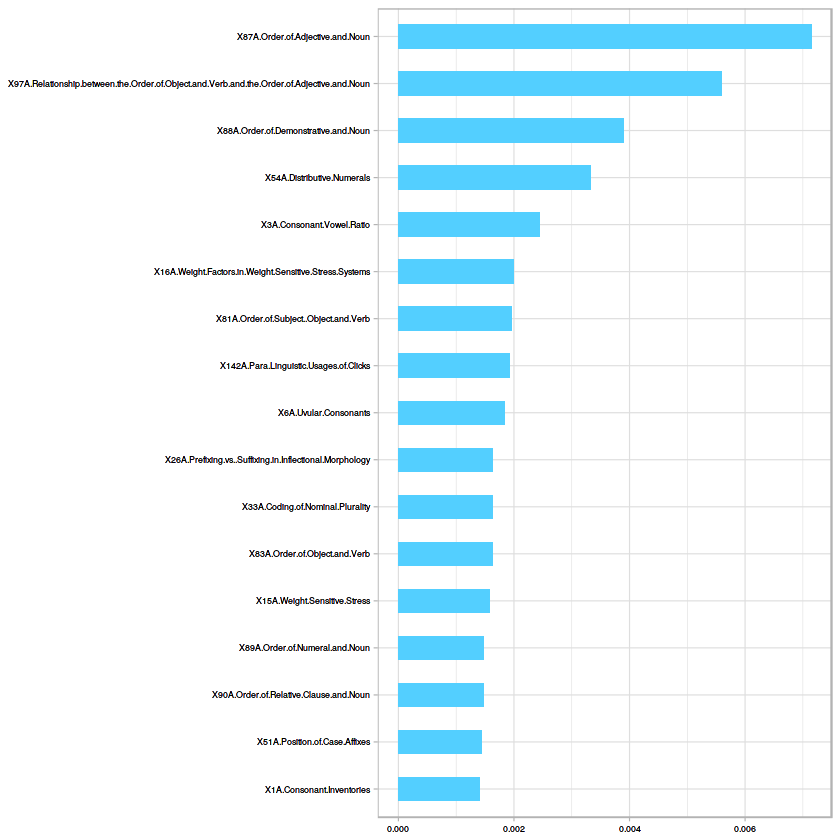

[1] "Climate: "
[1] "B" "C"
   
       Y    Z
  Y  216   13
  Z  748 1701


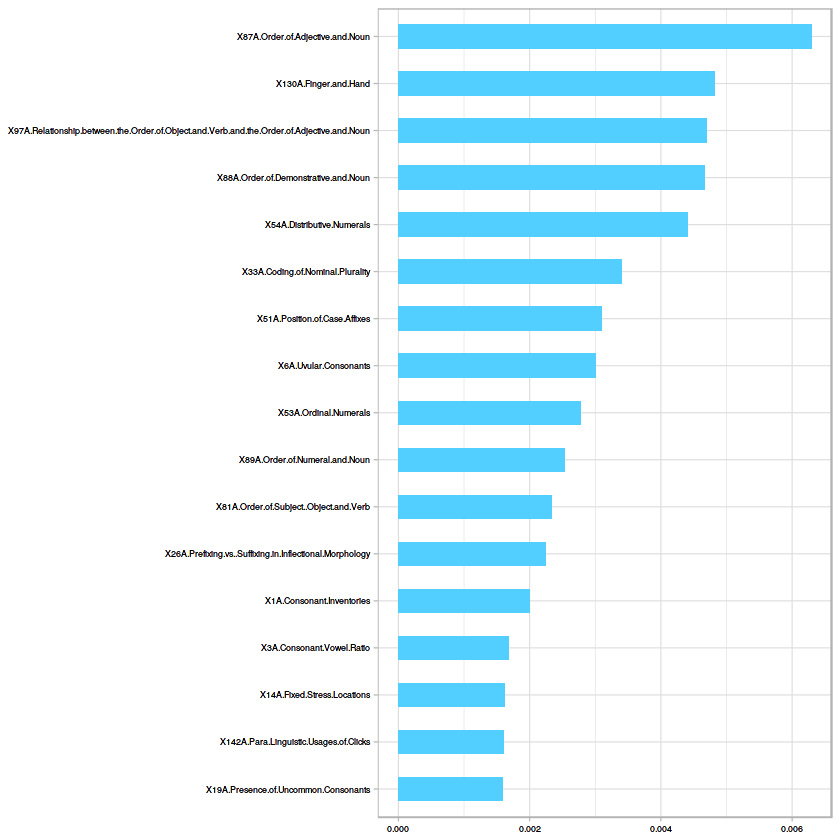

[1] "Climate: "
[1] "B" "D"
   
       Y    Z
  Y   43    2
  Z  549 2084


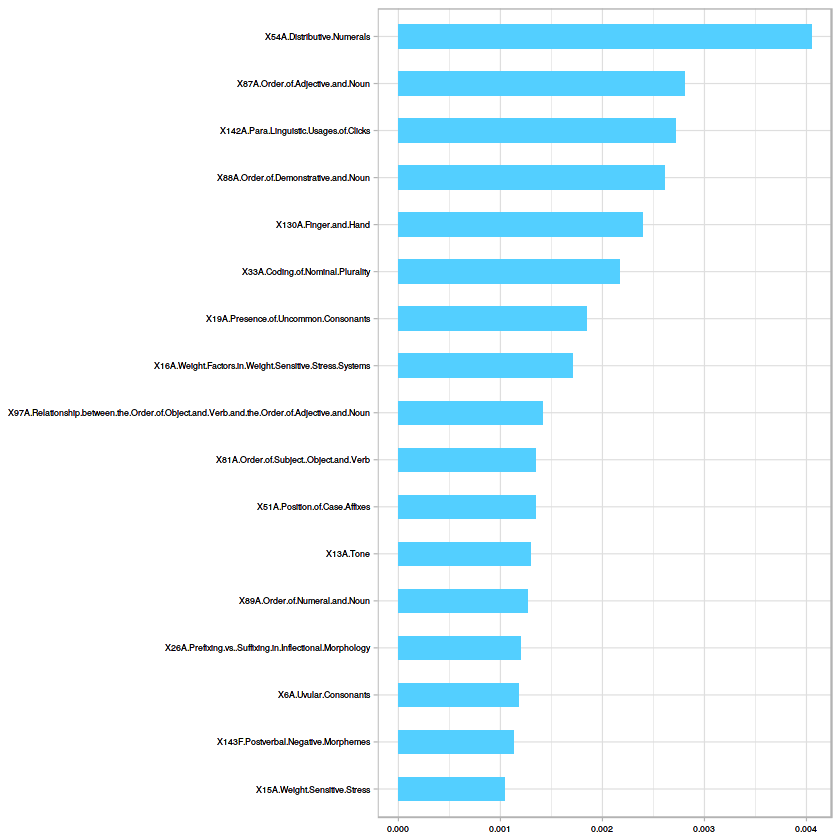

[1] "Climate: "
[1] "B" "E"
   
       Y    Z
  Y    0    0
  Z  429 2249


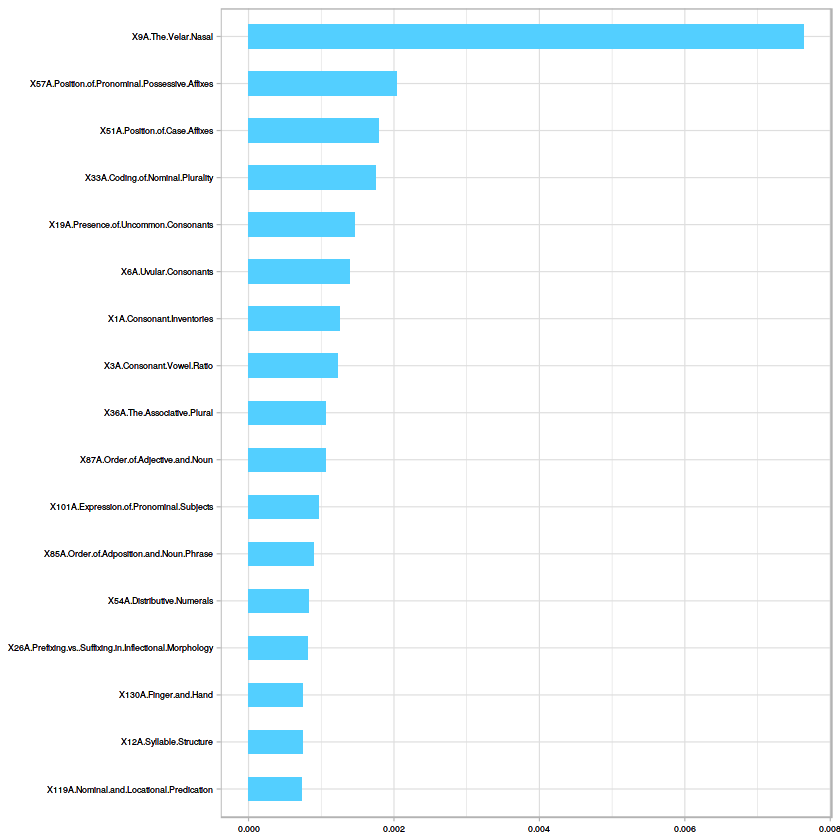

[1] "Climate: "
[1] "C" "D"
   
       Y    Z
  Y  214   15
  Z  632 1817


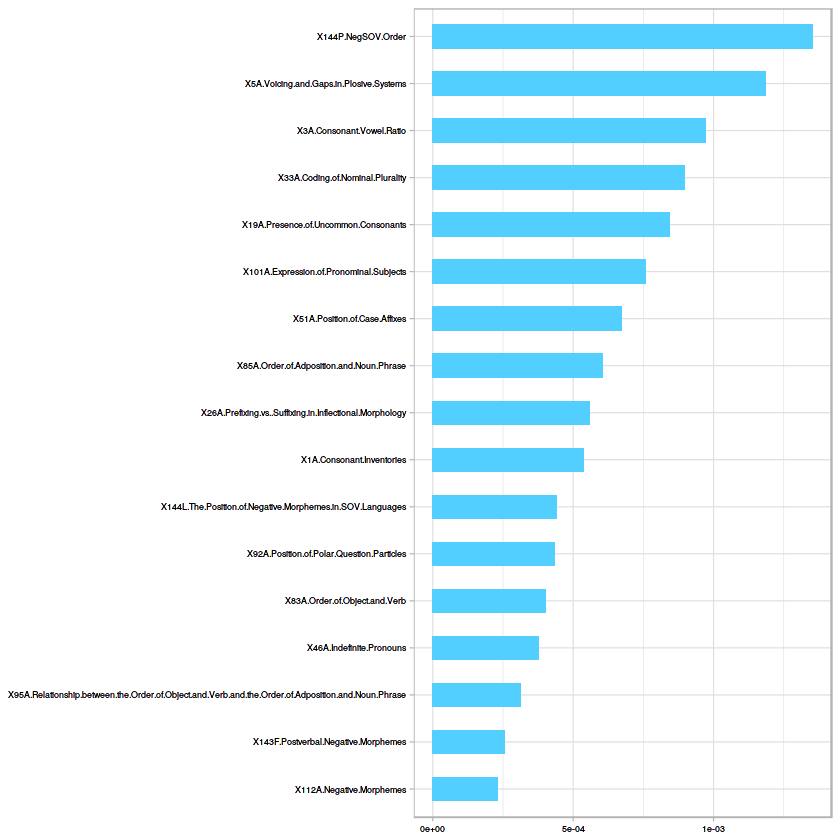

[1] "Climate: "
[1] "C" "E"
   
       Y    Z
  Y   37    1
  Z  646 1994


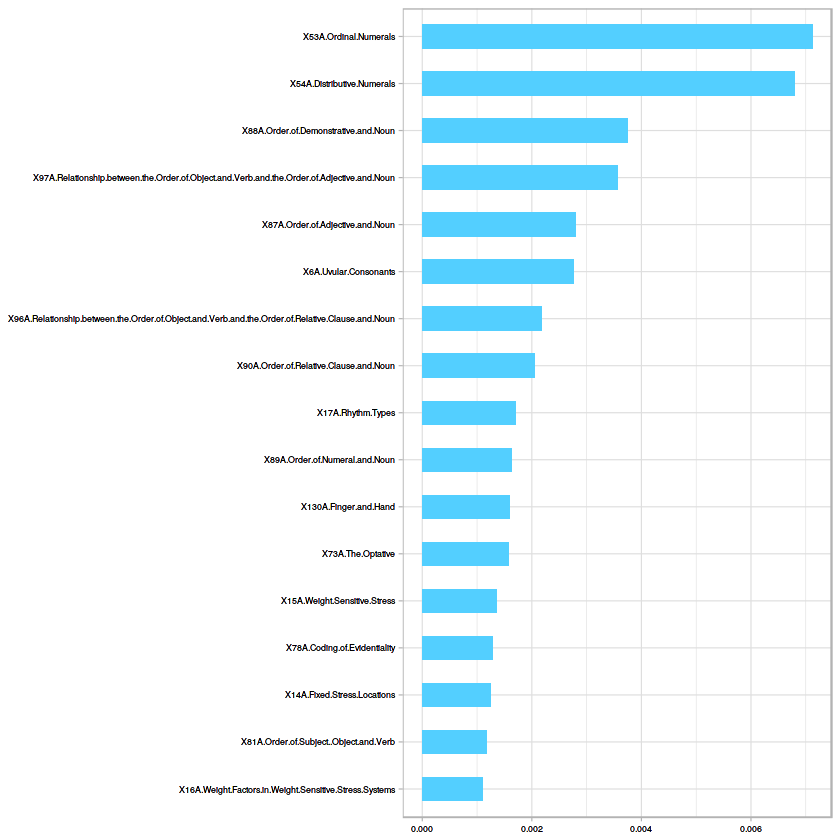

[1] "Climate: "
[1] "D" "E"
   
       Y    Z
  Y    3    0
  Z  308 2367


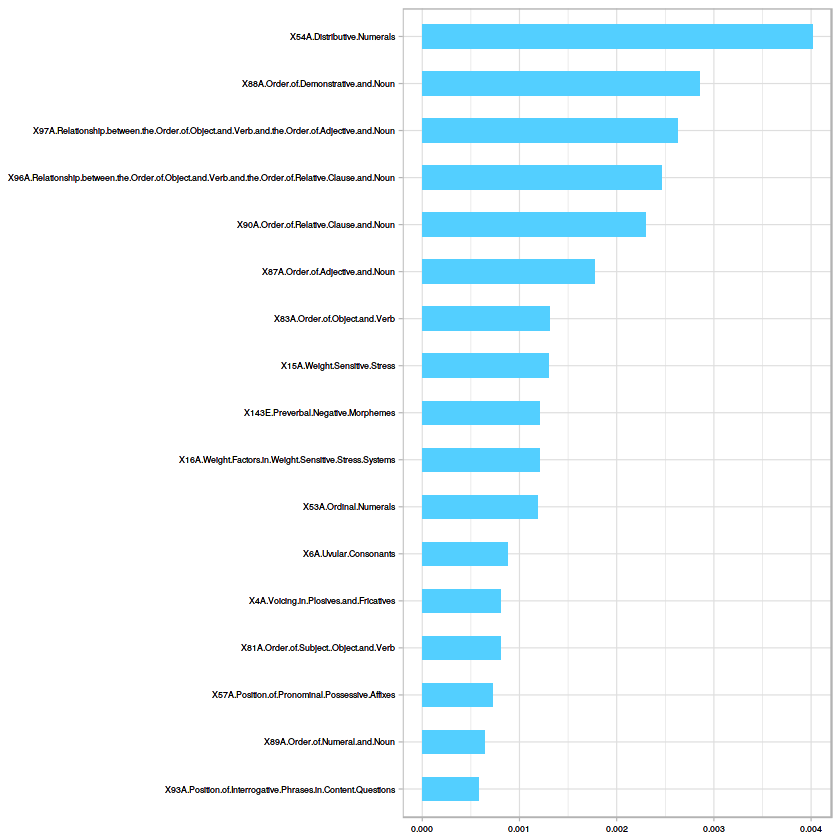

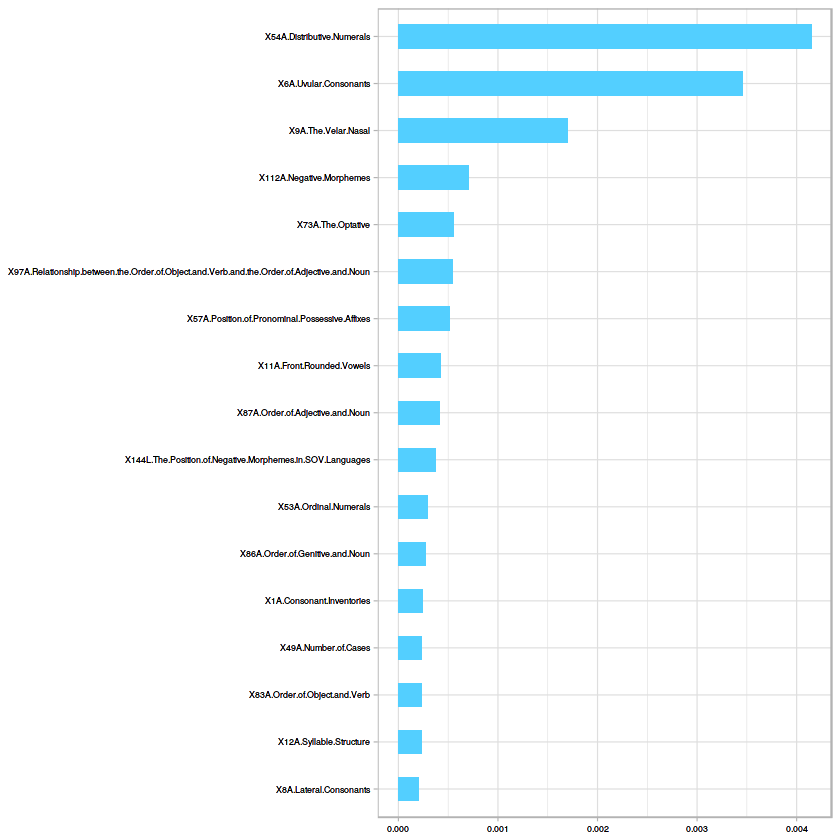

In [310]:
#Complete Dataset w/NA's Y is 
bin_2v3(l_df)

In [209]:
#Auxilary function to binarize or convert multiclass DF to One vs All

bin_ova <- function(df,k){
Y<-df[,(ncol(df)-1)]
X<-df[,-(ncol(df)-1)]

T<-Y
T<-ifelse(T !=k, 'X', k)
prob<-table(T)/length(T)
c<-c(k,'X')
clim<-c('Tropical','Arid', 'Temperate','Cold','Polar')
names(clim)<-sub
D<-X
D["Climate"] <- as.factor(T)
return(D)
}

In [210]:
pdf<-bin_ova(phon_df,'A')
pdf

,X1A.Consonant.Inventories,X2A.Vowel.Quality.Inventories,X3A.Consonant.Vowel.Ratio,X4A.Voicing.in.Plosives.and.Fricatives,X5A.Voicing.and.Gaps.in.Plosive.Systems,X6A.Uvular.Consonants,X7A.Glottalized.Consonants,X8A.Lateral.Consonants,X9A.The.Velar.Nasal,X10A.Vowel.Nasalization,⋯,X12A.Syllable.Structure,X13A.Tone,X14A.Fixed.Stress.Locations,X15A.Weight.Sensitive.Stress,X16A.Weight.Factors.in.Weight.Sensitive.Stress.Systems,X17A.Rhythm.Types,X18A.Absence.of.Common.Consonants,X19A.Presence.of.Uncommon.Consonants,random,Climate
35,4 Moderately large,2 Average (5-6),4 Moderately high,4 In both plosives and fricatives,3 Missing /p/,4 Uvular stops and continuants,1 No glottalized consonants,"2 /l/, no obstruent laterals",3 No velar nasal,2 Contrast absent,,3 Complex,1 No tones,1 No fixed stress,4 Right-oriented: One of the last three,7 Combined,1 Trochaic,1 All present,4 Pharyngeals,1,X
90,2 Moderately small,2 Average (5-6),3 Average,2 In plosives alone,3 Missing /p/,1 None,1 No glottalized consonants,"2 /l/, no obstruent laterals",3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,1 No fixed stress,5 Unbounded: Stress can be anywhere,3 Coda consonant,5 No rhythmic stress,1 All present,3 Labial-velars,4,A
129,1 Small,2 Average (5-6),3 Average,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,1 Contrast present,,1 Simple,1 No tones,1 No fixed stress,3 Right-edge: Ultimate or penultimate,2 Long vowel,1 Trochaic,1 All present,1 None,4,A
154,1 Small,2 Average (5-6),1 Low,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,7 Ultimate,8 Fixed stress (no weight-sensitivity),6 Lexical stress,2 Iambic,1 All present,1 None,3,A
389,5 Large,2 Average (5-6),5 High,4 In both plosives and fricatives,2 None missing in /p t k b d g/,4 Uvular stops and continuants,1 No glottalized consonants,"2 /l/, no obstruent laterals",2 No initial velar nasal,1 Contrast present,,3 Complex,1 No tones,1 No fixed stress,7 Not predictable,6 Lexical stress,1 Trochaic,1 All present,1 None,4,X
406,3 Average,1 Small (2-4),4 Moderately high,1 No voicing contrast,1 Other,4 Uvular stops and continuants,1 No glottalized consonants,"2 /l/, no obstruent laterals",2 No initial velar nasal,2 Contrast absent,,3 Complex,1 No tones,2 Initial,8 Fixed stress (no weight-sensitivity),7 Combined,1 Trochaic,1 All present,1 None,1,X
432,3 Average,2 Average (5-6),3 Average,2 In plosives alone,2 None missing in /p t k b d g/,1 None,1 No glottalized consonants,"2 /l/, no obstruent laterals",1 Initial velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,1 No fixed stress,4 Right-oriented: One of the last three,3 Coda consonant,4 Undetermined,1 All present,1 None,4,A
477,1 Small,2 Average (5-6),1 Low,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,2 Initial,8 Fixed stress (no weight-sensitivity),1 No weight,1 Trochaic,1 All present,1 None,4,X
492,5 Large,2 Average (5-6),5 High,2 In plosives alone,2 None missing in /p t k b d g/,4 Uvular stops and continuants,2 Ejectives only,4 /l/ and lateral obstruent,3 No velar nasal,2 Contrast absent,,3 Complex,1 No tones,1 No fixed stress,3 Right-edge: Ultimate or penultimate,1 No weight,5 No rhythmic stress,1 All present,1 None,1,X
502,1 Small,1 Small (2-4),2 Moderately low,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,5 Antepenultimate,8 Fixed stress (no weight-sensitivity),1 No weight,1 Trochaic,1 All present,1 None,1,X


In [538]:
#Cross validation and Tuning parameters for RF and Feature Importance
#5-fold split for CV repeated 10 times , tuning mtry or splits parameter for RF


cvrf <- function(yourData,t){
    #Tune number of variables considered at each split with random search; original seed=5
    seed<-6
    metric <- "Accuracy"
    control <- trainControl(cforest_unbiased(ntree=750),method="repeatedcv", number=5, repeats=3, search="grid")
    set.seed(seed)
    tunegrid <- expand.grid(.mtry=c(1:ncol(yourData)-1))
    rf_gridsearch <- train(Climate~., data=yourData, method="cforest", metric = metric, tuneGrid=tunegrid, tuneLength=15, trControl=control)
    n<-as.numeric(rf_gridsearch$bestTune[[1]])
    fm<-rf_gridsearch$finalModel
    cv_res<-rf_gridsearch$results[,2]
    cv_res<-cv_res[n+1]

    #Best CV with tuned parameter
    #print("C-V accuracy for Random Forest is %i", cv_res)
    print(paste("C-V accuracy for Random Forest is", cv_res), quote = FALSE)
    #print(cv_res)
    
    #Variable Importance for Multiclass RF
    lang.crf<-cforest(Climate~., data = yourData, controls = cforest_unbiased(mtry=n, ntree=2000))
    
    #Confusion Matrix
    print("RF Confusion Matrix:")
    print(table(predict(lang.crf), yourData$Climate))
    
    #Variable Importance
    imp <- varimp(lang.crf, conditional = TRUE)
    imp<-sort(imp, decreasing = TRUE)
    print(imp_bar(imp,t))
    
    
    }

In [37]:

#Dummy Classifier Auxilary function
#c is the class vector, v is the real data, and p is the probability distribution for each class
dummy_clas<- function(c,v,p){
rlist<-vector("list", 2000)
for (i in 1:2000){
    s<-sample(c, size = length(v), prob = p, replace = TRUE)
    score <- count_sim_list(v,s)/length(v)
    rlist[[i]] <- score
    }
rlist<-as.numeric(rlist)
print(mean(rlist))
}

#Dummy Classifier for Multi-Class RF
class<-c('A','B','C','D','E')
#vec <- data_mc$Climate
#print(paste0("Dummy classifier for Multi-class ",dummy_clas(class,vec,tg)))

In [197]:
#print(fm)
n<-as.numeric(n)
rf_gridsearch$results[n,2]



[1] 0.4492824

In [504]:
#Auxilary function - SVM classification
svmc<-function(df,t){
    p<-dist(df)
    
    #trctrl <- trainControl(method = "repeatedcv", number = 5, repeats = 5)
    #set.seed(10)
    #grid <- expand.grid(C = c(0,0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2,5,10))
    
    #svm_Lin <- train(Climate ~., data = df, method = "svmLinear",
                    #trControl=trctrl,
                    #tuneGrid = grid,
                    #tuneLength = 10)
    cvres<-numeric(5)
    p<-dist(df)
    #Repeat cross validation 5 times with different indices
    for (i in 1:5){
        mdl <- svm(Climate ~ ., data = df, class.weights=p, cross = 5, kernel = 'linear', cost = 1)
        cvres[[i]]<-mdl$tot.accuracy
    }
    mdl <- svm(Climate ~ ., data = df, class.weights=p, cross = 5, kernel = 'linear', cost = 1)
    w = t(mdl$coefs) %*% mdl$SV
    w<-abs(w)

    #Get linear SVM coefficients for feature imp.
    imprt<-numeric(ncol(df))
    names(imprt)<- colnames(df)
    w<-colSums(w)
    
    for (i in 1:ncol(df)){
        ind<-names(w)[grepl(colnames(df)[i], names(w), fixed=TRUE)]
        imprt[[i]]<-sum(w[ind])
    }
    imprt<-imprt[order(imprt,decreasing=TRUE)]
    print(imp_bar(imprt,t))
    print(paste0("Accuracy for SVM:", mean(cvres)))
    
    #Confusion Matrix
    print(table(predict(mdl), df$Climate))
    
    
    
}

X1A.Consonant.Inventories 
                                                                                                  1.311952e-03 
                                                                                 X2A.Vowel.Quality.Inventories 
                                                                                                  7.060452e-05 
                                                                                     X3A.Consonant.Vowel.Ratio 
                                                                                                  1.910475e-03 
                                                                        X4A.Voicing.in.Plosives.and.Fricatives 
                                                                                                  3.525611e-04 
                                                                       X5A.Voicing.and.Gaps.in.Plosive.Systems 
                                                                                                  3.119520e-04 
                                                                                         X6A.Uvular.Consonants 
                                                                                                  4.251038e-03 
                                                                                    X7A.Glottalized.Consonants 
                                                                                                  2.210429e-04 
                                                                                        X8A.Lateral.Consonants 
                                                                                                  9.021689e-04 
                                                                                           X9A.The.Velar.Nasal 
                                                                                                  4.425473e-03 
                                                                                       X10A.Vowel.Nasalization 
                                                                                                  3.230272e-06 
                                                                                     X11A.Front.Rounded.Vowels 
                                                                                                  2.362713e-04 
                                                                                       X12A.Syllable.Structure 
                                                                                                  9.889248e-04 
                                                                                                     X13A.Tone 
                                                                                                  3.354868e-04 
                                                                                   X14A.Fixed.Stress.Locations 
                                                                                                  8.850946e-04 
                                                                                  X15A.Weight.Sensitive.Stress 
                                                                                                  2.021228e-03 
                                                        X16A.Weight.Factors.in.Weight.Sensitive.Stress.Systems 
                                                                                                  9.972312e-04 
                                                                                             X17A.Rhythm.Types 
                                                                                                  5.777573e-04 
                                                                             X18A.Absence.of.Common.Consonants 
                                                                                                  1.965851e-04 
                                                     

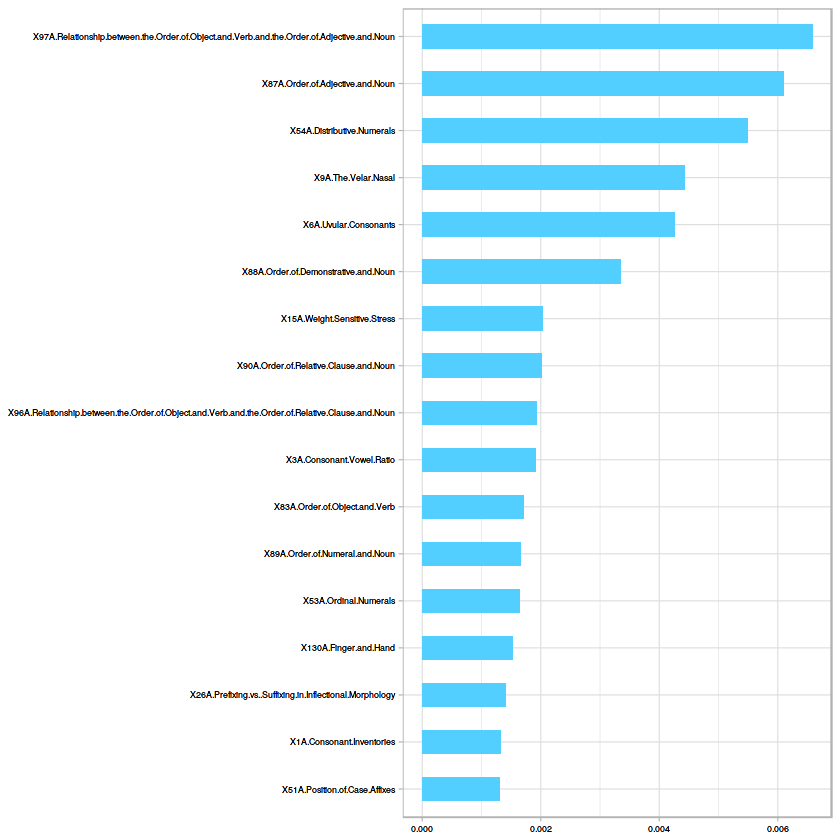

In [27]:
#Variable Importance nonconditional RF for whole dataset with NA's
lang.crf<-cforest(Climate~., data = l_df, controls = cforest_unbiased(mtry=13, ntree=2200))
imp <- varimp(lang.crf)

imp

imp<-sort(imp, decreasing = TRUE)
imp_all<-imp[1:17]
imp_bar(imp)

In [96]:
l_df<-l_df[-939,]

In [95]:
l_df[939,]

,X1A.Consonant.Inventories,X2A.Vowel.Quality.Inventories,X3A.Consonant.Vowel.Ratio,X4A.Voicing.in.Plosives.and.Fricatives,X5A.Voicing.and.Gaps.in.Plosive.Systems,X6A.Uvular.Consonants,X7A.Glottalized.Consonants,X8A.Lateral.Consonants,X9A.The.Velar.Nasal,X10A.Vowel.Nasalization,⋯,X137B.M.in.Second.Person.Singular,X136B.M.in.First.Person.Singular,X109B.Other.Roles.of.Applied.Objects,X25B.Zero.Marking.of.A.and.P.Arguments,X21B.Exponence.of.Tense.Aspect.Mood.Inflection,X108B.Productivity.of.the.Antipassive.Construction,X58B.Number.of.Possessive.Nouns,X79B.Suppletion.in.Imperatives.and.Hortatives,Climate,random
941,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,4


In [ ]:
lst_ord<-c('X1A.Consonant.Inventories', 'X2A.Vowel.Quality.Inventories', 'X3A.Consonant.Vowel.Ratio',
           'X12A.Syllable.Structure','X13A.Tone', 'X22A.Inflectional.Synthesis.of.the.Verb','X30A.Number.of.Genders',
          'X41A.Distance.Contrasts.in.Demonstratives', 'X58B.Number.of.Possessive.Nouns', 'X132A.Number.of.Non.Derived.Basic.Colour.Categories',
           'X133A.Number.of.Basic.Colour.Categories')

l_df[lst_ord] <- lapply(l_df[lst_ord], ordered)

[1] "A" "B"
[1] 0.6777705
[1] "Dummy Classifier accuracy:0.6777704778157"
[1] "A" "C"
[1] 0.5776347
[1] "Dummy Classifier accuracy:0.577634691848907"


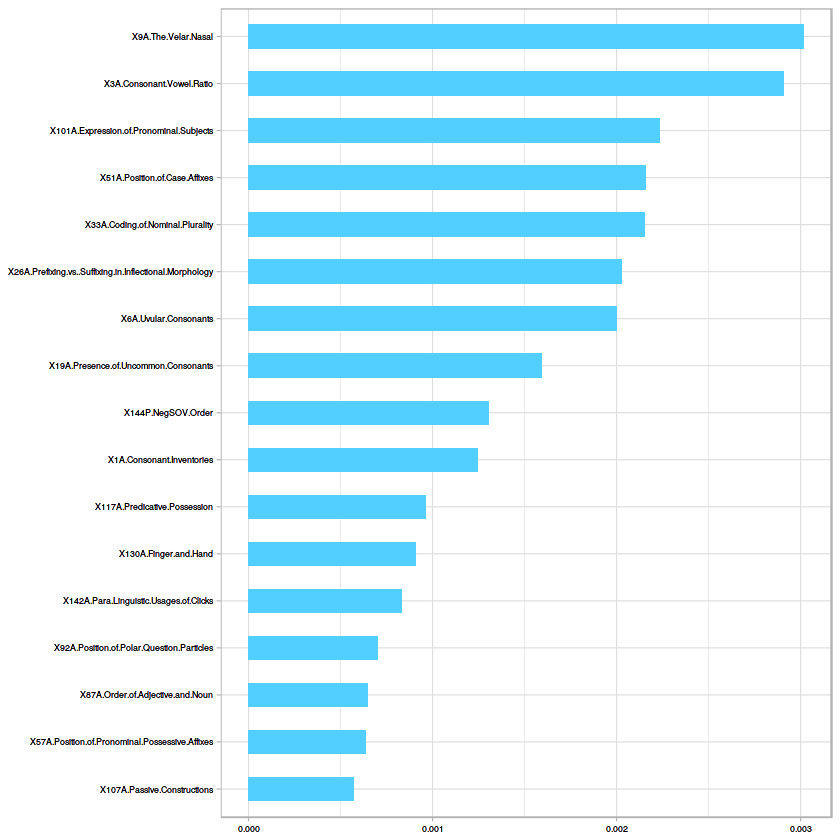

[1] "A" "D"
[1] 0.7525765
[1] "Dummy Classifier accuracy:0.752576524390244"


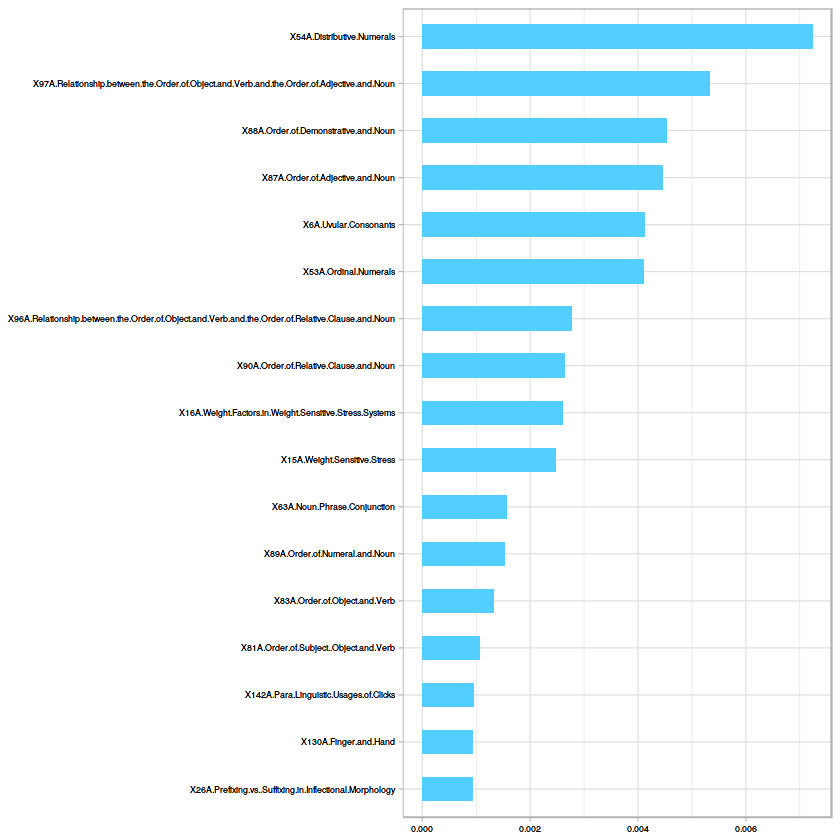

[1] "A" "E"
[1] 0.9049479
[1] "Dummy Classifier accuracy:0.904947867298578"


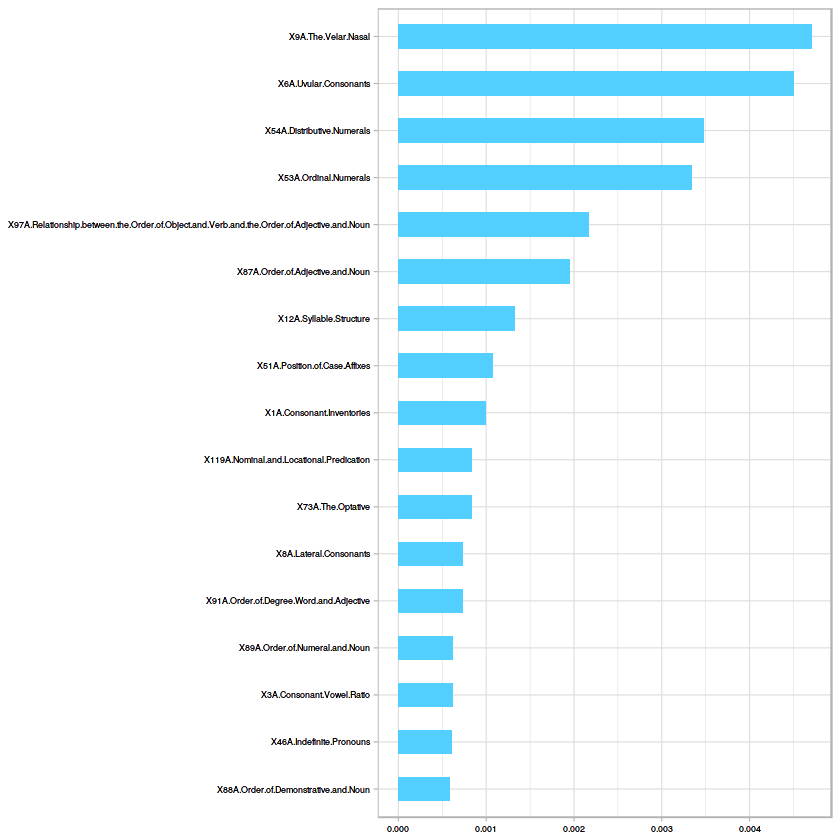

[1] "B" "C"
[1] 0.5343387
[1] "Dummy Classifier accuracy:0.534338692946058"


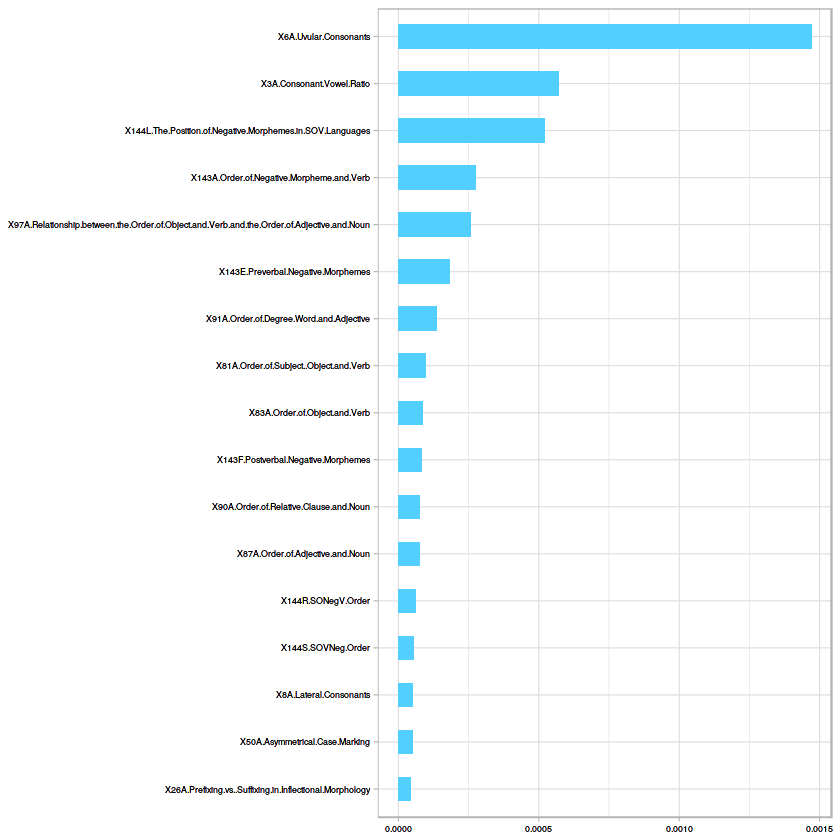

[1] "B" "D"
[1] 0.5198497
[1] "Dummy Classifier accuracy:0.519849662162162"


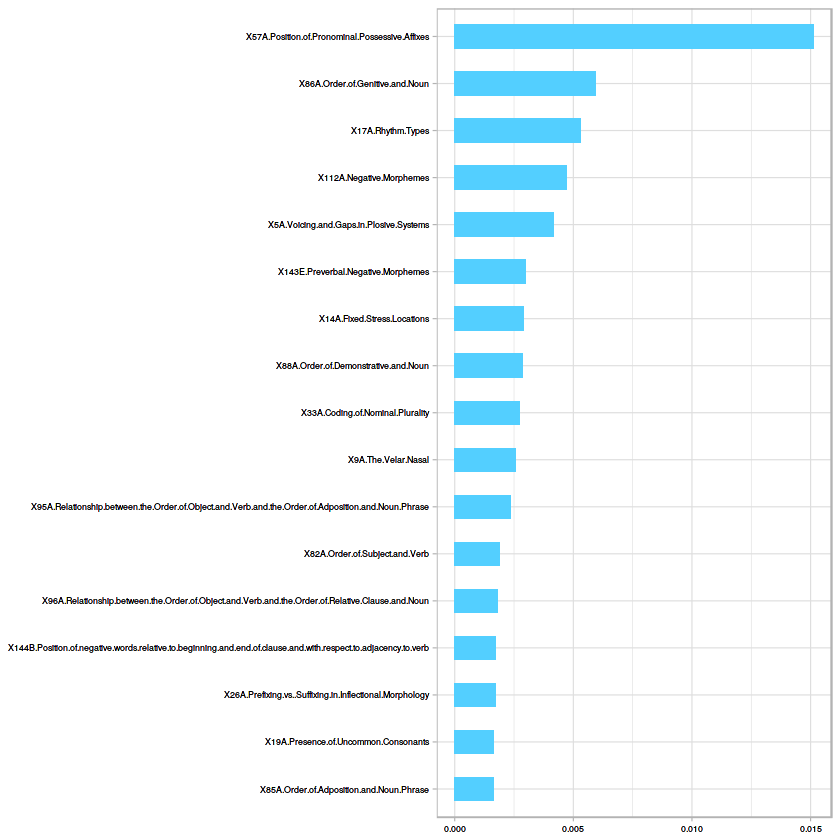

[1] "B" "E"
[1] 0.7136305
[1] "Dummy Classifier accuracy:0.713630536130536"


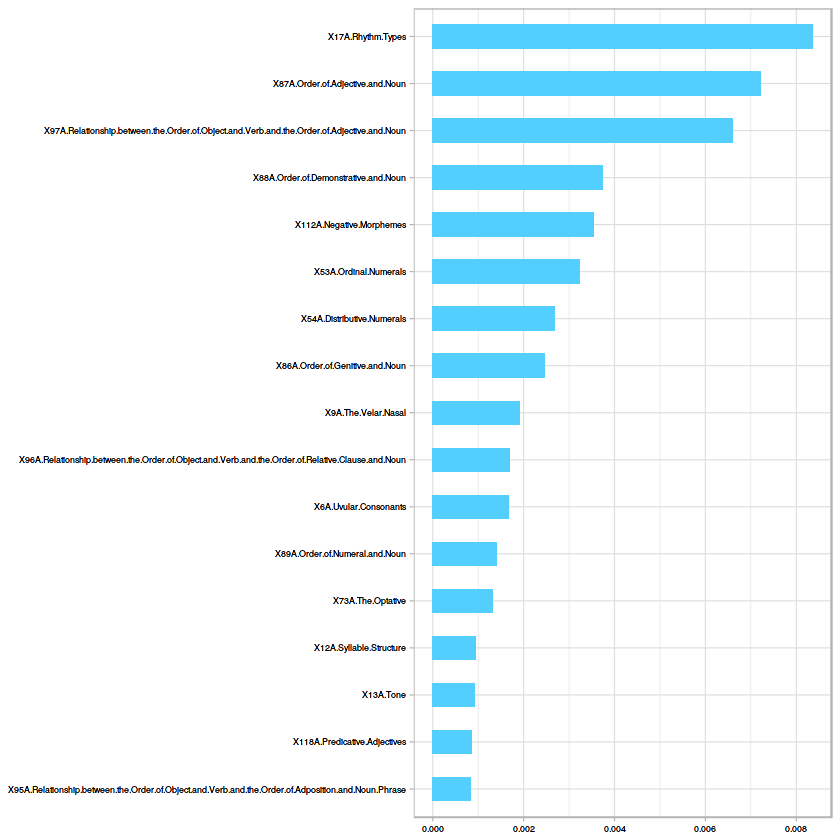

[1] "C" "D"
[1] 0.5968558
[1] "Dummy Classifier accuracy:0.596855791962175"


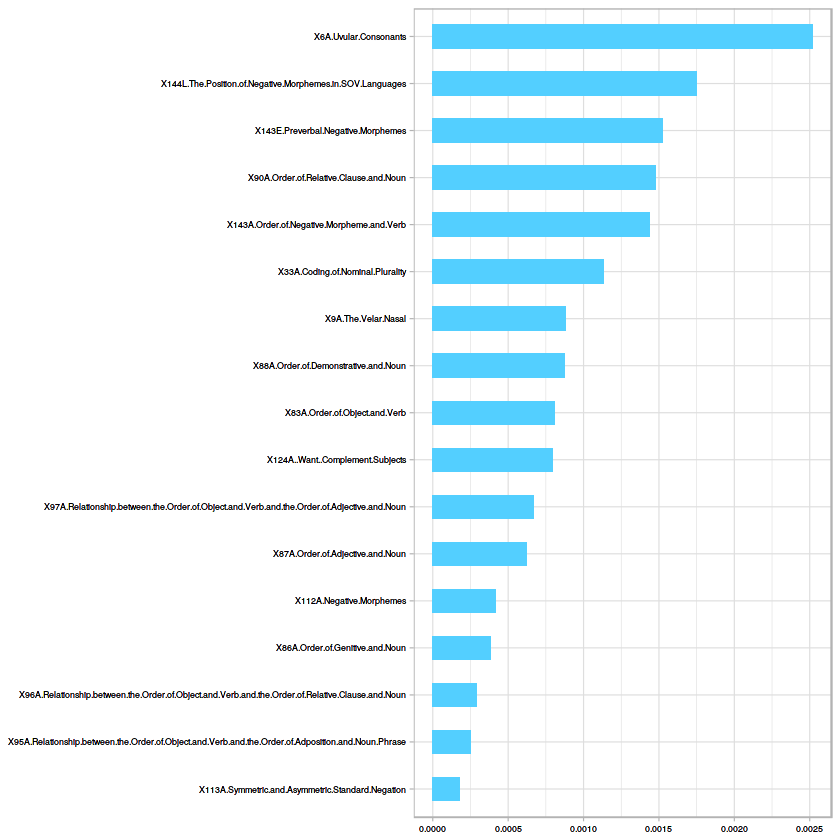

[1] "C" "E"
[1] 0.8068741
[1] "Dummy Classifier accuracy:0.806874084919473"


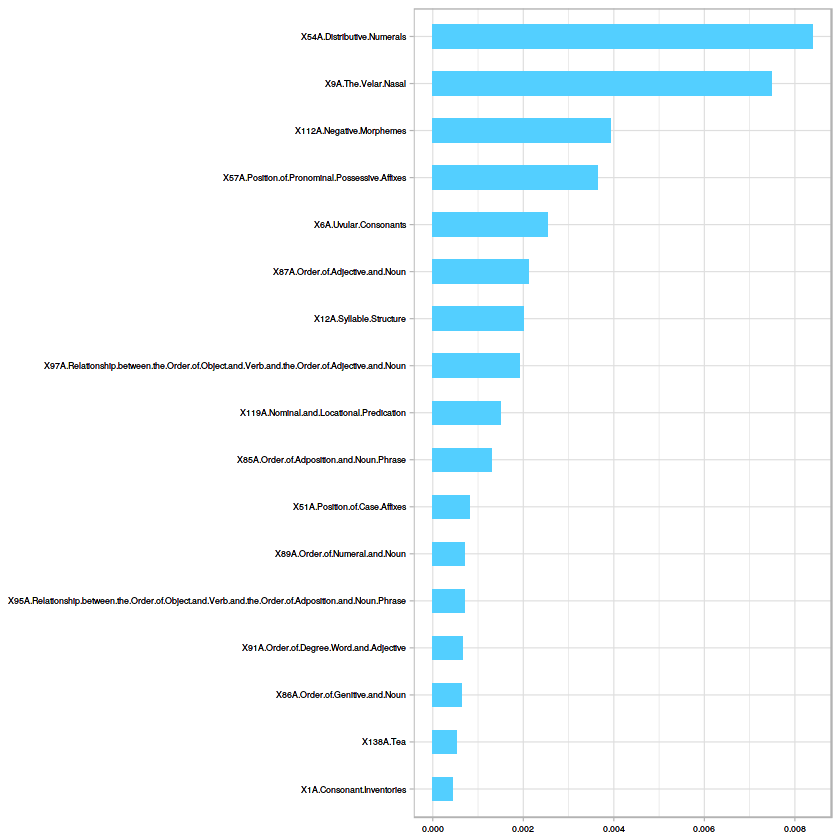

[1] "D" "E"
[1] 0.637873
[1] "Dummy Classifier accuracy:0.637872990353698"


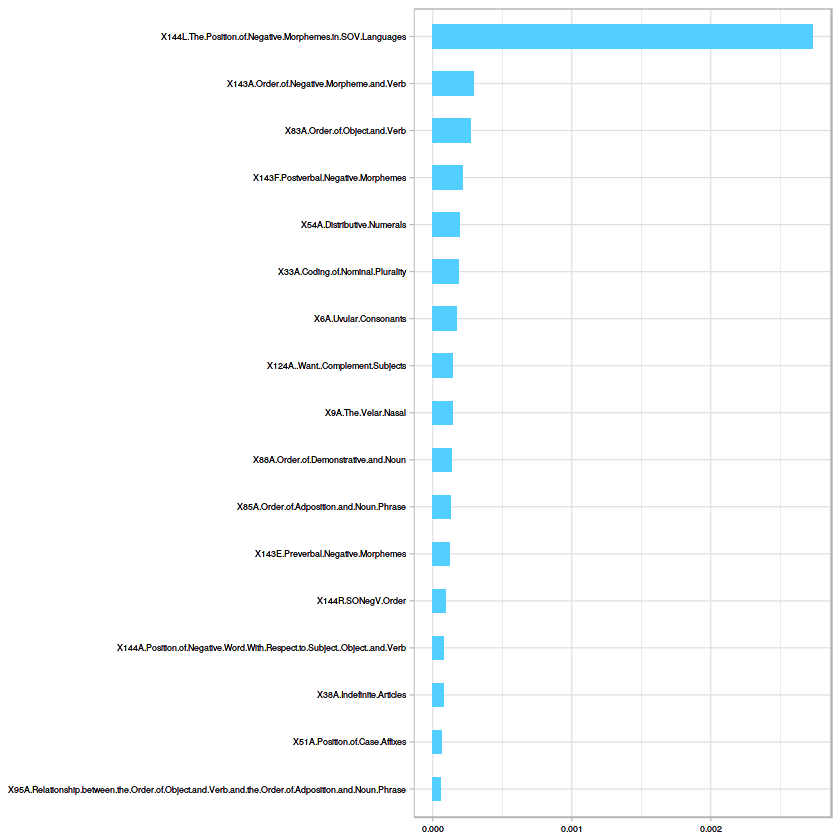

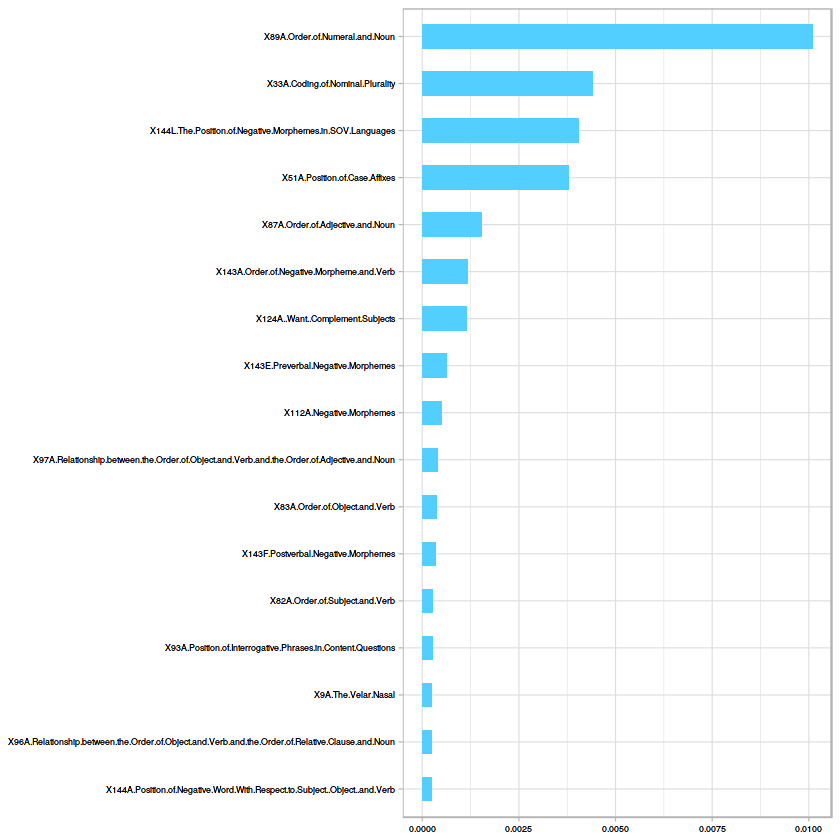

In [129]:
#ntree = 2000
ovo(l_df)

In [157]:
sub = c('A','B','C','D','E')
t<-combn(sub, 2, simplify = FALSE)
ll<-t[[1]]
ll

[1] "A" "B"

[1] "A" "B"
[1] 0.6777398
[1] "Dummy Classifier accuracy:0.67773976109215"
   
       A    B
  A 1403  320
  B    0   35
[1] "A" "C"
[1] 0.5775626
[1] "Dummy Classifier accuracy:0.577562624254473"
   
       A    C
  A 1382  428
  C   21  181


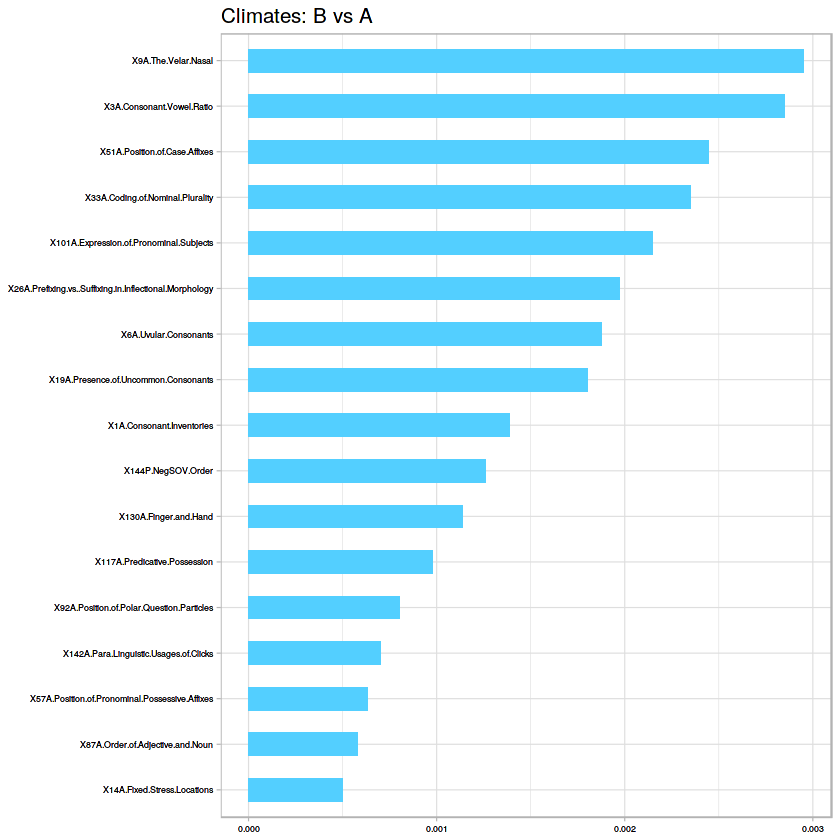

[1] "A" "D"
[1] 0.7528933
[1] "Dummy Classifier accuracy:0.752893292682927"
   
       A    D
  A 1403  208
  D    0   29


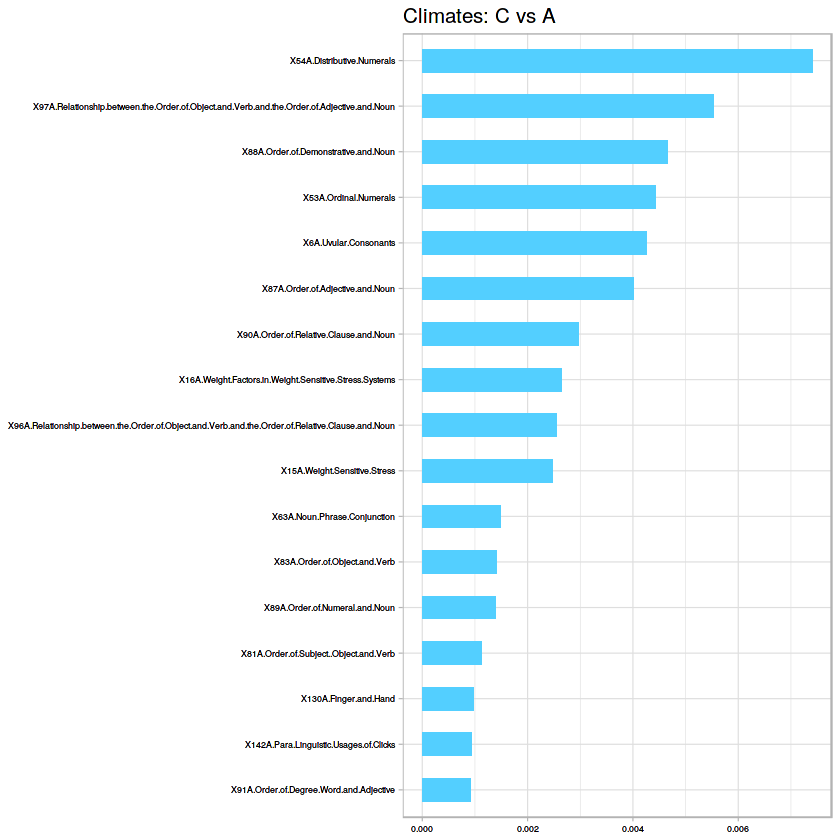

[1] "A" "E"
[1] 0.9048186
[1] "Dummy Classifier accuracy:0.904818551117129"
   
       A    E
  A 1403   74
  E    0    0


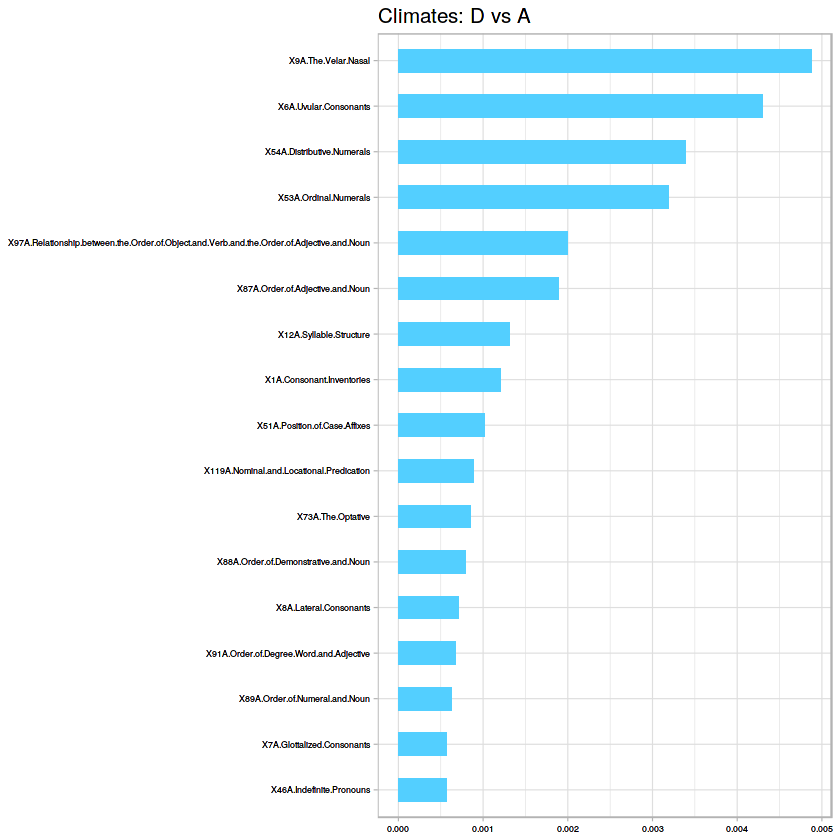

[1] "B" "C"
[1] 0.5345773
[1] "Dummy Classifier accuracy:0.534577282157676"
   
      B   C
  B 140  13
  C 215 596


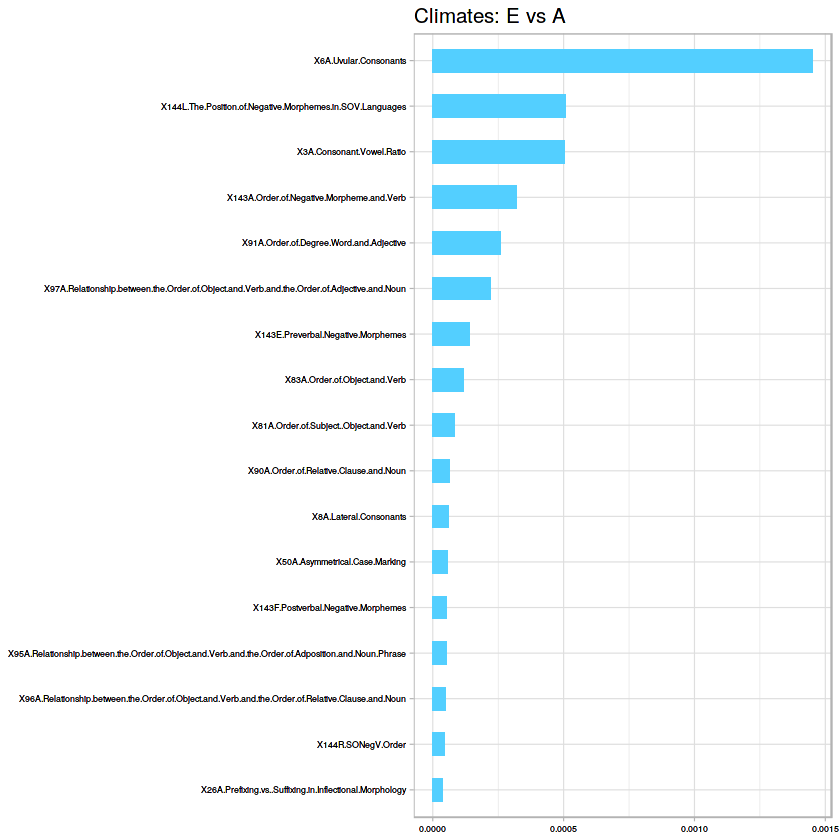

[1] "B" "D"
[1] 0.5202196
[1] "Dummy Classifier accuracy:0.520219594594595"
   
      B   D
  B 345 146
  D  10  91


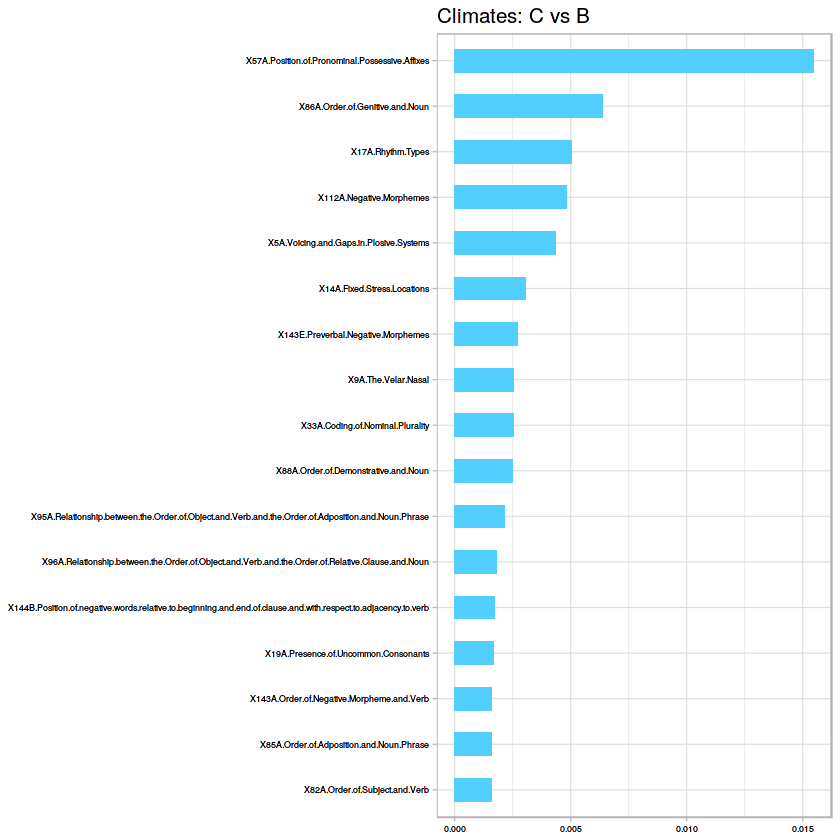

[1] "B" "E"
[1] 0.7147506
[1] "Dummy Classifier accuracy:0.714750582750583"
   
      B   E
  B 355  74
  E   0   0


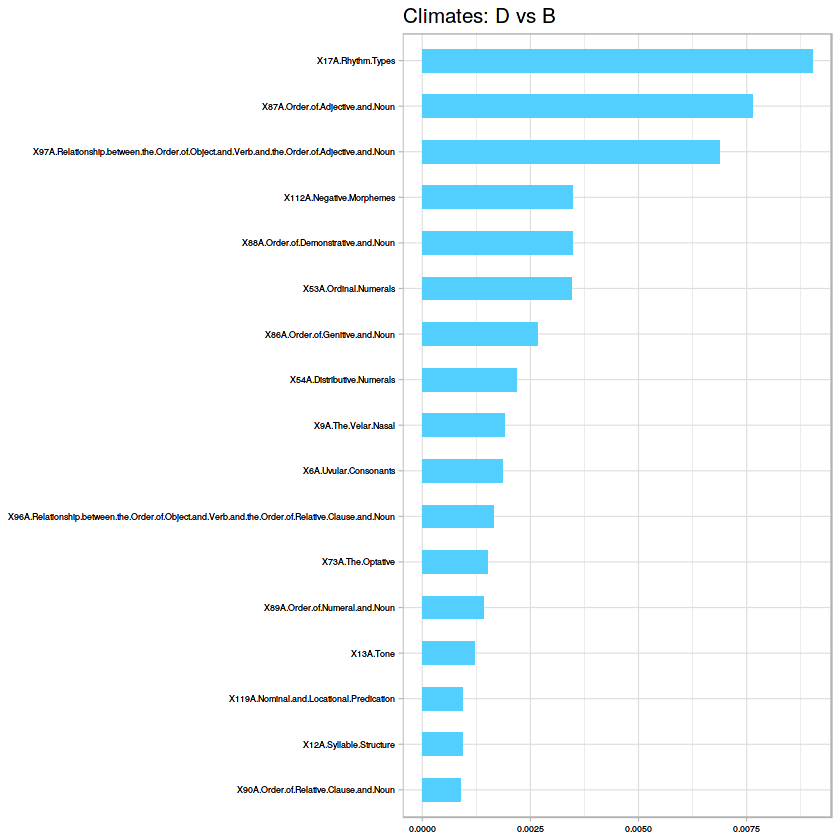

[1] "C" "D"
[1] 0.5964645
[1] "Dummy Classifier accuracy:0.596464539007092"
   
      C   D
  C 609 204
  D   0  33


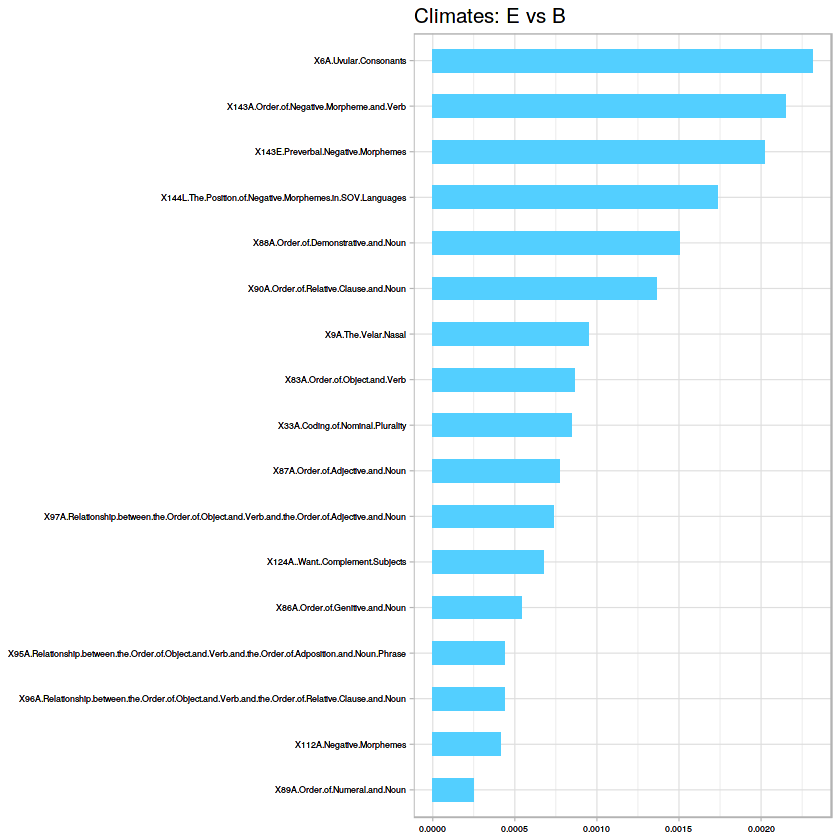

[1] "C" "E"
[1] 0.8067145
[1] "Dummy Classifier accuracy:0.806714494875549"
   
      C   E
  C 609  74
  E   0   0


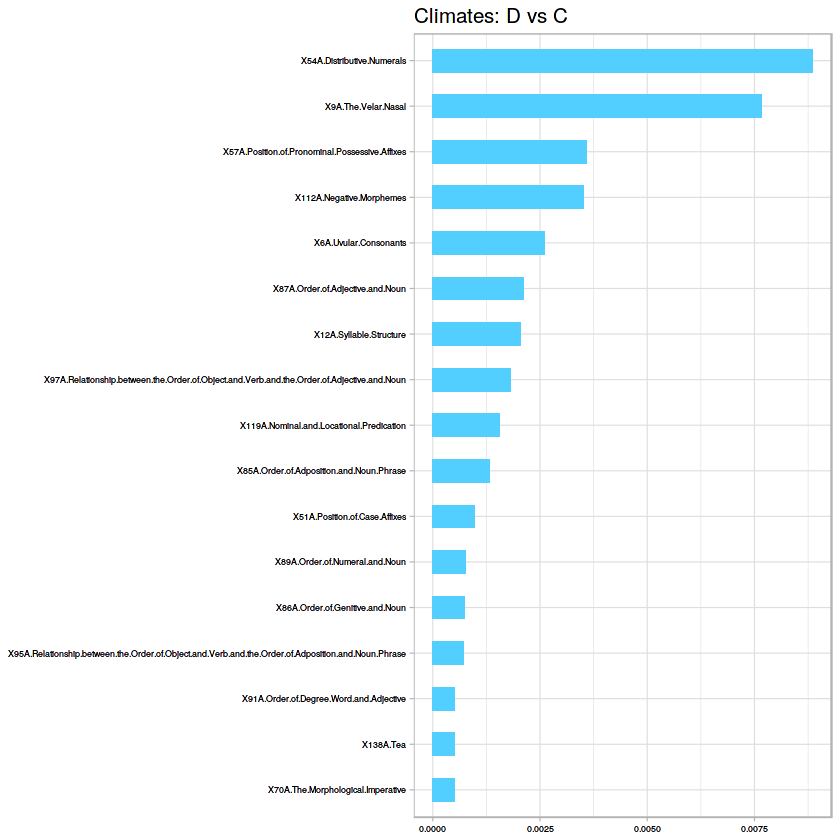

[1] "D" "E"
[1] 0.63659
[1] "Dummy Classifier accuracy:0.636590032154341"
   
      D   E
  D 236  70
  E   1   4


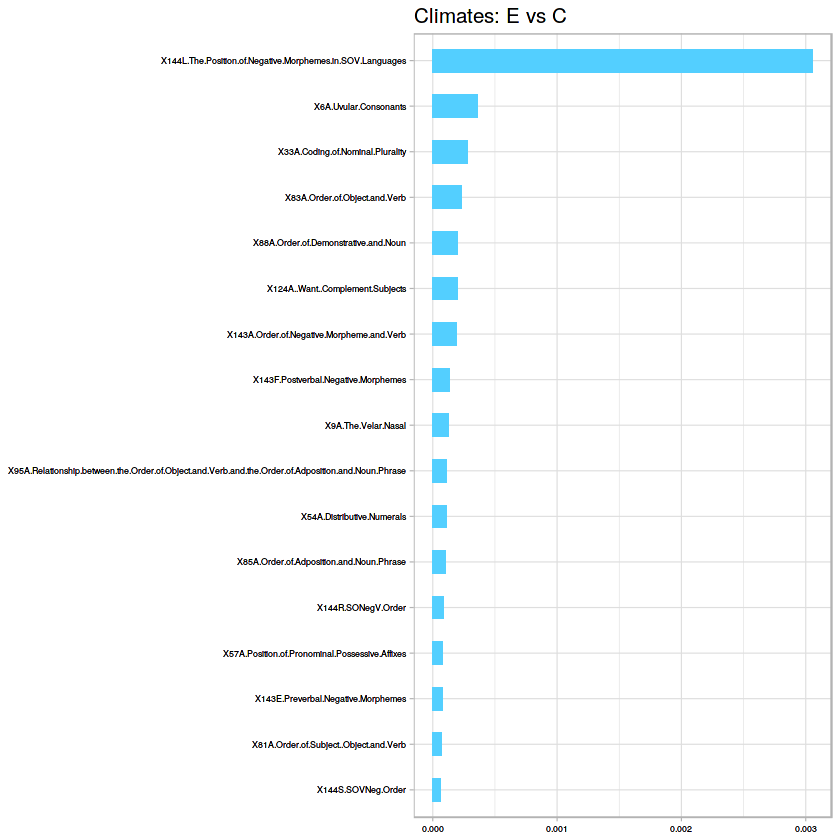

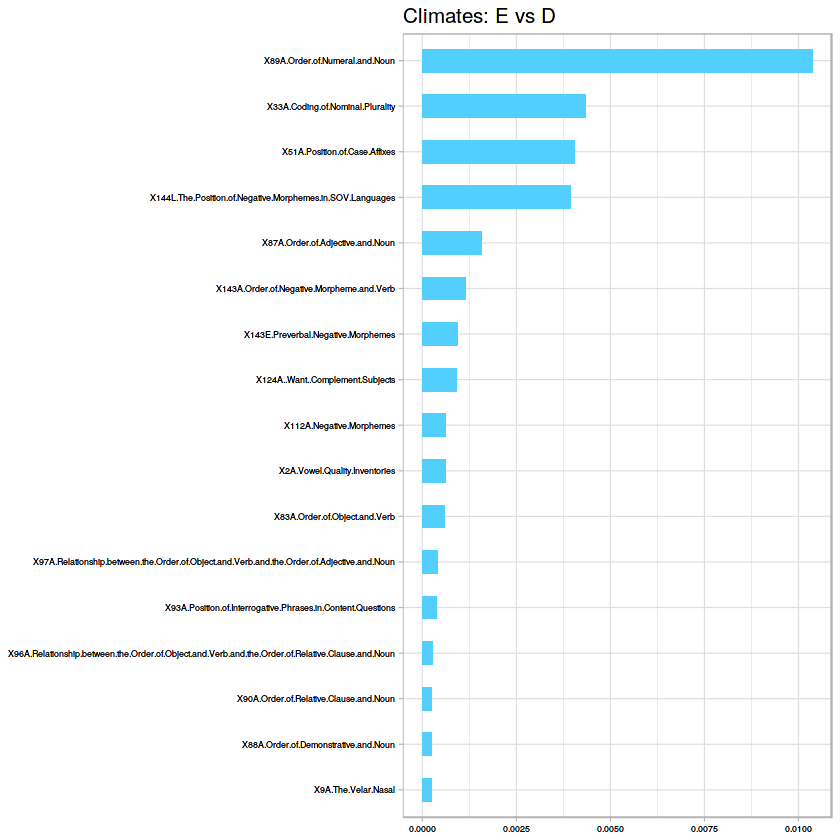

In [161]:
#Complete Dataset - One vs One
ovo(l_df)

In [348]:
#One vs One Classification and Var Importance

ovo<- function(df){
sub = c('A','B','C','D','E')
t<-combn(sub, 2, simplify = FALSE)
    
for (i in t){
    
    #new dataframe with those two classes
    n_df<-df[df$Climate %in% i ,]
    n_df$Climate<-as.character(n_df$Climate)
    n_df$Climate<- as.factor(n_df$Climate)
    p <- table(n_df$Climate)/nrow(n_df)
    print(i)
    dc<-dummy_clas(i,n_df$Climate,p)
    print(paste0("Dummy Classifier accuracy:",dc))
    print(cvrf(n_df,i))
    #SVM for dataset with no NA's
    print(svmc(n_df,i))

    
}
}

In [570]:
Y<-data_mc[,18]
X<-data_mc[,-18]

T<-Y
T<-ifelse(T !='A', 'X', 'A')
prob<-table(T)/length(T)
c<-c(k,'X')
clim<-c('Tropical','Arid', 'Temperate','Cold','Polar')
names(clim)<-sub

ERROR: Error in as.character(function (pattern, replacement, x, ignore.case = FALSE, : cannot coerce type 'closure' to vector of type 'character'


In [30]:
as.numeric(l_df[2680,])>99

logical(0)

In [29]:
l_df[as.numeric(l_df[2680,])>99]

ERROR: Error in `[.data.frame`(l_df, , 2680): undefined columns selected


In [21]:
l_df<-lang_df

l_df<-l_df[,6:177]

In [118]:
l_df[,'Climate']

,X1A.Consonant.Inventories,X2A.Vowel.Quality.Inventories,X1A.Consonant.Inventories.1,X3A.Consonant.Vowel.Ratio,X2A.Vowel.Quality.Inventories.1,X3A.Consonant.Vowel.Ratio.1,X4A.Voicing.in.Plosives.and.Fricatives,X3A.Consonant.Vowel.Ratio.2,X2A.Vowel.Quality.Inventories.2,X1A.Consonant.Inventories.2,⋯,X1A.Consonant.Inventories.1396,X1A.Consonant.Inventories.1397,X1A.Consonant.Inventories.1398,X3A.Consonant.Vowel.Ratio.605,X1A.Consonant.Inventories.1399,X3A.Consonant.Vowel.Ratio.606,X3A.Consonant.Vowel.Ratio.607,X2A.Vowel.Quality.Inventories.354,X1A.Consonant.Inventories.1400,X1A.Consonant.Inventories.1401
3,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
5,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
6,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
7,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
8,2 Moderately small,2 Average (5-6),2 Moderately small,3 Average,2 Average (5-6),3 Average,1 No voicing contrast,3 Average,2 Average (5-6),2 Moderately small,,2 Moderately small,2 Moderately small,2 Moderately small,3 Average,2 Moderately small,3 Average,3 Average,2 Average (5-6),2 Moderately small,2 Moderately small
9,5 Large,1 Small (2-4),5 Large,5 High,1 Small (2-4),5 High,4 In both plosives and fricatives,5 High,1 Small (2-4),5 Large,,5 Large,5 Large,5 Large,5 High,5 Large,5 High,5 High,1 Small (2-4),5 Large,5 Large
10,1 Small,1 Small (2-4),1 Small,4 Moderately high,1 Small (2-4),4 Moderately high,2 In plosives alone,4 Moderately high,1 Small (2-4),1 Small,,1 Small,1 Small,1 Small,4 Moderately high,1 Small,4 Moderately high,4 Moderately high,1 Small (2-4),1 Small,1 Small
11,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
12,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [22]:
l_df<-lang_df[as.numeric(lang_df[2680,1:198])>99]

ERROR: Error in `[.data.frame`(lang_df, 2680, 1:198): undefined columns selected


In [511]:
#One vs All - provide Cross-validated scores, baseline dummy, Feature Importance
#divide dataframe into explanatory and target
ovsa<-function(data){

Y<-data[,(ncol(data)-1)]
X<-data[,-(ncol(data)-1)]

sub <- c('A','B','C','D','E')

for (k in sub){
    T<-Y
    T<-ifelse(T !=k, 'X', k)
    #Baseline Classifier
    prob<-table(T)/length(T)
    c<-c(k,'X')
    clim<-c('Tropical','Arid', 'Temperate','Cold','Polar')
    names(clim)<-sub
    print(paste0("All vs ", clim[[(k)]]))
    print(paste0("Dummy Classifier accuracy:"))
    dummy_clas(c,T,prob)
    D<-X
    D["Climate"] <- as.factor(T)
    print(cvrf(D,k))
    print(svmc(D,k))
}
}

In [24]:
l_df[sapply(l_df, is.character)] <- lapply(l_df[sapply(l_df, is.character)], as.factor)

In [172]:
#Variable Importance nonconditional RF for whole dataset with NA's
lang.crf<-cforest(Climate~., data = l_df, controls = cforest_unbiased(mtry=13, ntree=2500))
imp <- varimp(lang.crf)

imp<-sort(imp, decreasing = TRUE)
imp<-imp[1:20]
imp_bar(imp)

ERROR: Error in paste0("Climates: ", t[[2]], " vs ", t[[1]]): argument "t" is missing, with no default


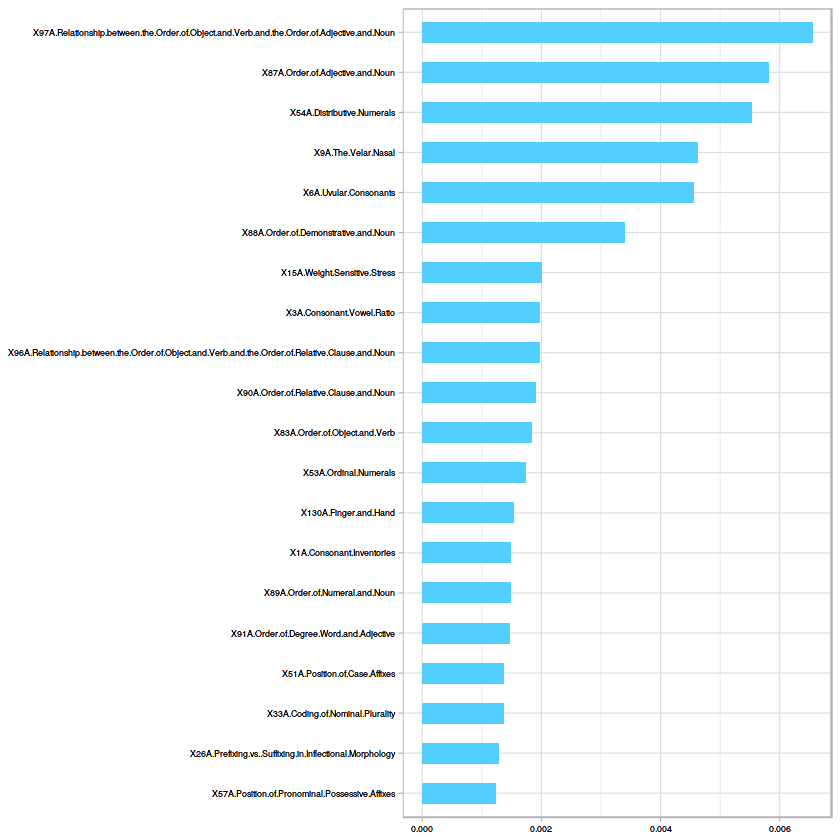

In [178]:
imp_bar(imp)

In [25]:
lst_ord<-c('X1A.Consonant.Inventories', 'X2A.Vowel.Quality.Inventories', 'X3A.Consonant.Vowel.Ratio',
           'X12A.Syllable.Structure','X13A.Tone', 'X22A.Inflectional.Synthesis.of.the.Verb','X30A.Number.of.Genders',
          'X41A.Distance.Contrasts.in.Demonstratives', 'X58B.Number.of.Possessive.Nouns', 'X132A.Number.of.Non.Derived.Basic.Colour.Categories',
           'X133A.Number.of.Basic.Colour.Categories')

l_df[lst_ord] <- lapply(l_df[lst_ord], ordered)

[1] "All vs Tropical"
[1] "All vs Arid"


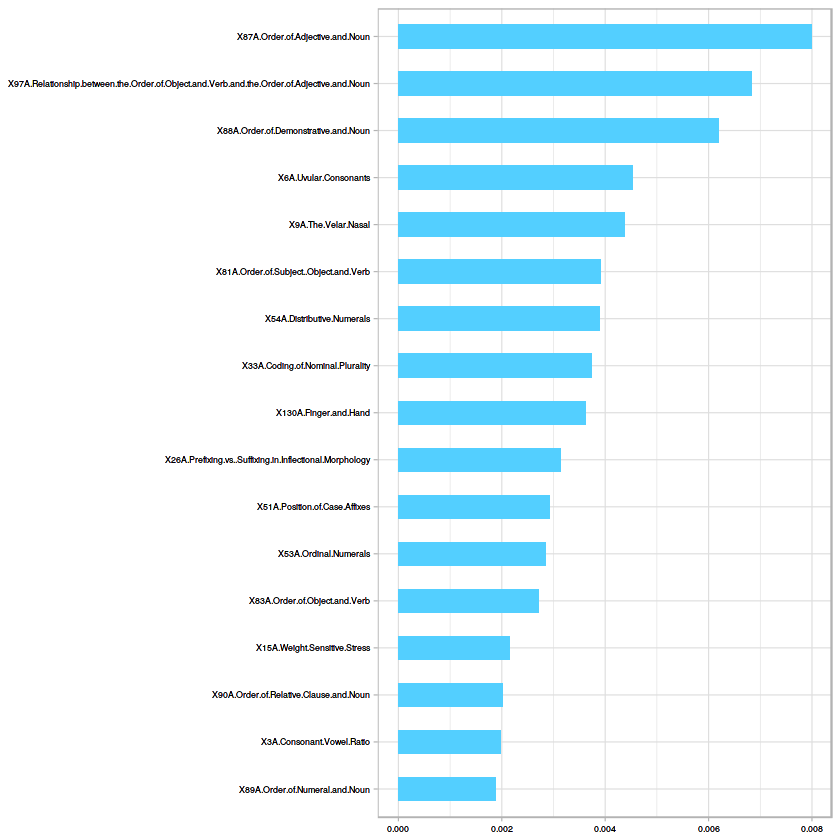

[1] "All vs Temperate"


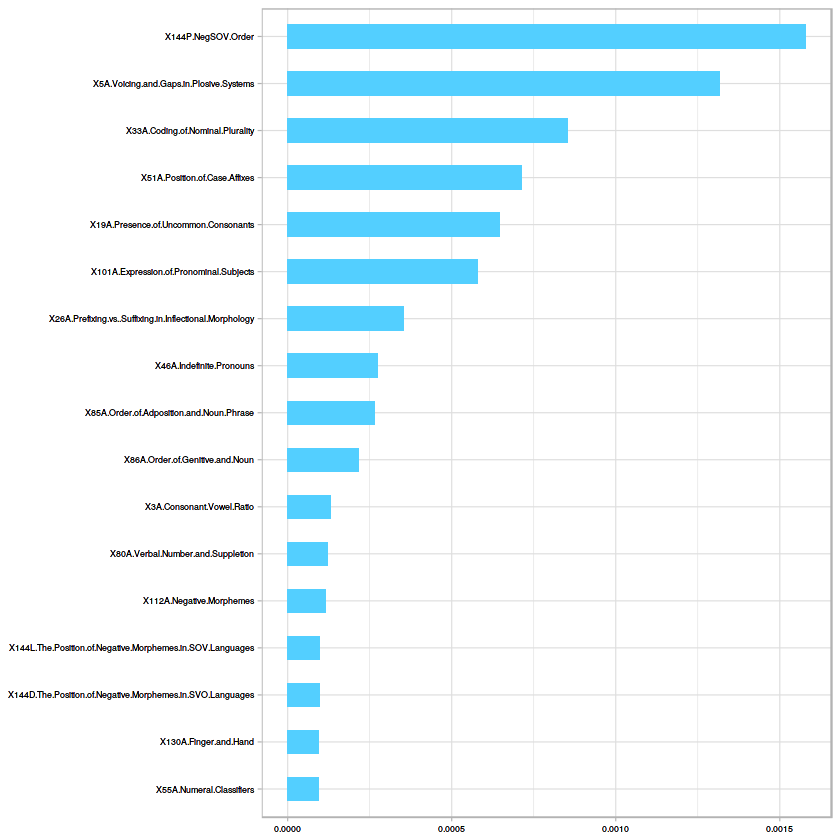

[1] "All vs Cold"


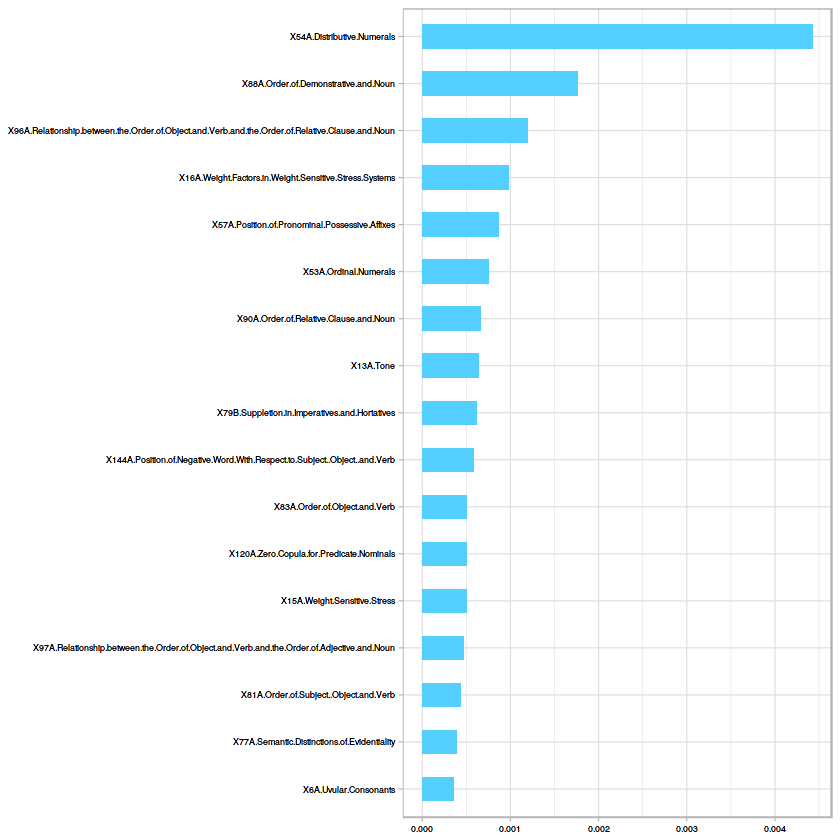

[1] "All vs Polar"


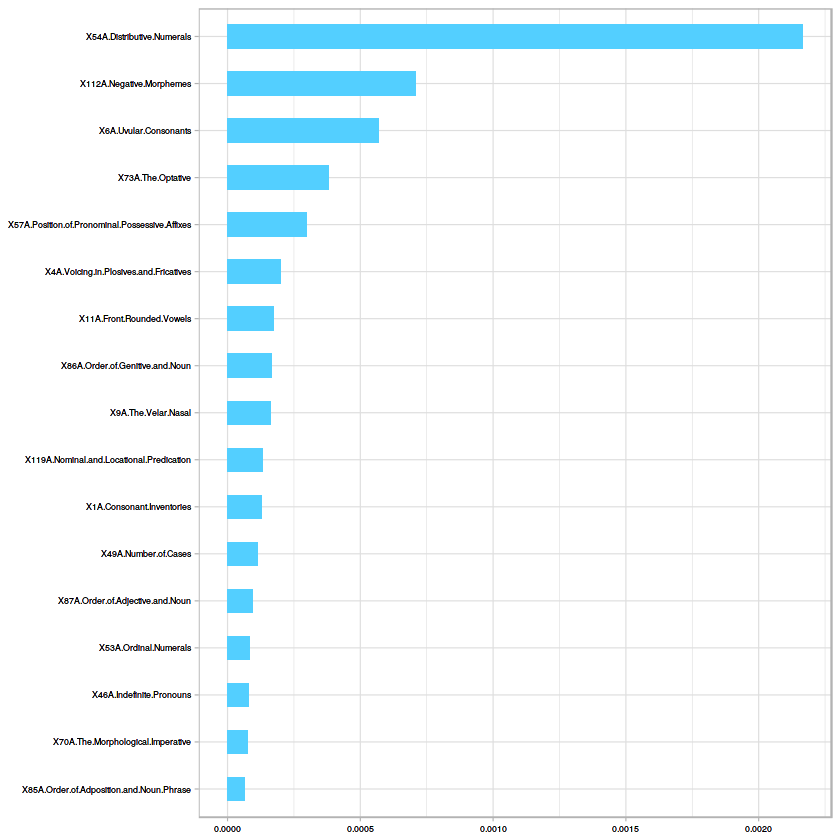

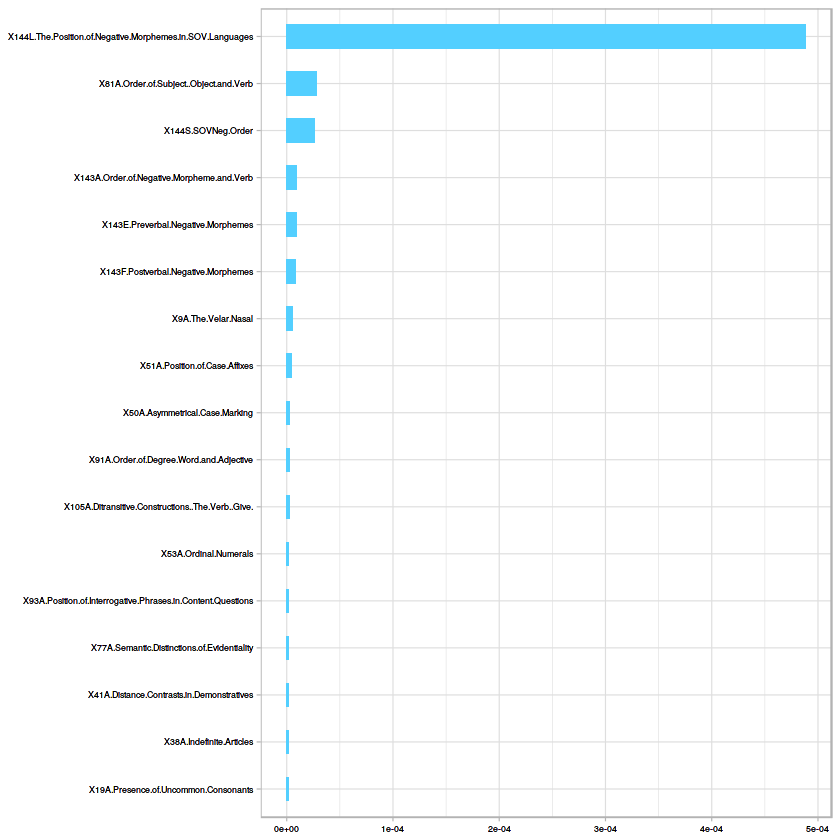

In [253]:
# All vs One - for complete dataset including NA's
Y<-l_df[,171]
X<-l_df[,-171]
impsave<-c(c(),c(),c(),c(),c())
t<-0

for (k in sub){
    t<-t+1
    T<-Y
    T<-ifelse(T !=k, 'X', k)
    #Baseline Classifier
    prob<-table(T)/length(T)
    c<-c(k,'X')
    clim<-c('Tropical','Arid', 'Temperate','Cold','Polar')
    names(clim)<-sub
    print(paste0("All vs ", clim[[(k)]]))
    #print(paste0("Dummy Classifier accuracy:"))
    #dummy_clas(c,T,prob)
    D<-X
    D["Climate"] <- as.factor(T)
    lang.crf<-cforest(Climate~., data = D, controls = cforest_unbiased(mtry=13, ntree=1500))
    pred
    imp <- varimp(lang.crf)
    imp<-sort(imp, decreasing = TRUE)
    imp<-imp[1:17]
    impsave[[t]]<-imp
    print(imp_bar(imp))
    
}

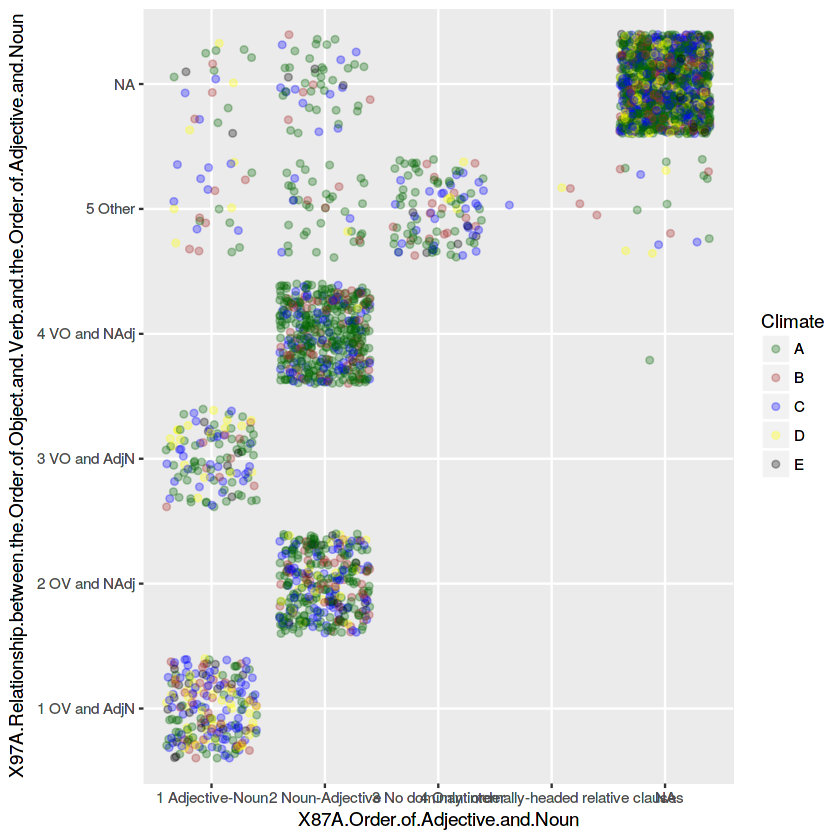

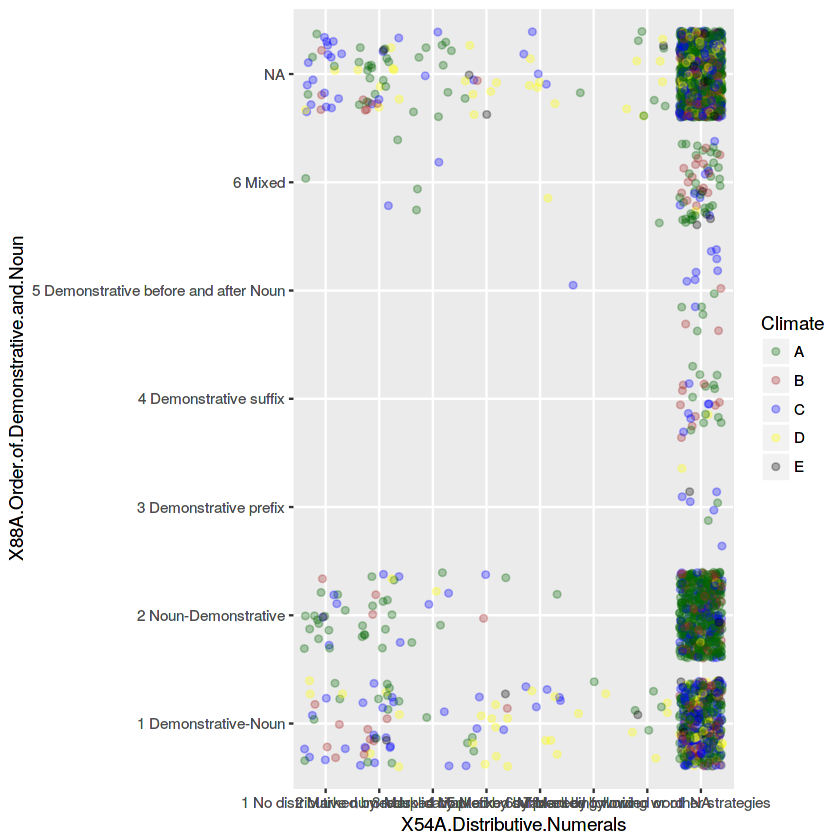

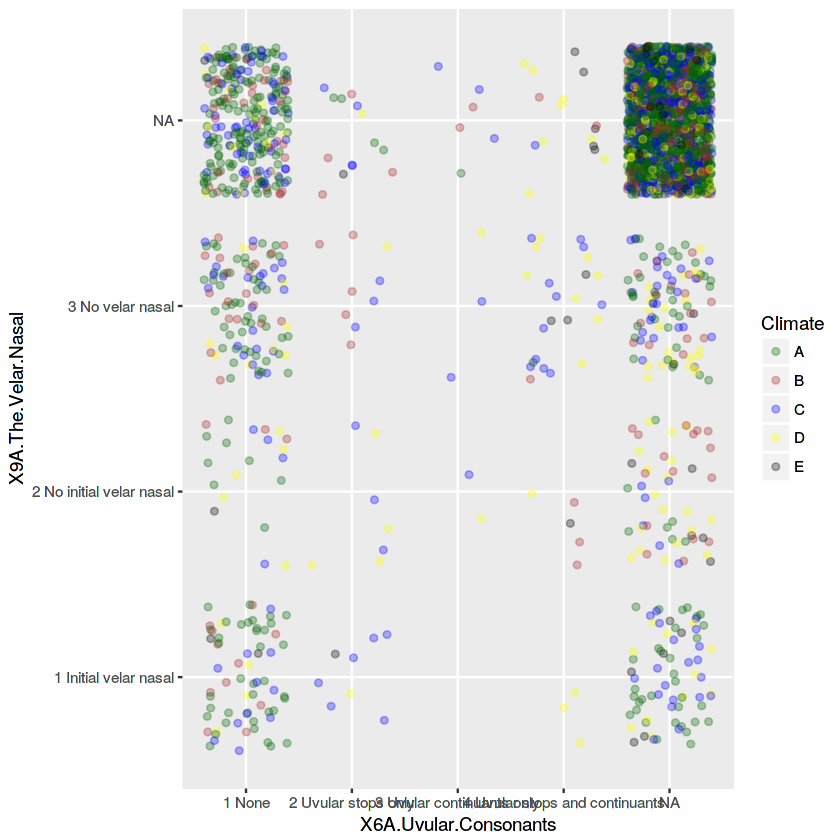

In [701]:
p = ggplot(l_df,aes(x=X87A.Order.of.Adjective.and.Noun,  
                    y=X97A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Adjective.and.Noun, 
                    color=Climate))

p + geom_jitter(alpha=0.3) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','brown', 'blue', 'yellow', 'black'))

p = ggplot(l_df,aes(x=X54A.Distributive.Numerals,  
                    y=X88A.Order.of.Demonstrative.and.Noun, 
                    color=Climate))

p + geom_jitter(alpha=0.3) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','brown', 'blue', 'yellow', 'black'))

p = ggplot(l_df,aes(x=X6A.Uvular.Consonants,  
                    y=X9A.The.Velar.Nasal, 
                    color=Climate))

p + geom_jitter(alpha=0.3) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','brown', 'blue', 'yellow', 'black'))

In [64]:
l_df<-l_df[!is.na(l_df$Climate),]
#l_df<-l_df[-2679,]

In [63]:
#l_df[2679,]
l_df[is.na(l_df$Climate),]

,X1A.Consonant.Inventories,X2A.Vowel.Quality.Inventories,X3A.Consonant.Vowel.Ratio,X4A.Voicing.in.Plosives.and.Fricatives,X5A.Voicing.and.Gaps.in.Plosive.Systems,X6A.Uvular.Consonants,X7A.Glottalized.Consonants,X8A.Lateral.Consonants,X9A.The.Velar.Nasal,X10A.Vowel.Nasalization,⋯,X137B.M.in.Second.Person.Singular,X136B.M.in.First.Person.Singular,X109B.Other.Roles.of.Applied.Objects,X25B.Zero.Marking.of.A.and.P.Arguments,X21B.Exponence.of.Tense.Aspect.Mood.Inflection,X108B.Productivity.of.the.Antipassive.Construction,X58B.Number.of.Possessive.Nouns,X79B.Suppletion.in.Imperatives.and.Hortatives,Climate,random
941,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,,NA,NA,NA,NA,NA,NA,NA,NA,NA,3


In [130]:
pre_lang_df<-pre_lang_df[,11:29]

In [ ]:
with(pre_lang_df,ifelse(is.na(A),B,A))

[1] "Arabic (Egyptian)"       "Amele"                  
 [3] "Apurin??"                "Asmat"                  
 [5] "Burushaski"              "Cahuilla"               
 [7] "Chamorro"                "Comanche"               
 [9] "Coos (Hanis)"            "Cree (Plains)"          
[11] "Cayuvava"                "Drehu"                  
[13] "English"                 "Evenki"                 
[15] "Fijian"                  "Finnish"                
[17] "French"                  "Georgian"               
[19] "German"                  "Gooniyandi"             
[21] "Grebo"                   "Greek (Modern)"         
[23] "Greenlandic (West)"      "Hixkaryana"             
[25] "Hungarian"               "Indonesian"             
[27] "Iraqw"                   "Kayardild"              
[29] "Koromfe"                 "Khmer"                  
[31] "Kunama"                  "Kobon"                  
[33] "Krongo"                  "Kutenai"                
[35] "Latvian"                 "Lavukaleve"             
[37] "Malagasy"                "Mapudungun"             
[39] "Maricopa"                "Maung"                  
[41] "Maybrat"                 "Martuthunira"           
[43] "Miwok (Southern Sierra)" "Mangarrayi"             
[45] "Nenets"                  "Nunggubuyu"             
[47] "Paiwan"                  "Passamaquoddy-Maliseet" 
[49] "Rama"                    "Rapanui"                
[51] "Russian"                 "Slave"                  
[53] "Semelai"                 "Sanuma"                 
[55] "Spanish"                 "Squamish"               
[57] "Taba"                    "Tagalog"                
[59] "Tiwi"                    "Tukang Besi"            
[61] "Turkish"                 "Ungarinjin"             
[63] "Urub??-Kaapor"           "Wambaya"                
[65] "Wari'"                   "Wich?_"                 
[67] "Warao"                   "Wardaman"               
[69] "Yaqui"                   "Yidiny"                 
[71] "Yimas"

[1] Afro-Asiatic         Trans-New Guinea     Arawakan            
 [4] Trans-New Guinea     Burushaski           Uto-Aztecan         
 [7] Austronesian         Uto-Aztecan          Oregon Coast        
[10] Algic                Cayuvava             Austronesian        
[13] Indo-European        Altaic               Austronesian        
[16] Uralic               Indo-European        Kartvelian          
[19] Indo-European        Bunuban              Niger-Congo         
[22] Indo-European        Eskimo-Aleut         Cariban             
[25] Uralic               Austronesian         Afro-Asiatic        
[28] Tangkic              Niger-Congo          Austro-Asiatic      
[31] Kunama               Trans-New Guinea     Kadu                
[34] Kutenai              Indo-European        Solomons East Papuan
[37] Austronesian         Araucanian           Hokan               
[40] Iwaidjan             West Papuan          Pama-Nyungan        
[43] Penutian             Mangarrayi-Maran     Uralic              
[46] Gunwinyguan          Austronesian         Algic               
[49] Chibchan             Austronesian         Indo-European       
[52] Na-Dene              Austro-Asiatic       Yanomam             
[55] Indo-European        Salishan             Austronesian        
[58] Austronesian         Tiwian               Austronesian        
[61] Altaic               Worrorran            Tupian              
[64] Mirndi               Chapacura-Wanham     Matacoan            
[67] Warao                Yangmanic            Uto-Aztecan         
[70] Pama-Nyungan         Lower Sepik-Ramu    
44 Levels: Afro-Asiatic Algic Altaic Araucanian Arawakan ... Yanomam


        Afro-Asiatic                Algic               Altaic 
                   2                    2                    2 
          Araucanian             Arawakan       Austro-Asiatic 
                   1                    1                    2 
        Austronesian              Bunuban           Burushaski 
                  10                    1                    1 
             Cariban             Cayuvava     Chapacura-Wanham 
                   1                    1                    1 
            Chibchan         Eskimo-Aleut          Gunwinyguan 
                   1                    1                    1 
               Hokan        Indo-European             Iwaidjan 
                   1                    7                    1 
                Kadu           Kartvelian               Kunama 
                   1                    1                    1 
             Kutenai     Lower Sepik-Ramu     Mangarrayi-Maran 
                   1                   

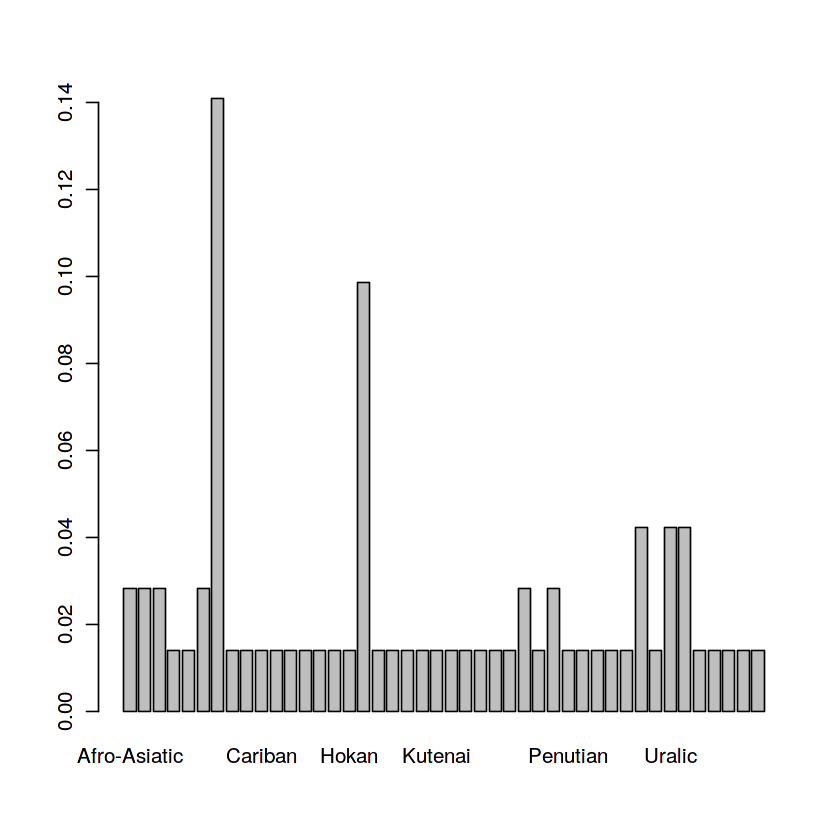

In [26]:
#Phonology features 1A-19A with more than 400 cases - gives 72 cases
s<-c(1,3,6:24,176,177)
phon_df<-na.omit(lang_df[,s])
phon_df[,2]<-as.factor(as.character(phon_df[,2]))
phon_df[,1]
phon_df[,2]
table(phon_df[,2])
barplot(prop.table(table(phon_df[,2])))
phon_df<-phon_df[,-c(1,2)]

phon_df[sapply(phon_df, is.character)] <- lapply(phon_df[sapply(phon_df, is.character)], as.factor)
ord<-c(1,2,3,12,13)
phon_df[,ord]<-lapply(phon_df[,ord],ordered)

In [27]:
phon_df

,X1A.Consonant.Inventories,X2A.Vowel.Quality.Inventories,X3A.Consonant.Vowel.Ratio,X4A.Voicing.in.Plosives.and.Fricatives,X5A.Voicing.and.Gaps.in.Plosive.Systems,X6A.Uvular.Consonants,X7A.Glottalized.Consonants,X8A.Lateral.Consonants,X9A.The.Velar.Nasal,X10A.Vowel.Nasalization,⋯,X12A.Syllable.Structure,X13A.Tone,X14A.Fixed.Stress.Locations,X15A.Weight.Sensitive.Stress,X16A.Weight.Factors.in.Weight.Sensitive.Stress.Systems,X17A.Rhythm.Types,X18A.Absence.of.Common.Consonants,X19A.Presence.of.Uncommon.Consonants,Climate,random
35,4 Moderately large,2 Average (5-6),4 Moderately high,4 In both plosives and fricatives,3 Missing /p/,4 Uvular stops and continuants,1 No glottalized consonants,"2 /l/, no obstruent laterals",3 No velar nasal,2 Contrast absent,,3 Complex,1 No tones,1 No fixed stress,4 Right-oriented: One of the last three,7 Combined,1 Trochaic,1 All present,4 Pharyngeals,B,3
90,2 Moderately small,2 Average (5-6),3 Average,2 In plosives alone,3 Missing /p/,1 None,1 No glottalized consonants,"2 /l/, no obstruent laterals",3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,1 No fixed stress,5 Unbounded: Stress can be anywhere,3 Coda consonant,5 No rhythmic stress,1 All present,3 Labial-velars,A,4
129,1 Small,2 Average (5-6),3 Average,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,1 Contrast present,,1 Simple,1 No tones,1 No fixed stress,3 Right-edge: Ultimate or penultimate,2 Long vowel,1 Trochaic,1 All present,1 None,A,4
154,1 Small,2 Average (5-6),1 Low,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,7 Ultimate,8 Fixed stress (no weight-sensitivity),6 Lexical stress,2 Iambic,1 All present,1 None,A,2
389,5 Large,2 Average (5-6),5 High,4 In both plosives and fricatives,2 None missing in /p t k b d g/,4 Uvular stops and continuants,1 No glottalized consonants,"2 /l/, no obstruent laterals",2 No initial velar nasal,1 Contrast present,,3 Complex,1 No tones,1 No fixed stress,7 Not predictable,6 Lexical stress,1 Trochaic,1 All present,1 None,B,3
406,3 Average,1 Small (2-4),4 Moderately high,1 No voicing contrast,1 Other,4 Uvular stops and continuants,1 No glottalized consonants,"2 /l/, no obstruent laterals",2 No initial velar nasal,2 Contrast absent,,3 Complex,1 No tones,2 Initial,8 Fixed stress (no weight-sensitivity),7 Combined,1 Trochaic,1 All present,1 None,B,1
432,3 Average,2 Average (5-6),3 Average,2 In plosives alone,2 None missing in /p t k b d g/,1 None,1 No glottalized consonants,"2 /l/, no obstruent laterals",1 Initial velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,1 No fixed stress,4 Right-oriented: One of the last three,3 Coda consonant,4 Undetermined,1 All present,1 None,A,1
477,1 Small,2 Average (5-6),1 Low,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,2 Initial,8 Fixed stress (no weight-sensitivity),1 No weight,1 Trochaic,1 All present,1 None,B,3
492,5 Large,2 Average (5-6),5 High,2 In plosives alone,2 None missing in /p t k b d g/,4 Uvular stops and continuants,2 Ejectives only,4 /l/ and lateral obstruent,3 No velar nasal,2 Contrast absent,,3 Complex,1 No tones,1 No fixed stress,3 Right-edge: Ultimate or penultimate,1 No weight,5 No rhythmic stress,1 All present,1 None,C,1
502,1 Small,1 Small (2-4),2 Moderately low,1 No voicing contrast,1 Other,1 None,1 No glottalized consonants,1 No laterals,3 No velar nasal,2 Contrast absent,,2 Moderately complex,1 No tones,5 Antepenultimate,8 Fixed stress (no weight-sensitivity),1 No weight,1 Trochaic,1 All present,1 None,D,3


[1] 0.2982183
[1] "C-V accuracy for Random Forest is  0.467431318681319"
[1] "0.467431318681319"
[1] "RF Confusion Matrix:"
   
     A  B  C  D  E
  A 30 10  4  6  2
  B  0  0  0  0  0
  C  2  4 11  2  0
  D  0  0  0  0  0
  E  0  0  0  0  0


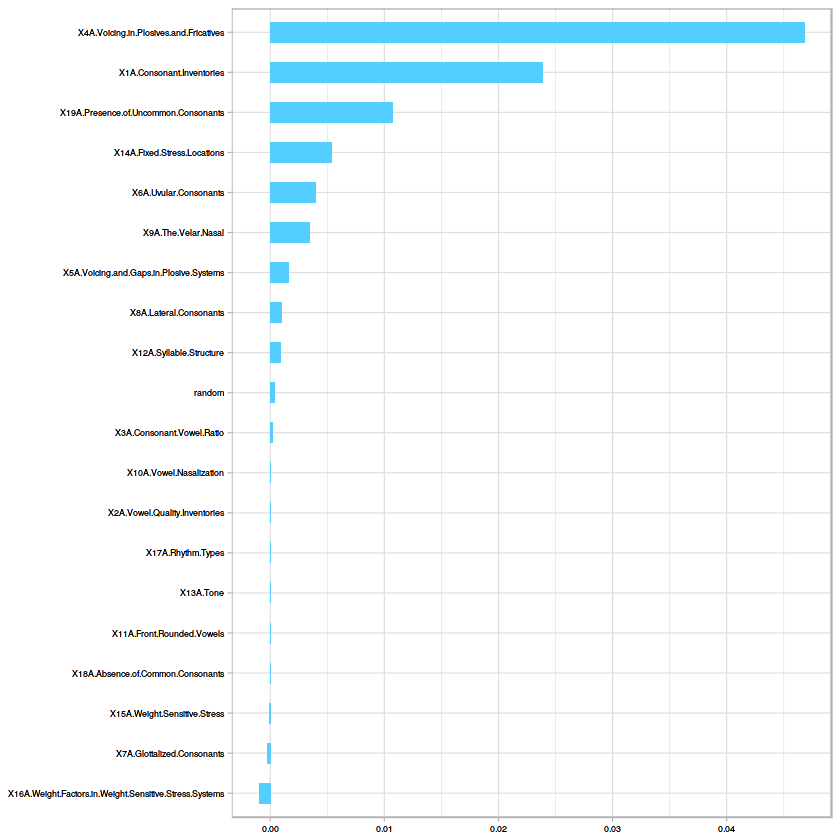

[1] "Accuracy for SVM:50.7042253521127"
   
     A  B  C  D  E
  A 32  4  3  3  1
  B  0 10  0  1  1
  C  0  0 12  3  0
  D  0  0  0  1  0
  E  0  0  0  0  0


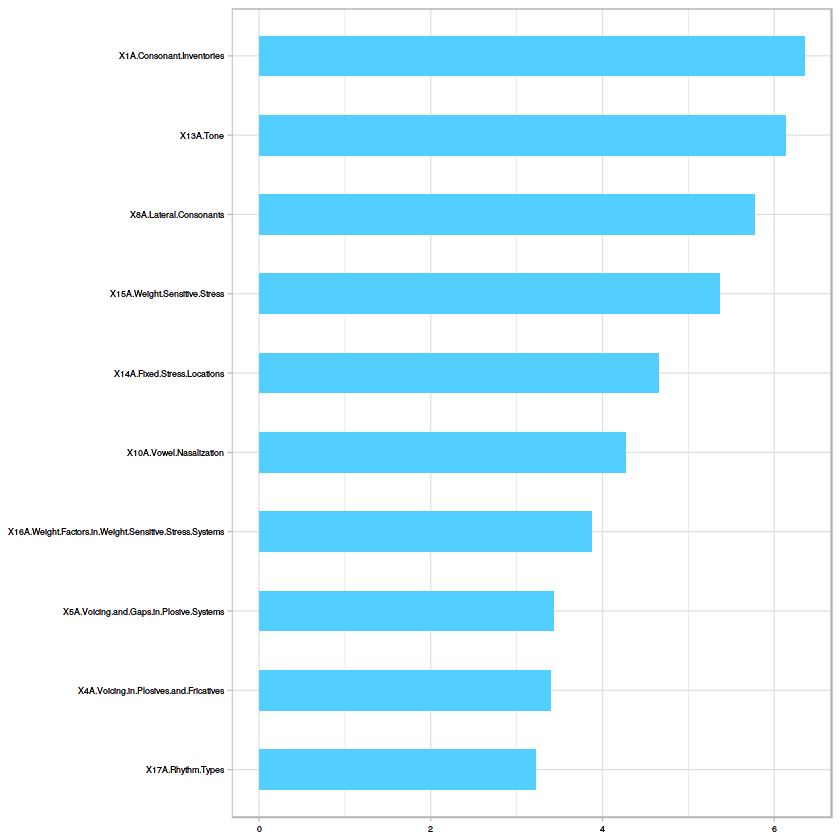

In [39]:
#Multi-class RF - Phonology
p<-dist(phon_df)
dummy_clas(class,phon_df$Climate,p)
cvrf(phon_df)
svmc(phon_df)

In [30]:
dist(phon_df)

character(0)

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5052535
[1] "C-V accuracy for Random Forest is  0.697179487179487"
   
     A  X
  A 26  8
  X  6 31


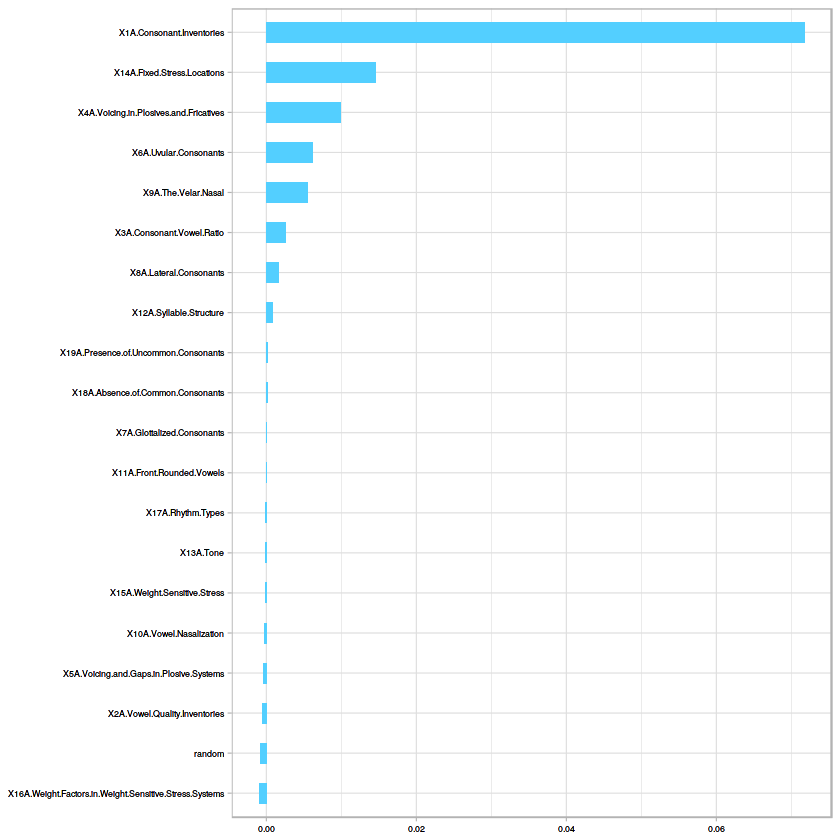

[1] "Accuracy for SVM:66.7605633802817"
   
     A  X
  A 30  0
  X  2 39
   
     A  X
  A 30  0
  X  2 39
[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.684
[1] "C-V accuracy for Random Forest is  0.799615384615385"
   
     B  X
  B  0  0
  X 14 57


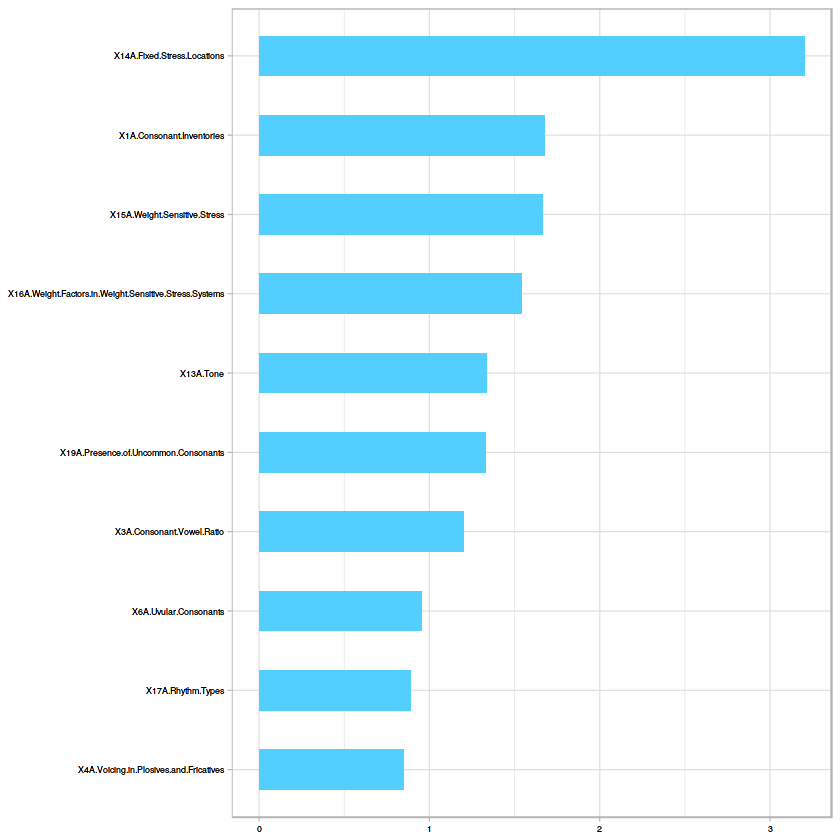

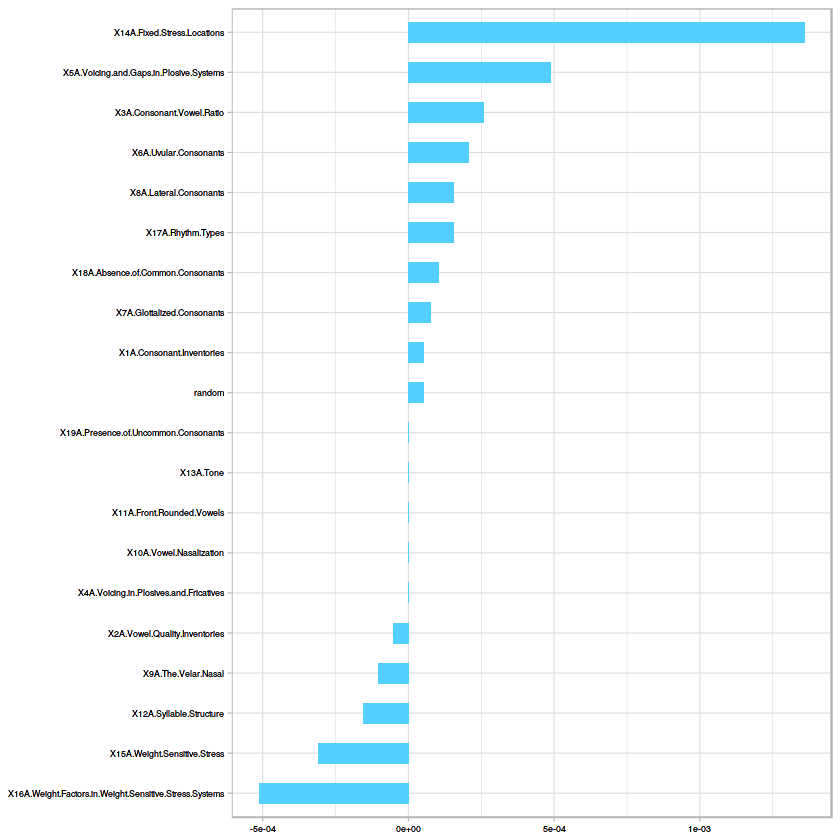

[1] "Accuracy for SVM:78.0281690140845"
   
     B  X
  B  4  0
  X 10 57
   
     B  X
  B  4  0
  X 10 57
[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.6685282
[1] "C-V accuracy for Random Forest is  0.756666666666667"
   
     C  X
  C  0  0
  X 15 56


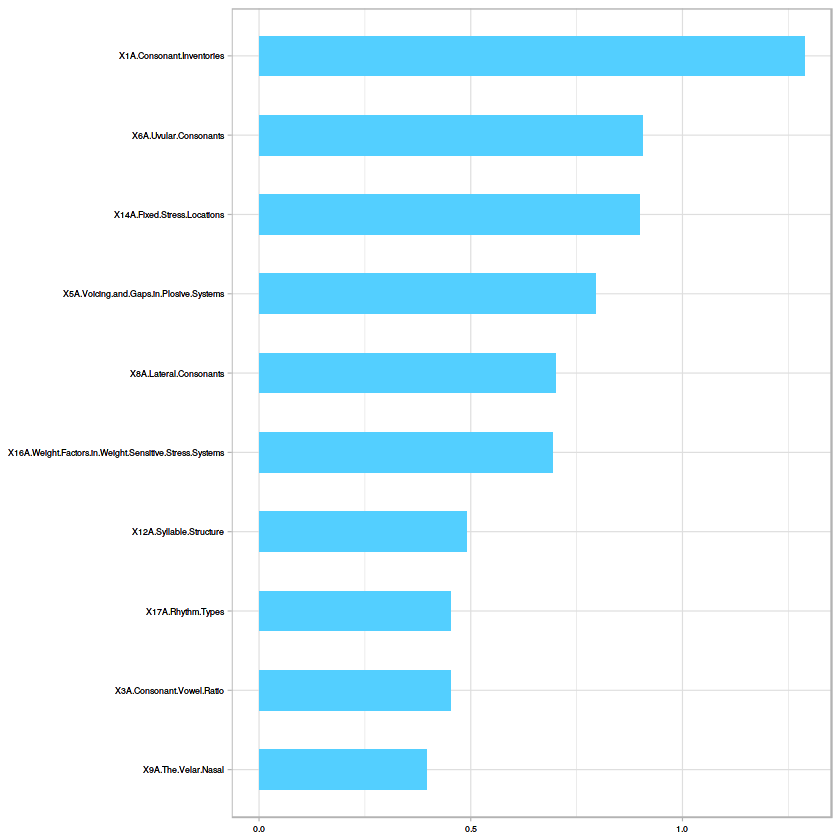

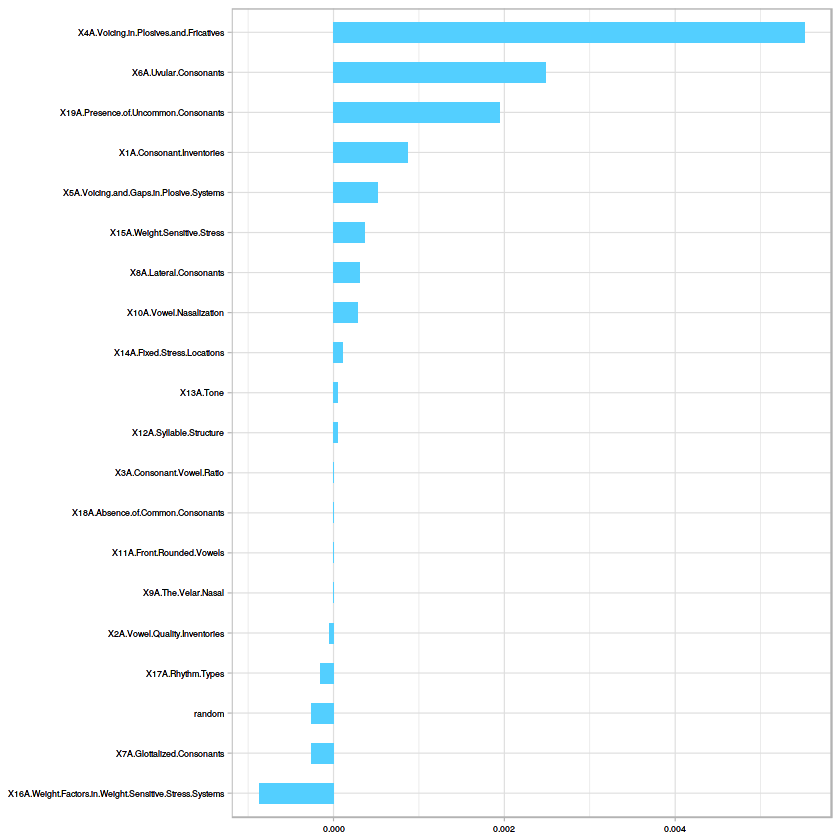

[1] "Accuracy for SVM:79.4366197183099"
   
     C  X
  C  8  0
  X  7 56
   
     C  X
  C  8  0
  X  7 56
[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.7996479
[1] "C-V accuracy for Random Forest is  "
   
     D  X
  D  0  0
  X  8 63


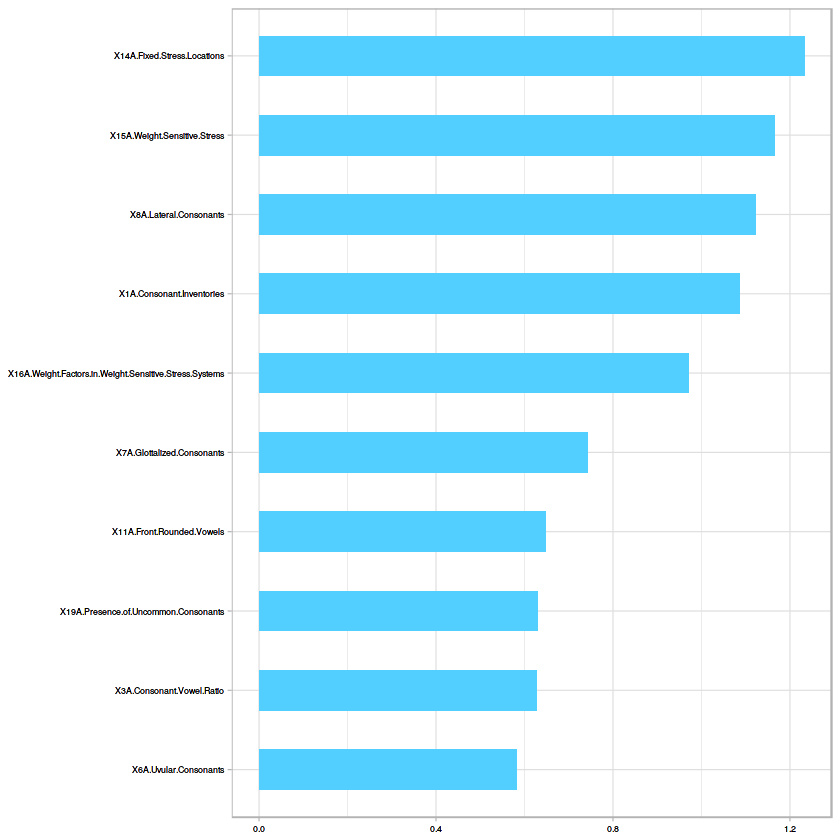

[1] "Accuracy for SVM:88.7323943661972"
   
     D  X
  D  1  0
  X  7 63
   
     D  X
  D  1  0
  X  7 63
[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9456549


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

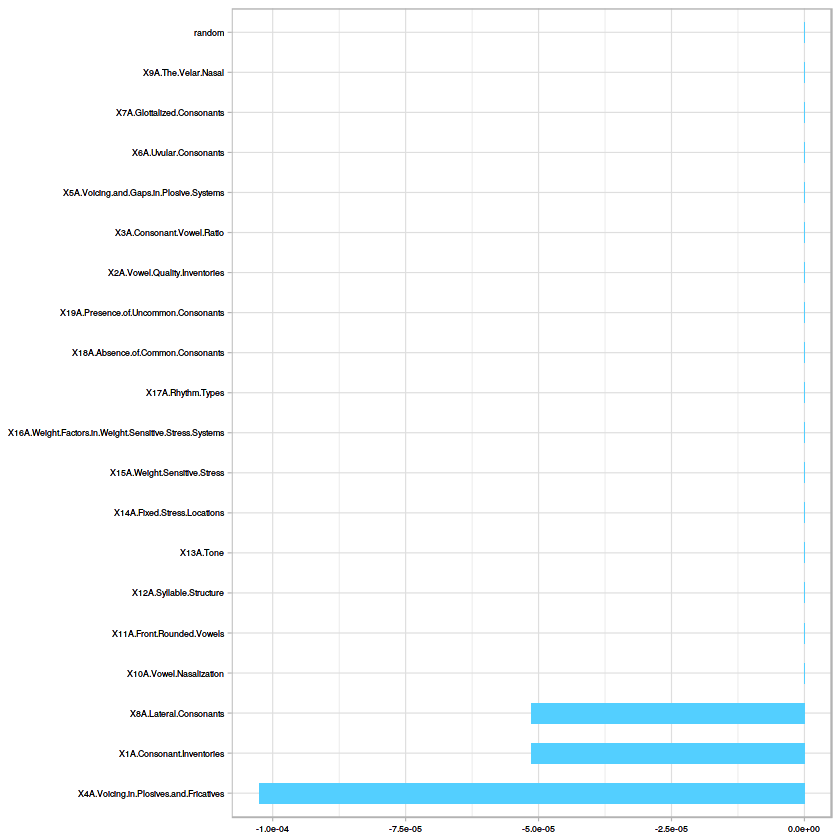

[1] "C-V accuracy for Random Forest is  "
   
     E  X
  E  0  0
  X  2 69


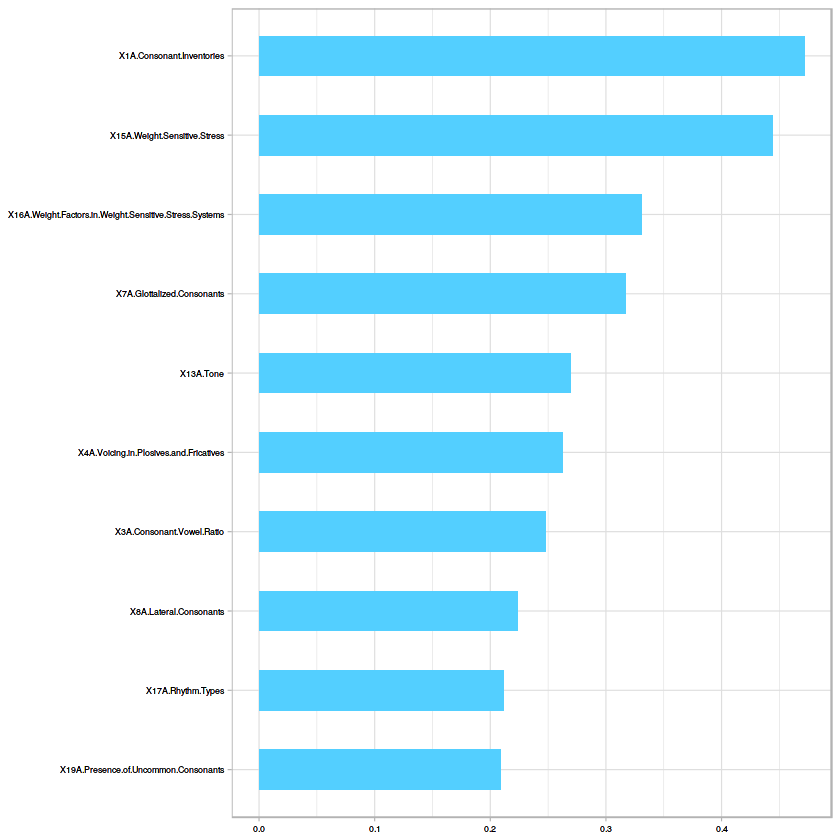

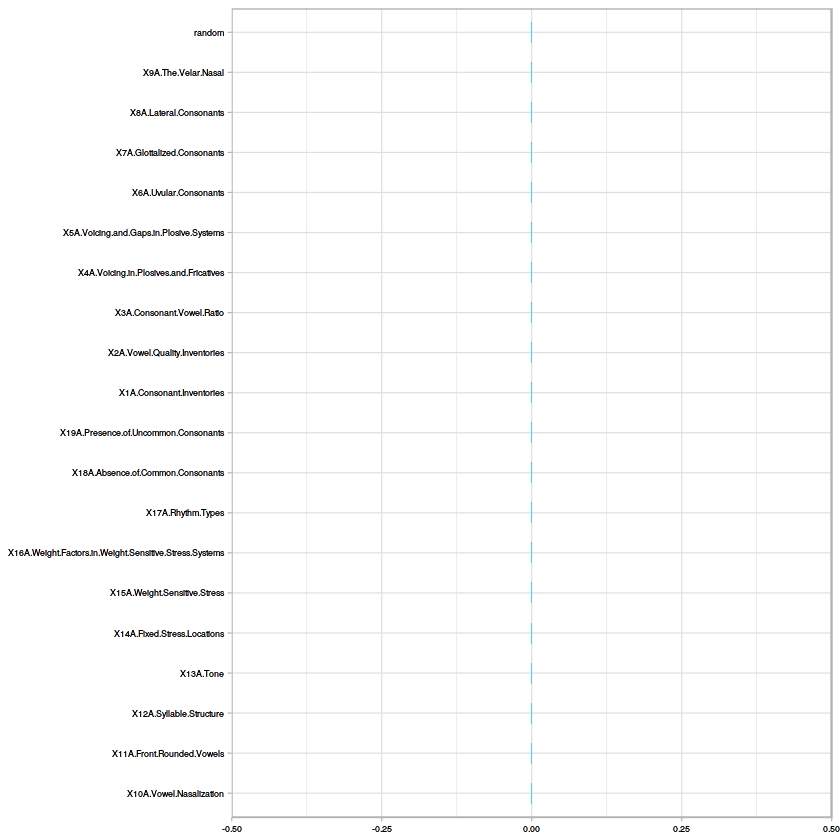

[1] "Accuracy for SVM:97.1830985915493"
   
     E  X
  E  0  0
  X  2 69
   
     E  X
  E  0  0
  X  2 69


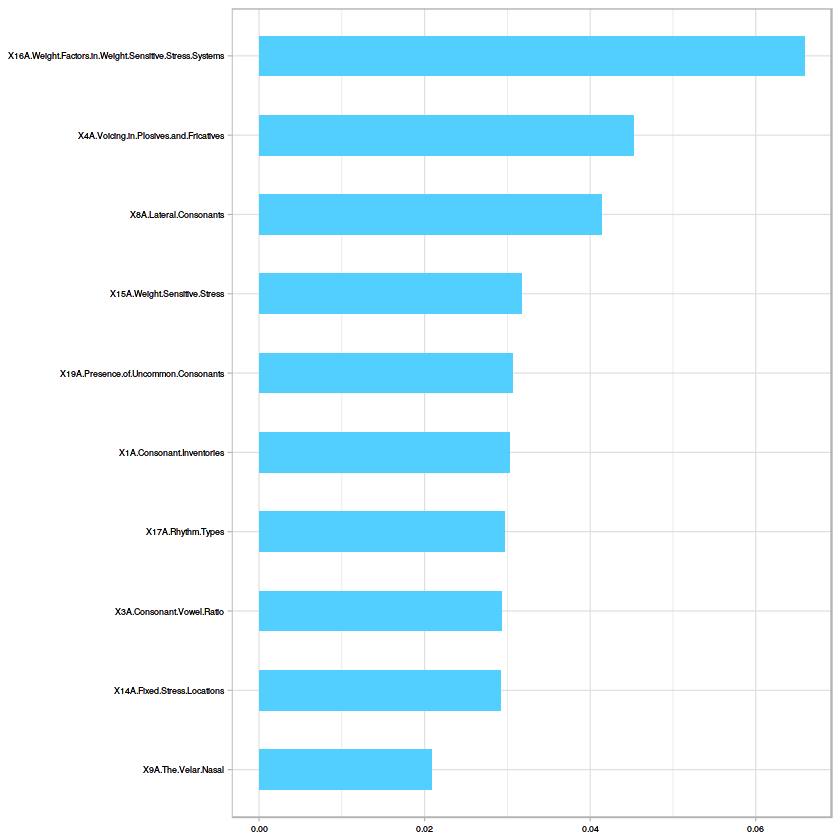

In [59]:
#Phonology - One vs All
ovsa(phon_df)

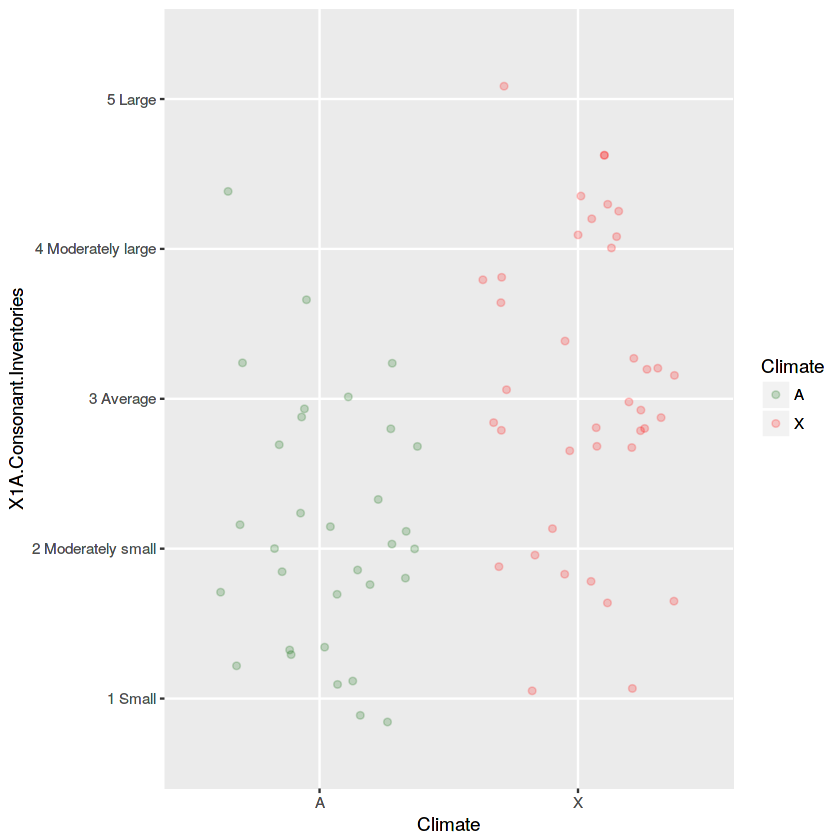

In [211]:
p = ggplot(pdf,aes(x=Climate,  
                    y=X1A.Consonant.Inventories, 
                    color = Climate))

p + geom_jitter(alpha=0.2) +  
  scale_color_manual(breaks = c('A','X'),
                     values=c('darkgreen','red'))

[1] "A" "B"
[1] 0.5784891
[1] "Dummy Classifier accuracy:0.578489130434783"
[1] "C-V accuracy for Random Forest is  0.686111111111111"
   
     A  B
  A 32 11
  B  0  3


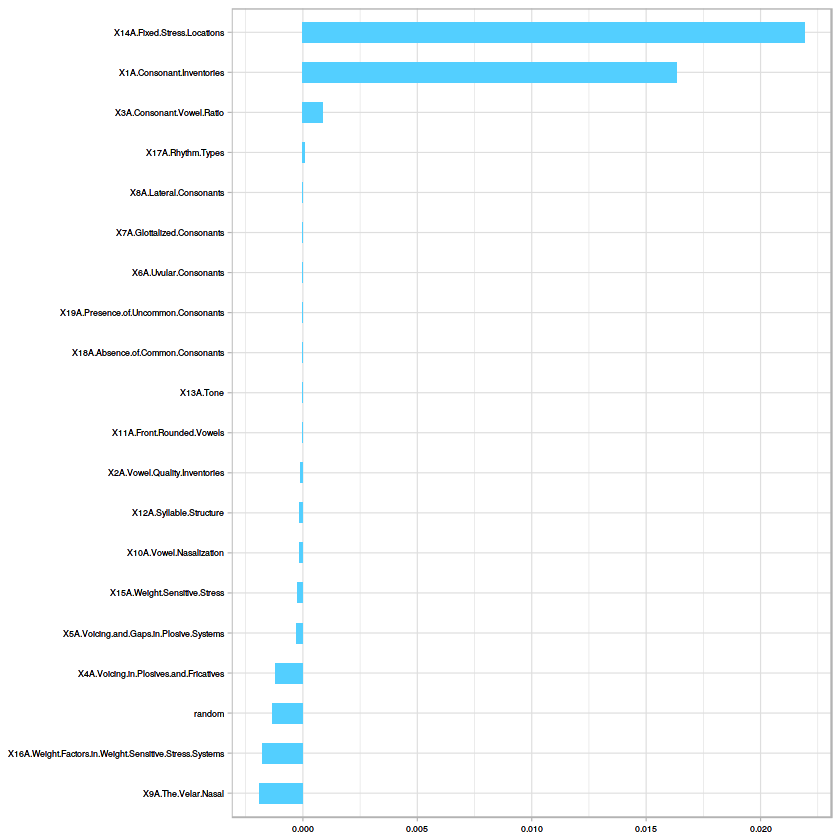

[1] "Accuracy for SVM:79.5652173913043"
   
     A  B
  A 32  1
  B  0 13
   
     A  B
  A 32  1
  B  0 13
[1] "A" "C"
[1] 0.5657234
[1] "Dummy Classifier accuracy:0.565723404255319"
[1] "C-V accuracy for Random Forest is  "
   
     A  C
  A 30  4
  C  2 11


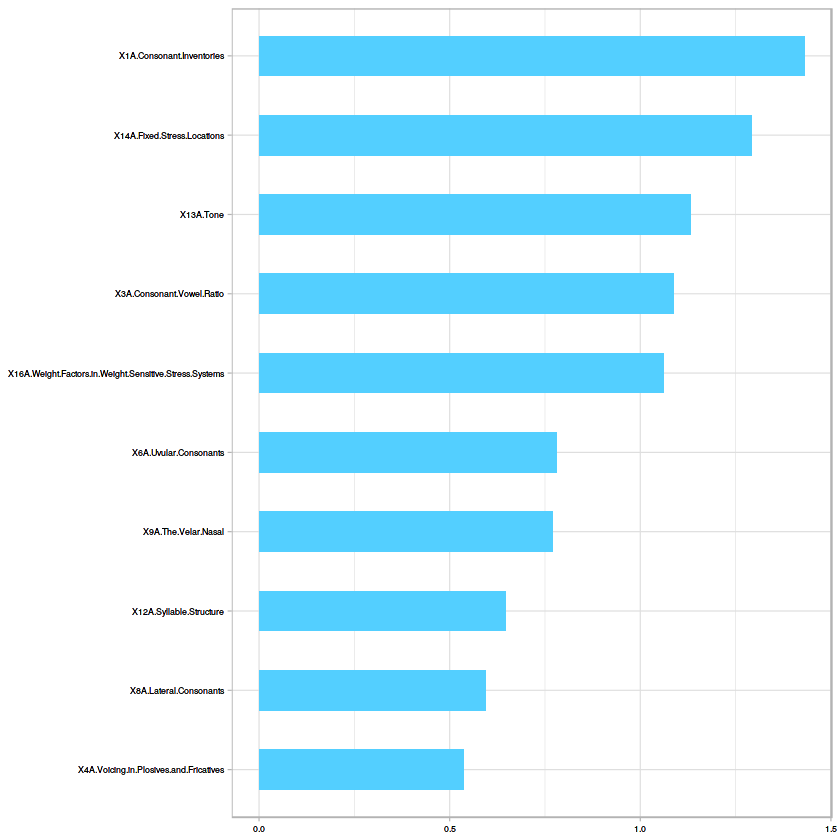

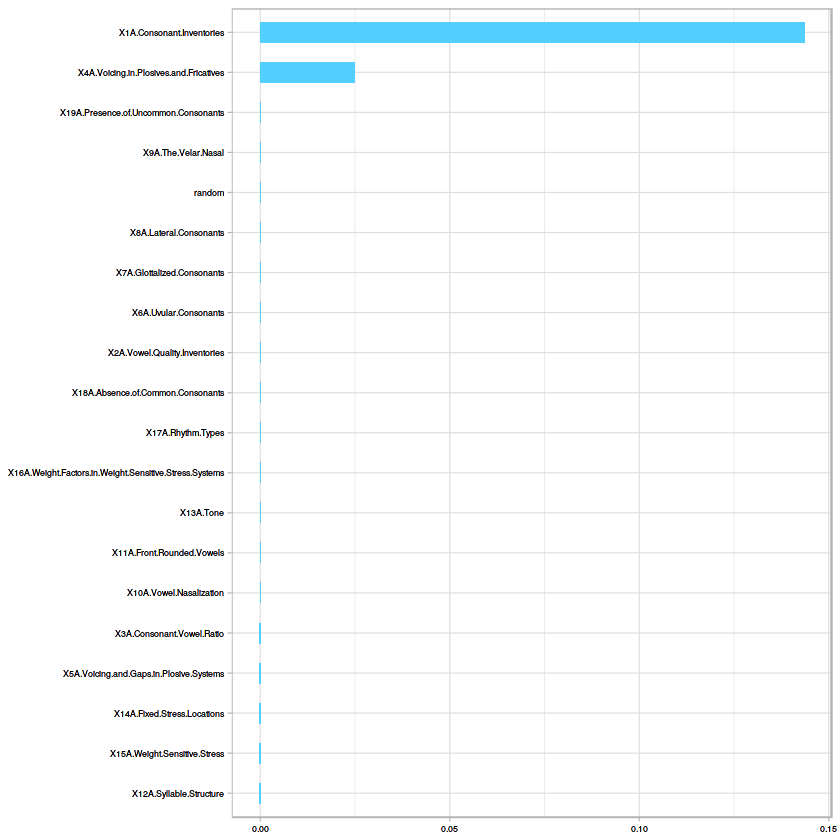

[1] "Accuracy for SVM:77.0212765957447"
   
     A  C
  A 32  1
  C  0 14
   
     A  C
  A 32  1
  C  0 14
[1] "A" "D"
[1] 0.680525
[1] "Dummy Classifier accuracy:0.680525"
[1] "C-V accuracy for Random Forest is  "
   
     A  D
  A 32  8
  D  0  0


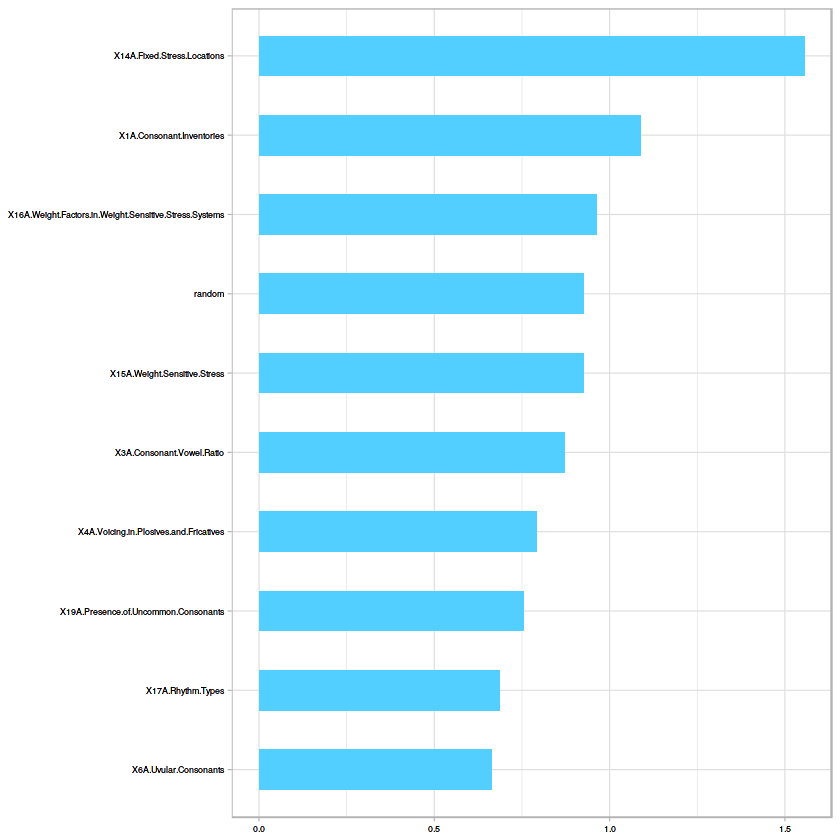

[1] "Accuracy for SVM:87.5"
   
     A  D
  A 32  3
  D  0  5
   
     A  D
  A 32  3
  D  0  5
[1] "A" "E"
[1] 0.8899265
[1] "Dummy Classifier accuracy:0.889926470588235"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

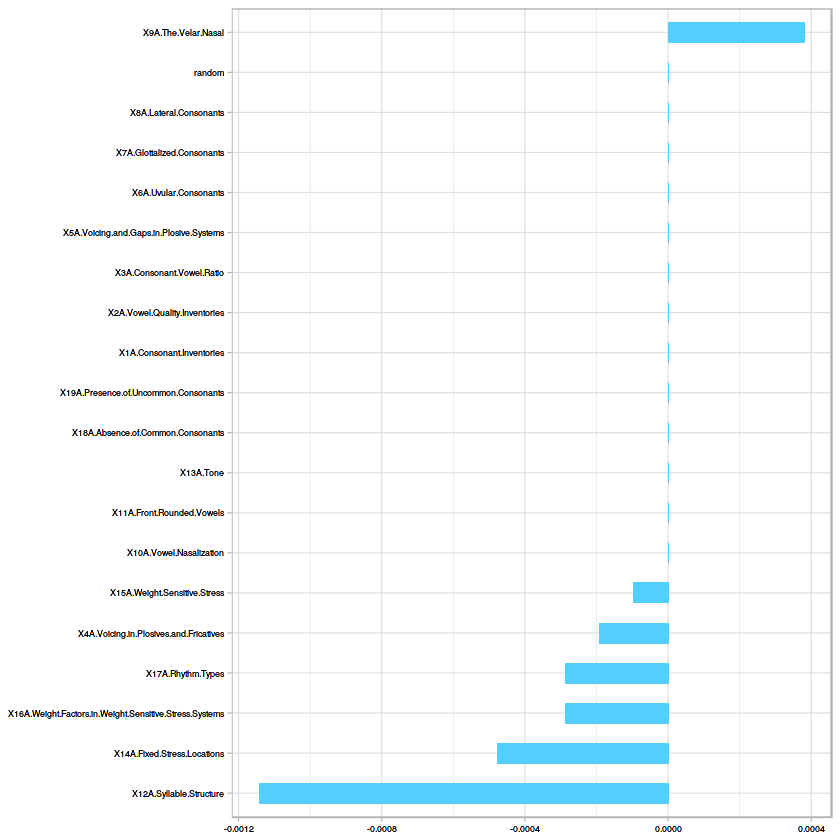

[1] "C-V accuracy for Random Forest is  "
   
     A  E
  A 32  2
  E  0  0


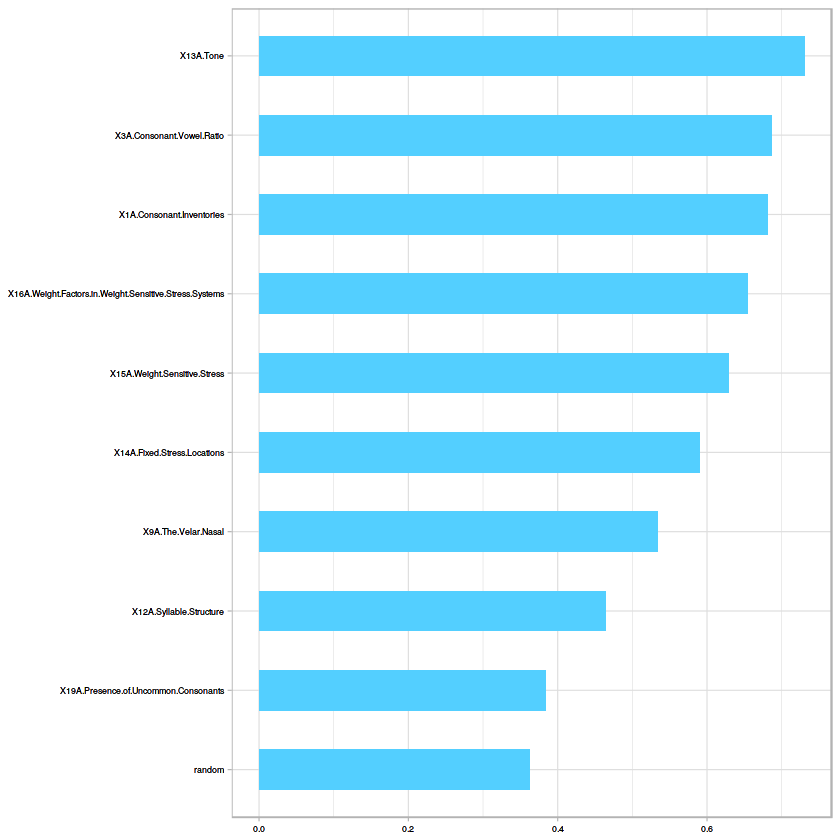

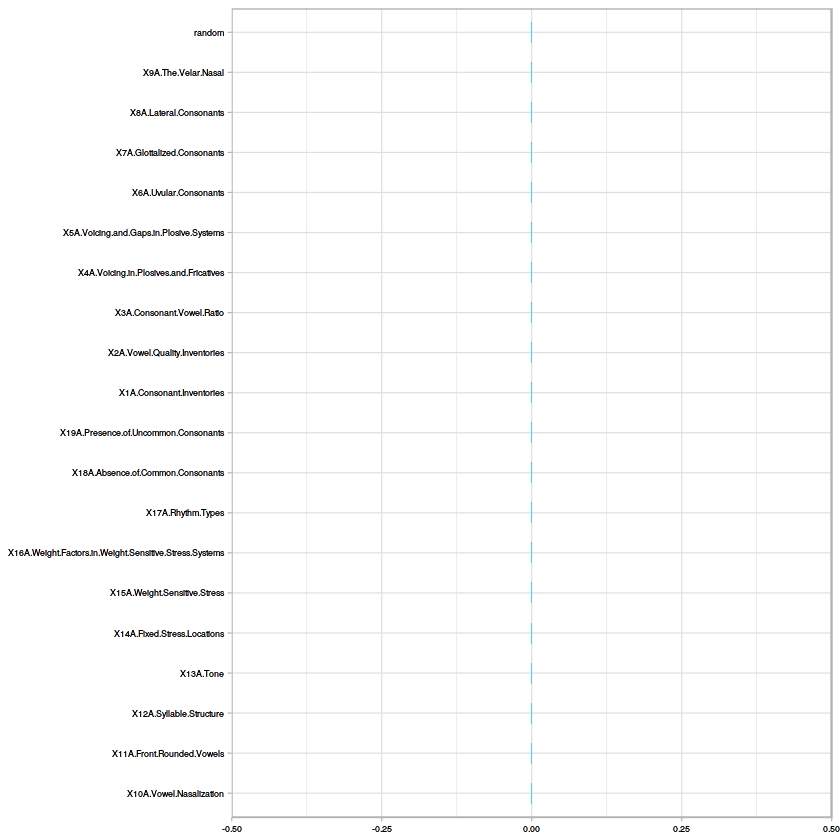

[1] "Accuracy for SVM:94.1176470588235"
   
     A  E
  A 32  2
  E  0  0
   
     A  E
  A 32  2
  E  0  0
[1] "B" "C"
[1] 0.5007931
[1] "Dummy Classifier accuracy:0.500793103448276"
[1] "C-V accuracy for Random Forest is  0.626666666666667"
   
     B  C
  B  0  0
  C 14 15


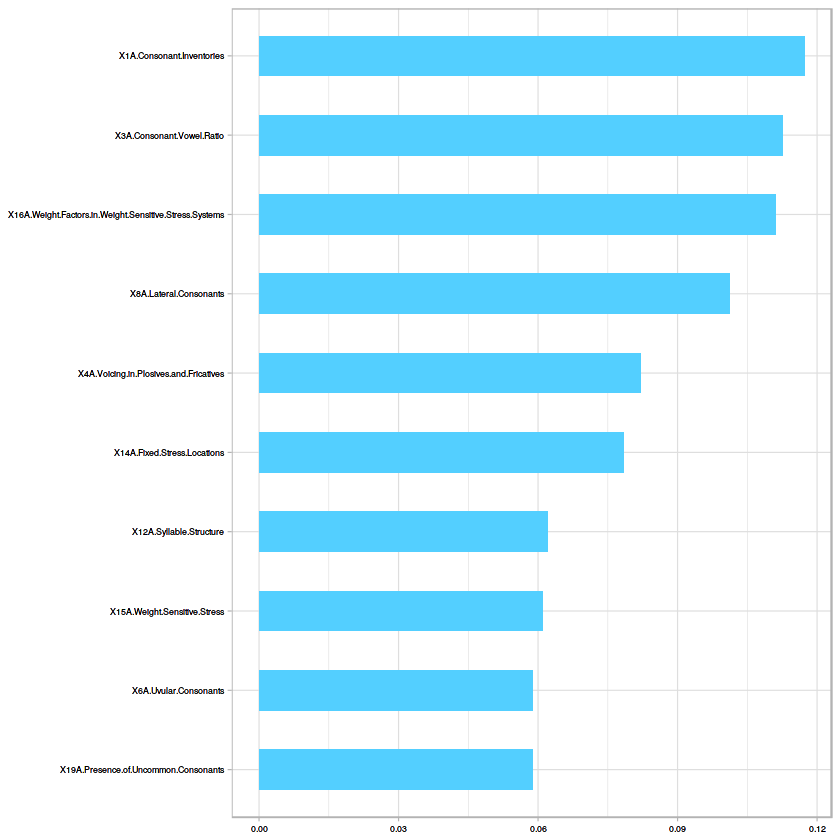

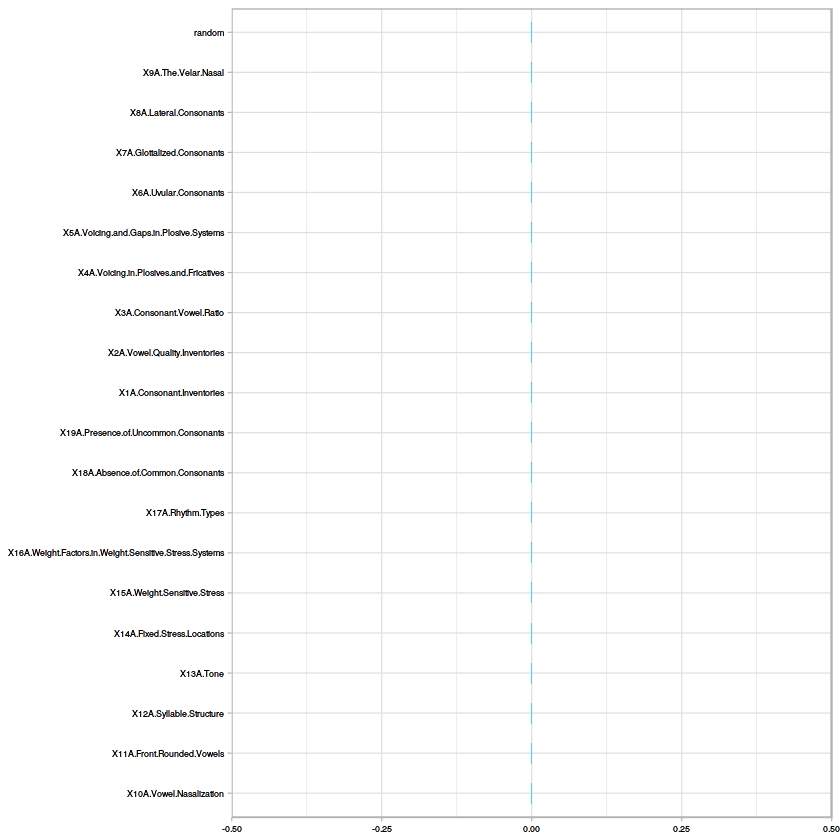

[1] "Accuracy for SVM:57.2413793103448"
   
     B  C
  B 14  0
  C  0 15
   
     B  C
  B 14  0
  C  0 15
[1] "B" "D"
[1] 0.5416364
[1] "Dummy Classifier accuracy:0.541636363636364"
[1] "C-V accuracy for Random Forest is  "
   
     B  D
  B 14  8
  D  0  0


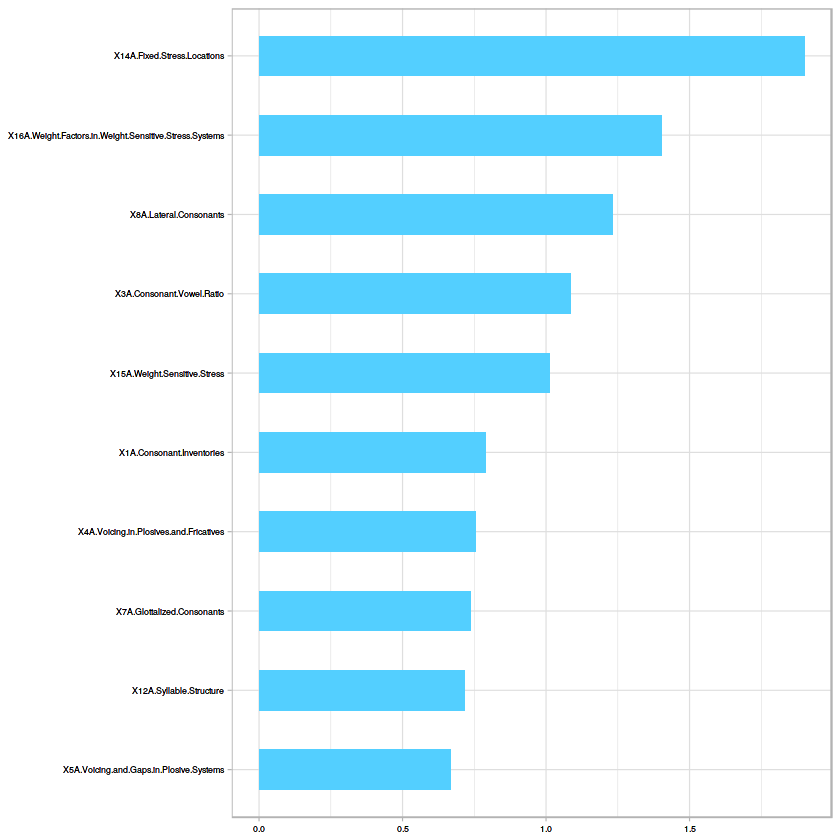

[1] "Accuracy for SVM:52.7272727272727"
   
     B  D
  B 14  0
  D  0  8
   
     B  D
  B 14  0
  D  0  8
[1] "B" "E"
[1] 0.7823125
[1] "Dummy Classifier accuracy:0.7823125"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

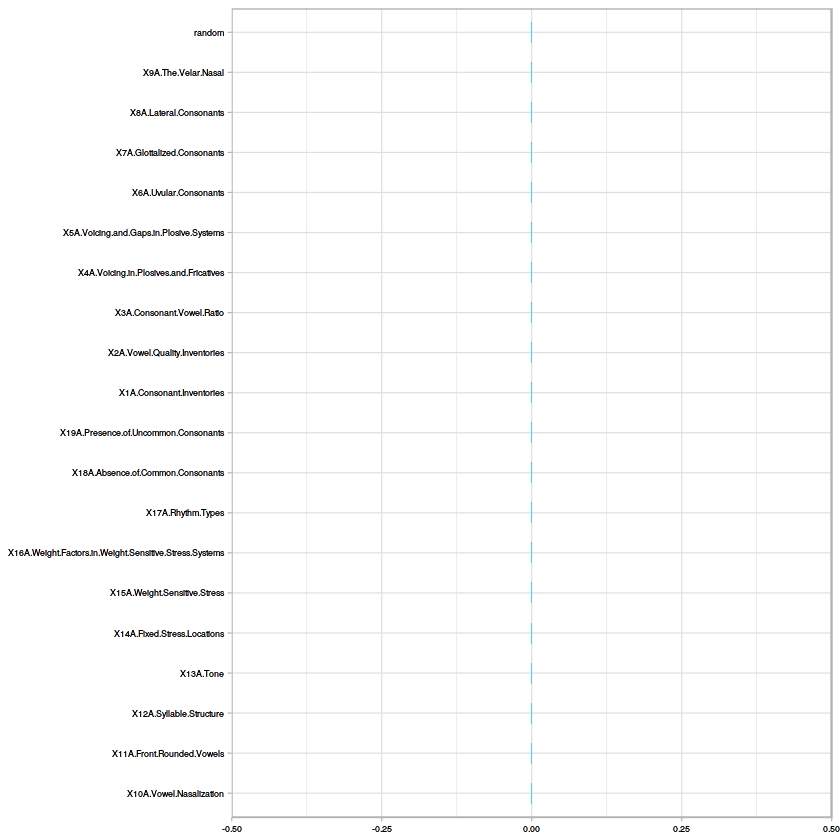

[1] "C-V accuracy for Random Forest is  "
   
     B  E
  B 14  2
  E  0  0


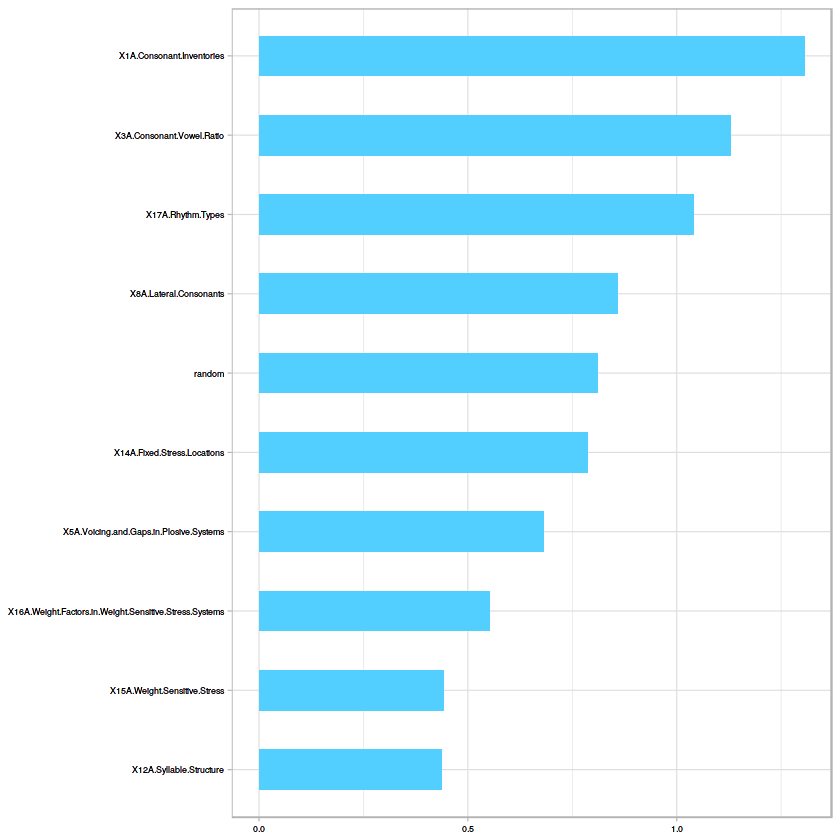

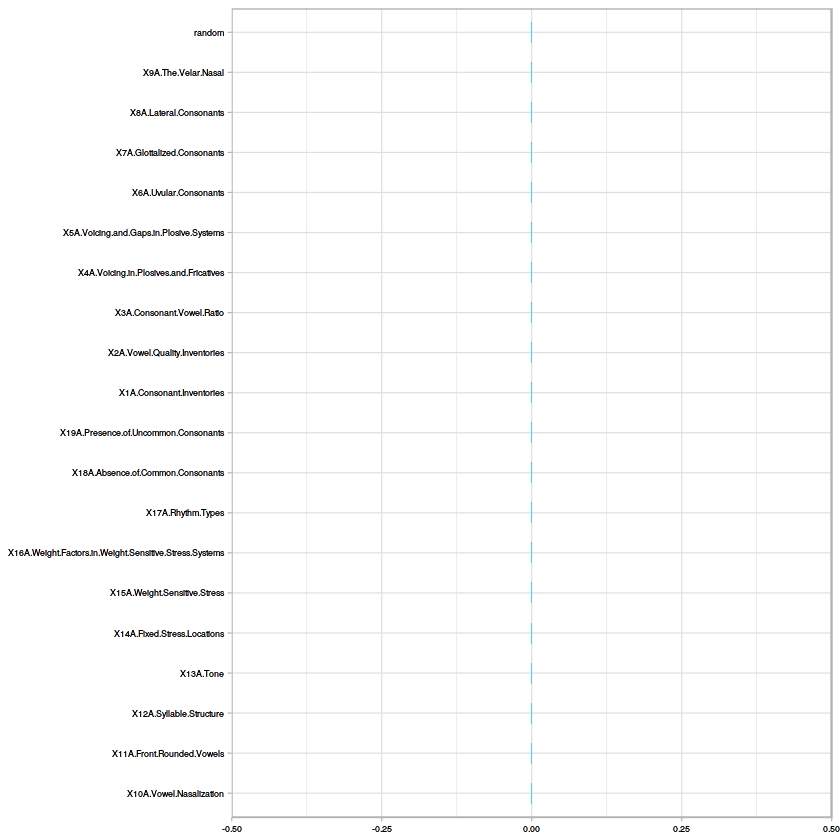

[1] "Accuracy for SVM:87.5"
   
     B  E
  B 14  2
  E  0  0
   
     B  E
  B 14  2
  E  0  0
[1] "C" "D"
[1] 0.5463696
[1] "Dummy Classifier accuracy:0.546369565217391"
[1] "C-V accuracy for Random Forest is  "
   
     C  D
  C 15  8
  D  0  0


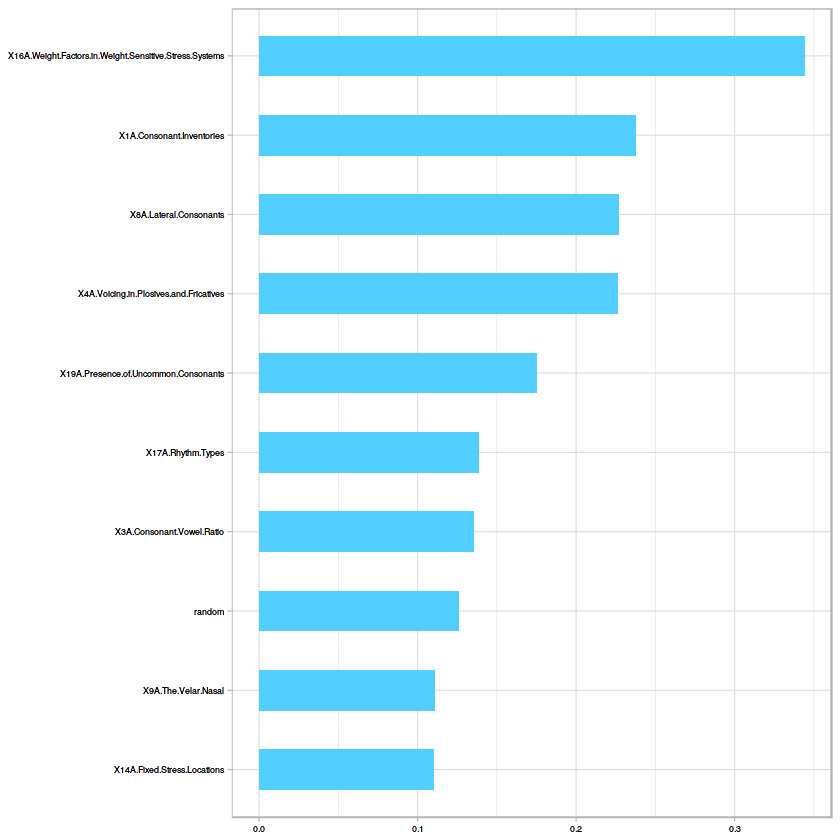

[1] "Accuracy for SVM:58.2608695652174"
   
     C  D
  C 15  1
  D  0  7
   
     C  D
  C 15  1
  D  0  7
[1] "C" "E"
[1] 0.7929706
[1] "Dummy Classifier accuracy:0.792970588235294"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

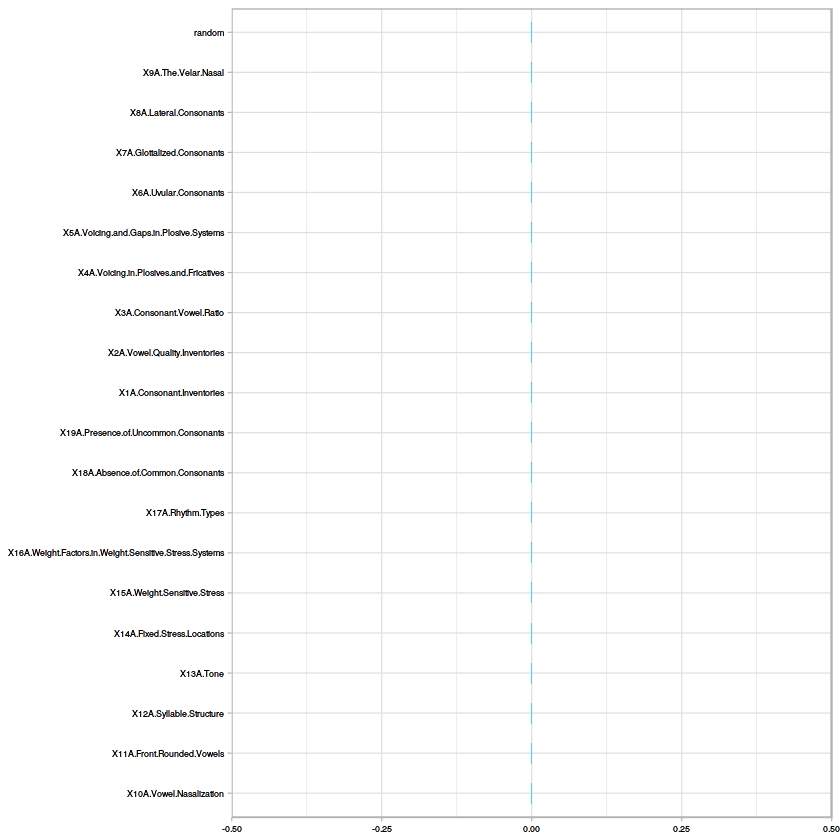

[1] "C-V accuracy for Random Forest is  "
   
     C  E
  C 15  2
  E  0  0


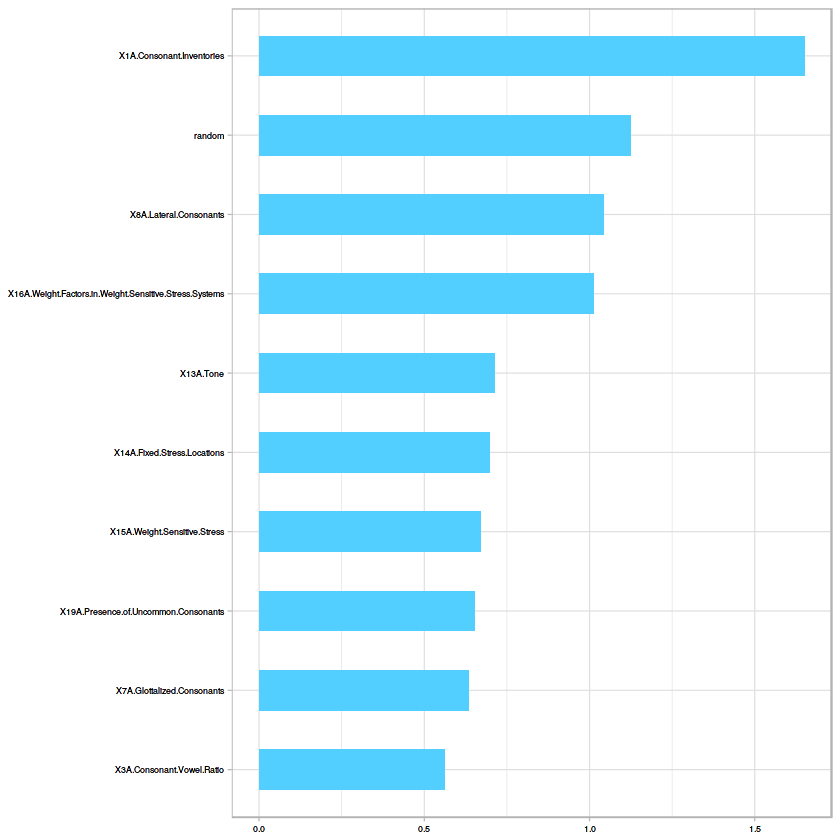

[1] "Accuracy for SVM:88.2352941176471"
   
     C  E
  C 15  2
  E  0  0
   
     C  E
  C 15  2
  E  0  0
[1] "D" "E"
[1] 0.683
[1] "Dummy Classifier accuracy:0.683"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

[1] "C-V accuracy for Random Forest is  "


ERROR: Error in model@fit(data, ...): fraction of 0.000000 is too small


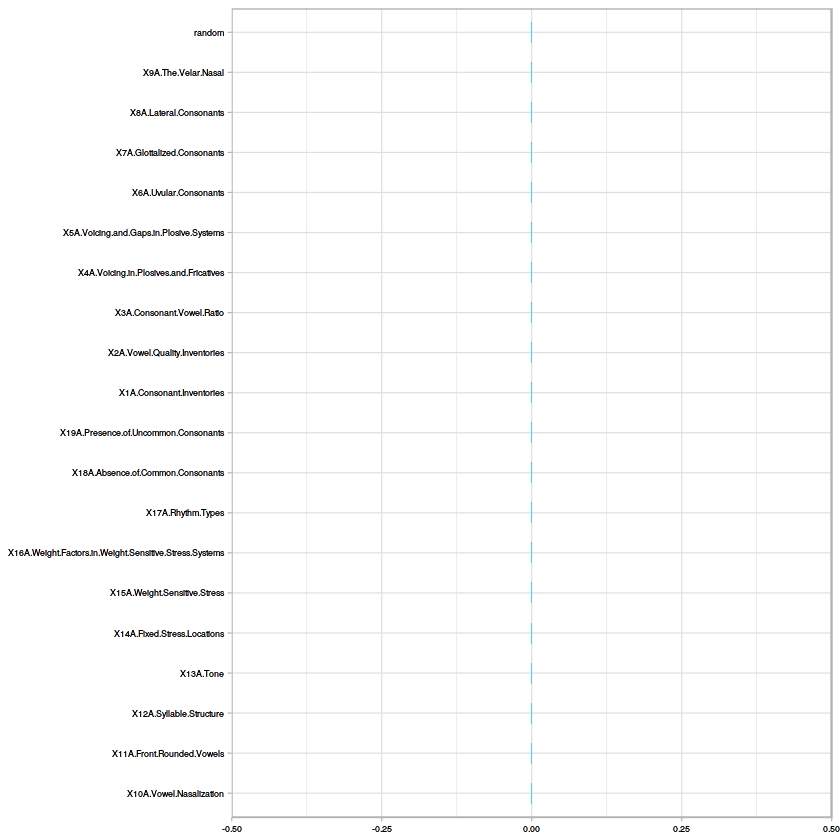

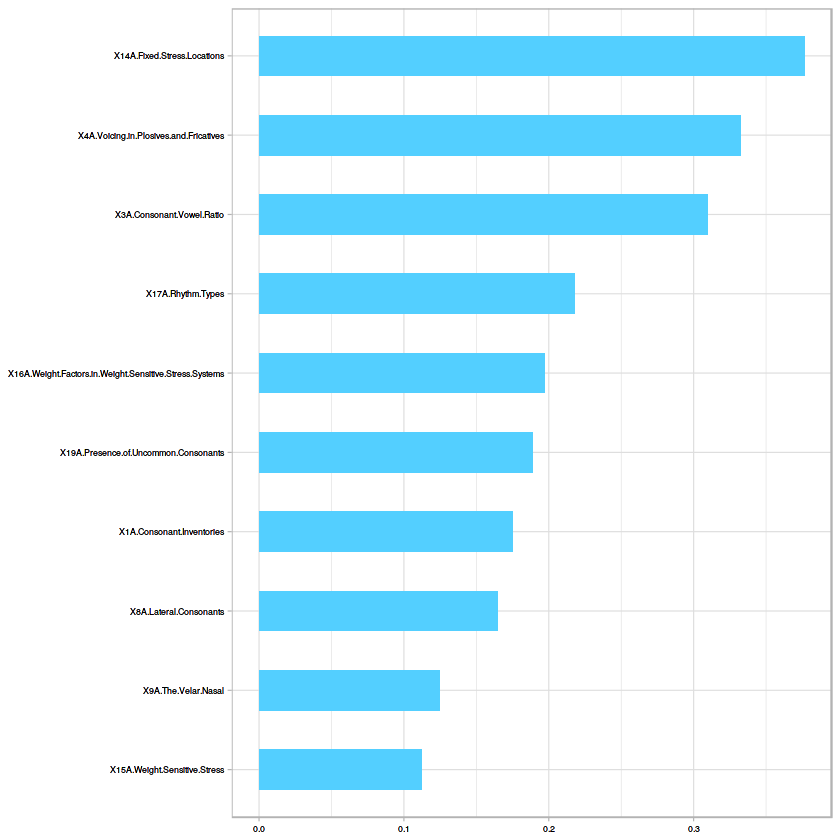

In [41]:
#One vs One
ovo(phon_df)

[1] "Climate: "
[1] "A" "B"
[1] "Dummy Classifier"
[1] 0.5436972
[1] 0.5436972
[1] C-V accuracy for Random Forest is 0.707936507936508
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 40  8
  Z  6 17


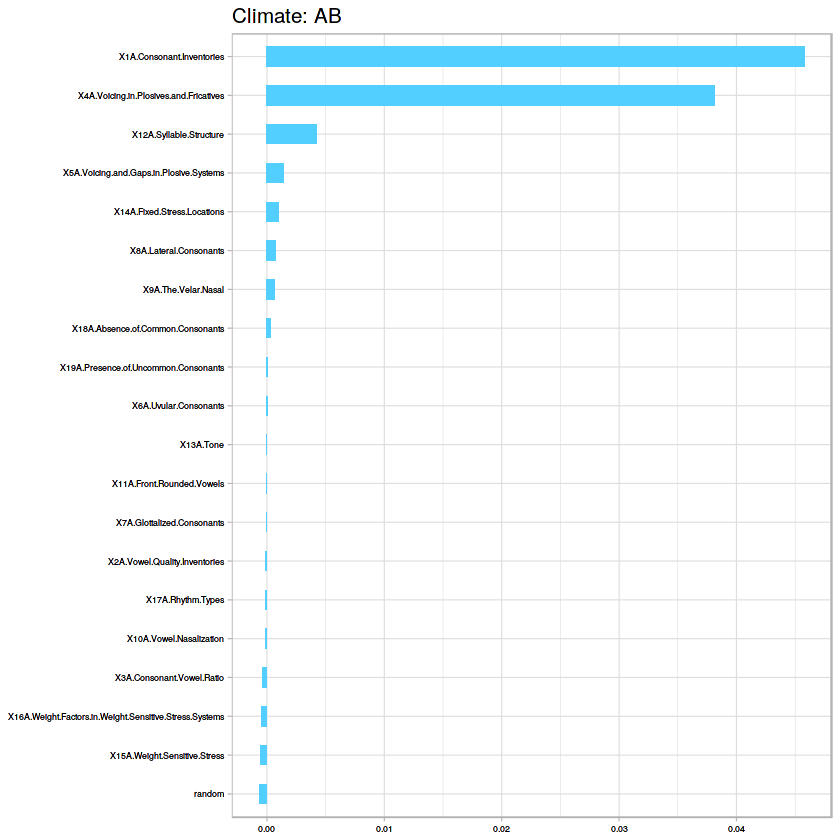

[1] "Accuracy for SVM:72.112676056338"
   
     Y  Z
  Y 46  5
  Z  0 20
[1] "Climate: "
[1] "A" "C"
[1] "Dummy Classifier"
[1] 0.5532817
[1] 0.5532817
[1] C-V accuracy for Random Forest is 0.667032967032967
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 47 21
  Z  0  3


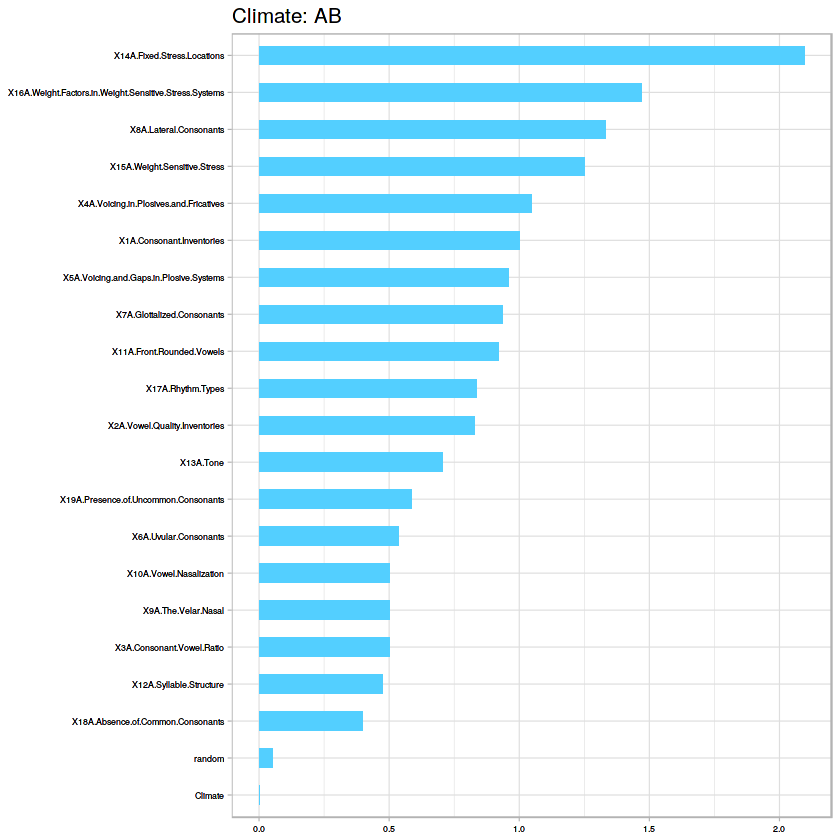

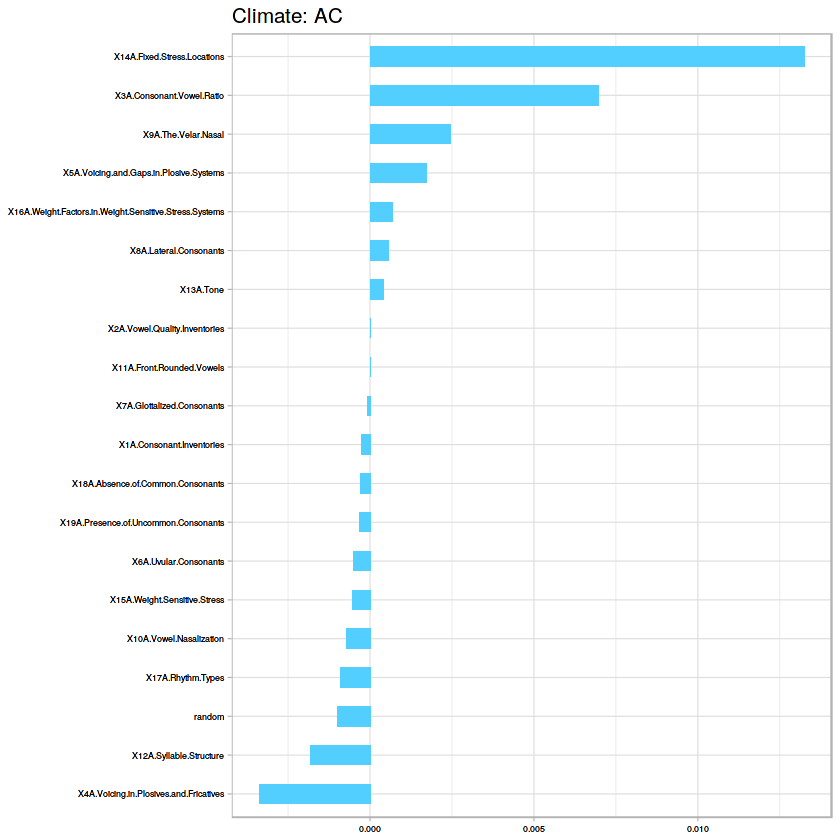

[1] "Accuracy for SVM:65.9154929577465"
   
     Y  Z
  Y 47  8
  Z  0 16
[1] "Climate: "
[1] "A" "D"
[1] "Dummy Classifier"
[1] 0.5086901
[1] 0.5086901
[1] C-V accuracy for Random Forest is 0.713015873015873
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 33  6
  Z  7 25


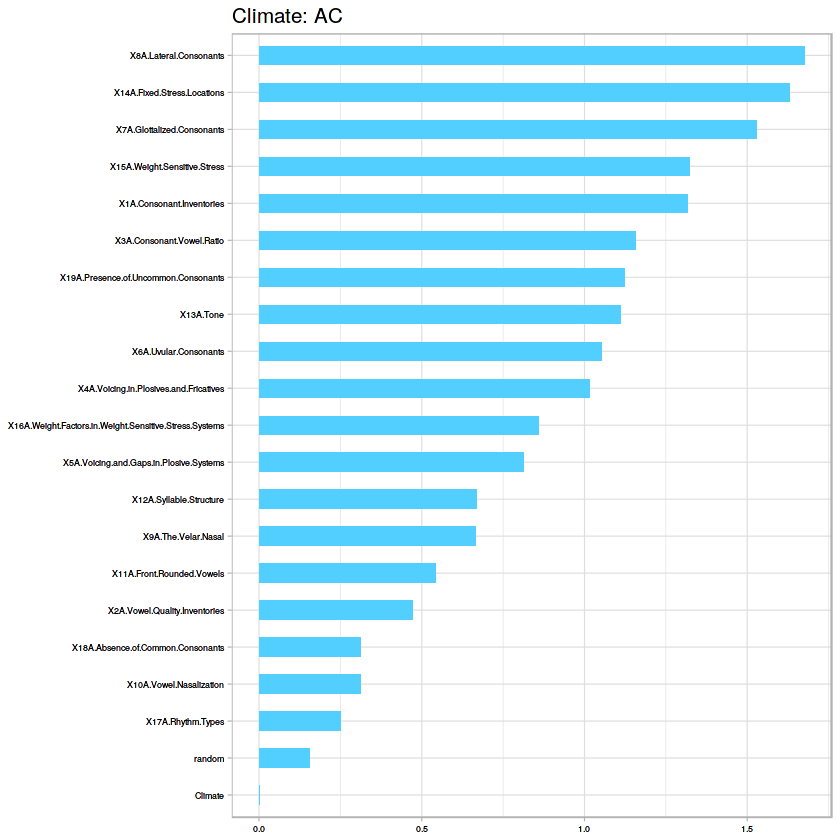

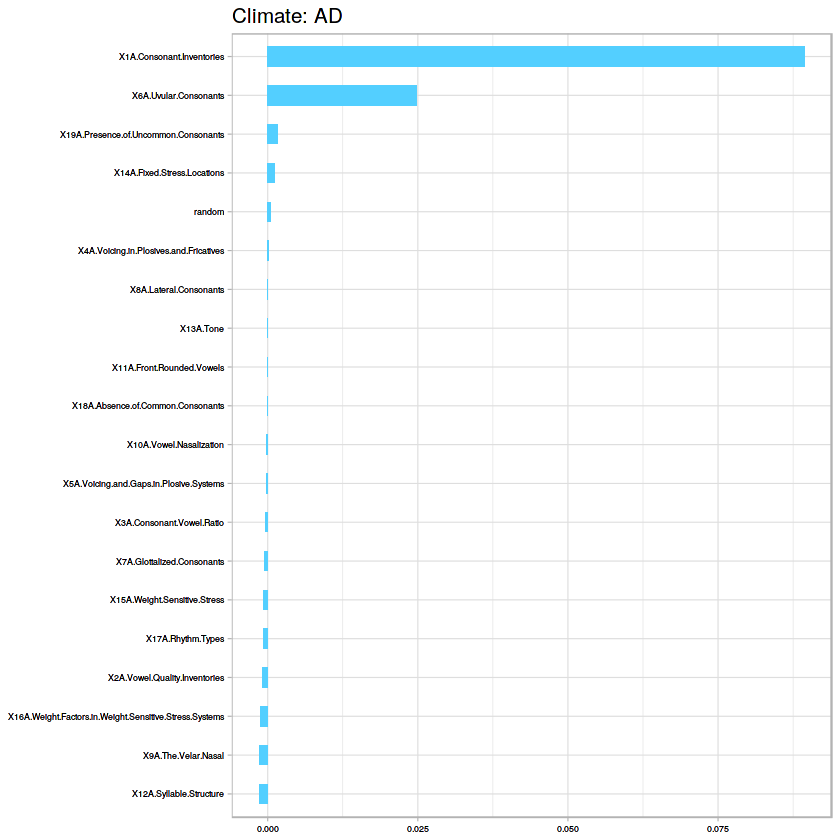

[1] "Accuracy for SVM:65.3521126760563"
   
     Y  Z
  Y 40  8
  Z  0 23
[1] "Climate: "
[1] "A" "E"
[1] "Dummy Classifier"
[1] 0.5011549
[1] 0.5011549
[1] C-V accuracy for Random Forest is 0.693650793650794
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 28  6
  Z  6 31


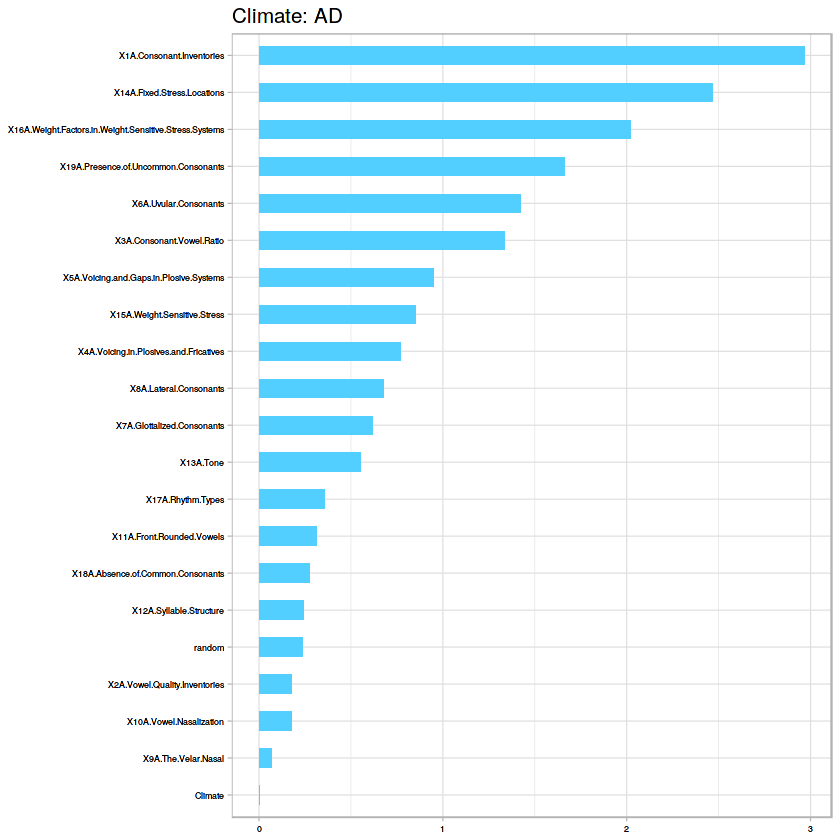

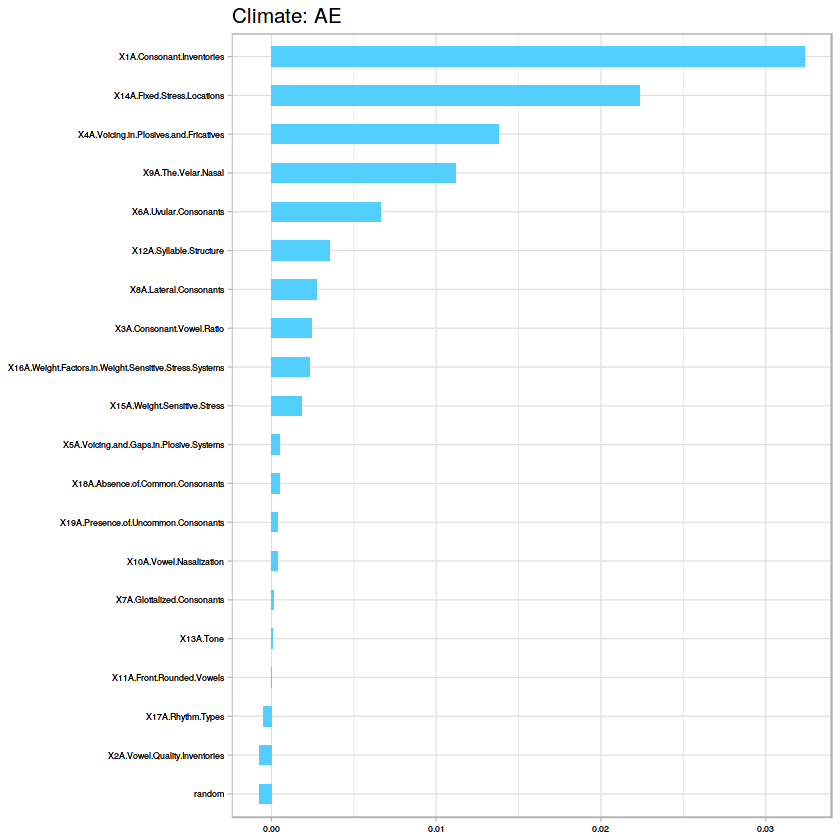

[1] "Accuracy for SVM:74.3661971830986"
   
     Y  Z
  Y 33  0
  Z  1 37
[1] "Climate: "
[1] "B" "C"
[1] "Dummy Classifier"
[1] 0.5144577
[1] 0.5144577
[1] C-V accuracy for Random Forest is 0.67028083028083
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 22  5
  Z  7 37


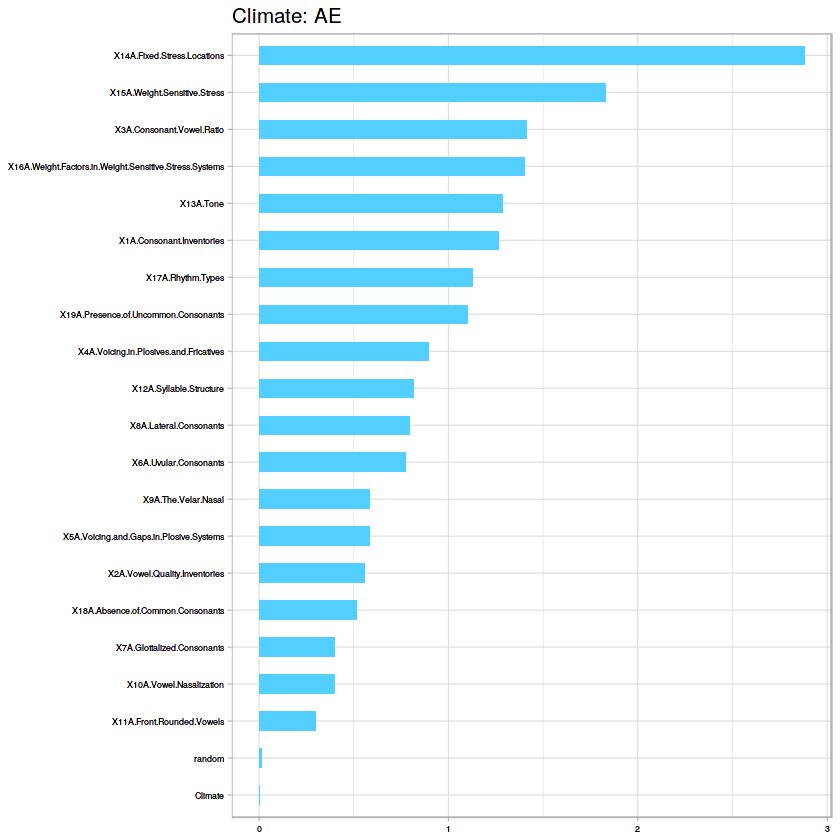

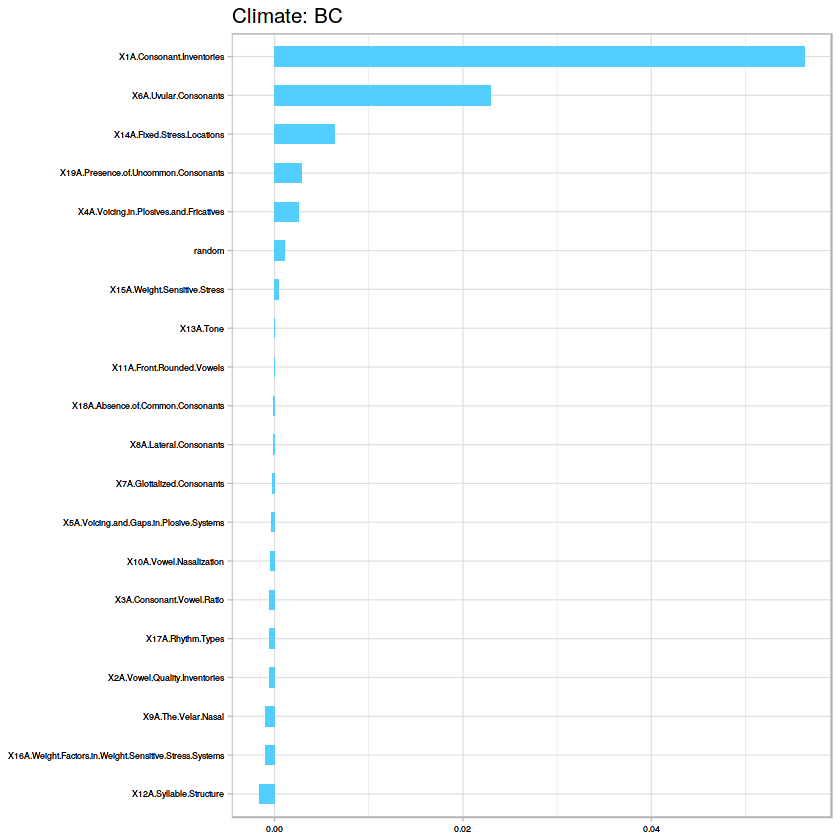

[1] "Accuracy for SVM:68.169014084507"
   
     Y  Z
  Y 22  0
  Z  7 42
[1] "Climate: "
[1] "B" "D"
[1] "Dummy Classifier"
[1] 0.5731197
[1] 0.5731197
[1] C-V accuracy for Random Forest is 0.695482295482295
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  5  0
  Z 17 49


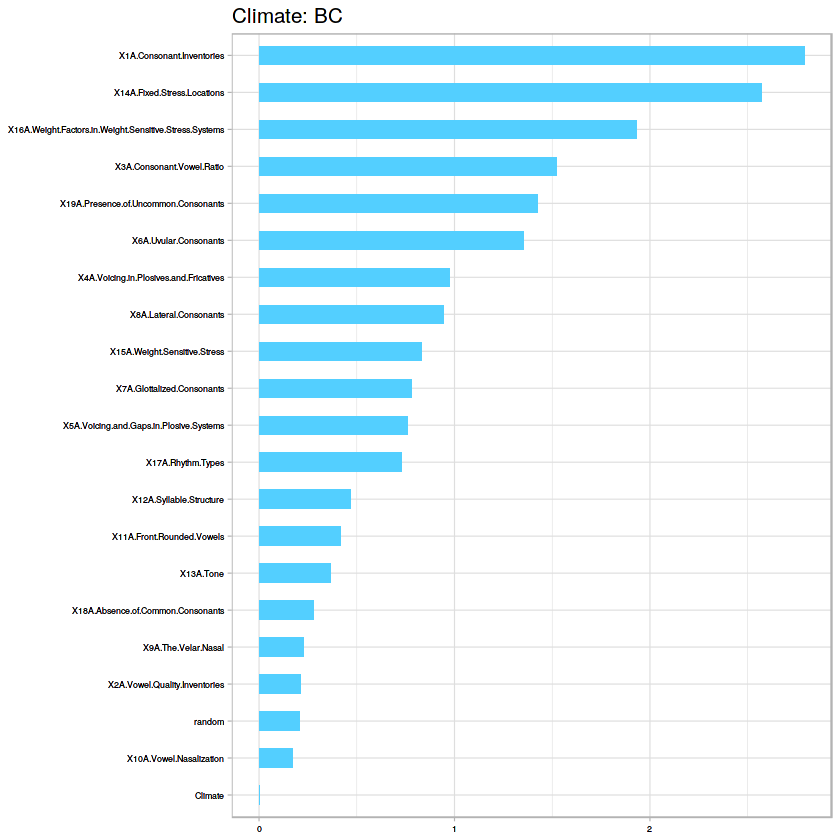

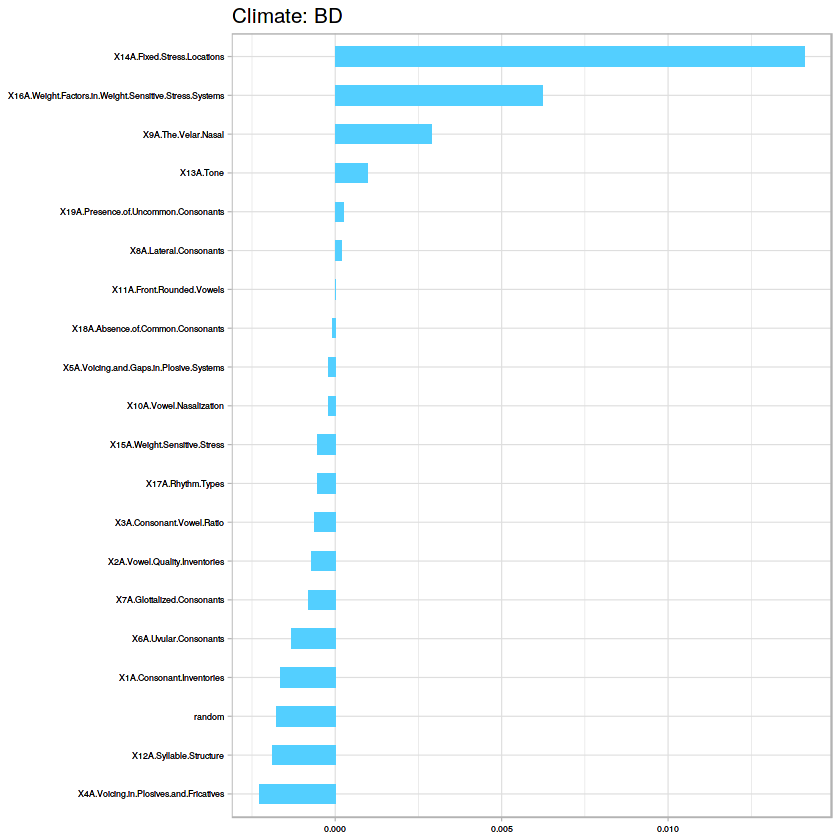

[1] "Accuracy for SVM:68.169014084507"
   
     Y  Z
  Y 14  0
  Z  8 49
[1] "Climate: "
[1] "B" "E"
[1] "Dummy Classifier"
[1] 0.6522535
[1] 0.6522535
[1] C-V accuracy for Random Forest is 0.78
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  1  0
  Z 15 55


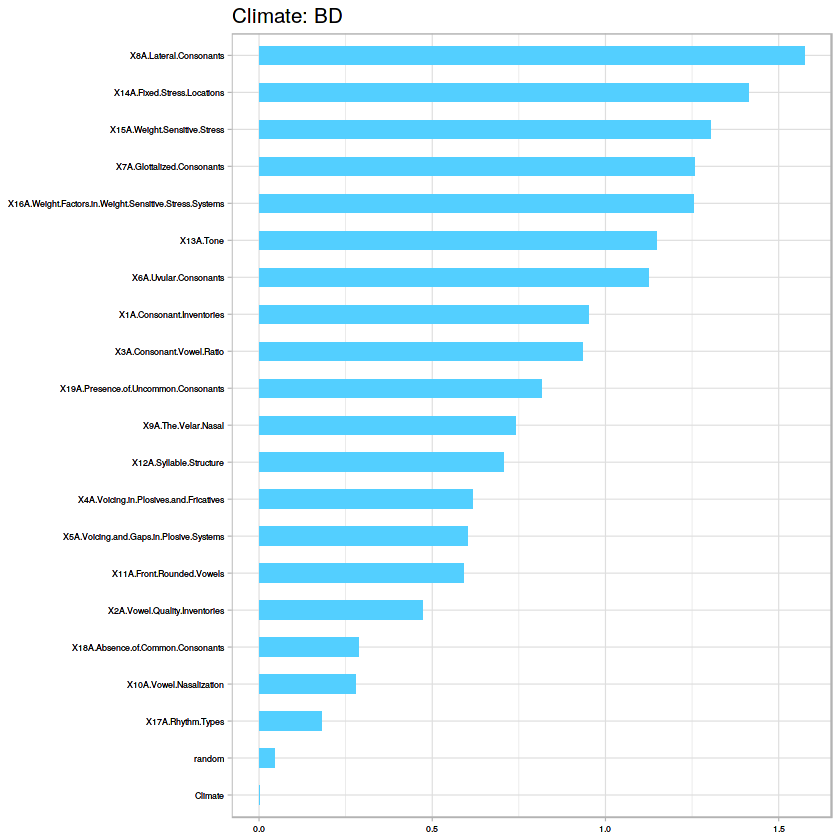

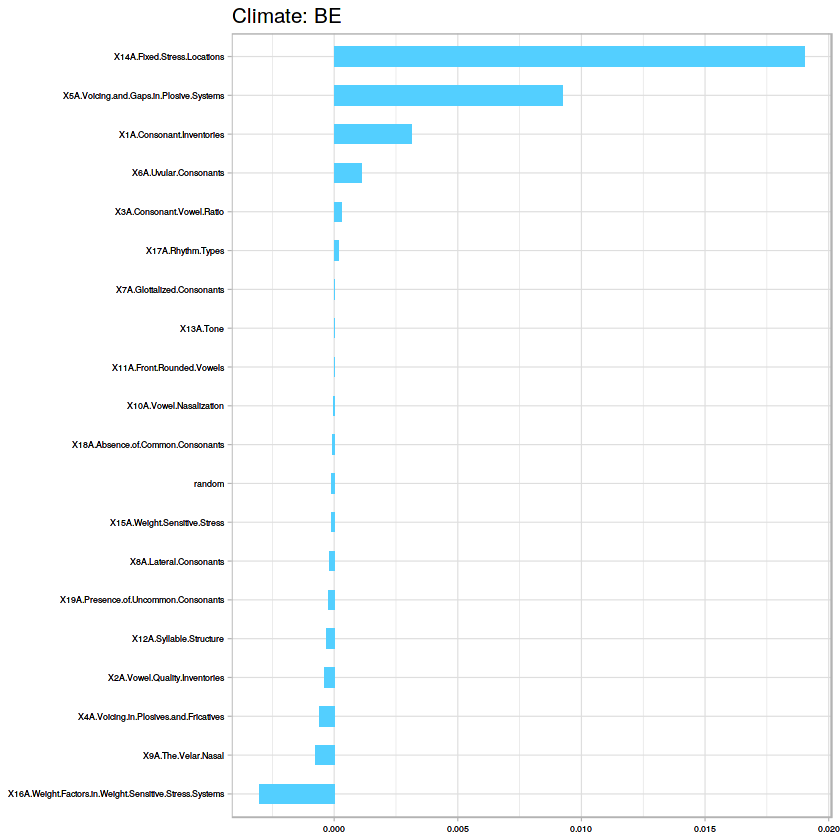

[1] "Accuracy for SVM:76.3380281690141"
   
     Y  Z
  Y  8  0
  Z  8 55
[1] "Climate: "
[1] "C" "D"
[1] "Dummy Classifier"
[1] 0.5633803
[1] 0.5633803
[1] C-V accuracy for Random Forest is 0.713870573870574
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 14  3
  Z  9 45


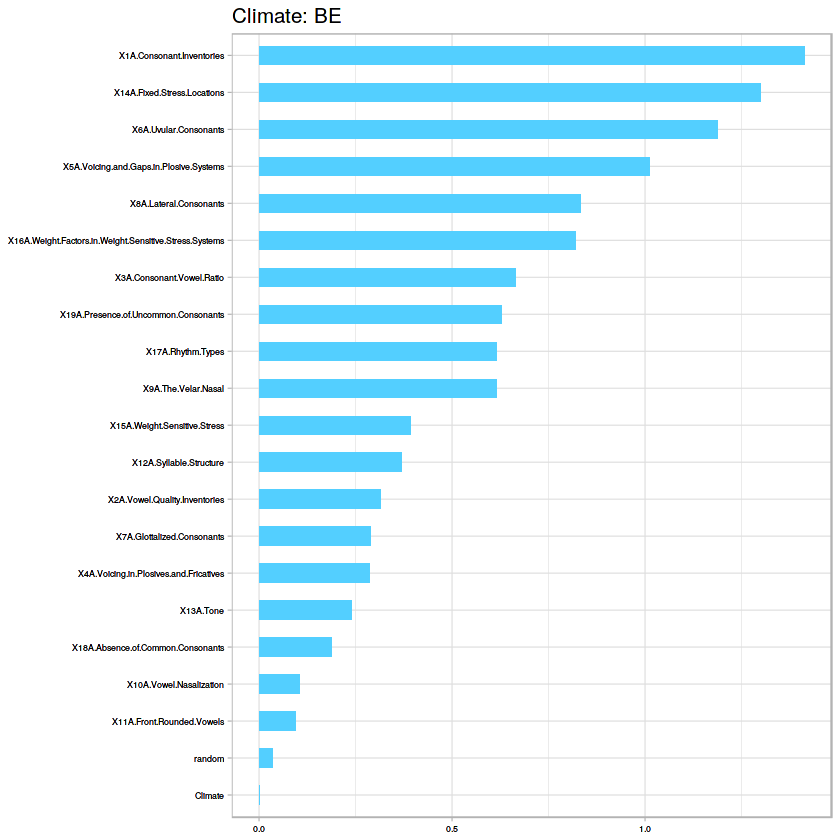

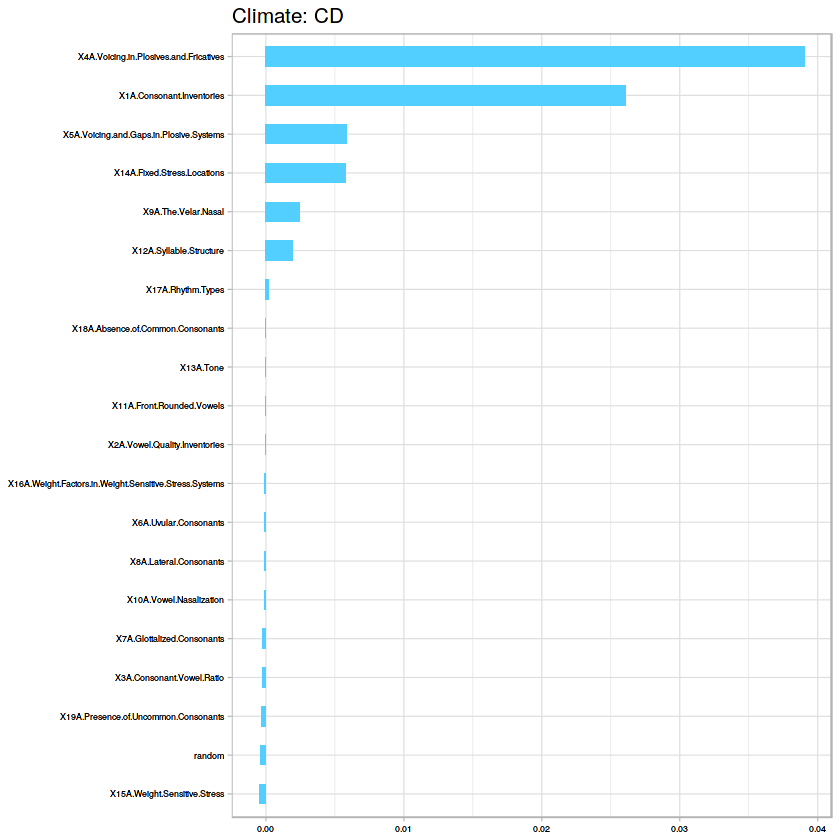

[1] "Accuracy for SVM:74.9295774647887"
   
     Y  Z
  Y 19  0
  Z  4 48
[1] "Climate: "
[1] "C" "E"
[1] "Dummy Classifier"
[1] 0.636162
[1] 0.636162
[1] C-V accuracy for Random Forest is 0.761294261294261
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 17 54


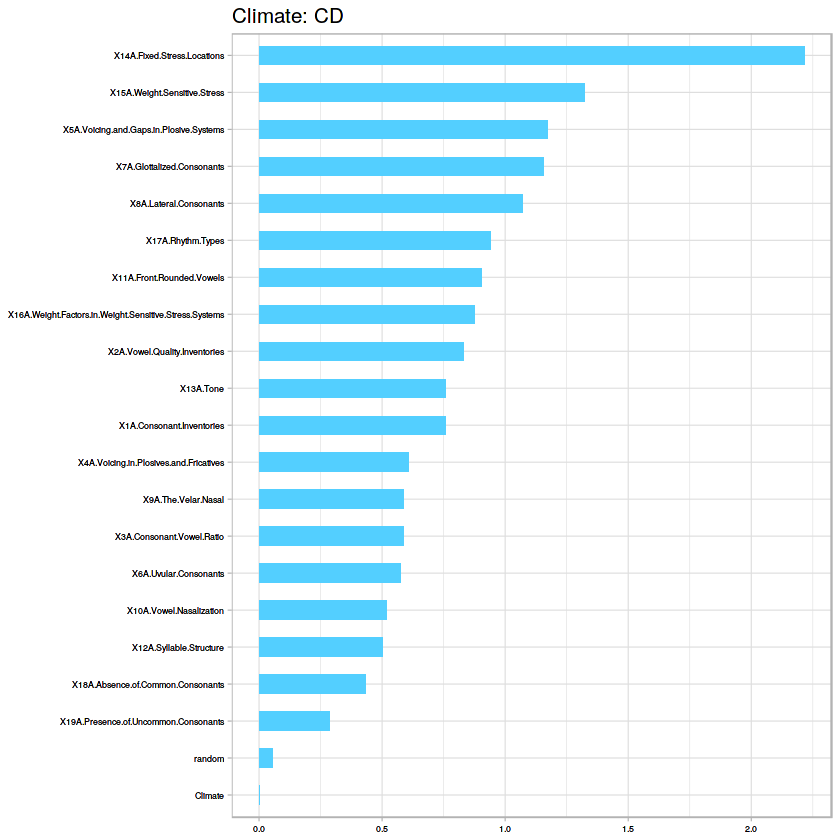

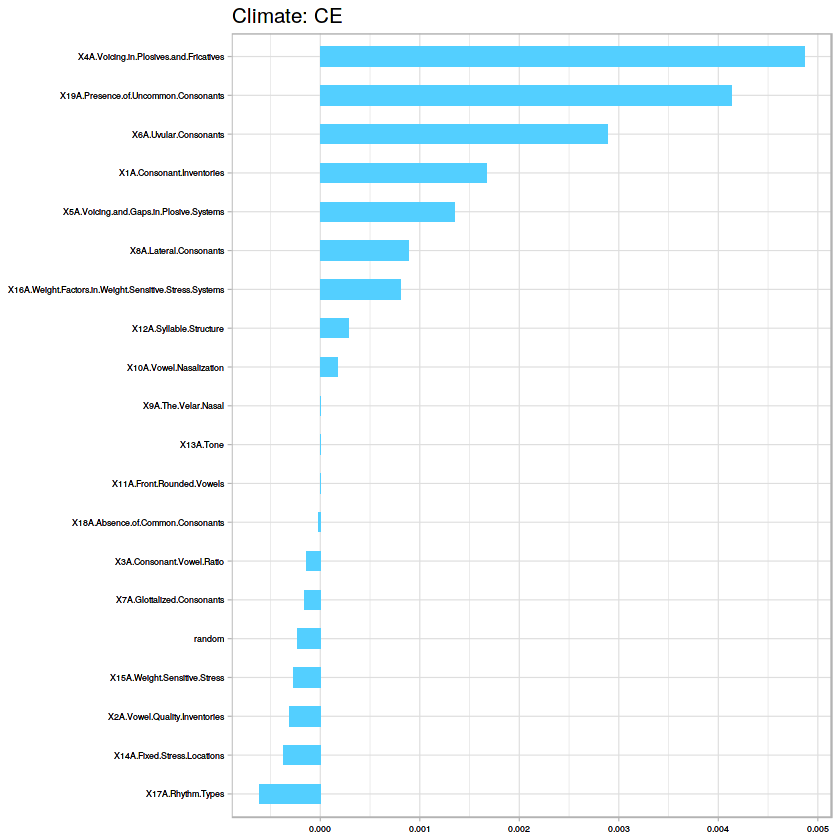

[1] "Accuracy for SVM:75.7746478873239"
   
     Y  Z
  Y 10  0
  Z  7 54
[1] "Climate: "
[1] "D" "E"
[1] "Dummy Classifier"
[1] 0.7584085
[1] 0.7584085
[1] C-V accuracy for Random Forest is 0.859047619047619
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 10 61


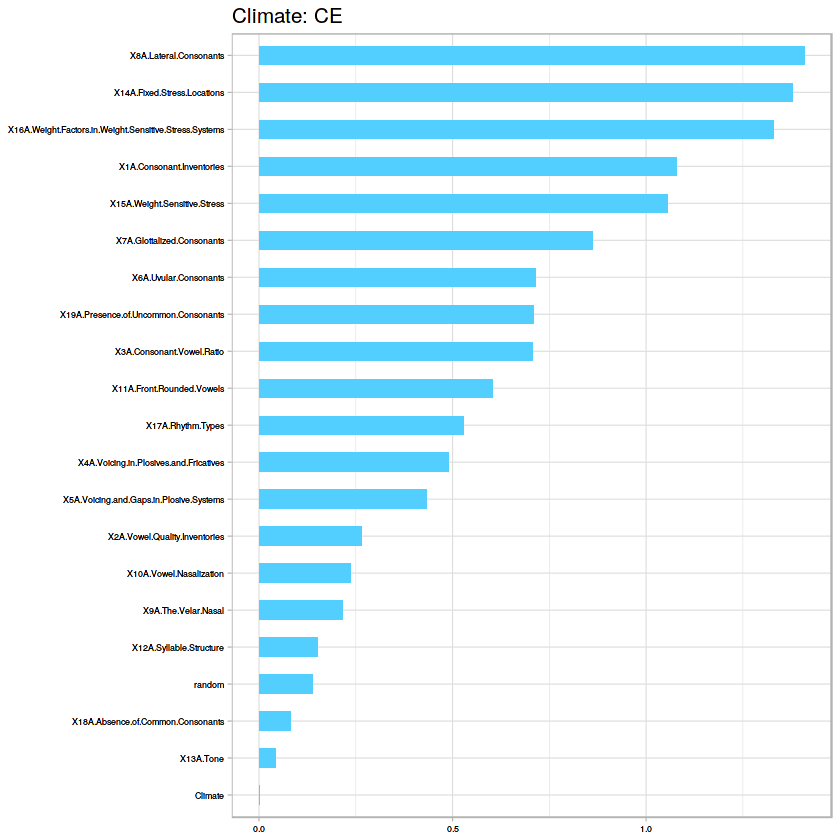

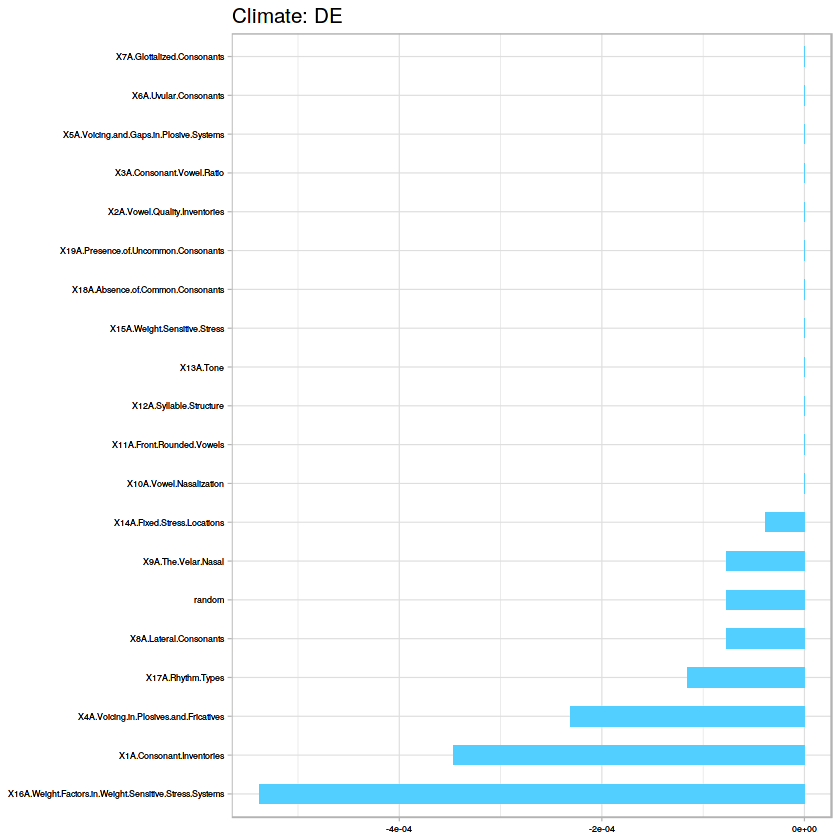

[1] "Accuracy for SVM:85.9154929577465"
   
     Y  Z
  Y  1  0
  Z  9 61


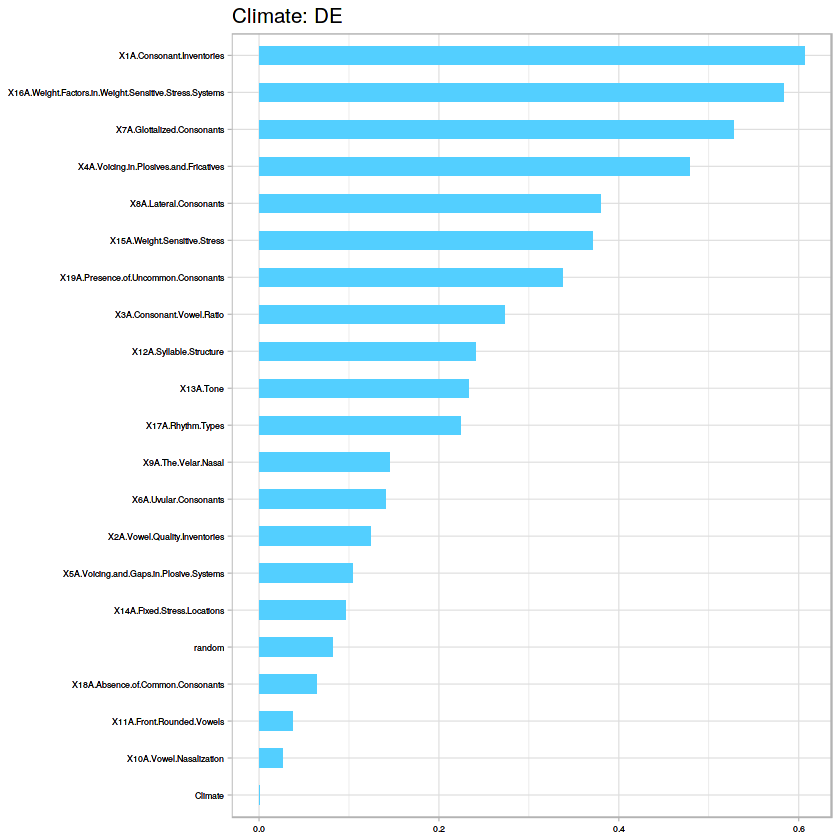

In [363]:
bin_2v3(phon_df)

[1] "Abkhaz"                "Arabic (Egyptian)"     "Alamblak"             
 [4] "Amele"                 "Apurin??"              "Arapesh (Mountain)"   
 [7] "Asmat"                 "Awa Pit"               "Aymara (Central)"     
[10] "Bagirmi"               "Beja"                  "Berber (Middle Atlas)"
[13] "Burmese"               "Barasano"              "Basque"               
[16] "Chamorro"              "Chukchi"               "Canela-Krah??"        
[19] "Cree (Plains)"         "Cayuvava"              "Daga"                 
[22] "English"               "Epena Pedee"           "Evenki"               
[25] "Fijian"                "Finnish"               "French"               
[28] "Georgian"              "German"                "Gooniyandi"           
[31] "Greek (Modern)"        "Greenlandic (West)"    "Hausa"                
[34] "Hebrew (Modern)"       "Hindi"                 "Hixkaryana"           
[37] "Hmong Njua"            "Hungarian"             "Indonesian"           
[40] "Jakaltek"              "Japanese"              "Kayardild"            
[43] "Khalkha"               "Khoekhoe"              "Kiowa"                
[46] "Kannada"               "Koasati"               "Korean"               
[49] "Karok"                 "Krongo"                "Kutenai"              
[52] "Lango"                 "Lavukaleve"            "Lezgian"              
[55] "Lakhota"               "Luvale"                "Malagasy"             
[58] "Maricopa"              "Maung"                 "Maybrat"              
[61] "Meithei"               "Mandarin"              "Martuthunira"         
[64] "Mangarrayi"            "Ngiyambaa"             "Nivkh"                
[67] "Oromo (Harar)"         "Paiwan"                "Pirah??"              
[70] "Persian"               "Quechua (Imbabura)"    "Rapanui"              
[73] "Russian"               "Slave"                 "Spanish"              
[76] "Squamish"              "Swahili"               "Tagalog"              
[79] "Thai"                  "Tiwi"                  "Trumai"               
[82] "Tukang Besi"           "Turkish"               "Vietnamese"           
[85] "Wari'"                 "Wich?_"                "Wichita"              
[88] "Yagua"                 "Yaqui"                 "Yoruba"               
[91] "Yurok"                 "Zulu"

[1] Northwest Caucasian  Afro-Asiatic         Sepik               
 [4] Trans-New Guinea     Arawakan             Torricelli          
 [7] Trans-New Guinea     Barbacoan            Aymaran             
[10] Central Sudanic      Afro-Asiatic         Afro-Asiatic        
[13] Sino-Tibetan         Tucanoan             Basque              
[16] Austronesian         Chukotko-Kamchatkan  Macro-Ge            
[19] Algic                Cayuvava             Dagan               
[22] Indo-European        Choco                Altaic              
[25] Austronesian         Uralic               Indo-European       
[28] Kartvelian           Indo-European        Bunuban             
[31] Indo-European        Eskimo-Aleut         Afro-Asiatic        
[34] Afro-Asiatic         Indo-European        Cariban             
[37] Hmong-Mien           Uralic               Austronesian        
[40] Mayan                Japanese             Tangkic             
[43] Altaic               Khoe-Kwadi           Kiowa-Tanoan        
[46] Dravidian            Muskogean            Korean              
[49] Karok                Kadu                 Kutenai             
[52] Eastern Sudanic      Solomons East Papuan Nakh-Daghestanian   
[55] Siouan               Niger-Congo          Austronesian        
[58] Hokan                Iwaidjan             West Papuan         
[61] Sino-Tibetan         Sino-Tibetan         Pama-Nyungan        
[64] Mangarrayi-Maran     Pama-Nyungan         Nivkh               
[67] Afro-Asiatic         Austronesian         Mura                
[70] Indo-European        Quechuan             Austronesian        
[73] Indo-European        Na-Dene              Indo-European       
[76] Salishan             Niger-Congo          Austronesian        
[79] Tai-Kadai            Tiwian               Trumai              
[82] Austronesian         Altaic               Austro-Asiatic      
[85] Chapacura-Wanham     Matacoan             Caddoan             
[88] Peba-Yaguan          Uto-Aztecan          Niger-Congo         
[91] Algic                Niger-Congo         
62 Levels: Afro-Asiatic Algic Altaic Arawakan Austro-Asiatic ... West Papuan


        Afro-Asiatic                Algic               Altaic 
                   6                    2                    3 
            Arawakan       Austro-Asiatic         Austronesian 
                   1                    1                    8 
             Aymaran            Barbacoan               Basque 
                   1                    1                    1 
             Bunuban              Caddoan              Cariban 
                   1                    1                    1 
            Cayuvava      Central Sudanic     Chapacura-Wanham 
                   1                    1                    1 
               Choco  Chukotko-Kamchatkan                Dagan 
                   1                    1                    1 
           Dravidian      Eastern Sudanic         Eskimo-Aleut 
                   1                    1                    1 
          Hmong-Mien                Hokan        Indo-European 
                   1                   

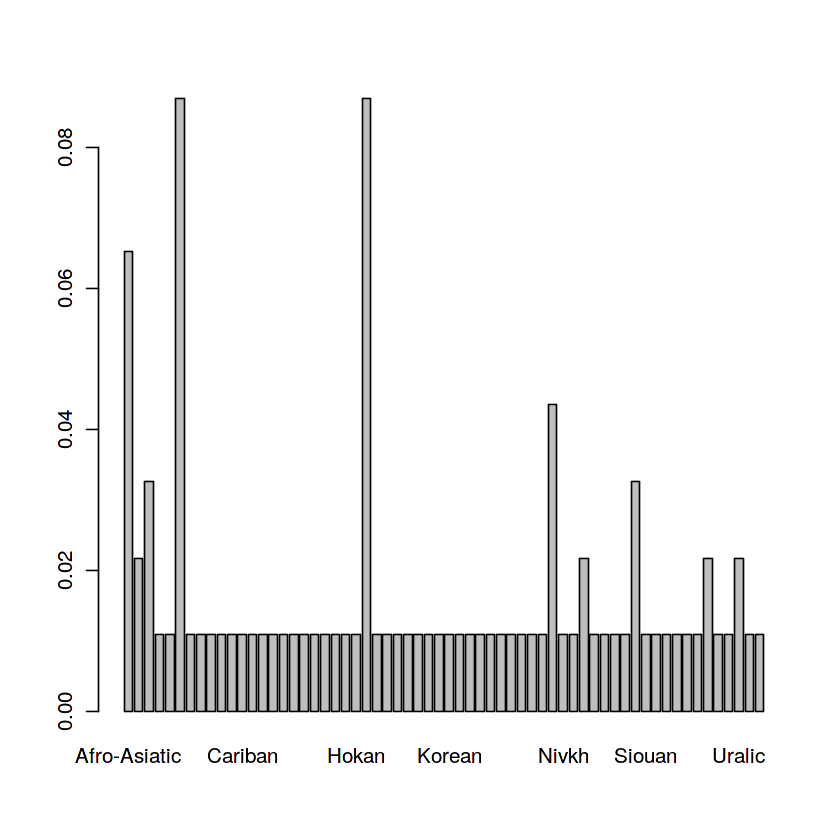

In [60]:
#Morphology features 20A - 29A
s<-c(1,3,25:34,176,177)
morp_df<-na.omit(lang_df[,s])
morp_df[,2]<-as.factor(as.character(morp_df[,2]))
morp_df[,1]
morp_df[,2]
table(morp_df[,2])
barplot(prop.table(table(morp_df[,2])))
morp_df<-morp_df[,-c(1,2)]

morp_df[sapply(morp_df, is.character)] <- lapply(morp_df[sapply(morp_df, is.character)], as.factor)

[1] "C-V accuracy for Random Forest is  0.412910216718266"
   
     A  B  C  D  E
  A 30  6  8  4  0
  B  0  0  0  0  0
  C  4 12 19  6  3
  D  0  0  0  0  0
  E  0  0  0  0  0


[1] 0.2720543
[1] "Dummy Classifier: 0.272054347826087"
[1] "C-V accuracy for Random Forest is  0.412910216718266"
   
     A  B  C  D  E
  A 30  6  8  4  0
  B  0  0  0  0  0
  C  4 12 19  6  3
  D  0  0  0  0  0
  E  0  0  0  0  0


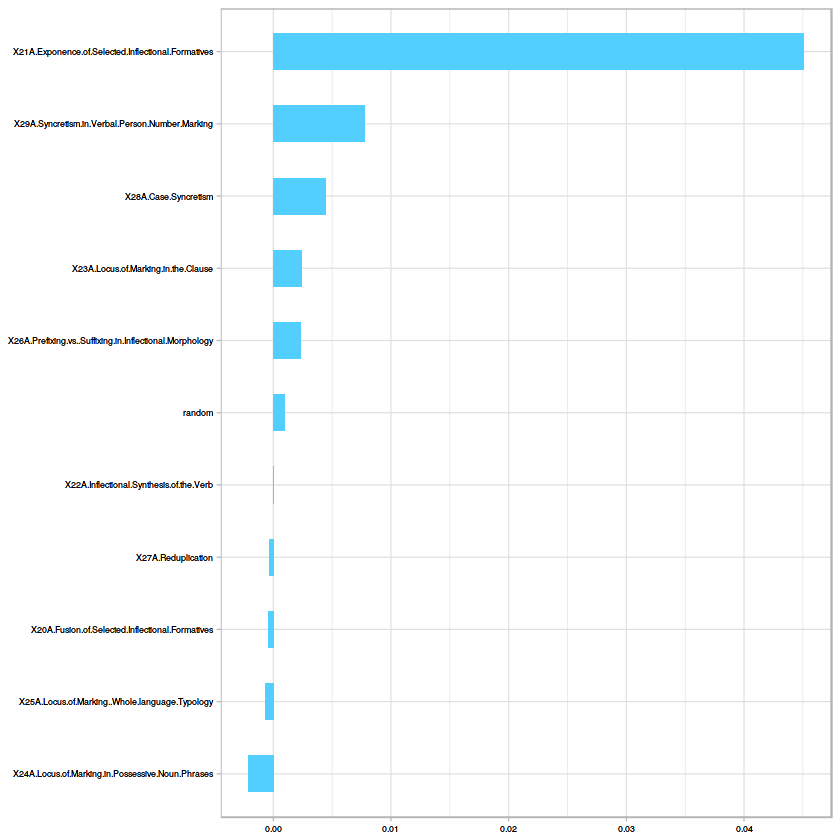

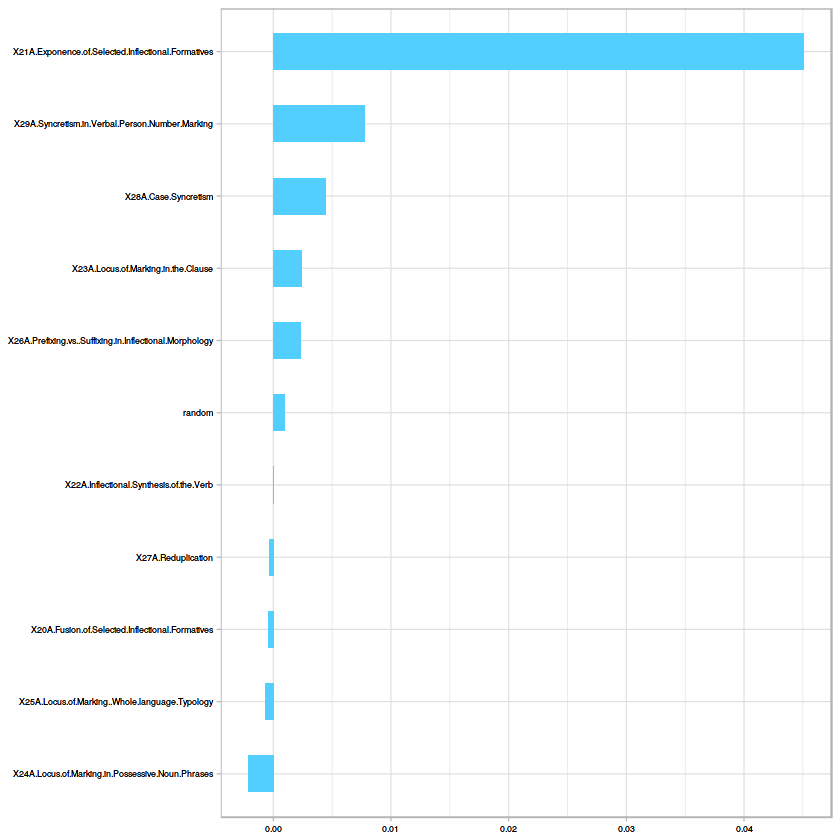

[1] "Accuracy for SVM:38.9130434782609"
   
     A  B  C  D  E
  A 31  6  5  5  0
  B  0  2  0  0  1
  C  3 10 22  5  2
  D  0  0  0  0  0
  E  0  0  0  0  0


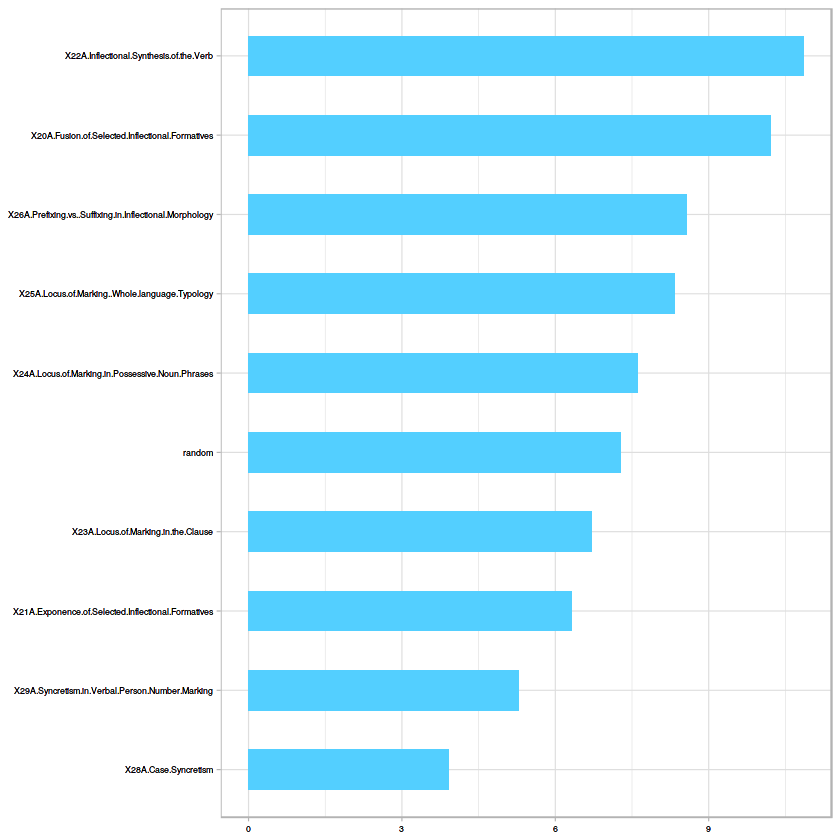

In [46]:
#Multi-class Morphology
cvrf(morp_df)
p<-dist(morp_df)

dc<-dummy_clas(class,morp_df$Climate,p)
print(paste0("Dummy Classifier: ", dc))
cvrf(morp_df)
svmc(morp_df)

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5337283
[1] C-V accuracy for Random Forest is 0.703657837403967
[1] "RF Confusion Matrix:"
   
     A  X
  A 22  4
  X 12 54


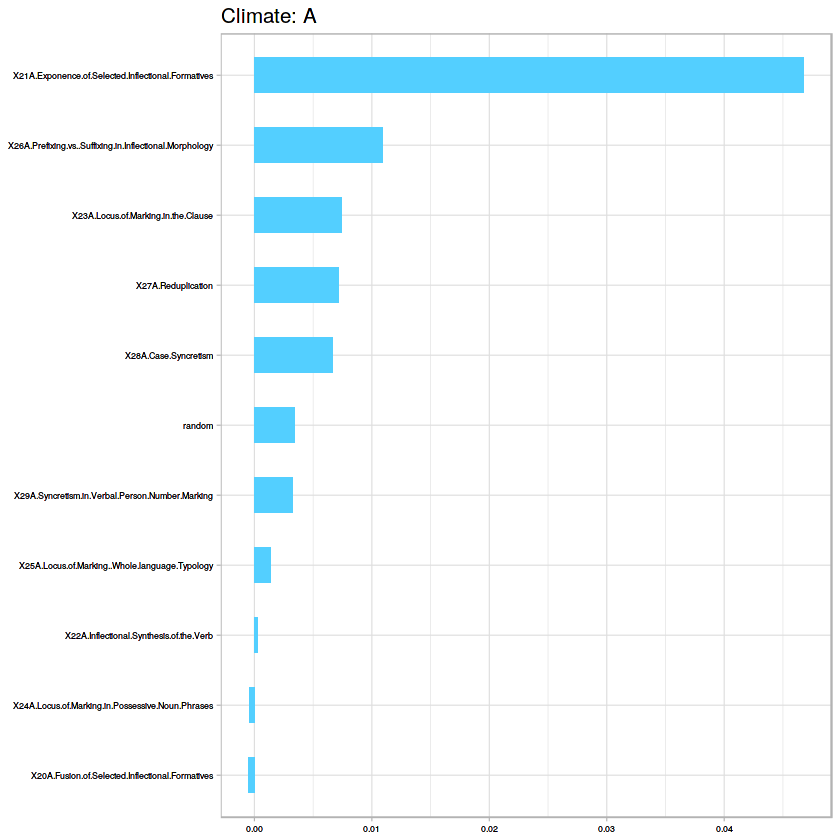

[1] "Accuracy for SVM:67.3913043478261"
   
     A  X
  A 19  2
  X 15 56
   
     A  X
  A 19  2
  X 15 56
[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.6843641
[1] C-V accuracy for Random Forest is 0.804678362573099
[1] "RF Confusion Matrix:"
   
     B  X
  B  0  0
  X 18 74


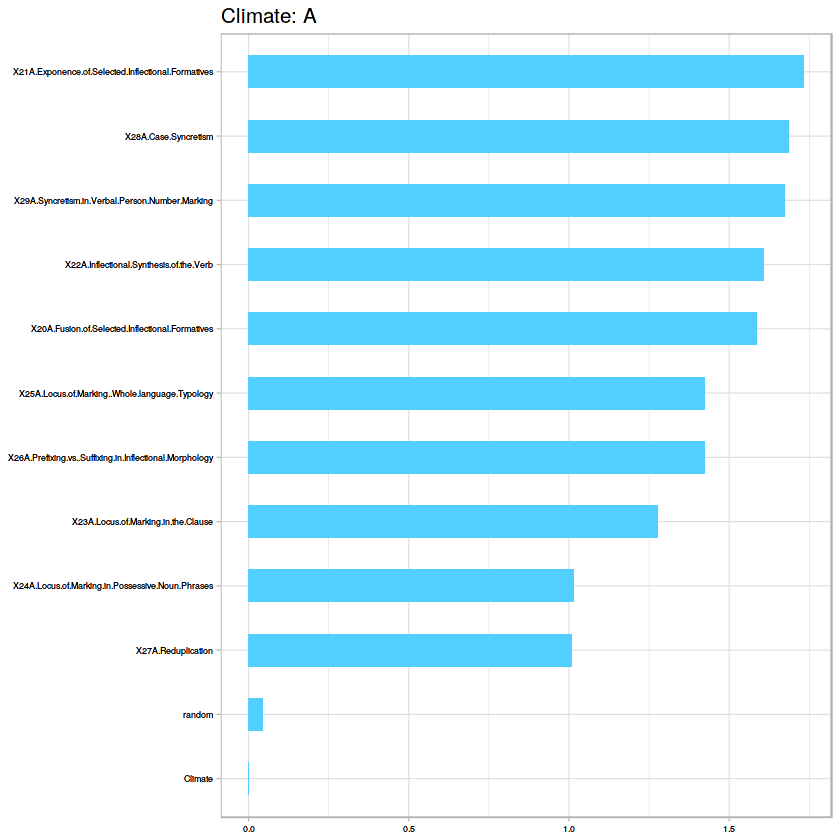

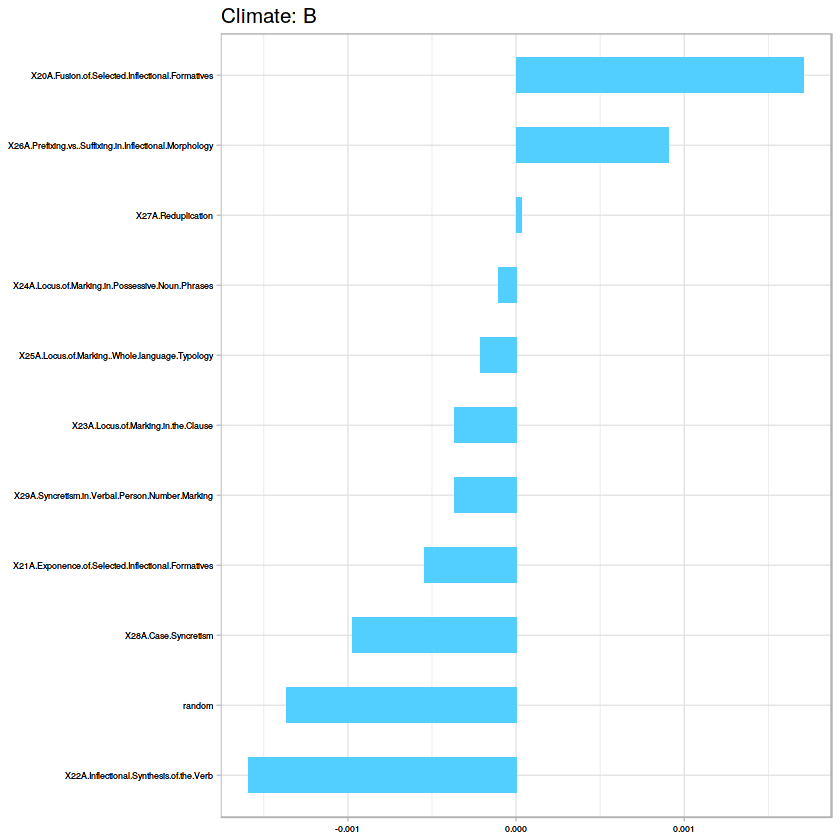

[1] "Accuracy for SVM:80.4347826086957"
   
     B  X
  B  0  0
  X 18 74
   
     B  X
  B  0  0
  X 18 74
[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.58525
[1] C-V accuracy for Random Forest is 0.707017543859649
[1] "RF Confusion Matrix:"
   
     C  X
  C  0  0
  X 27 65


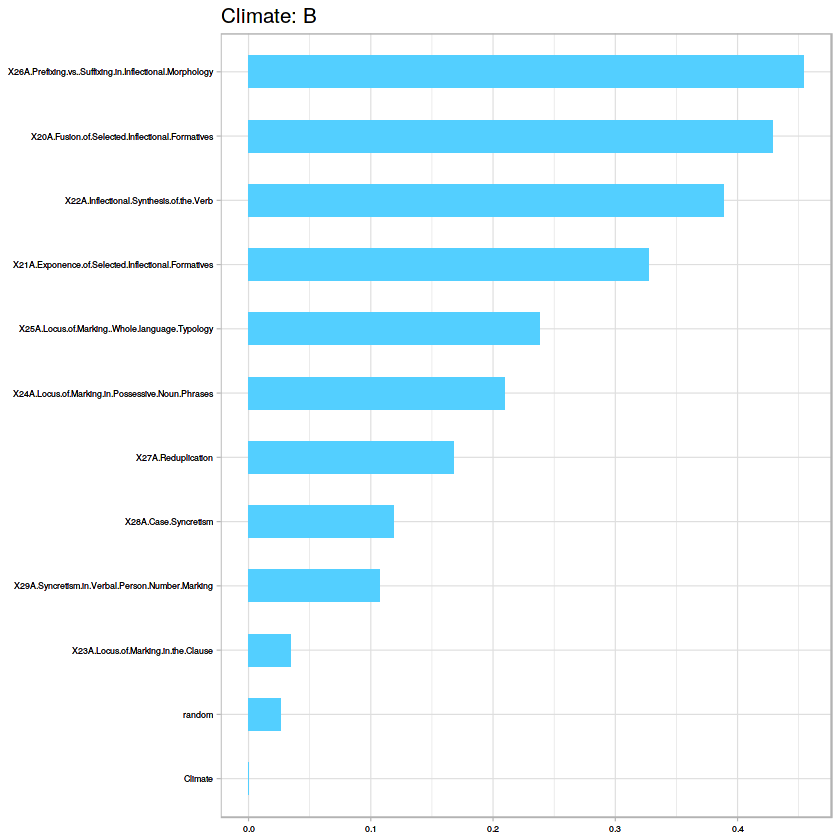

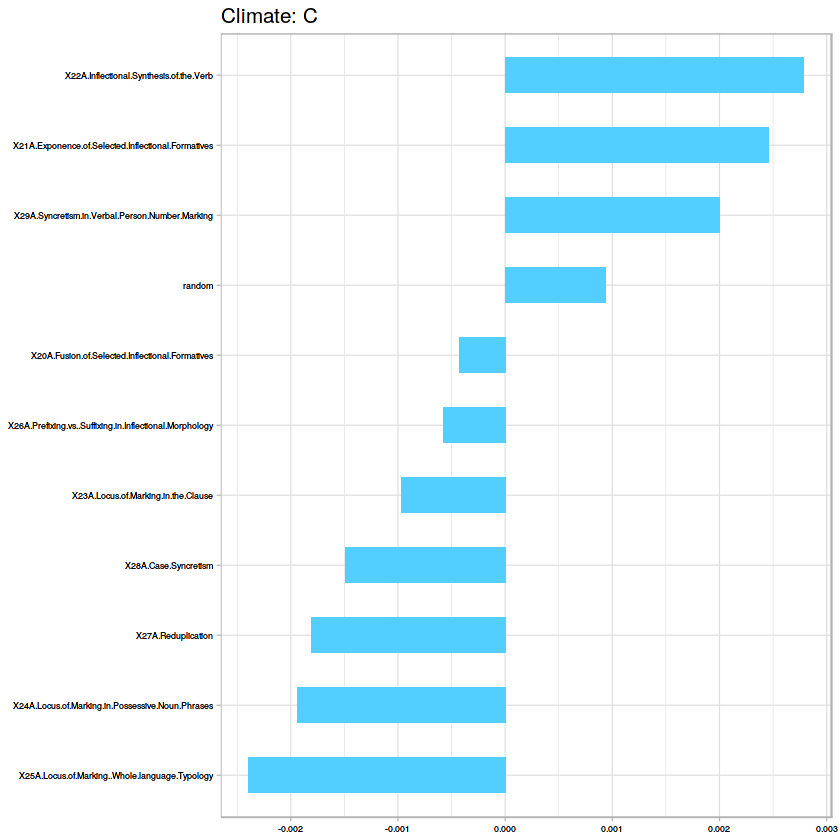

[1] "Accuracy for SVM:70.2173913043478"
   
     C  X
  C  0  0
  X 27 65
   
     C  X
  C  0  0
  X 27 65
[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.8063098
[1] C-V accuracy for Random Forest is 0.891228070175439
[1] "RF Confusion Matrix:"
   
     D  X
  D  0  0
  X 10 82


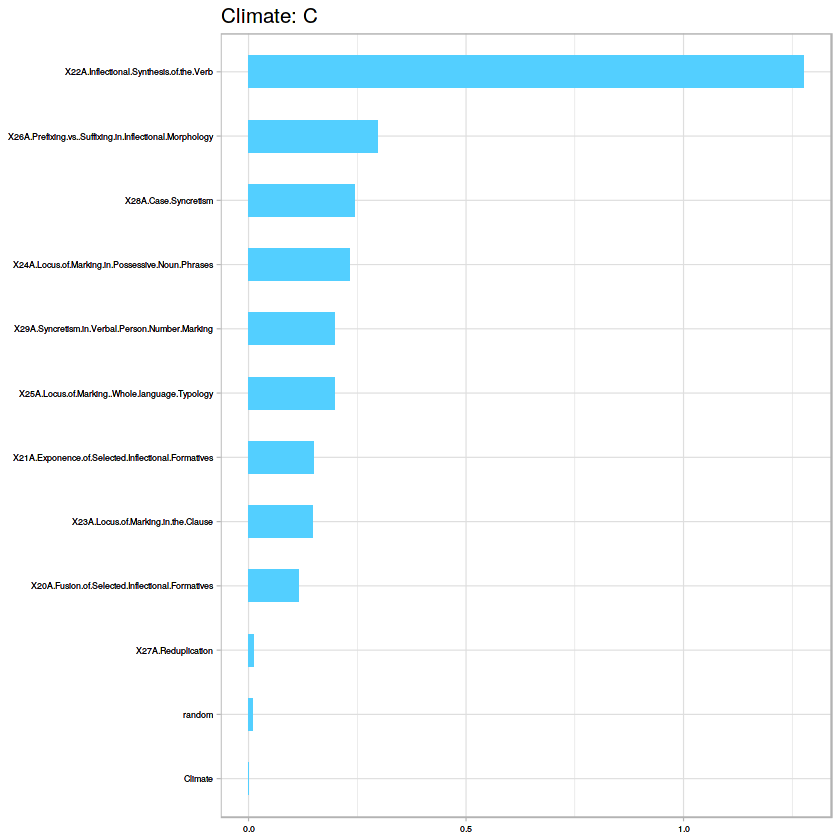

[1] "Accuracy for SVM:89.1304347826087"
   
     D  X
  D  0  0
  X 10 82
   
     D  X
  D  0  0
  X 10 82
[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9371793


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

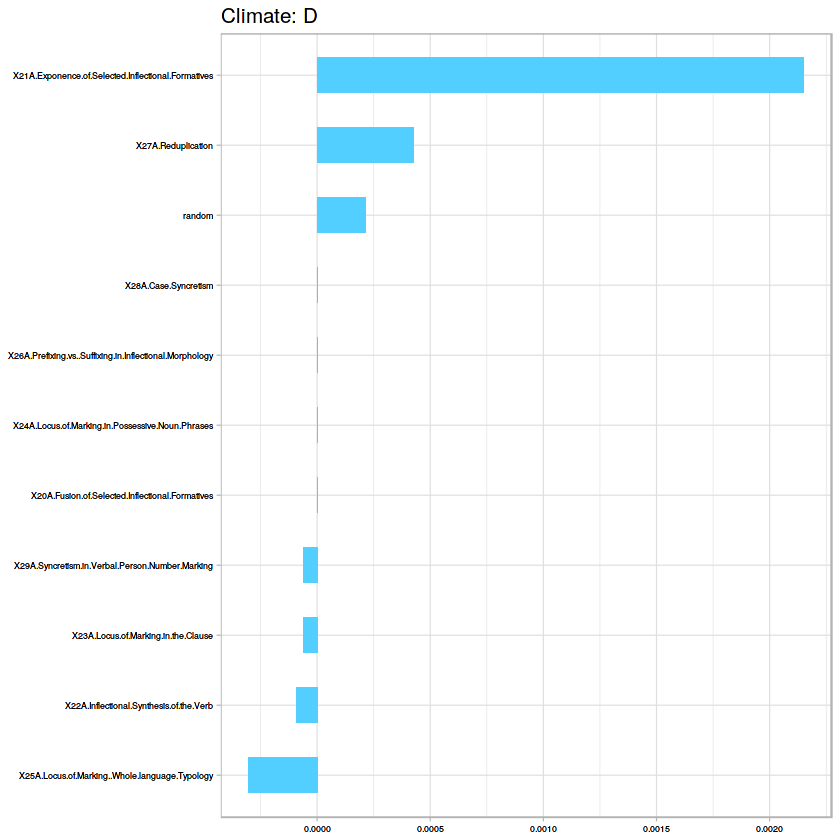

[1] C-V accuracy for Random Forest is 0.9682261208577
[1] "RF Confusion Matrix:"
   
     E  X
  E  0  0
  X  3 89


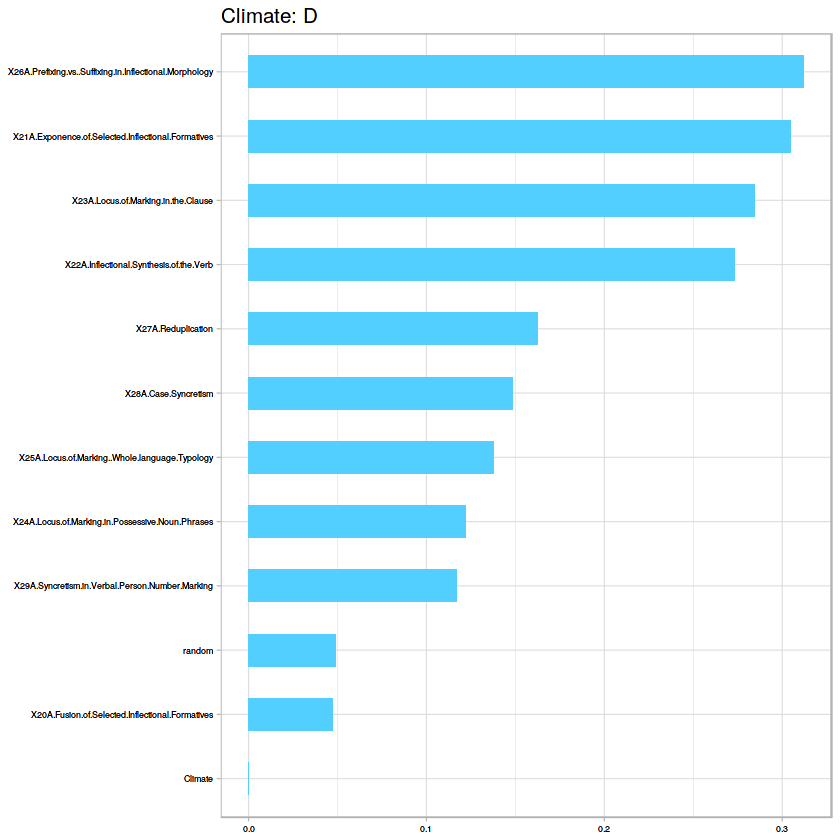

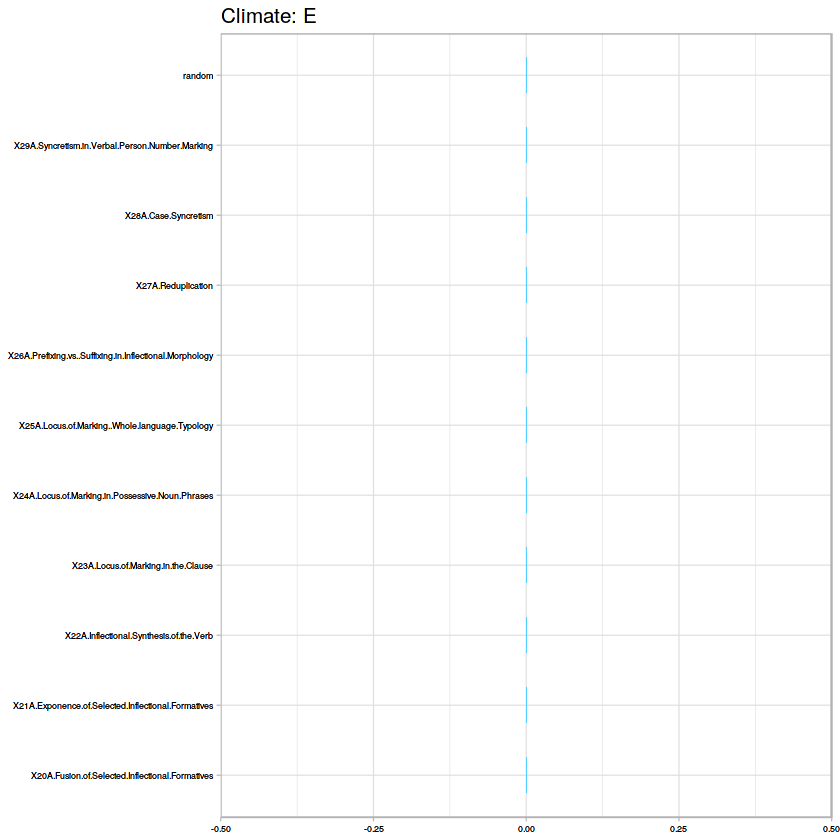

[1] "Accuracy for SVM:96.7391304347826"
   
     E  X
  E  0  0
  X  3 89
   
     E  X
  E  0  0
  X  3 89


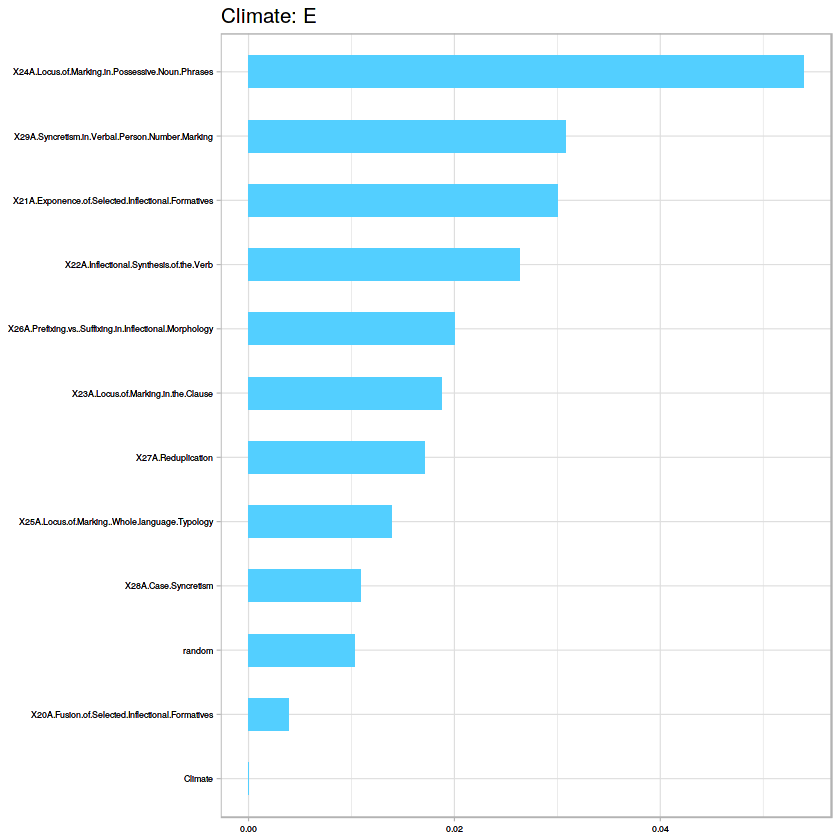

In [370]:
ovsa(morp_df)

[1] "A" "B"
[1] 0.5490385
[1] "Dummy Classifier accuracy:0.549038461538462"
[1] "C-V accuracy for Random Forest is  0.64530303030303"
[1] 0.645303
[1] "RF Confusion Matrix:"
   
     A  B
  A 34 17
  B  0  1


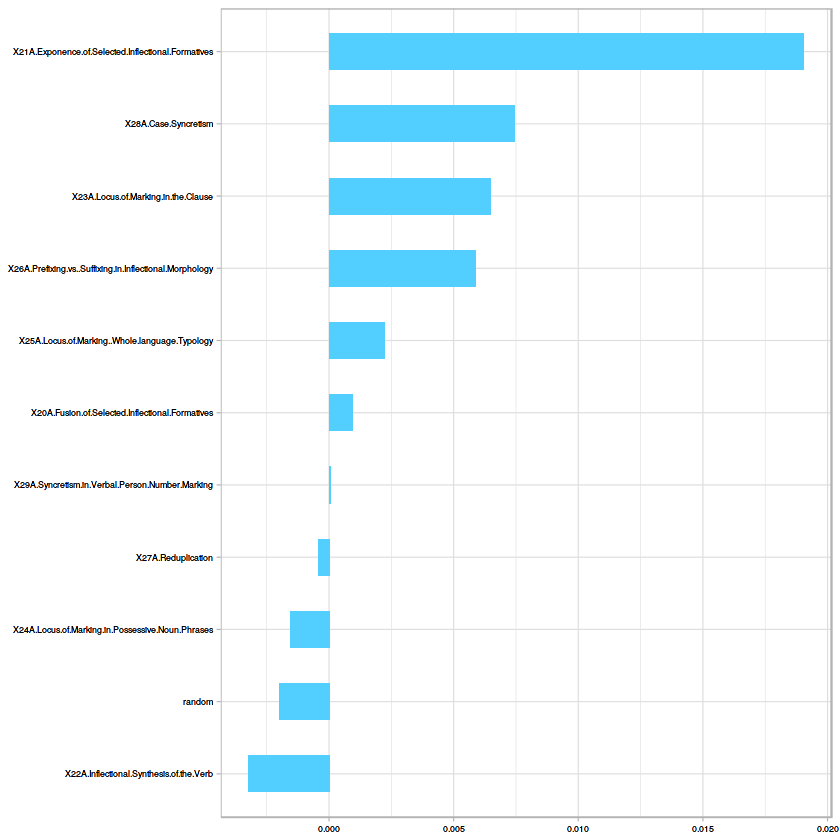

[1] "Accuracy for SVM:63.0769230769231"
   
     A  B
  A 34 12
  B  0  6
   
     A  B
  A 34 12
  B  0  6
[1] "A" "C"
[1] 0.5073115
[1] "Dummy Classifier accuracy:0.507311475409836"
[1] "C-V accuracy for Random Forest is  0.611334498834499"
[1] 0.6113345
[1] "RF Confusion Matrix:"
   
     A  C
  A 27  7
  C  7 20


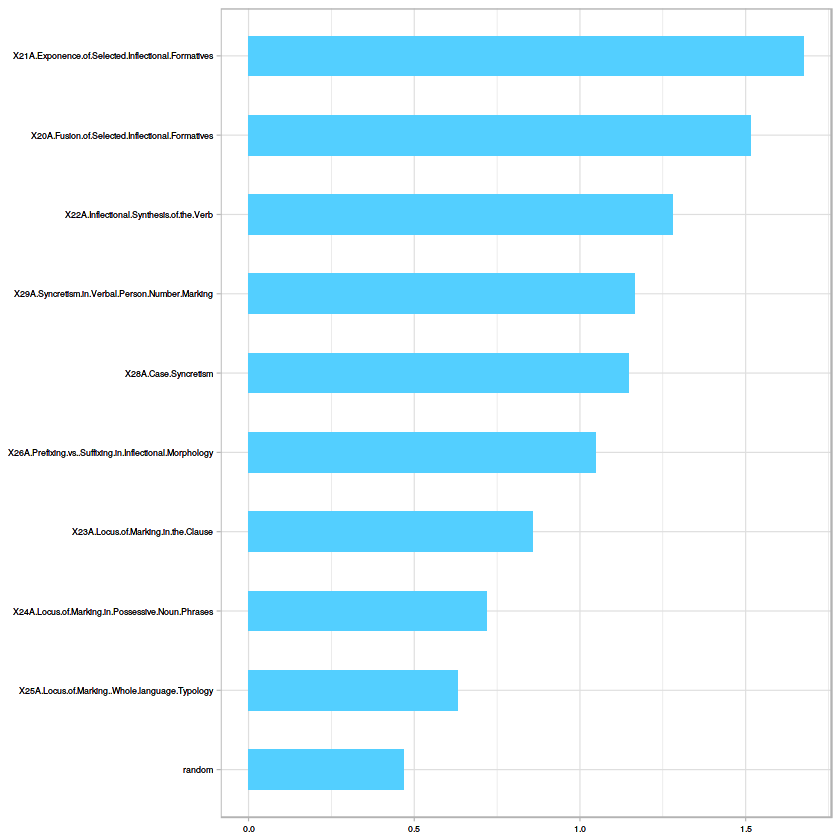

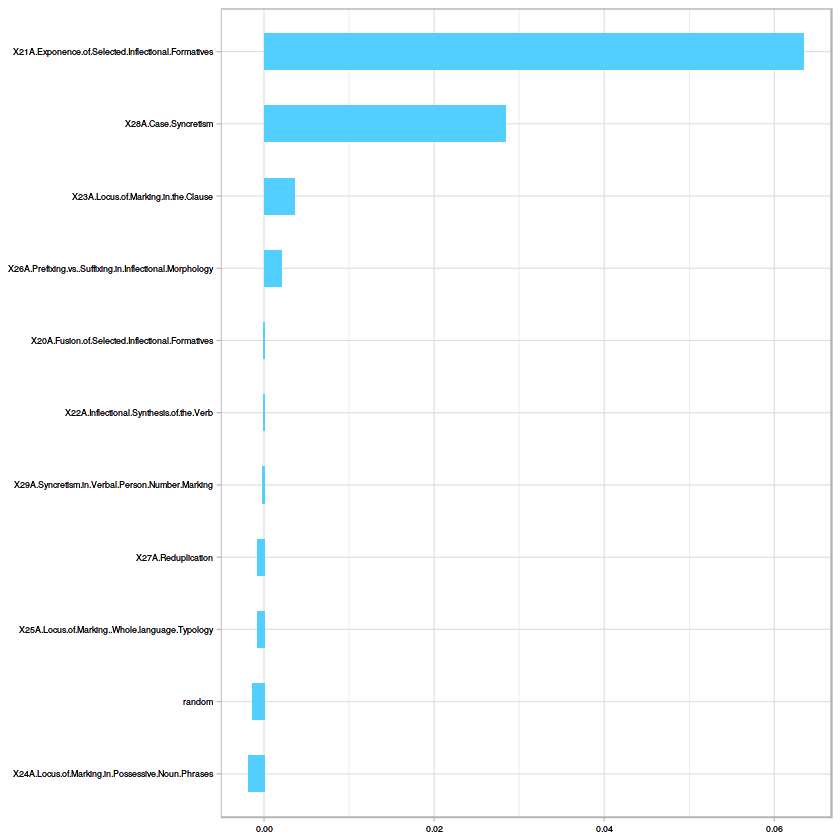

[1] "Accuracy for SVM:62.6229508196721"
   
     A  C
  A 30  4
  C  4 23
   
     A  C
  A 30  4
  C  4 23
[1] "A" "D"
[1] 0.6474773
[1] "Dummy Classifier accuracy:0.647477272727273"
[1] "C-V accuracy for Random Forest is  0.766666666666667"
[1] 0.7666667
[1] "RF Confusion Matrix:"
   
     A  D
  A 34 10
  D  0  0


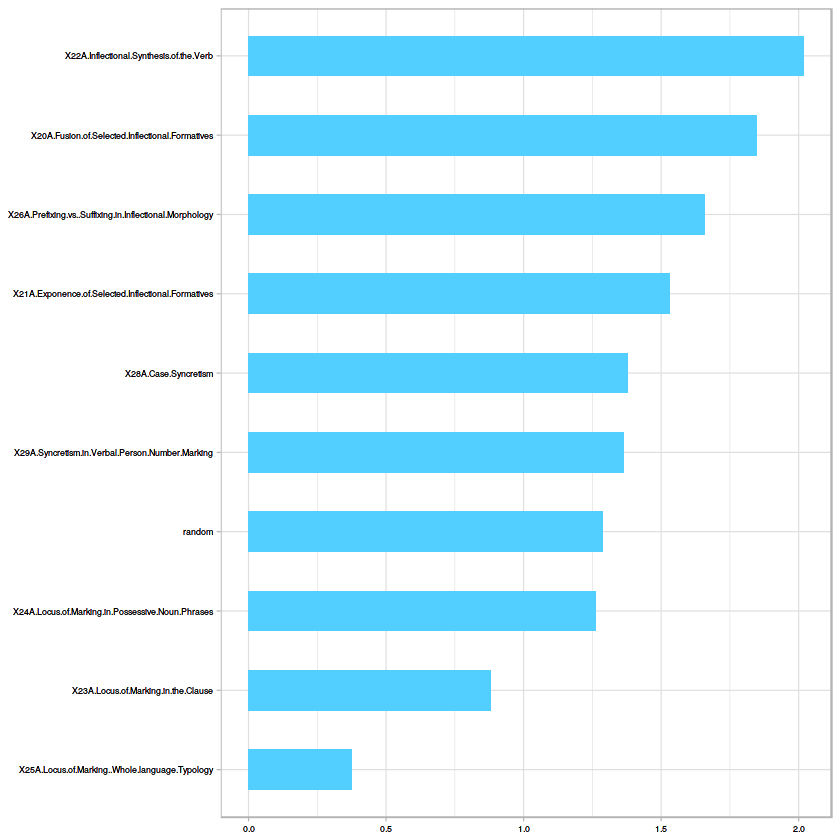

[1] "Accuracy for SVM:78.6363636363636"
   
     A  D
  A 34  5
  D  0  5
   
     A  D
  A 34  5
  D  0  5
[1] "A" "E"
[1] 0.8517838
[1] "Dummy Classifier accuracy:0.851783783783784"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

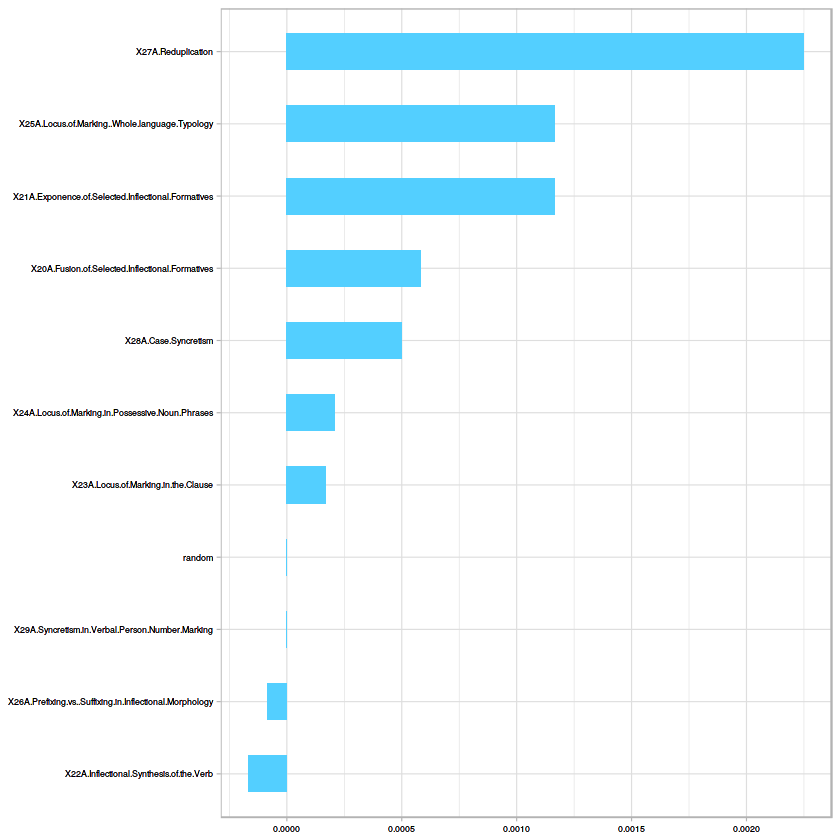

[1] "C-V accuracy for Random Forest is  "
numeric(0)
[1] "RF Confusion Matrix:"
   
     A  E
  A 34  3
  E  0  0


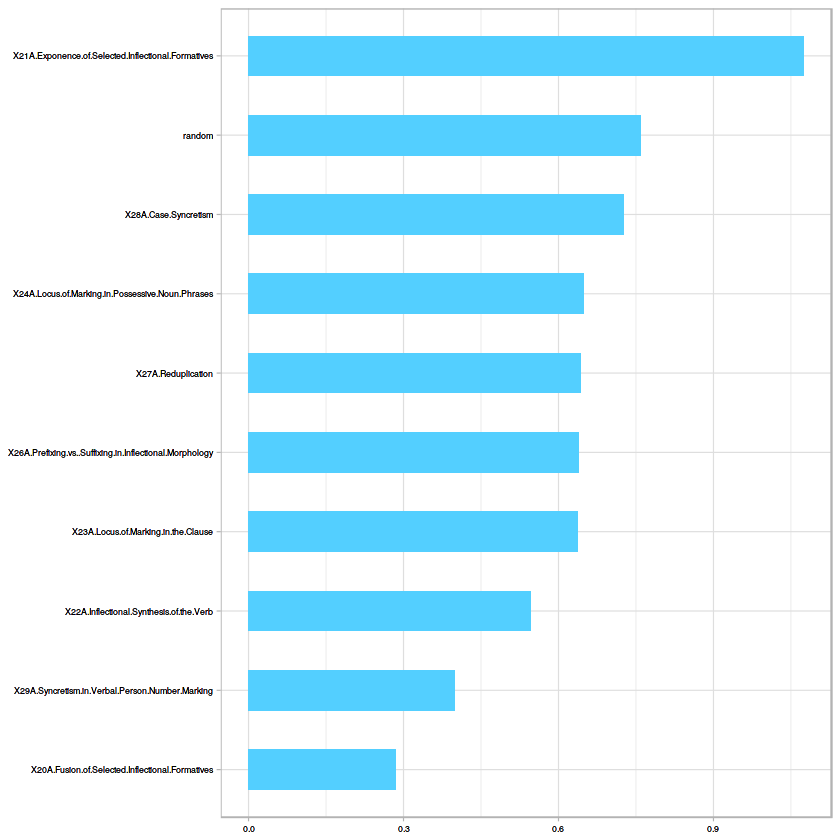

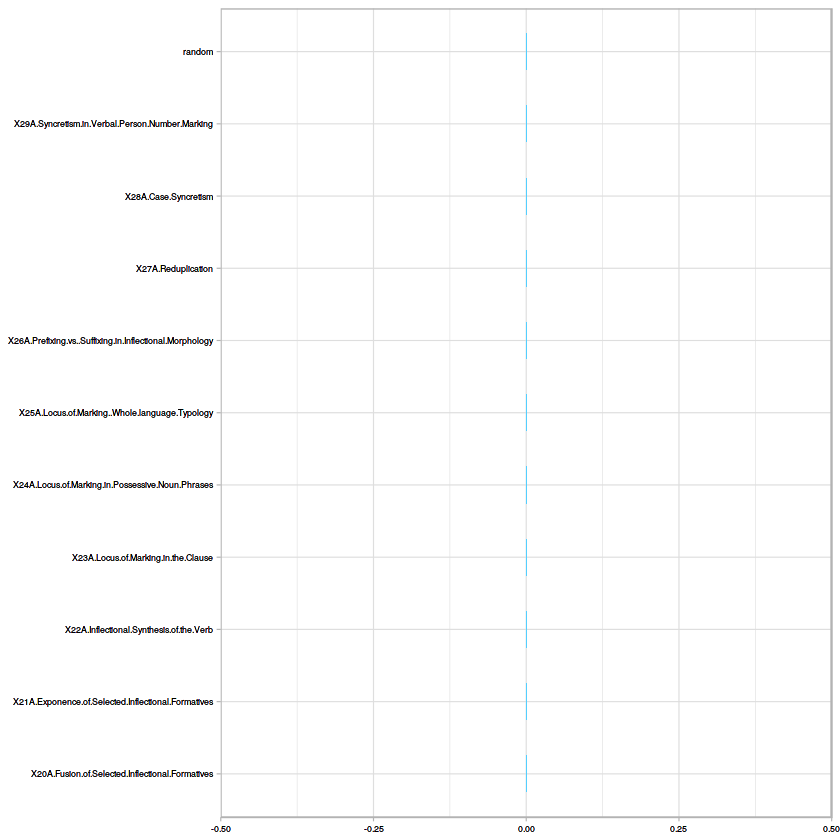

[1] "Accuracy for SVM:91.8918918918919"
   
     A  E
  A 34  3
  E  0  0
   
     A  E
  A 34  3
  E  0  0
[1] "B" "C"
[1] 0.5190222
[1] "Dummy Classifier accuracy:0.519022222222222"
[1] "C-V accuracy for Random Forest is  0.535555555555556"
[1] 0.5355556
[1] "RF Confusion Matrix:"
   
     B  C
  B  0  0
  C 18 27


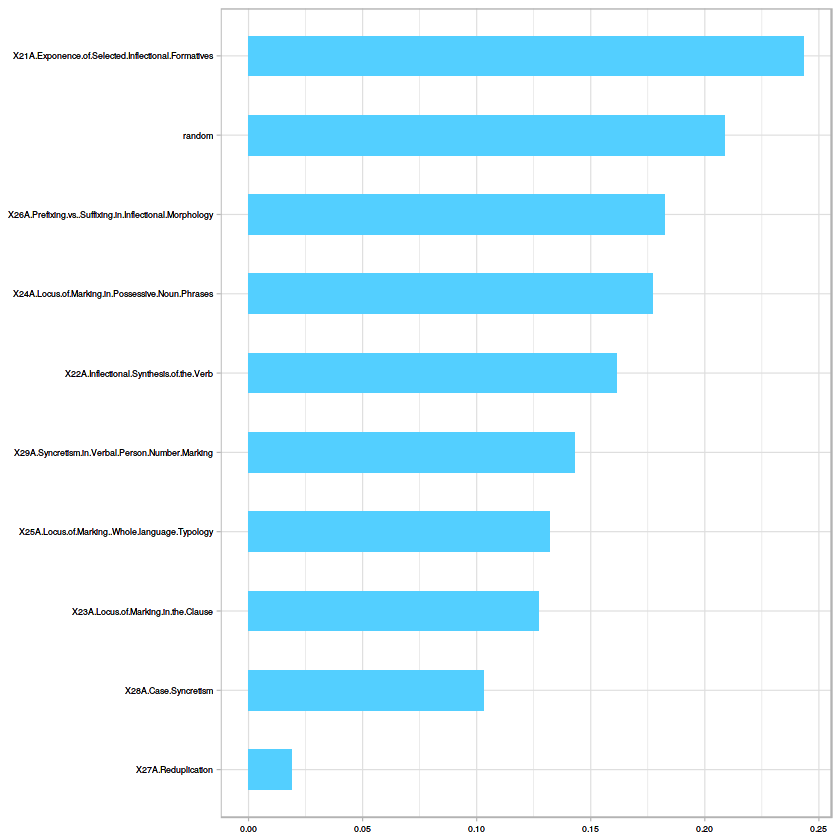

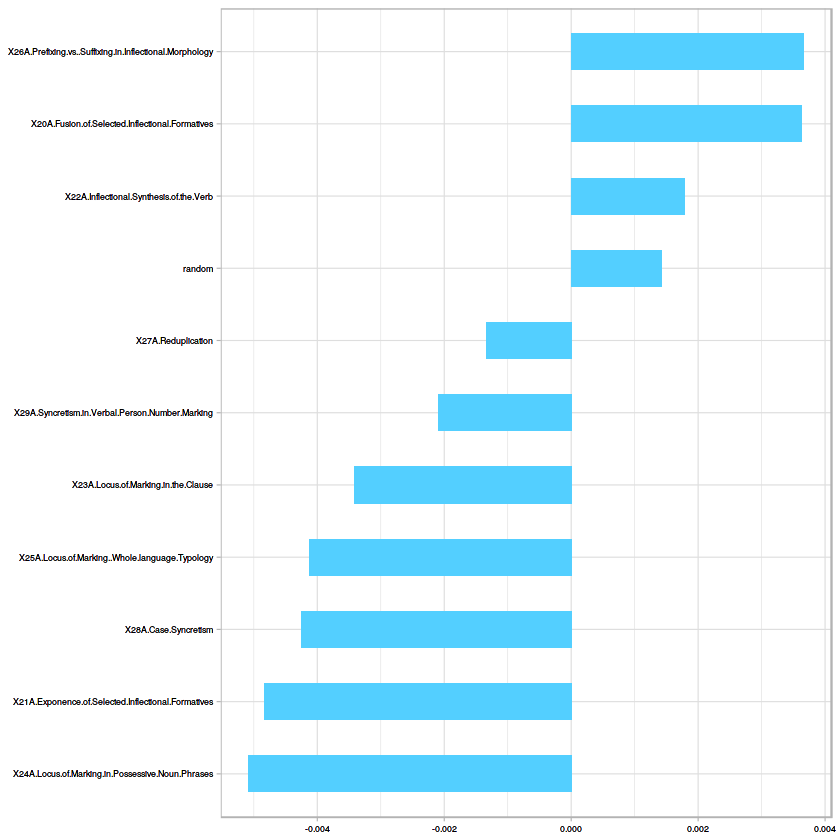

[1] "Accuracy for SVM:48"
   
     B  C
  B  6  0
  C 12 27
   
     B  C
  B  6  0
  C 12 27
[1] "B" "D"
[1] 0.5432321
[1] "Dummy Classifier accuracy:0.543232142857143"
[1] "C-V accuracy for Random Forest is  "
numeric(0)
[1] "RF Confusion Matrix:"
   
     B  D
  B 18 10
  D  0  0


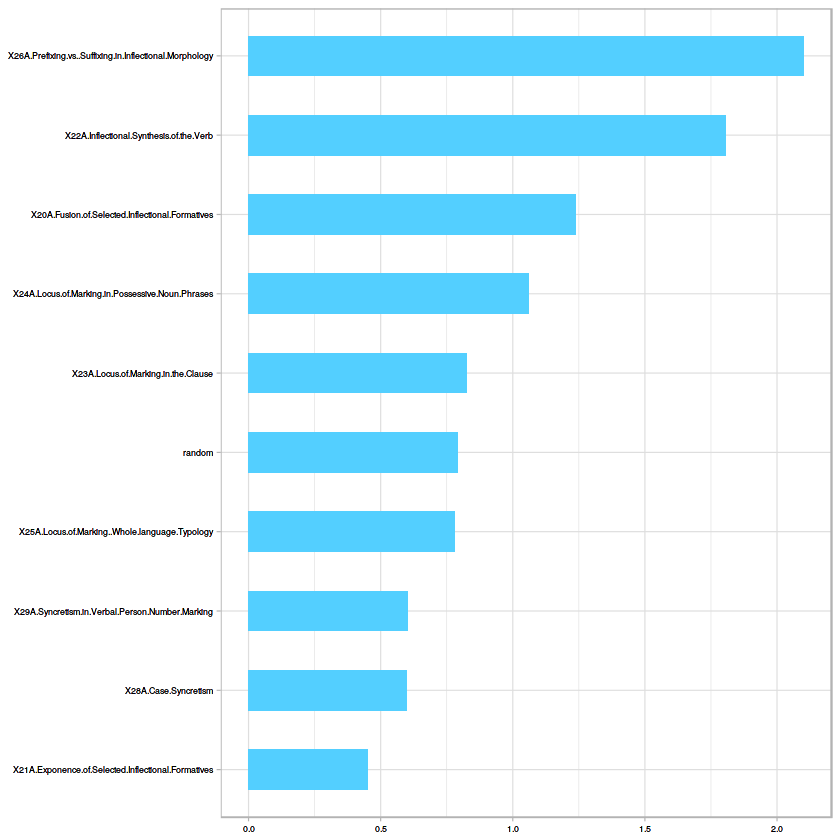

[1] "Accuracy for SVM:66.4285714285714"
   
     B  D
  B 18  1
  D  0  9
   
     B  D
  B 18  1
  D  0  9
[1] "B" "E"
[1] 0.7532857
[1] "Dummy Classifier accuracy:0.753285714285714"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

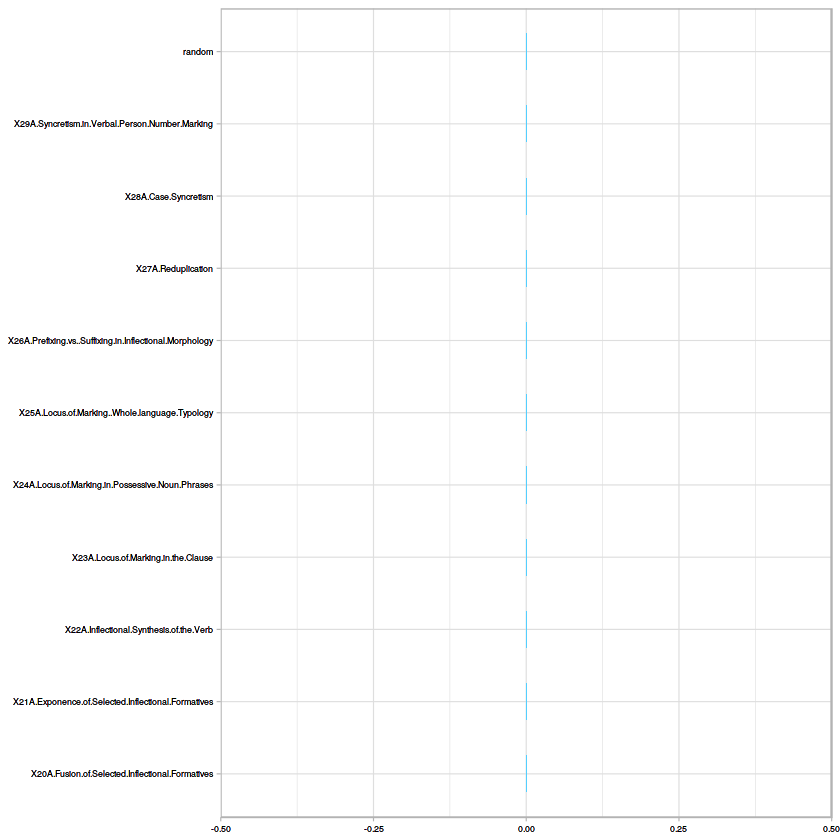

[1] "C-V accuracy for Random Forest is  "
numeric(0)
[1] "RF Confusion Matrix:"
   
     B  E
  B 18  3
  E  0  0


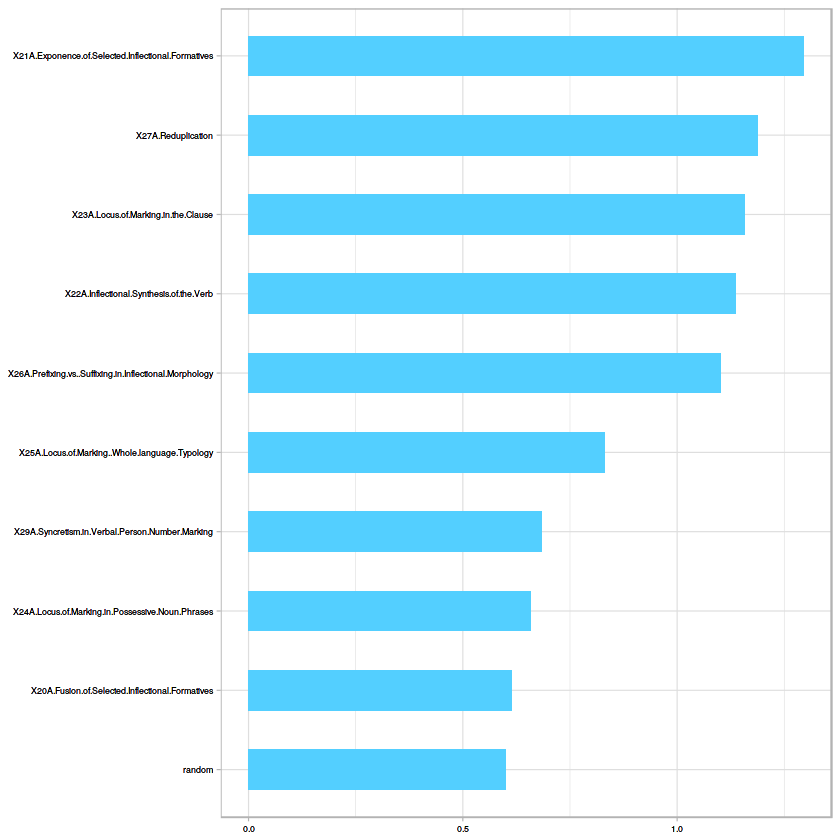

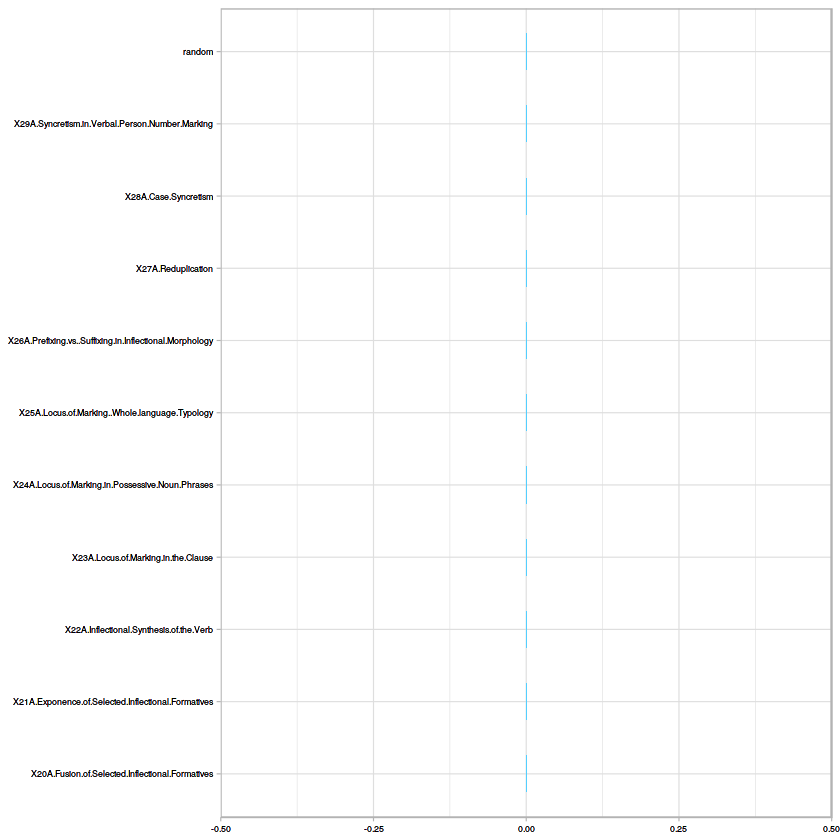

[1] "Accuracy for SVM:83.8095238095238"
   
     B  E
  B 18  3
  E  0  0
   
     B  E
  B 18  3
  E  0  0
[1] "C" "D"
[1] 0.6055676
[1] "Dummy Classifier accuracy:0.605567567567568"
[1] "C-V accuracy for Random Forest is  "
numeric(0)
[1] "RF Confusion Matrix:"
   
     C  D
  C 27 10
  D  0  0


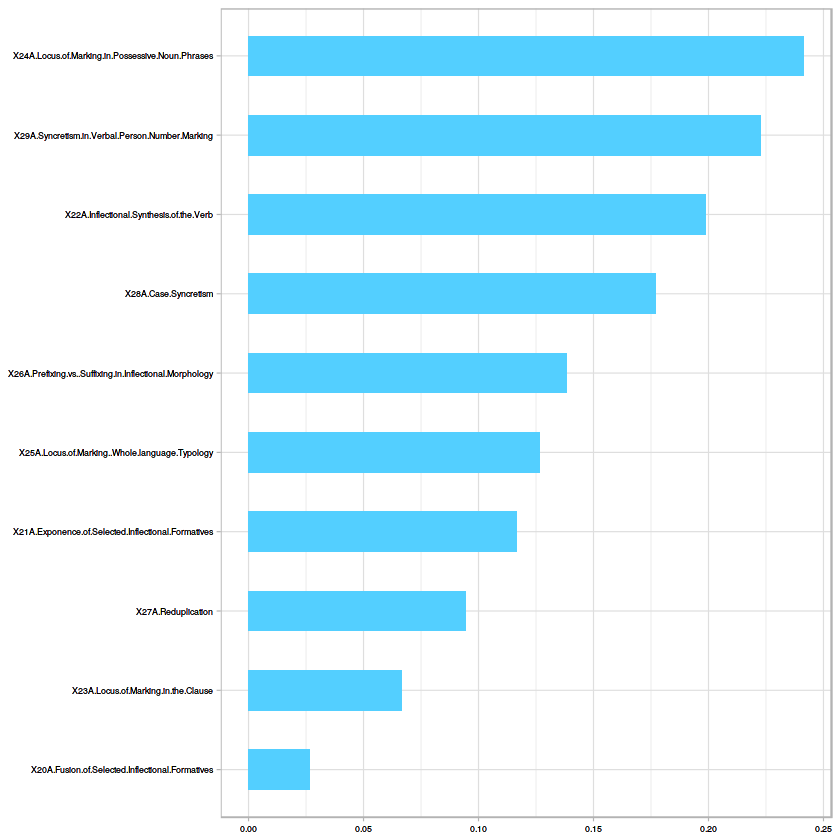

[1] "Accuracy for SVM:67.027027027027"
   
     C  D
  C 27  8
  D  0  2
   
     C  D
  C 27  8
  D  0  2
[1] "C" "E"
[1] 0.8184
[1] "Dummy Classifier accuracy:0.8184"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

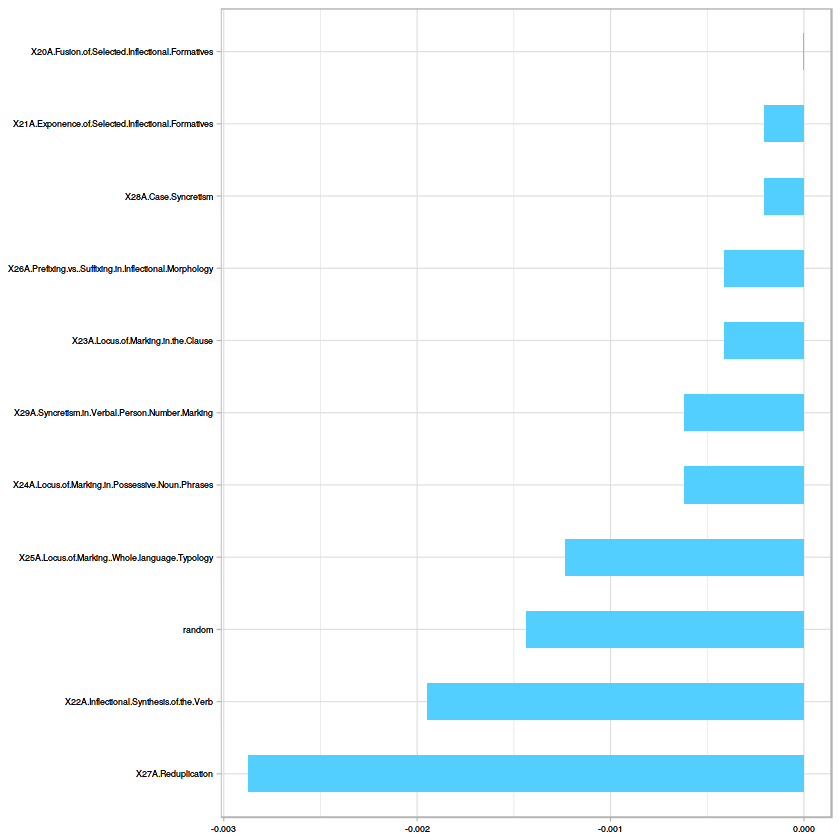

[1] "C-V accuracy for Random Forest is  "
numeric(0)
[1] "RF Confusion Matrix:"
   
     C  E
  C 27  3
  E  0  0


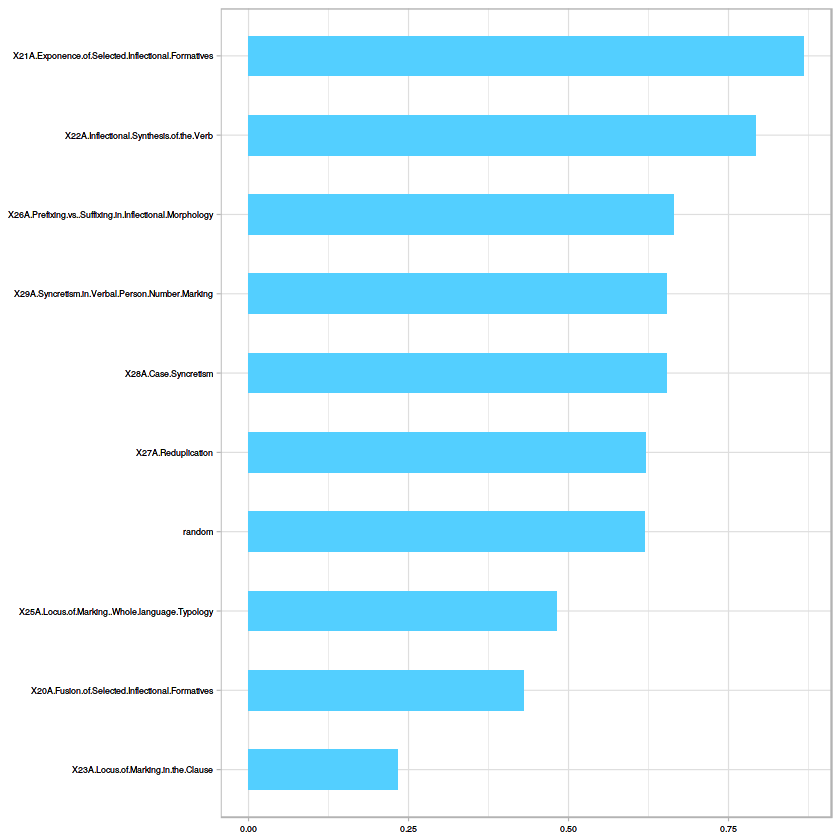

[1] "Accuracy for SVM:90"
   
     C  E
  C 27  3
  E  0  0
   
     C  E
  C 27  3
  E  0  0
[1] "D" "E"
[1] 0.6469231
[1] "Dummy Classifier accuracy:0.646923076923077"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

[1] "C-V accuracy for Random Forest is  "
numeric(0)


ERROR: Error in model@fit(data, ...): fraction of 0.000000 is too small


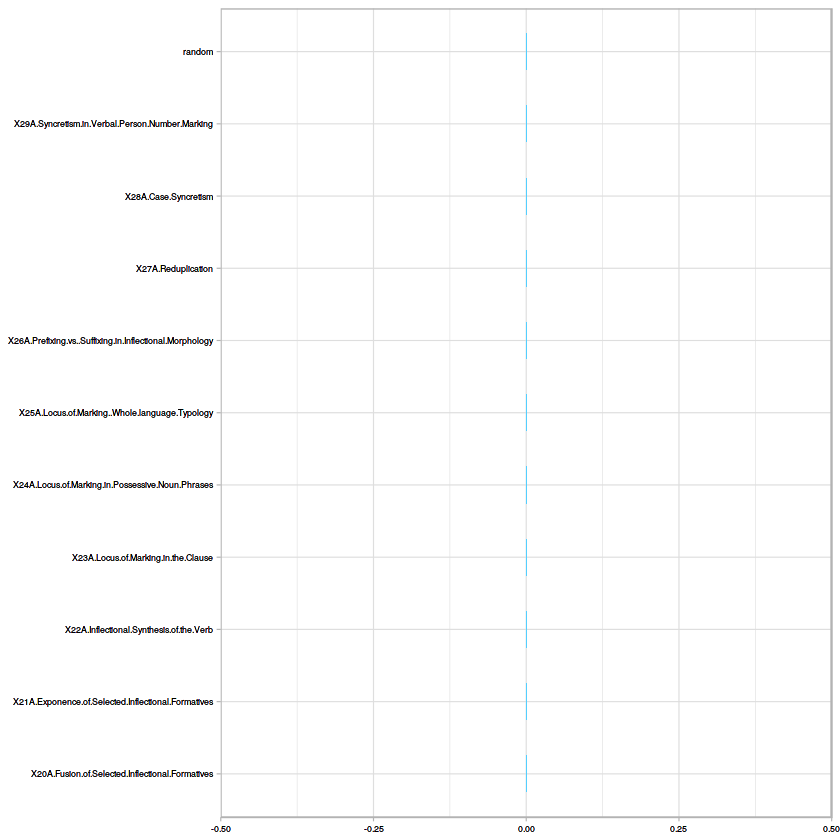

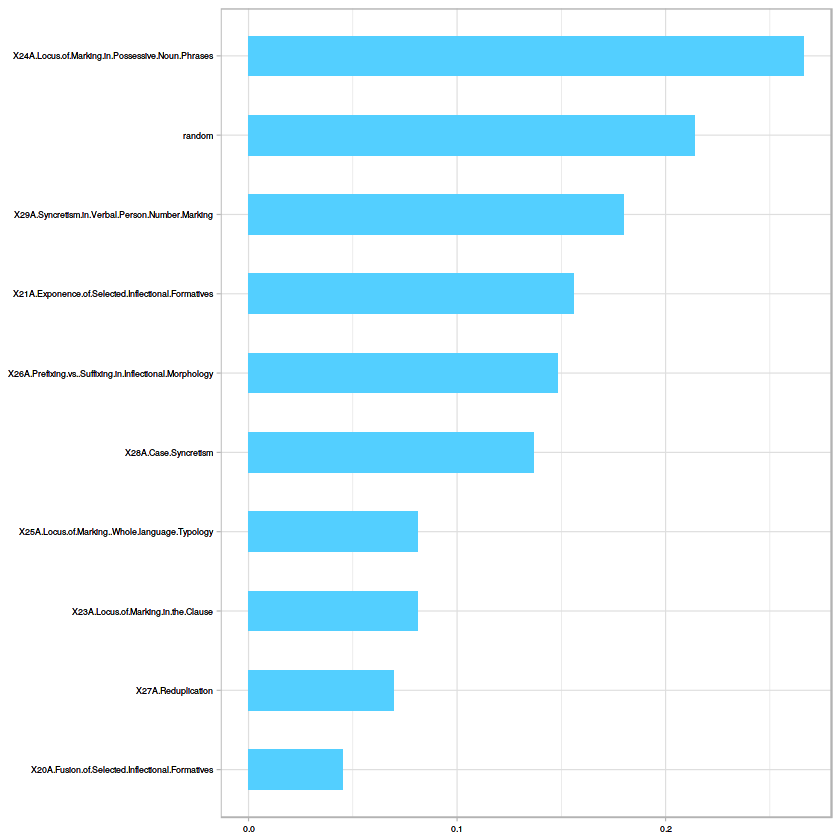

In [103]:
ovo(morp_df)

In [101]:
nrow(na.omit(lang_df[,c(86:102,152,167)]))

[1] 102

[1] "Climate: "
[1] "A" "B"
[1] "Dummy Classifier"
[1] 0.5070543
[1] 0.5070543
[1] "C-V accuracy for Random Forest is  0.569883040935673"
[1] "0.569883040935673"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 47 11
  Z  5 29


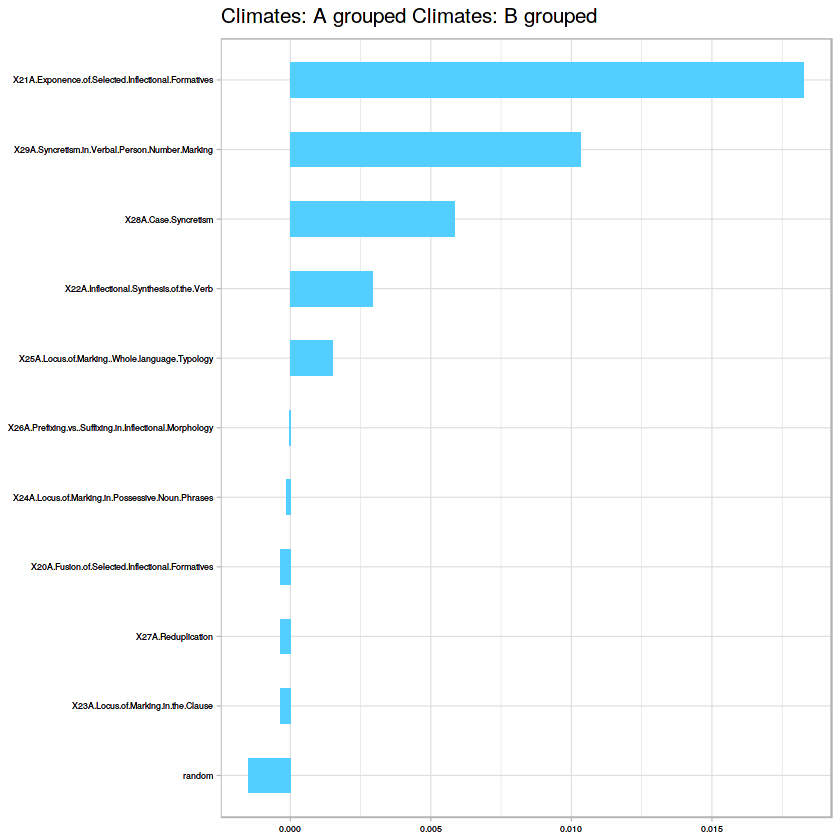

[1] "Accuracy for SVM:58.0434782608696"
   
     Y  Z
  Y 48 15
  Z  4 25
[1] "Climate: "
[1] "A" "C"
[1] "Dummy Classifier"
[1] 0.5515652
[1] 0.5515652
[1] "C-V accuracy for Random Forest is  0.628114035087719"
[1] "0.628114035087719"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 61 31
  Z  0  0


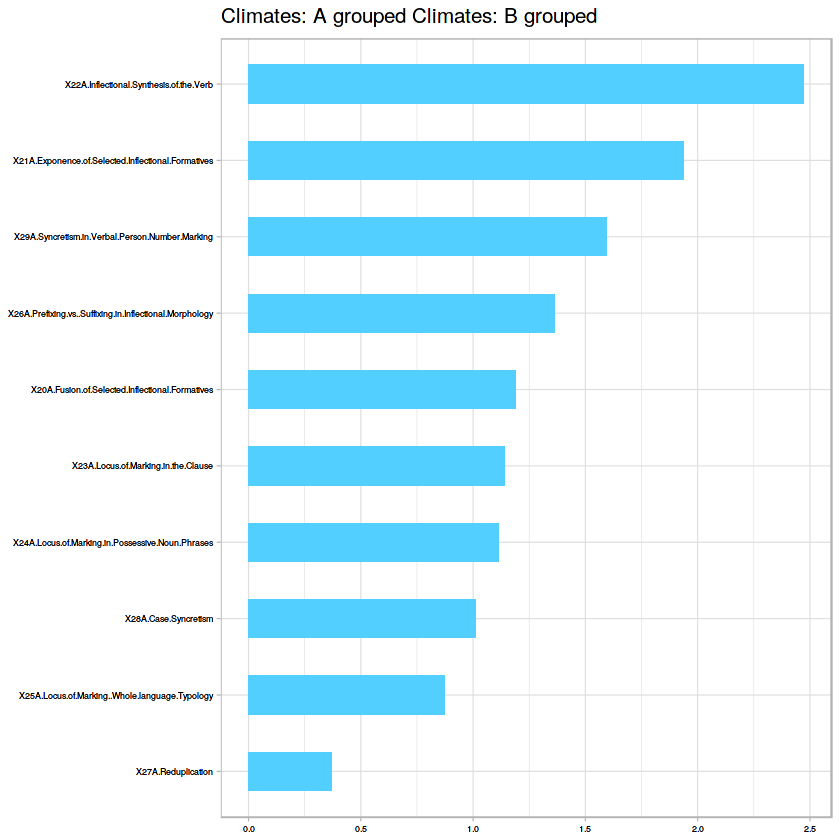

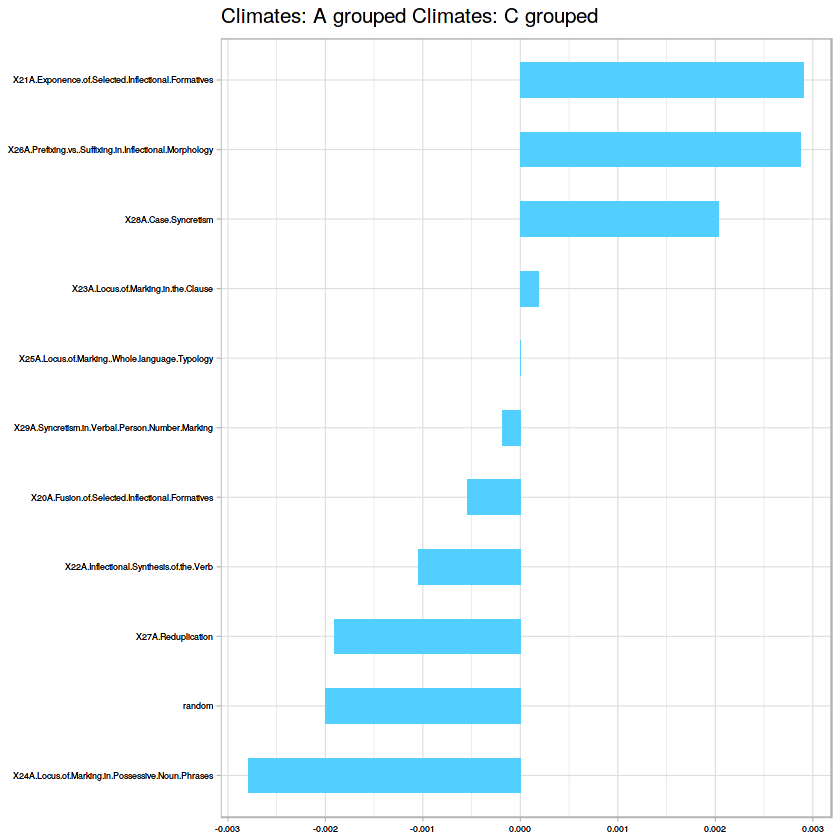

[1] "Accuracy for SVM:62.3913043478261"
   
     Y  Z
  Y 61 29
  Z  0  2
[1] "Climate: "
[1] "A" "D"
[1] "Dummy Classifier"
[1] 0.5012609
[1] 0.5012609
[1] "C-V accuracy for Random Forest is  0.621972824217406"
[1] "0.621972824217406"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 32 12
  Z 12 36


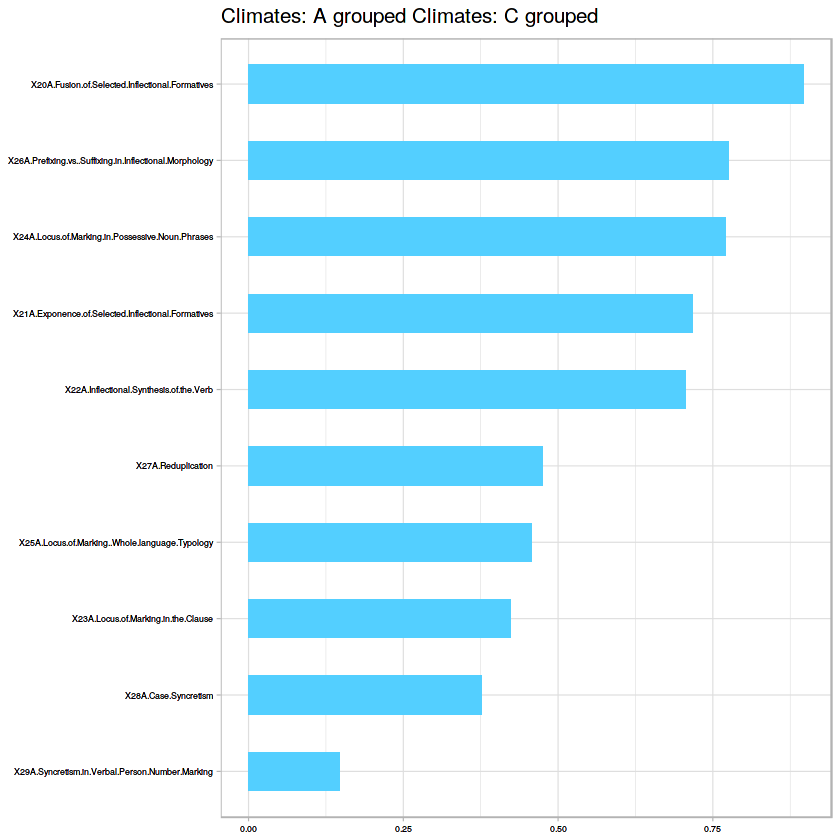

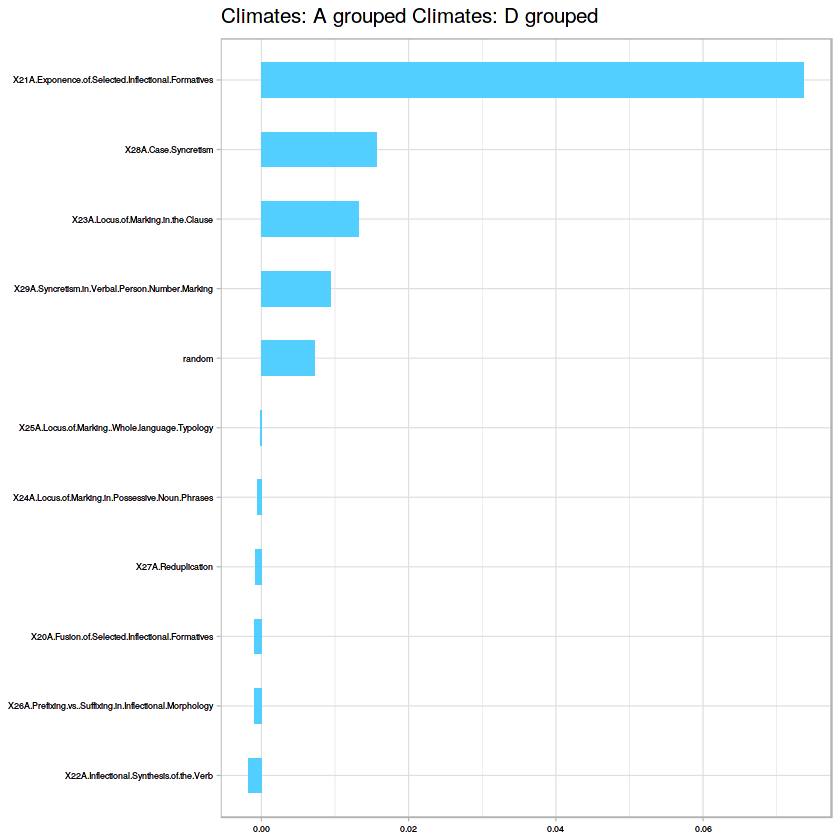

[1] "Accuracy for SVM:57.1739130434783"
   
     Y  Z
  Y 33  9
  Z 11 39
[1] "Climate: "
[1] "A" "E"
[1] "Dummy Classifier"
[1] 0.5191304
[1] 0.5191304
[1] "C-V accuracy for Random Forest is  0.64766081871345"
[1] "0.64766081871345"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 24  4
  Z 13 51


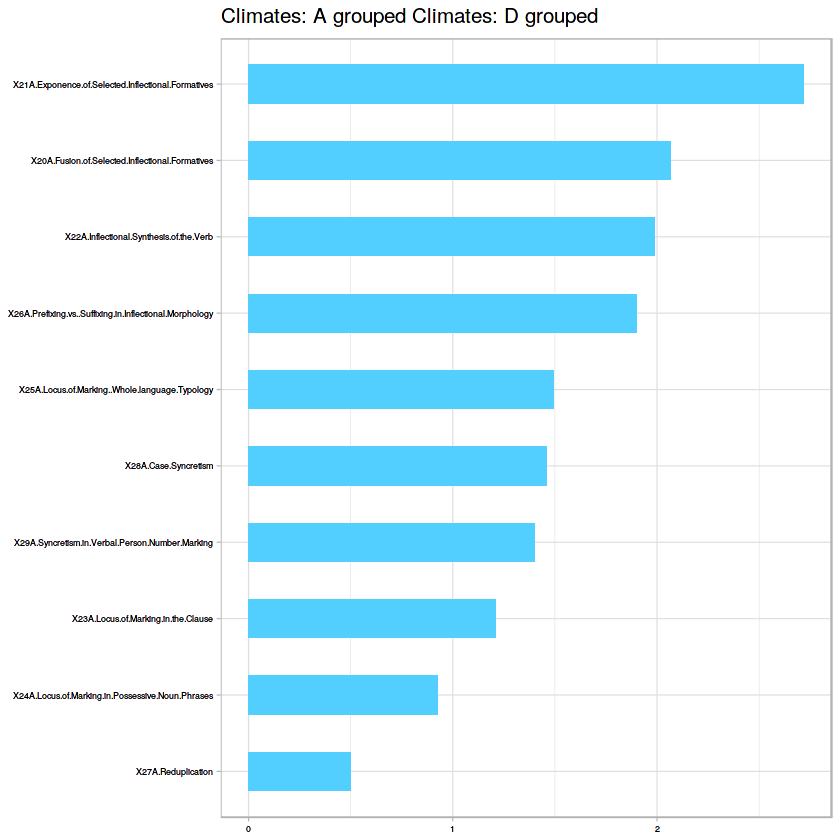

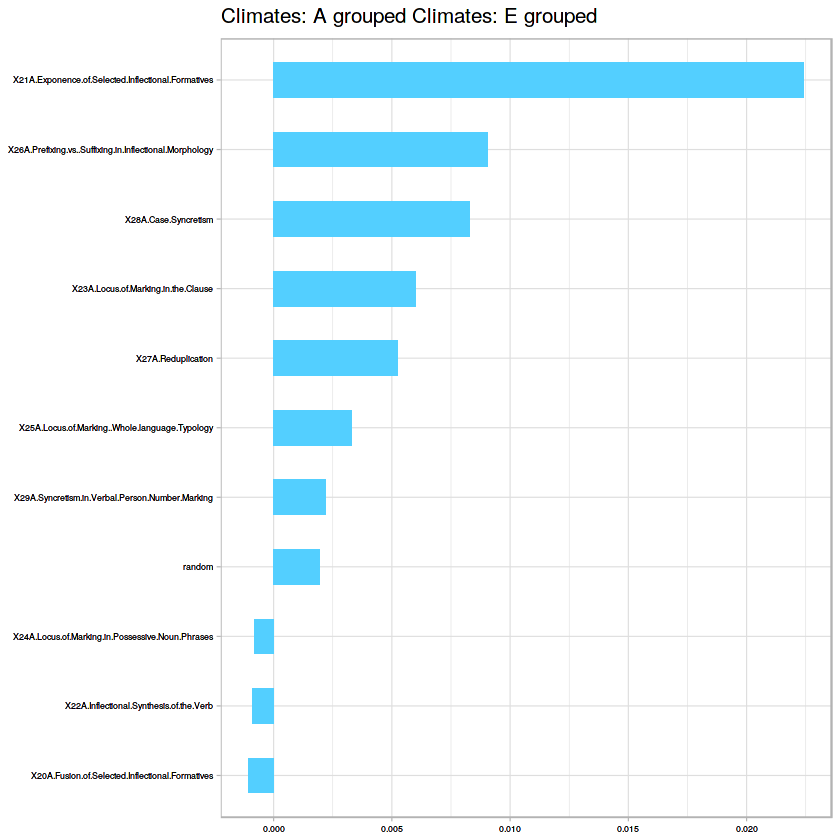

[1] "Accuracy for SVM:64.1304347826087"
   
     Y  Z
  Y 20  3
  Z 17 52
[1] "Climate: "
[1] "B" "C"
[1] "Dummy Classifier"
[1] 0.5003913
[1] 0.5003913
[1] "C-V accuracy for Random Forest is  0.538011695906433"
[1] "0.538011695906433"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 32 12
  Z 13 35


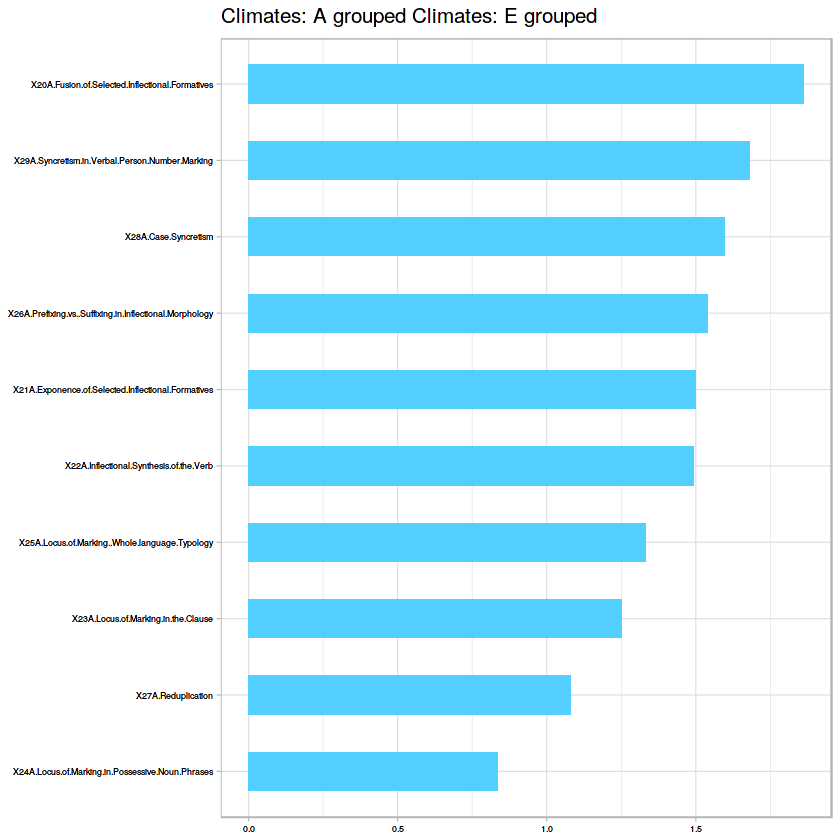

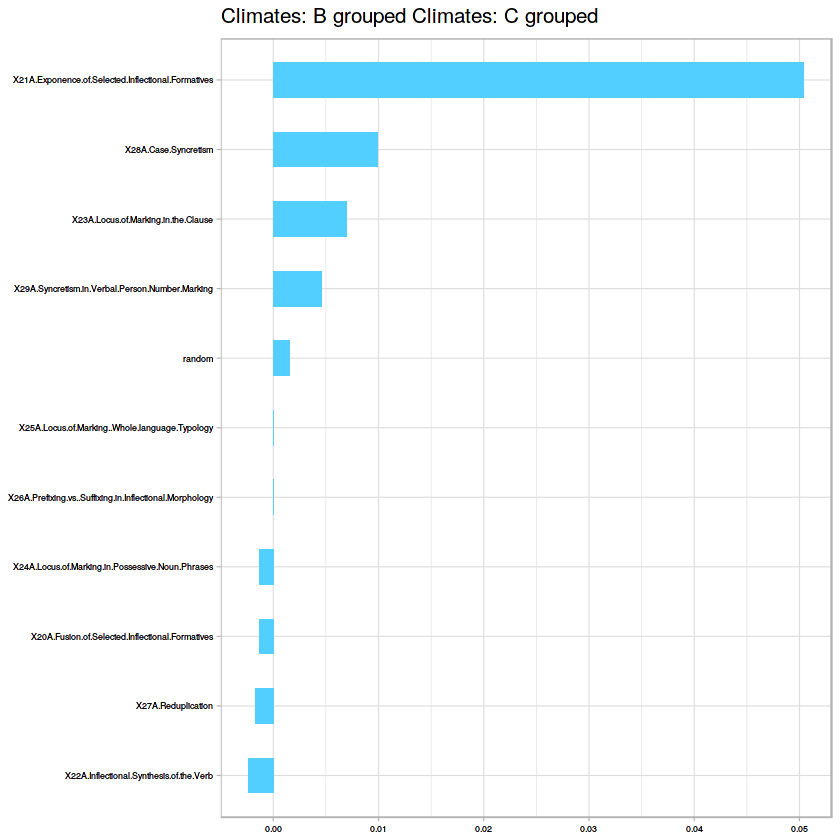

[1] "Accuracy for SVM:50"
   
     Y  Z
  Y 29 12
  Z 16 35
[1] "Climate: "
[1] "B" "D"
[1] "Dummy Classifier"
[1] 0.576875
[1] 0.576875
[1] "C-V accuracy for Random Forest is  0.66609907120743"
[1] "0.66609907120743"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 28 64


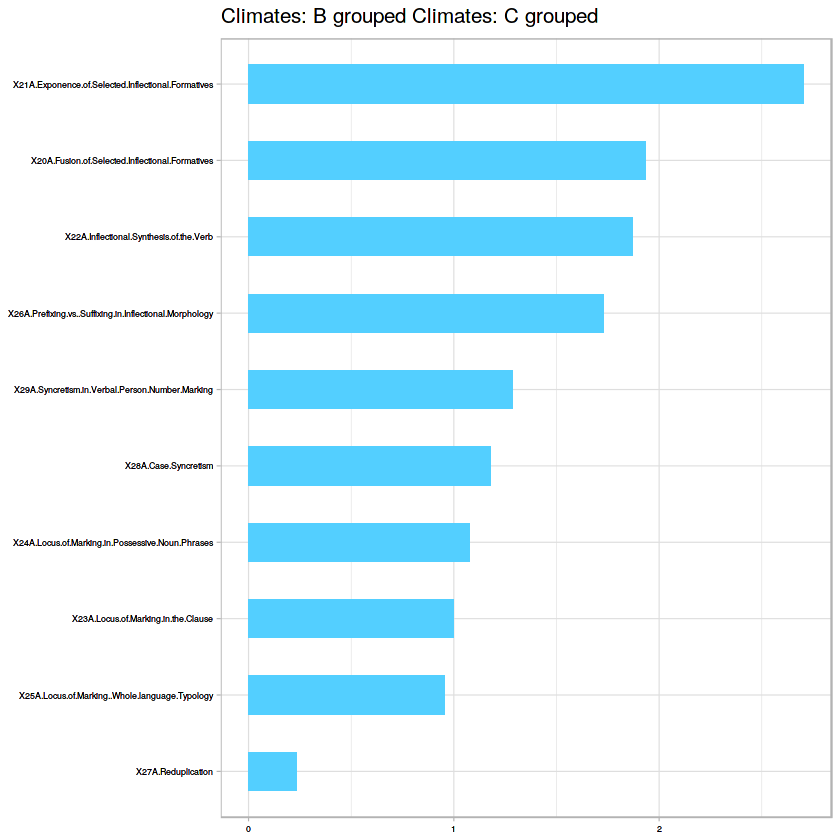

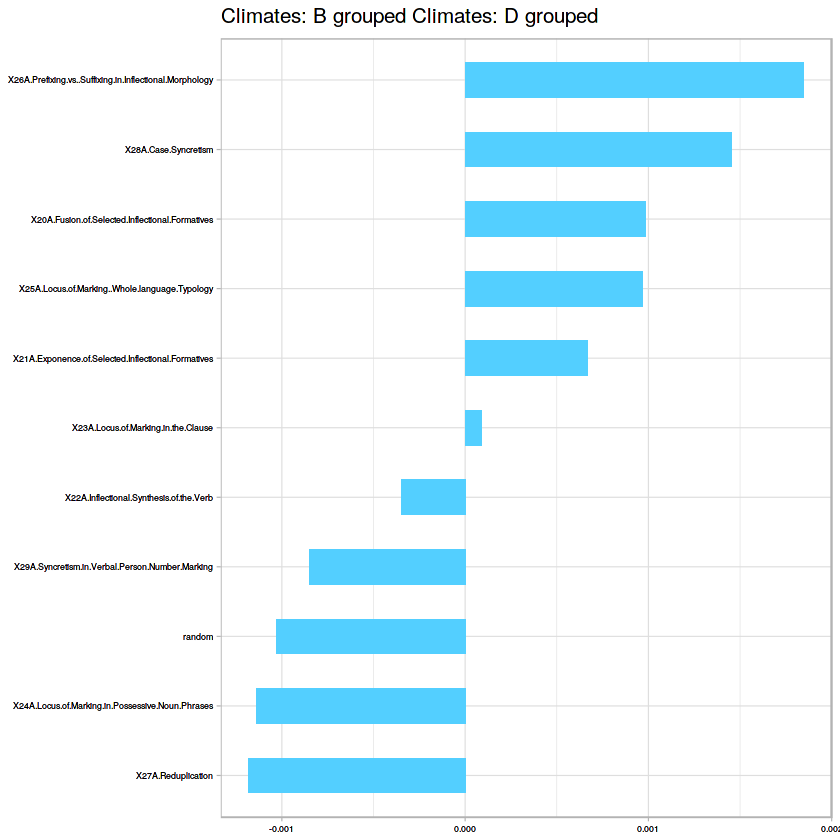

[1] "Accuracy for SVM:69.1304347826087"
   
     Y  Z
  Y  0  0
  Z 28 64
[1] "Climate: "
[1] "B" "E"
[1] "Dummy Classifier"
[1] 0.6475652
[1] 0.6475652
[1] "C-V accuracy for Random Forest is  0.766520467836257"
[1] "0.766520467836257"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 21 71


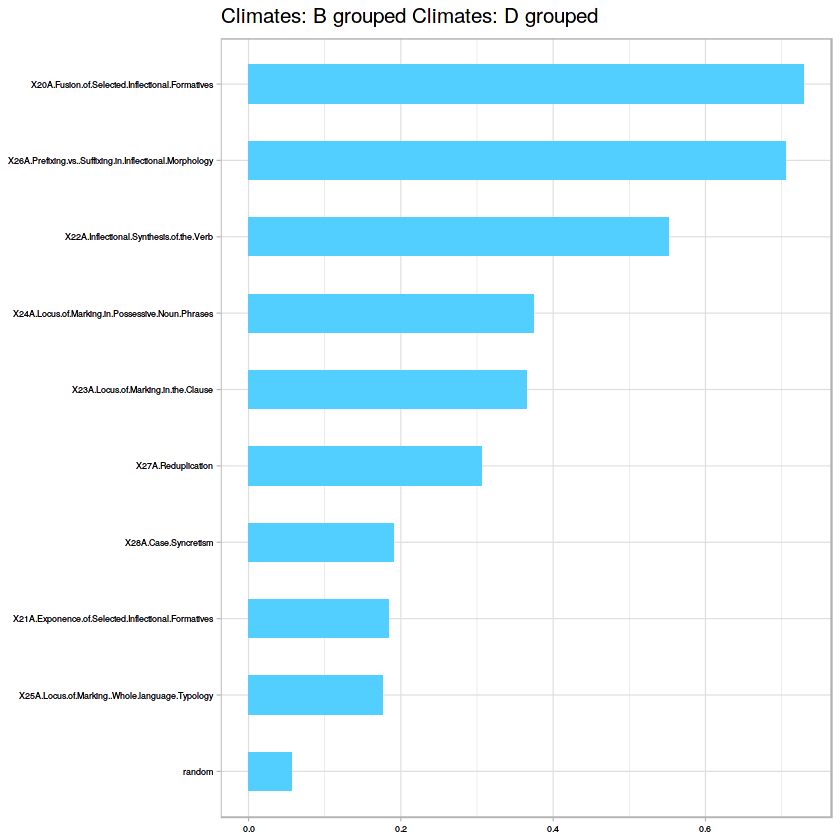

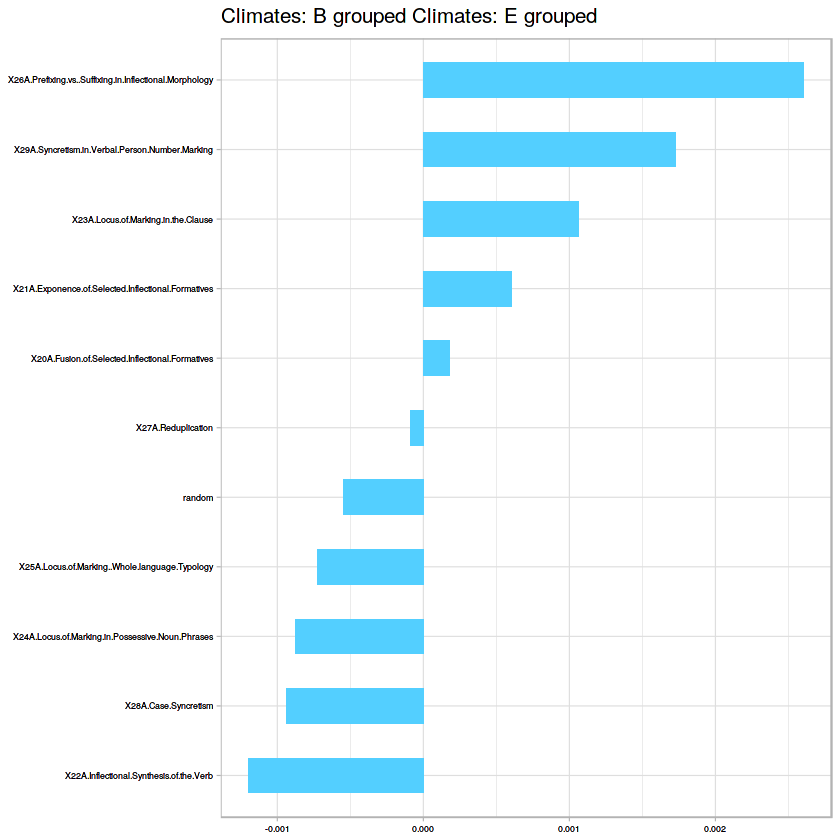

[1] "Accuracy for SVM:76.9565217391304"
   
     Y  Z
  Y  1  0
  Z 20 71
[1] "Climate: "
[1] "C" "D"
[1] "Dummy Classifier"
[1] 0.5193207
[1] 0.5193207
[1] "C-V accuracy for Random Forest is  0.565789473684211"
[1] "0.565789473684211"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 14  2
  Z 23 53


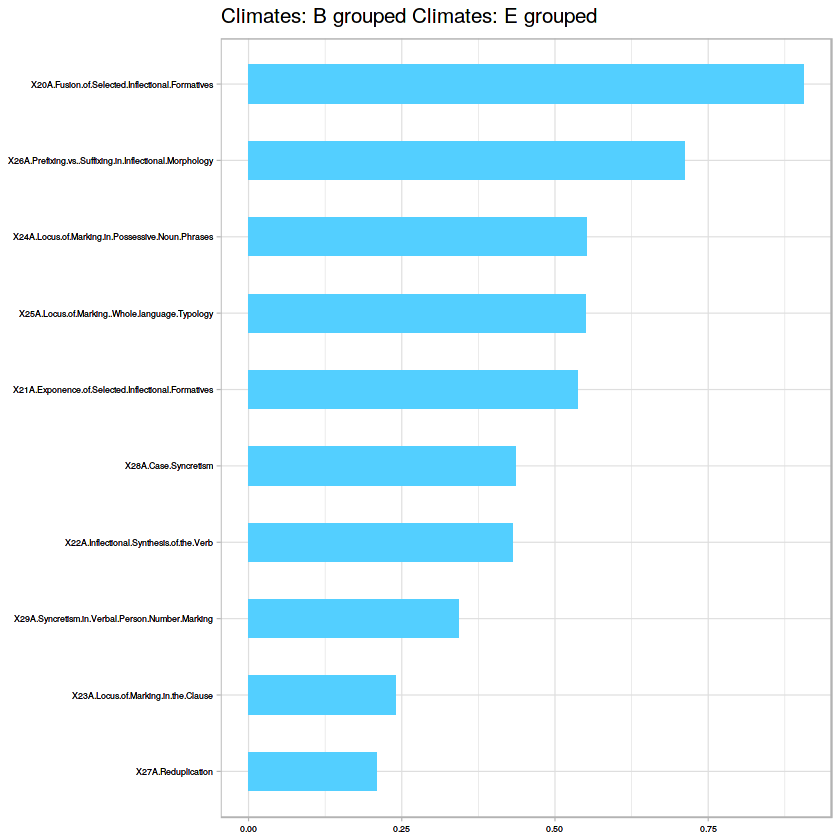

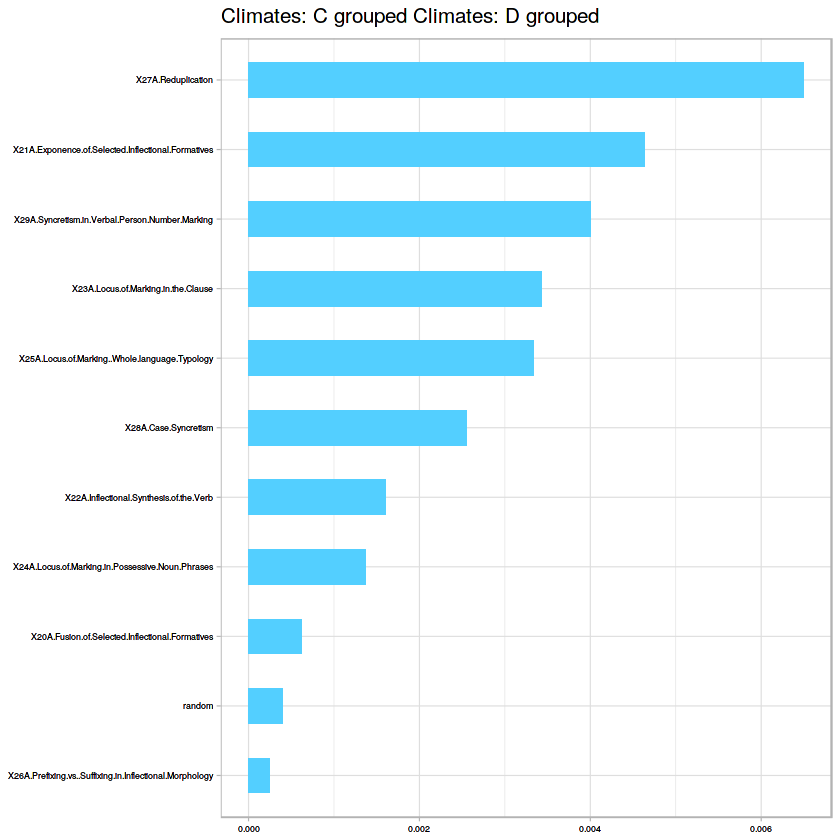

[1] "Accuracy for SVM:59.1304347826087"
   
     Y  Z
  Y 18  2
  Z 19 53
[1] "Climate: "
[1] "C" "E"
[1] "Dummy Classifier"
[1] 0.5609293
[1] 0.5609293
[1] "C-V accuracy for Random Forest is  0.651461988304094"
[1] "0.651461988304094"
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 30 62


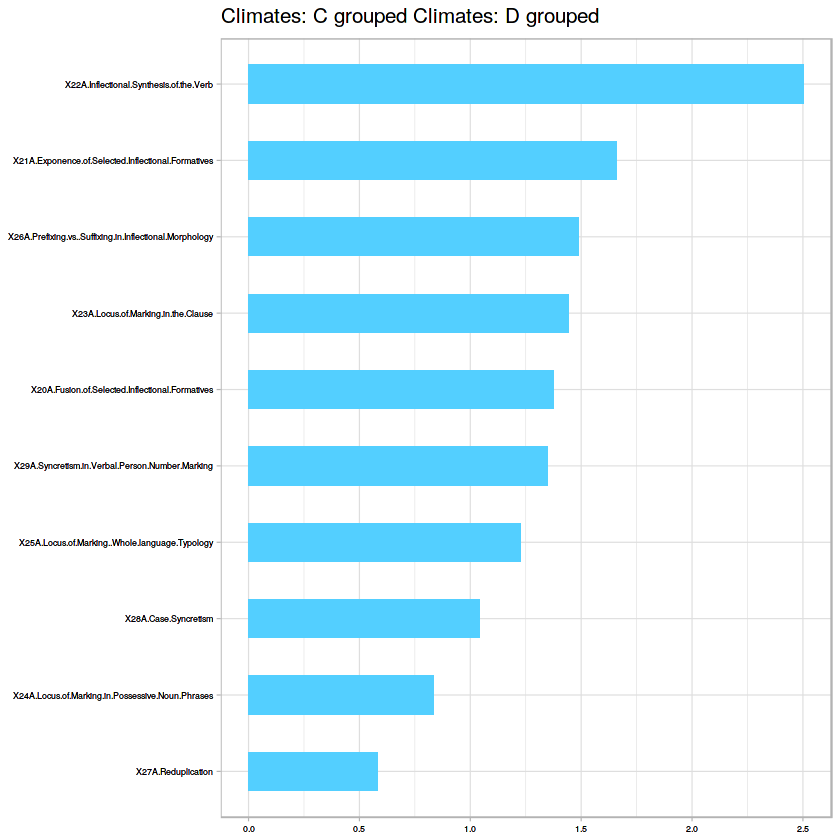

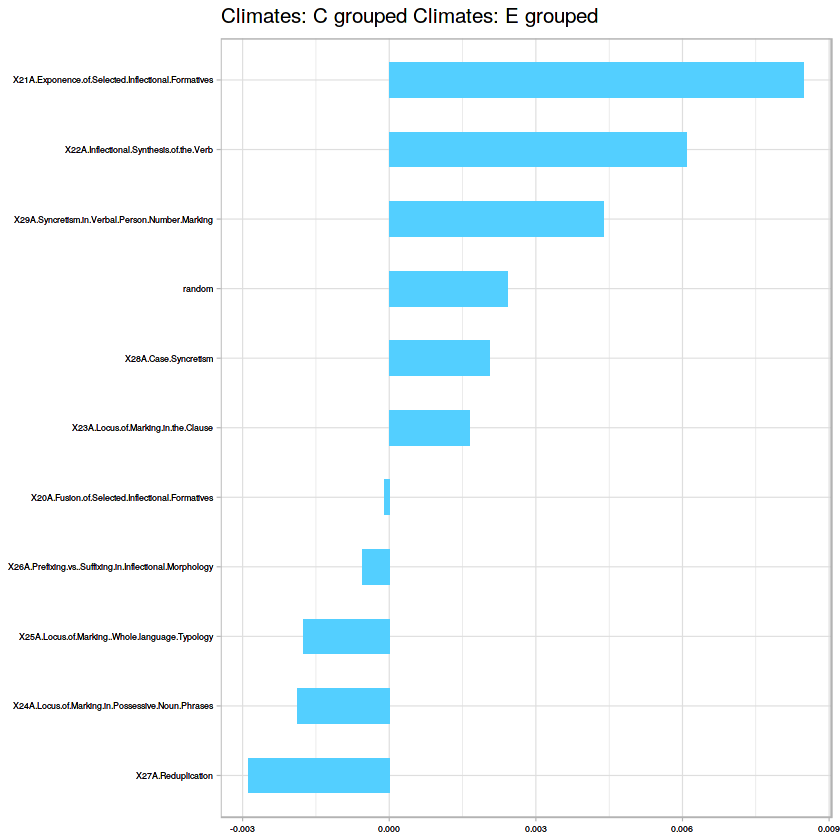

[1] "Accuracy for SVM:63.0434782608696"
   
     Y  Z
  Y  0  0
  Z 30 62
[1] "Climate: "
[1] "D" "E"
[1] "Dummy Classifier"
[1] 0.7574185
[1] 0.7574185
[1] "C-V accuracy for Random Forest is  "
character(0)
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  1  1
  Z 12 78


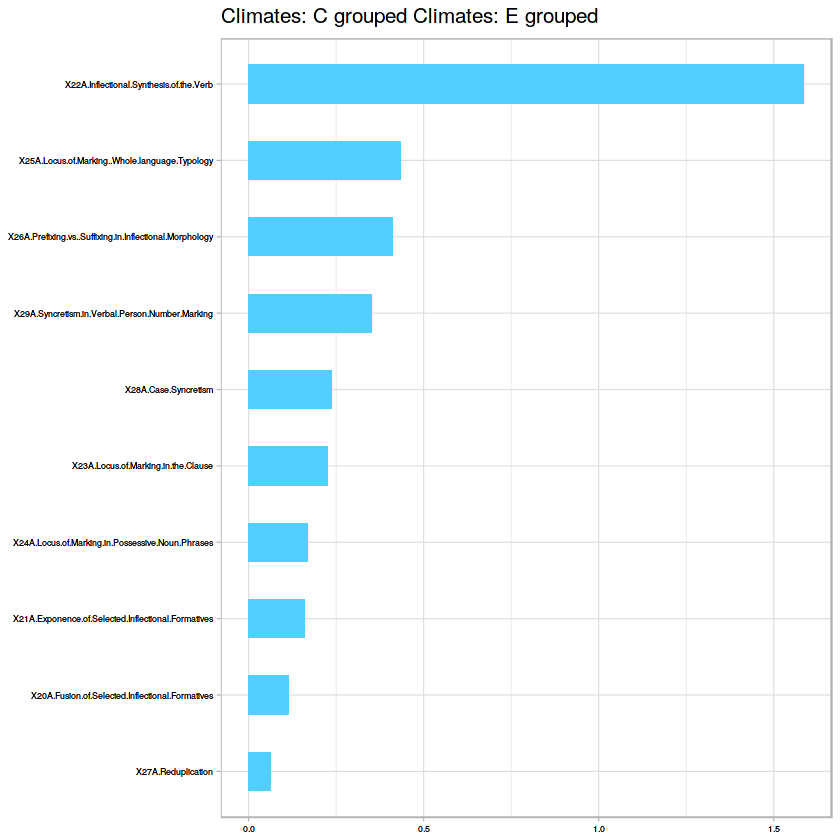

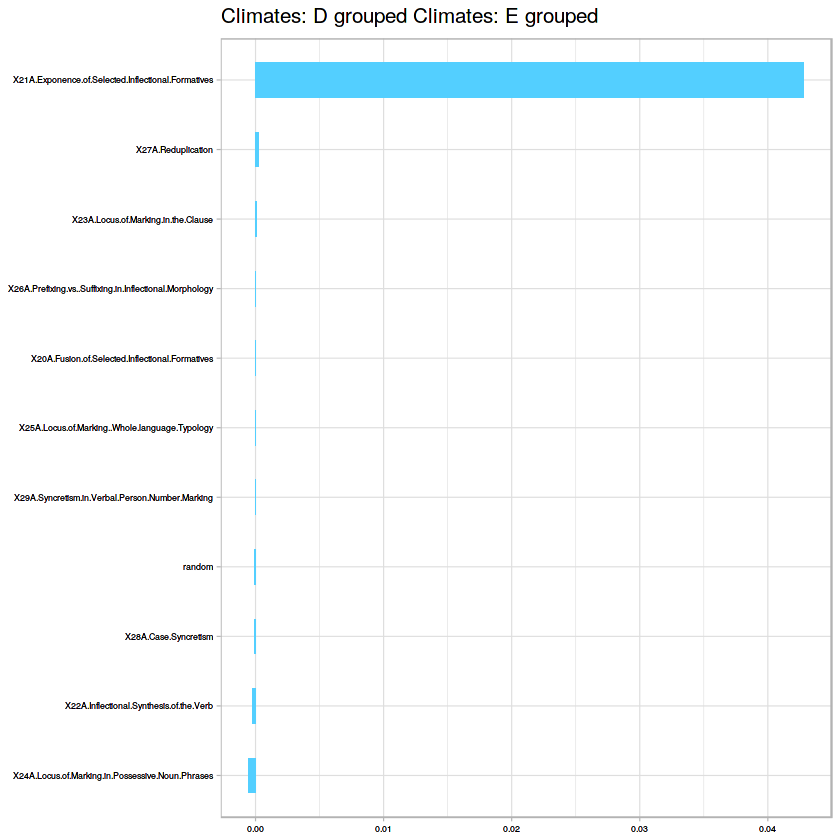

[1] "Accuracy for SVM:85.8695652173913"
   
     Y  Z
  Y  0  0
  Z 13 79


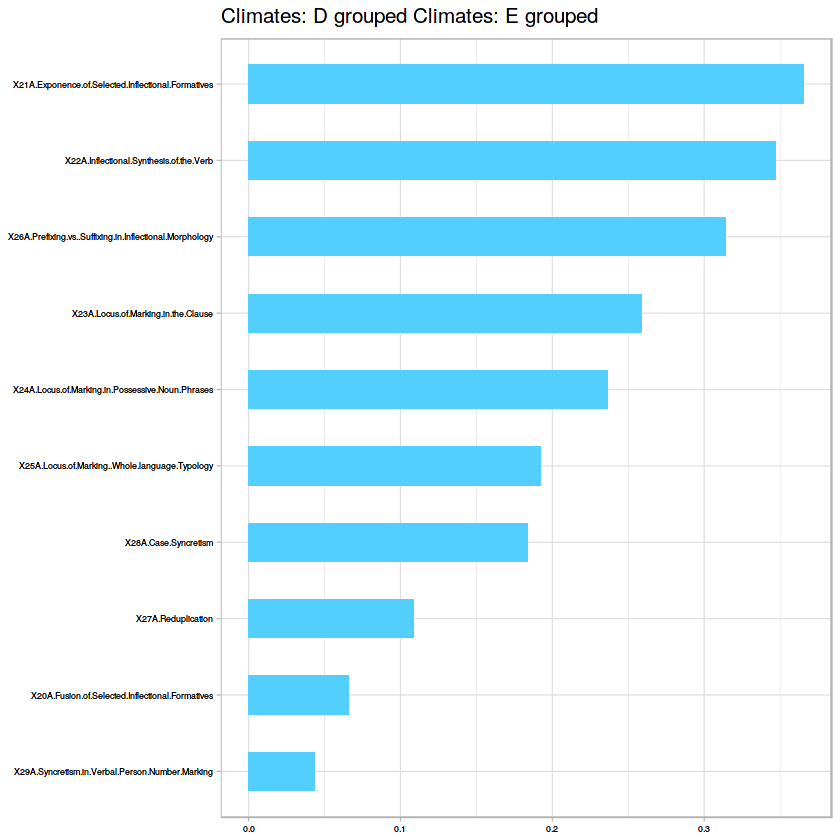

In [64]:
bin_2v3(morp_df)

[1] "Abkhaz"             "Arabic (Egyptian)"  "Albanian"          
 [4] "Amele"              "Armenian (Eastern)" "Basque"            
 [7] "Chukchi"            "Chuvash"            "Dutch"             
[10] "English"            "Evenki"             "Finnish"           
[13] "French"             "Garo"               "German"            
[16] "Greek (Modern)"     "Hausa"              "Hebrew (Modern)"   
[19] "Hixkaryana"         "Hungarian"          "Hunzib"            
[22] "Imonda"             "Indonesian"         "Ingush"            
[25] "Iraqw"              "Japanese"           "Ket"               
[28] "Khalkha"            "Kilivila"           "Latvian"           
[31] "Lezgian"            "Malagasy"           "Maori"             
[34] "Maybrat"            "Mundari"            "Pashto"            
[37] "Romanian"           "Russian"            "Spanish"           
[40] "Supyire"            "Tiwi"               "Tukang Besi"       
[43] "Turkish"            "Wari'"              "Yukaghir (Kolyma)" 
[46] "Yoruba"

[1] Northwest Caucasian Afro-Asiatic        Indo-European      
 [4] Trans-New Guinea    Indo-European       Basque             
 [7] Chukotko-Kamchatkan Altaic              Indo-European      
[10] Indo-European       Altaic              Uralic             
[13] Indo-European       Sino-Tibetan        Indo-European      
[16] Indo-European       Afro-Asiatic        Afro-Asiatic       
[19] Cariban             Uralic              Nakh-Daghestanian  
[22] Border              Austronesian        Nakh-Daghestanian  
[25] Afro-Asiatic        Japanese            Yeniseian          
[28] Altaic              Austronesian        Indo-European      
[31] Nakh-Daghestanian   Austronesian        Austronesian       
[34] West Papuan         Austro-Asiatic      Indo-European      
[37] Indo-European       Indo-European       Indo-European      
[40] Niger-Congo         Tiwian              Austronesian       
[43] Altaic              Chapacura-Wanham    Yukaghir           
[46] Niger-Congo        
21 Levels: Afro-Asiatic Altaic Austro-Asiatic Austronesian Basque ... Yukaghir


       Afro-Asiatic              Altaic      Austro-Asiatic        Austronesian 
                  4                   4                   1                   5 
             Basque              Border             Cariban    Chapacura-Wanham 
                  1                   1                   1                   1 
Chukotko-Kamchatkan       Indo-European            Japanese   Nakh-Daghestanian 
                  1                  12                   1                   3 
        Niger-Congo Northwest Caucasian        Sino-Tibetan              Tiwian 
                  2                   1                   1                   1 
   Trans-New Guinea              Uralic         West Papuan           Yeniseian 
                  1                   2                   1                   1 
           Yukaghir 
                  1 

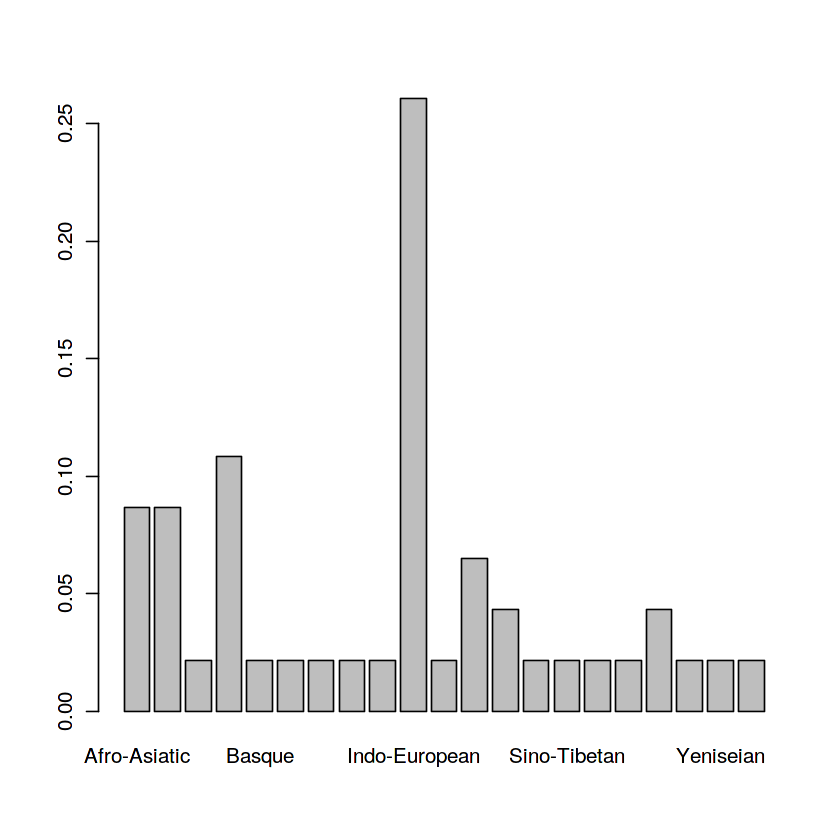

In [92]:
#Nominal Categories
s<-c(1,3,38,42,43,56,55,58,59,62,176,177)
nom_df<-na.omit(lang_df[,s])
nom_df[,2]<-as.factor(nom_df[,2])
nom_df[,1]
nom_df[,2]
table(nom_df[,2])
barplot(prop.table(table(nom_df[,2])))
nom_df<-nom_df[,-c(1,2)]

nom_df[sapply(nom_df, is.character)] <- lapply(nom_df[sapply(nom_df, is.character)], as.factor)

In [103]:
class

[1] "A" "B" "C" "D" "E"

[1] 0.2725543
[1] "C-V accuracy for Random Forest is  0.471805555555556"
[1] "0.471805555555556"
[1] "RF Confusion Matrix:"
   
     A  B  C  D  E
  A 13  2  4  0  0
  B  0  0  0  0  0
  C  0  1  6  1  0
  D  0  1  5 12  1
  E  0  0  0  0  0


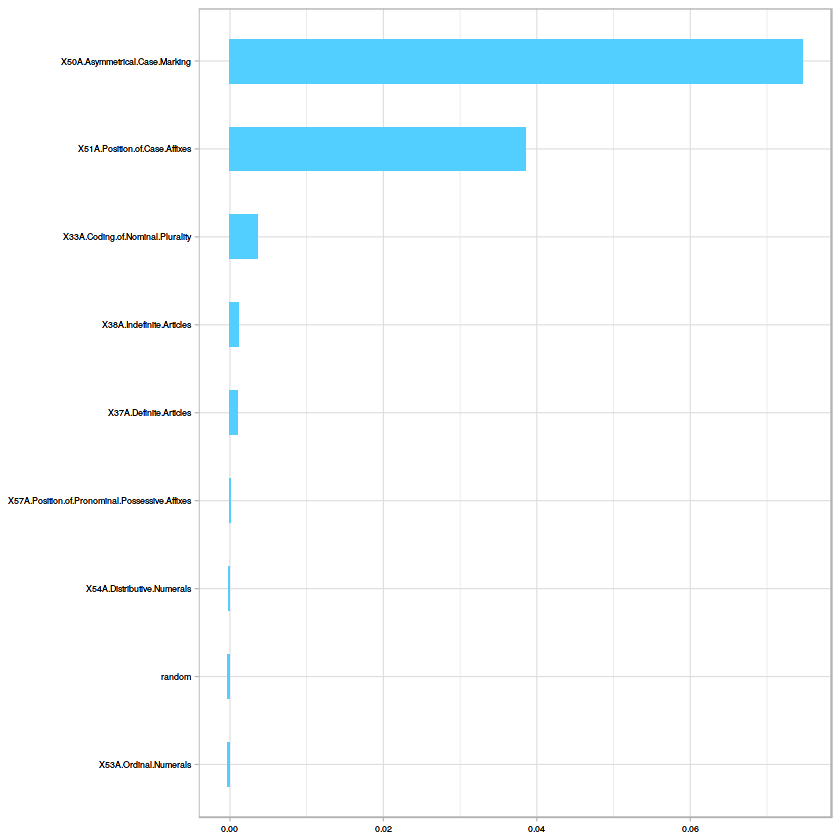

[1] "Accuracy for SVM:50.4347826086957"
   
     A  B  C  D  E
  A 11  1  1  0  0
  B  0  0  0  0  0
  C  2  2 13  4  0
  D  0  1  1  9  1
  E  0  0  0  0  0


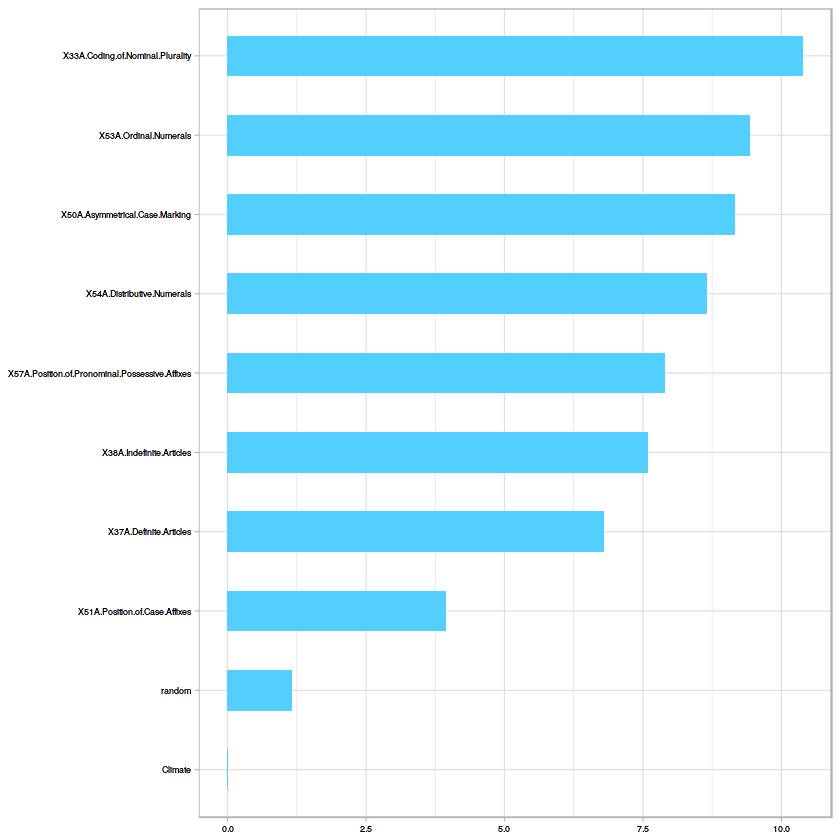

In [108]:
#c is the class vector, v is the real data, and p is the probability distribution for each class
dummy_clas(class,nom_df$Climate,dist(nom_df))
cvrf(nom_df)
svmc(nom_df)

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5962609
[1] C-V accuracy for Random Forest is 0.718888888888889
[1] "RF Confusion Matrix:"
   
     A  X
  A  3  0
  X 10 33
[1] "Accuracy for SVM:70.8695652173913"
   
     A  X
  A  9  0
  X  4 33
   
     A  X
  A  9  0
  X  4 33
[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.840163


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

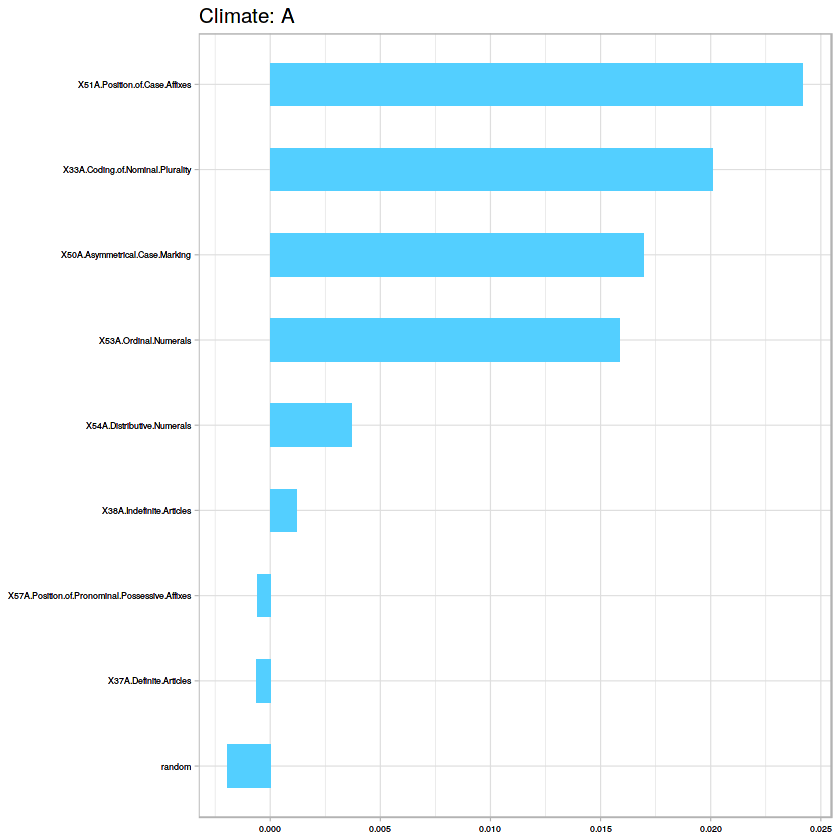

[1] C-V accuracy for Random Forest is 0.914814814814815
[1] "RF Confusion Matrix:"
   
     B  X
  B  0  0
  X  4 42


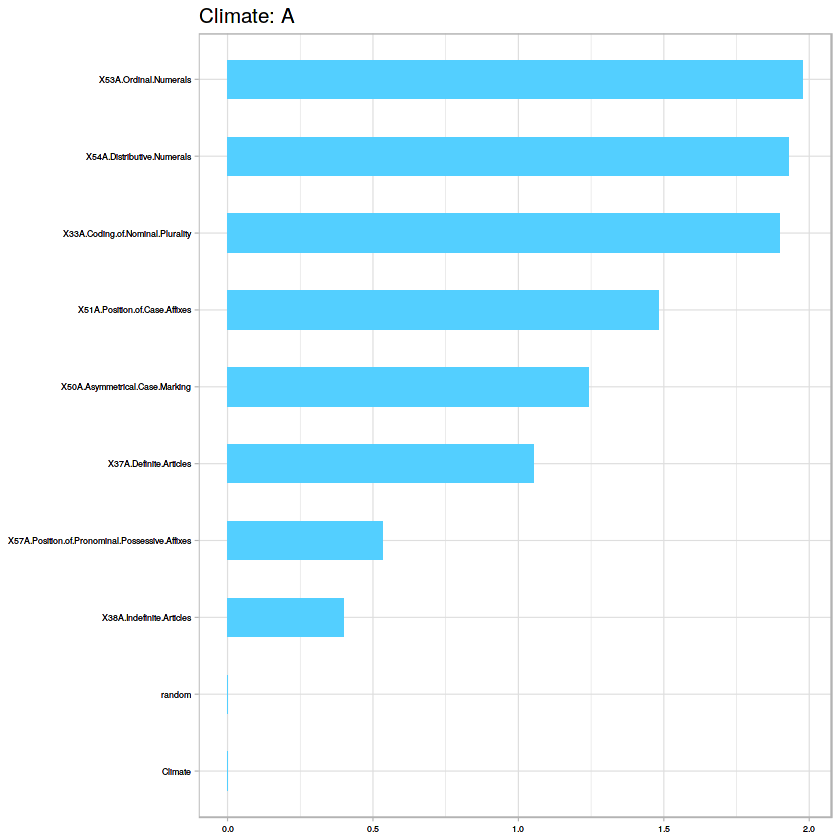

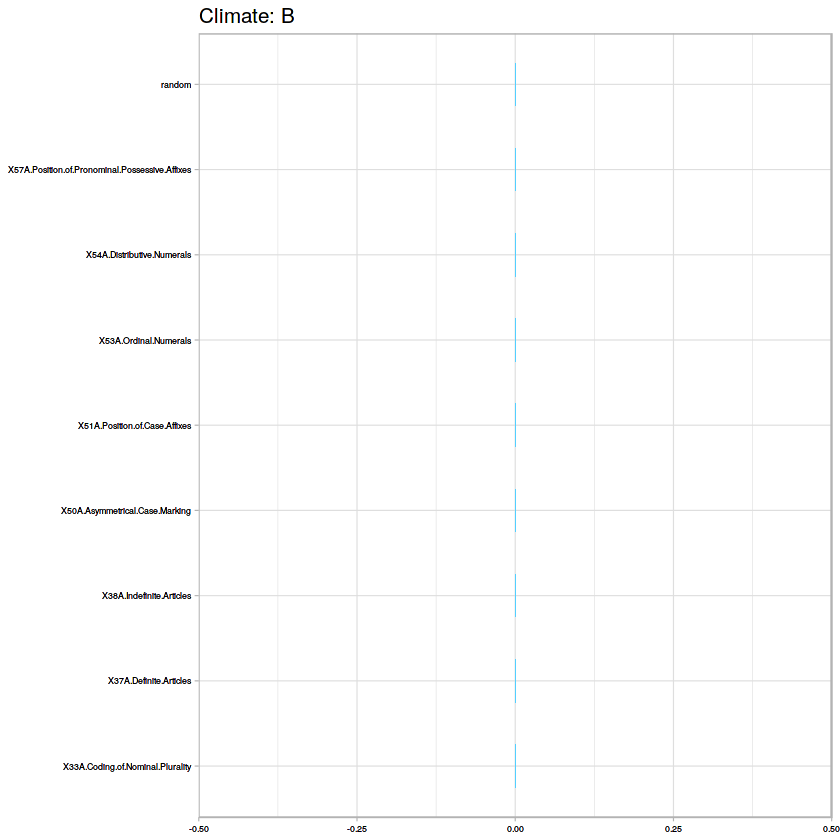

[1] "Accuracy for SVM:91.304347826087"
   
     B  X
  B  0  0
  X  4 42
   
     B  X
  B  0  0
  X  4 42
[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.56125
[1] C-V accuracy for Random Forest is 0.673333333333333
[1] "RF Confusion Matrix:"
   
     C  X
  C  0  0
  X 15 31


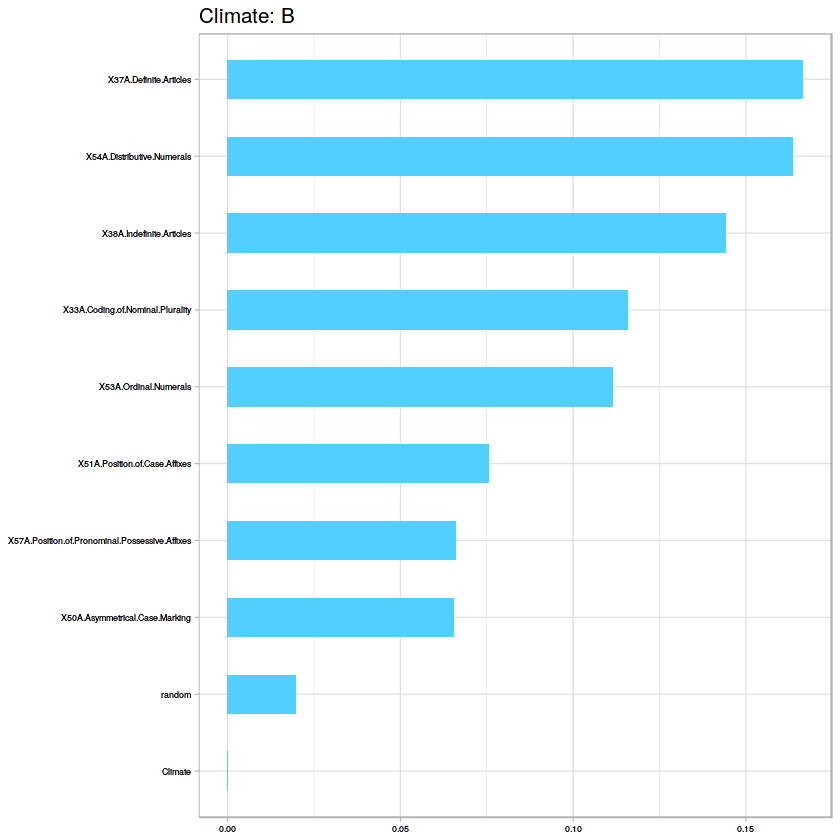

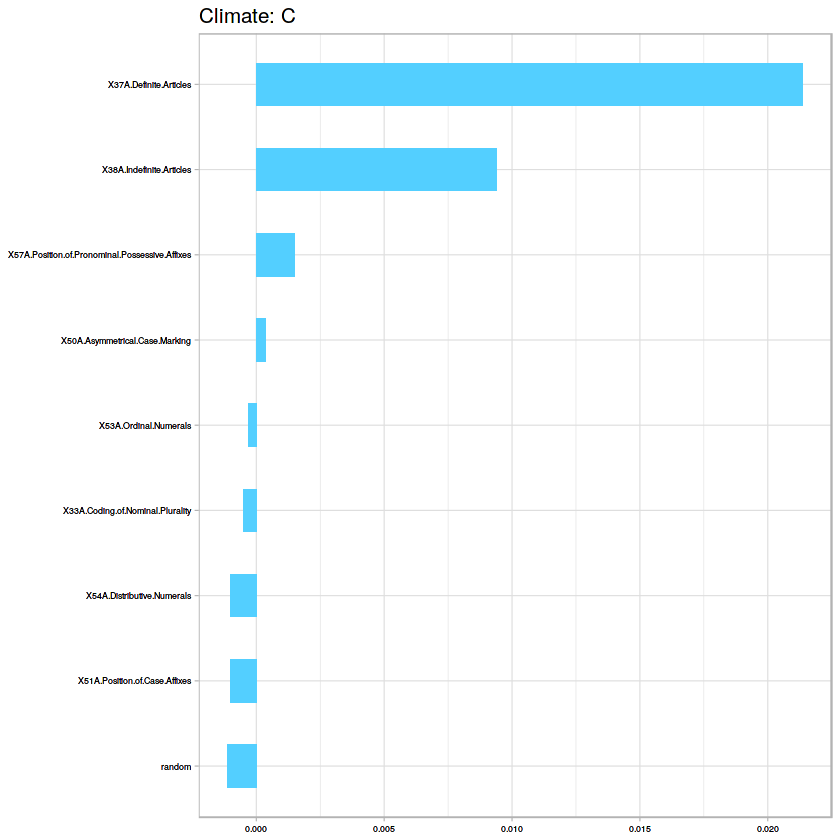

[1] "Accuracy for SVM:63.0434782608696"
   
     C  X
  C  6  0
  X  9 31
   
     C  X
  C  6  0
  X  9 31
[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.5938696
[1] C-V accuracy for Random Forest is 0.718888888888889
[1] "RF Confusion Matrix:"
   
     D  X
  D  0  0
  X 13 33


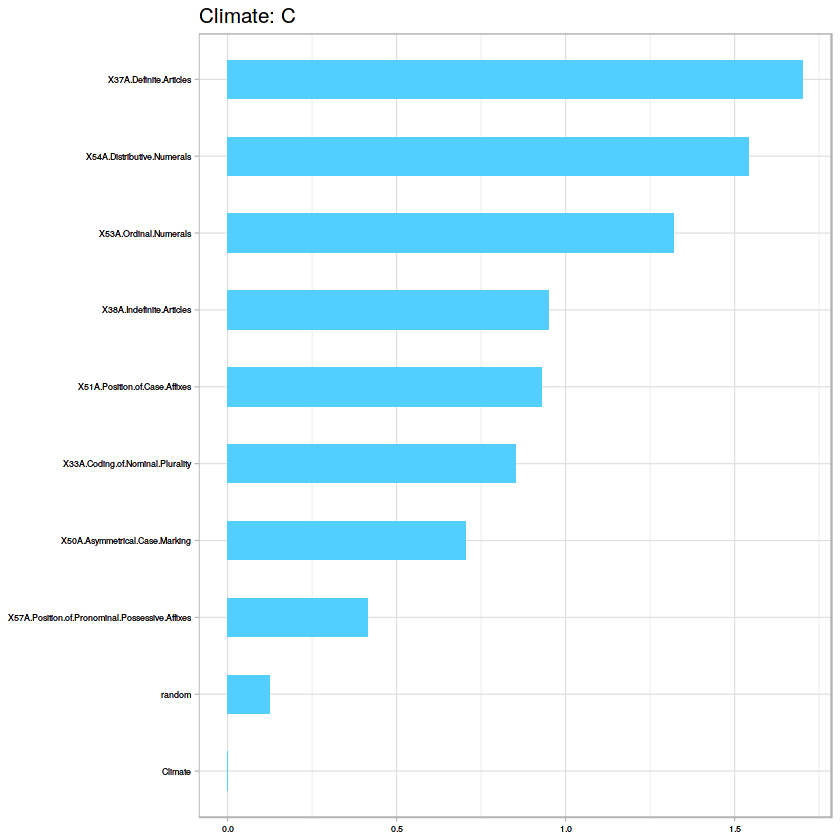

[1] "Accuracy for SVM:73.4782608695652"
   
     D  X
  D  5  0
  X  8 33
   
     D  X
  D  5  0
  X  8 33
[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9571957


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

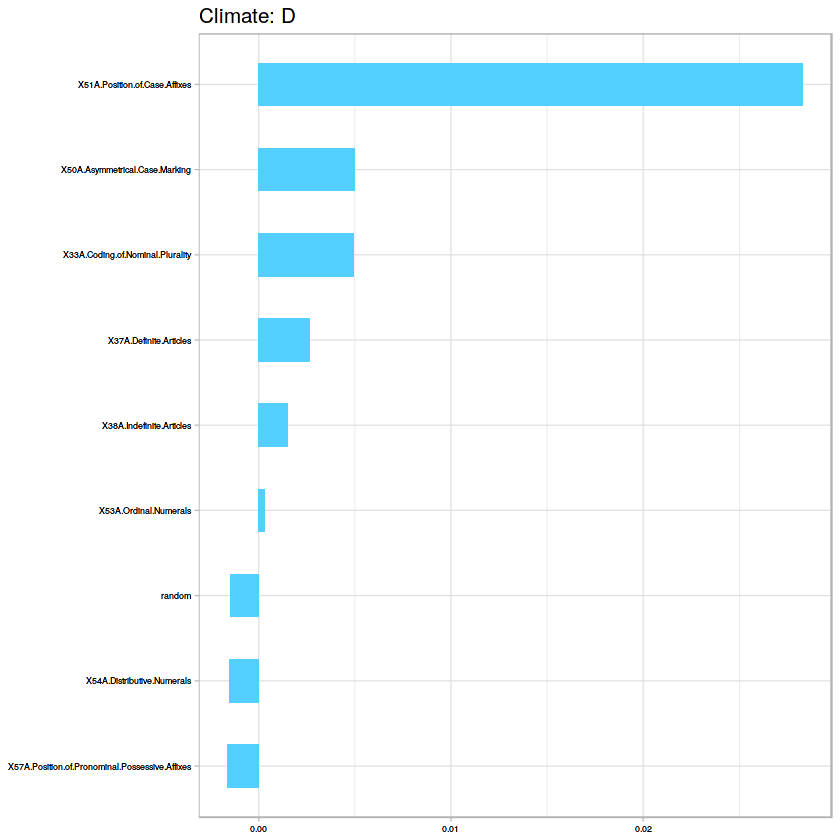

[1] C-V accuracy for Random Forest is 0.98
[1] "RF Confusion Matrix:"
   
     E  X
  E  0  0
  X  1 45


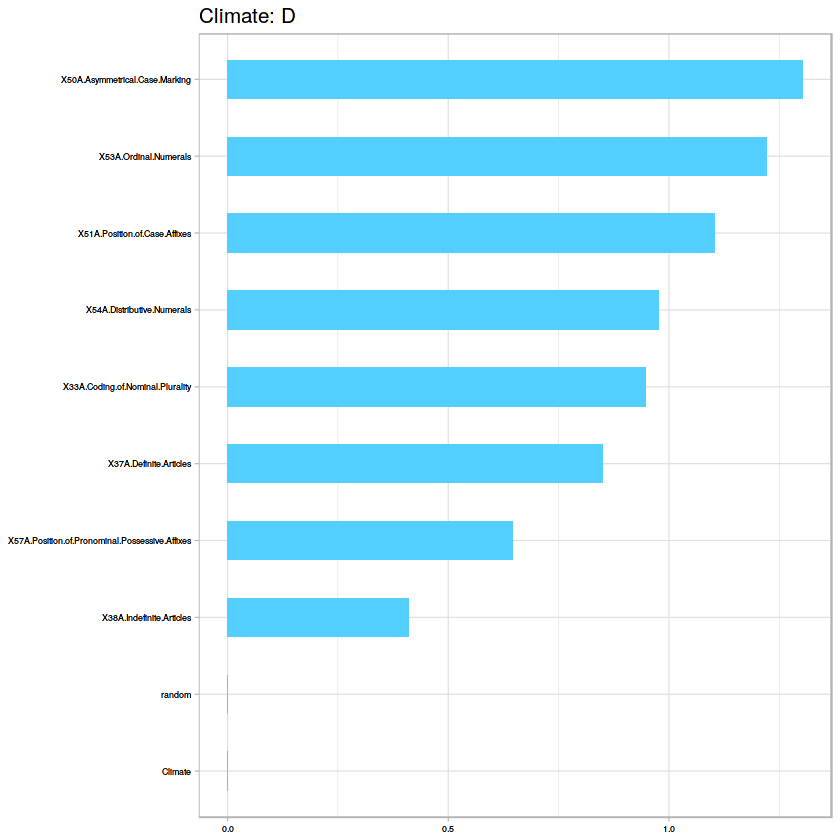

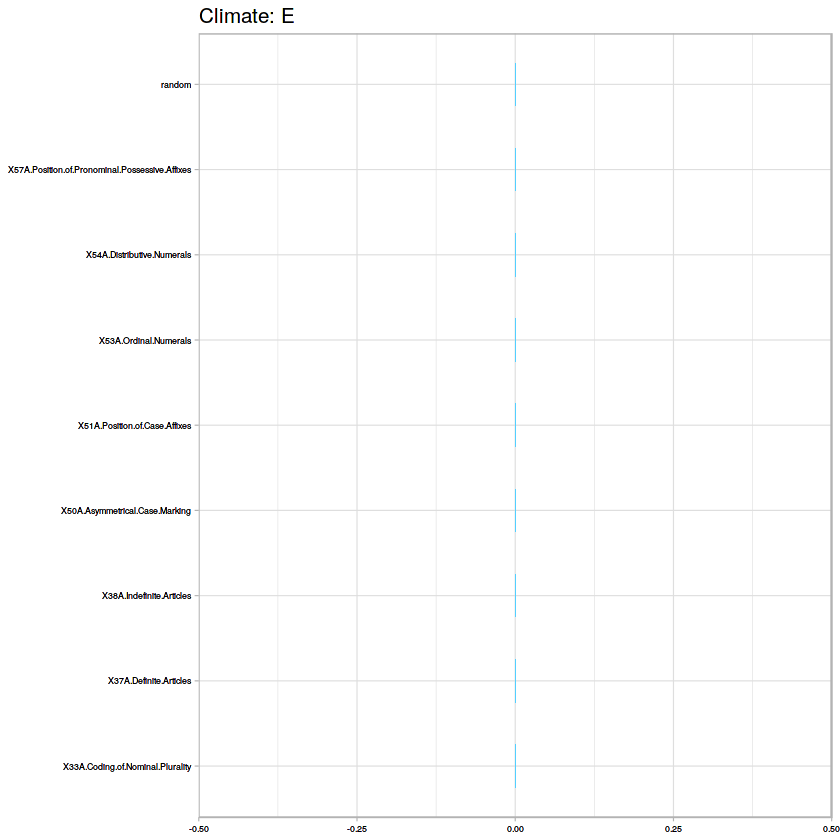

[1] "Accuracy for SVM:97.8260869565217"
   
     E  X
  E  0  0
  X  1 45
   
     E  X
  E  0  0
  X  1 45


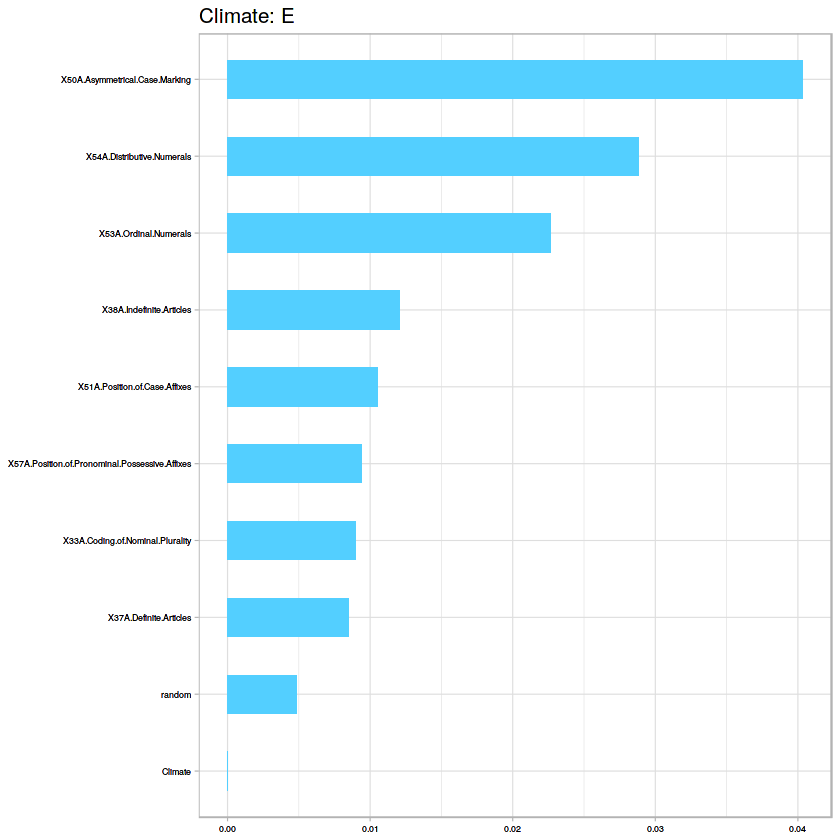

In [371]:
ovsa(nom_df)

[1] "A" "B"
[1] 0.6421471
[1] "Dummy Classifier accuracy:0.642147058823529"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

[1] C-V accuracy for Random Forest is 0.777777777777778
[1] "RF Confusion Matrix:"
   
     A  B
  A 13  4
  B  0  0


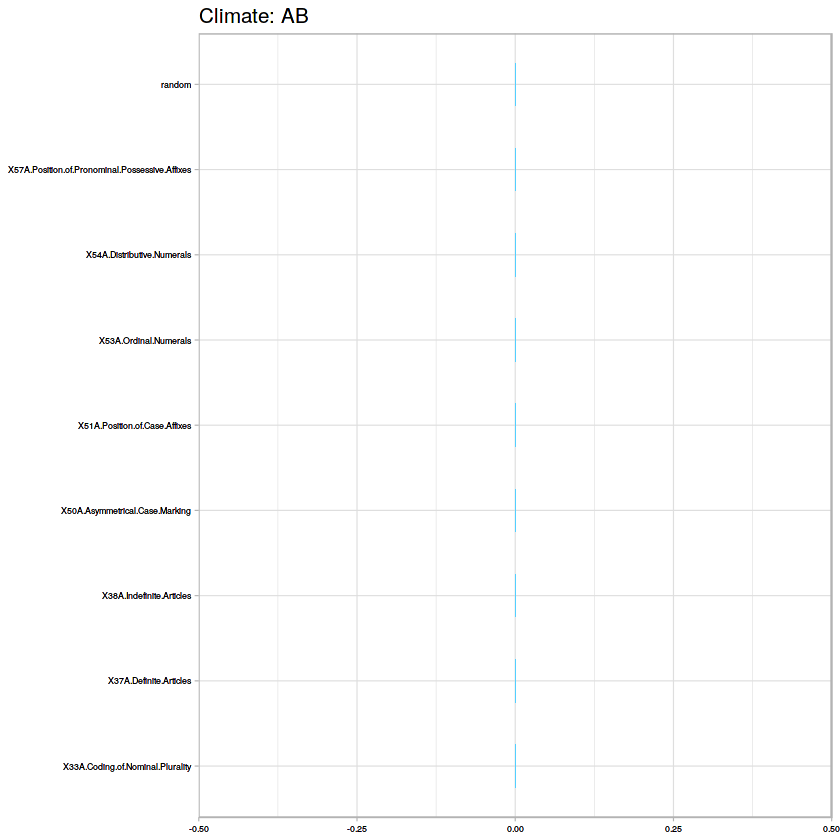

[1] "Accuracy for SVM:74.1176470588235"
   
     A  B
  A 13  3
  B  0  1
   
     A  B
  A 13  3
  B  0  1
[1] "A" "C"
[1] 0.4996429
[1] "Dummy Classifier accuracy:0.499642857142857"
[1] C-V accuracy for Random Forest is 0.593333333333333
[1] "RF Confusion Matrix:"
   
     A  C
  A  0  0
  C 13 15


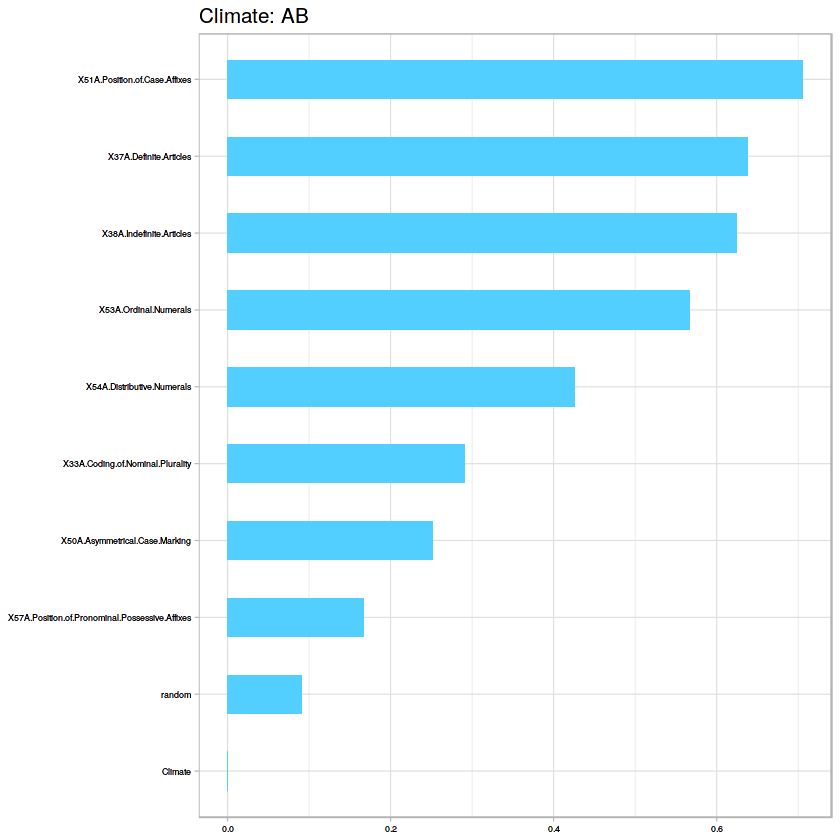

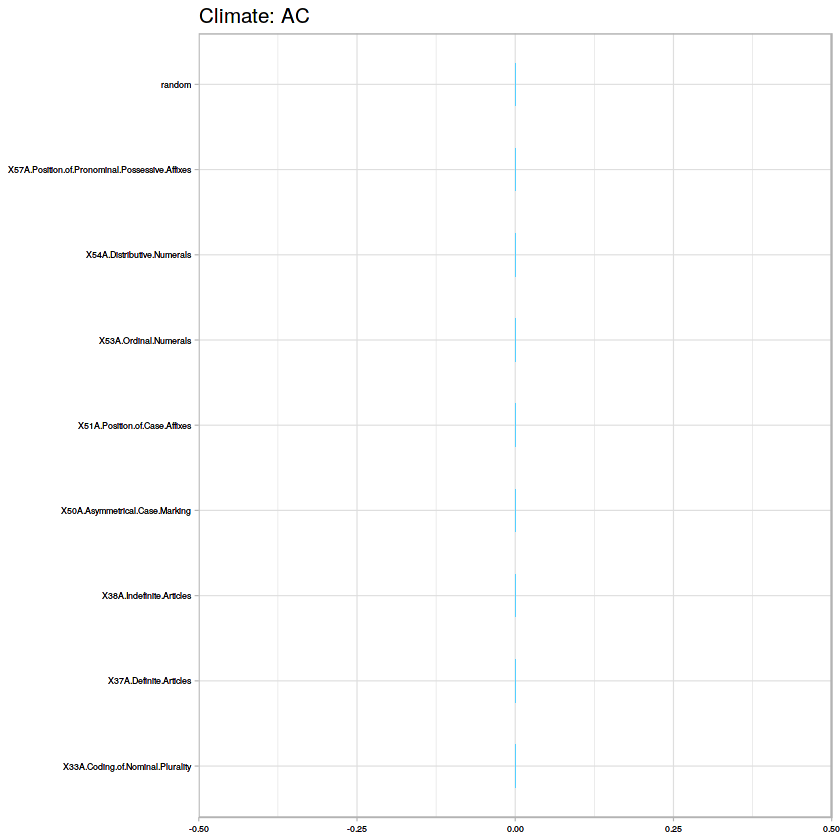

[1] "Accuracy for SVM:65"
   
     A  C
  A 12  1
  C  1 14
   
     A  C
  A 12  1
  C  1 14
[1] "A" "D"
[1] 0.4969423
[1] "Dummy Classifier accuracy:0.496942307692308"
[1] C-V accuracy for Random Forest is 0.833333333333333
[1] "RF Confusion Matrix:"
   
     A  D
  A  0  0
  D 13 13


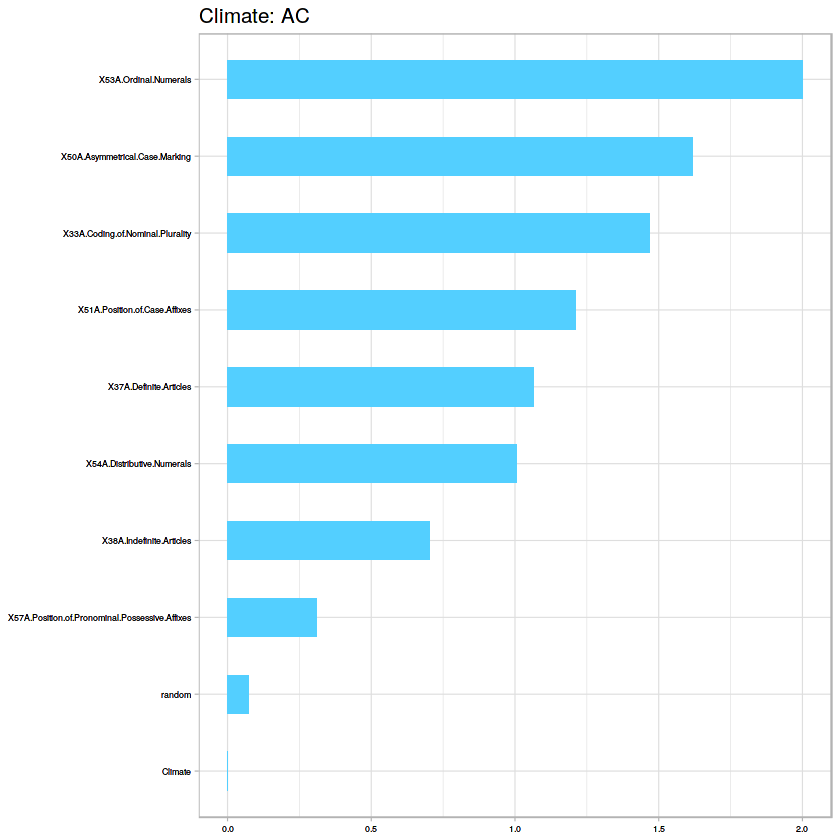

[1] "Accuracy for SVM:86.1538461538462"
   
     A  D
  A 13  0
  D  0 13
   
     A  D
  A 13  0
  D  0 13
[1] "A" "E"
[1] 0.8665
[1] "Dummy Classifier accuracy:0.8665"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

[1] C-V accuracy for Random Forest is 0.95


ERROR: Error in model@fit(data, ...): fraction of 0.000000 is too small


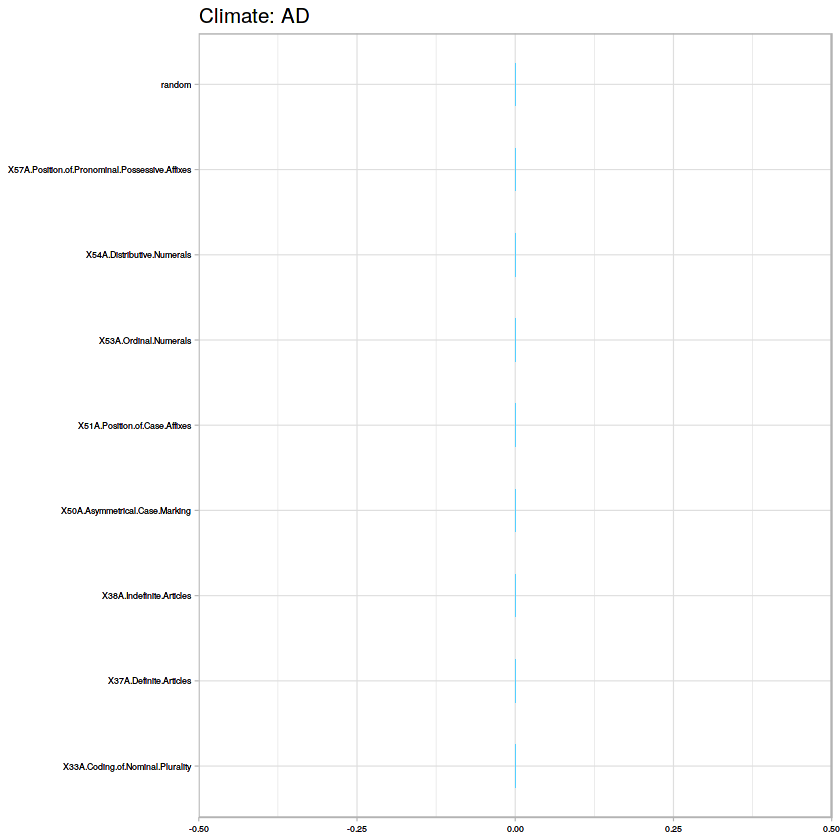

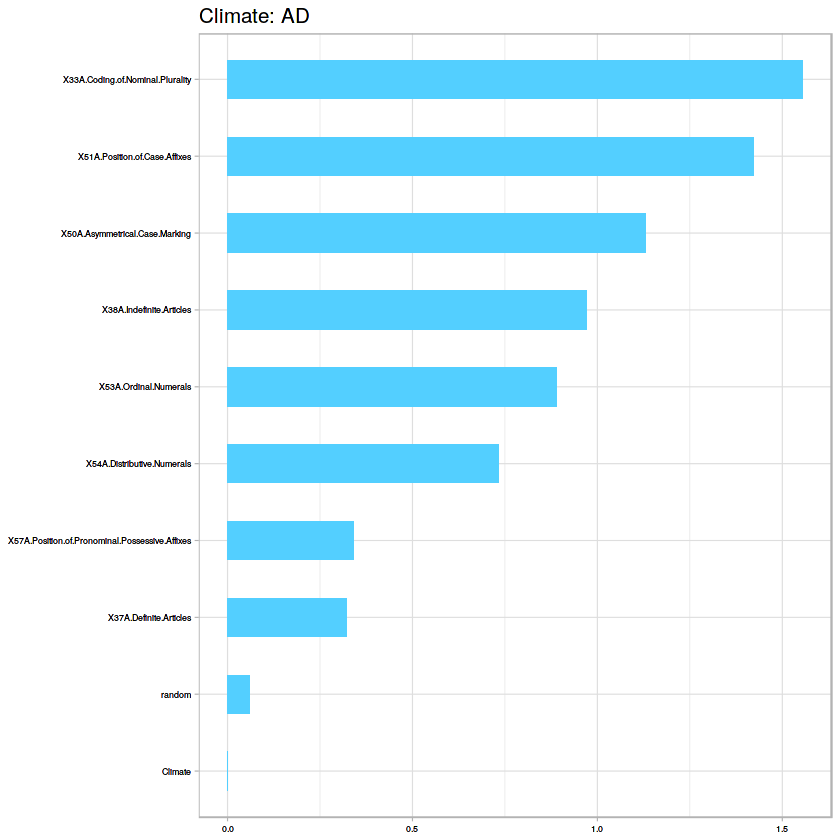

In [358]:
ovo(nom_df)

[1] "Climate: "
[1] "A" "B"
[1] "Dummy Classifier"
[1] 0.5365
[1] 0.5365
[1] C-V accuracy for Random Forest is 0.744814814814815
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 13  2
  Z  4 27


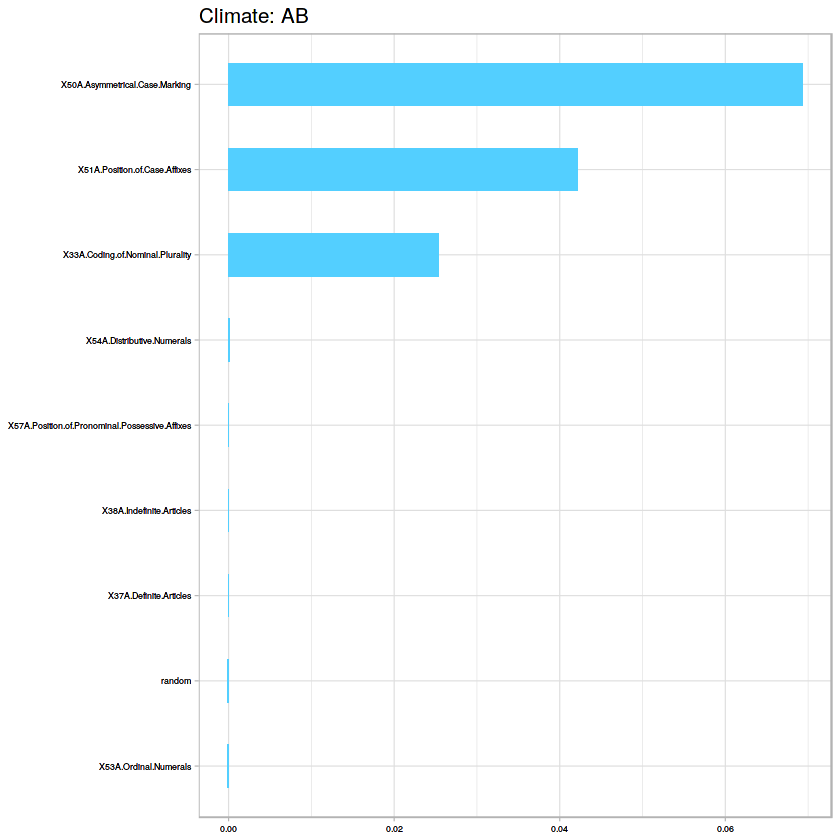

[1] "Accuracy for SVM:74.3478260869565"
   
     Y  Z
  Y 13  0
  Z  4 29
[1] "Climate: "
[1] "A" "C"
[1] "Dummy Classifier"
[1] 0.5236087
[1] 0.5236087
[1] C-V accuracy for Random Forest is 0.623888888888889
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 22  4
  Z  6 14


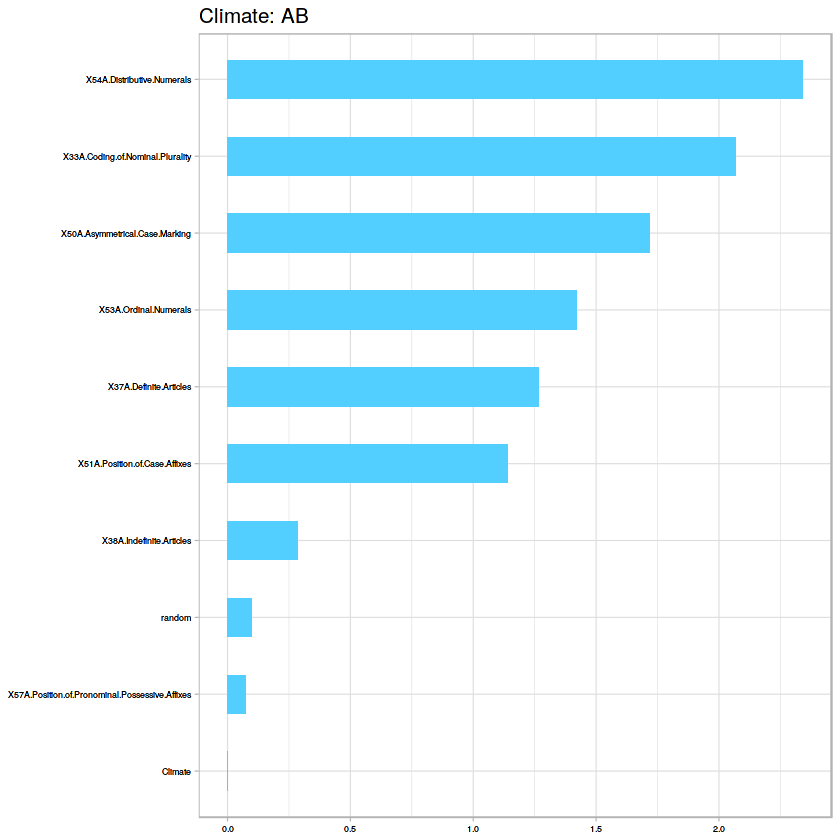

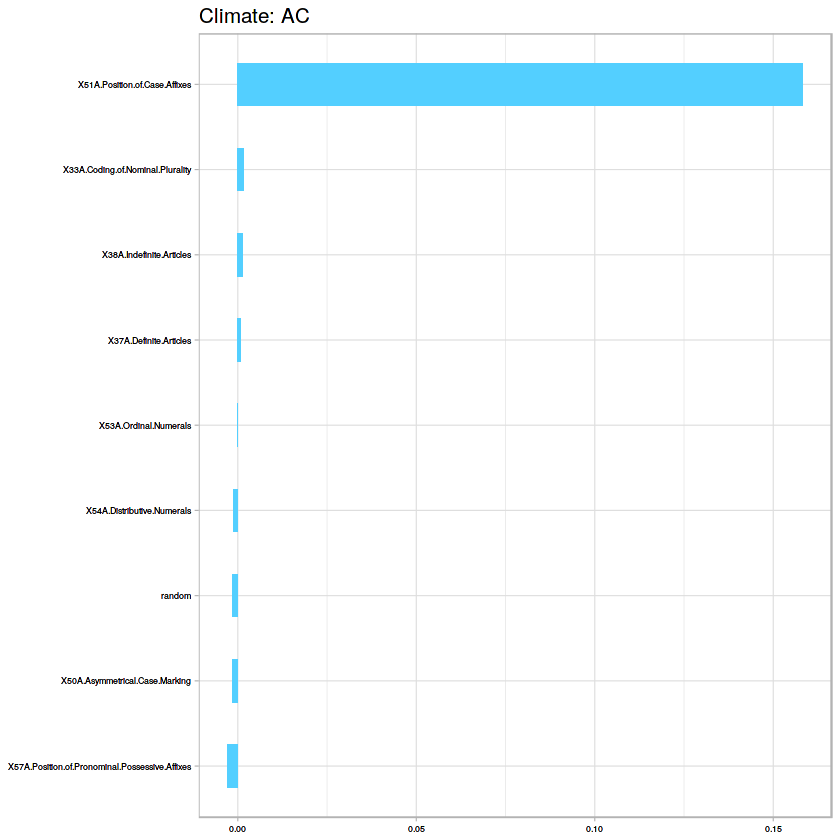

[1] "Accuracy for SVM:70.4347826086957"
   
     Y  Z
  Y 28  6
  Z  0 12
[1] "Climate: "
[1] "A" "D"
[1] "Dummy Classifier"
[1] 0.5066087
[1] 0.5066087
[1] C-V accuracy for Random Forest is 0.565925925925926
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 20  6
  Z  6 14


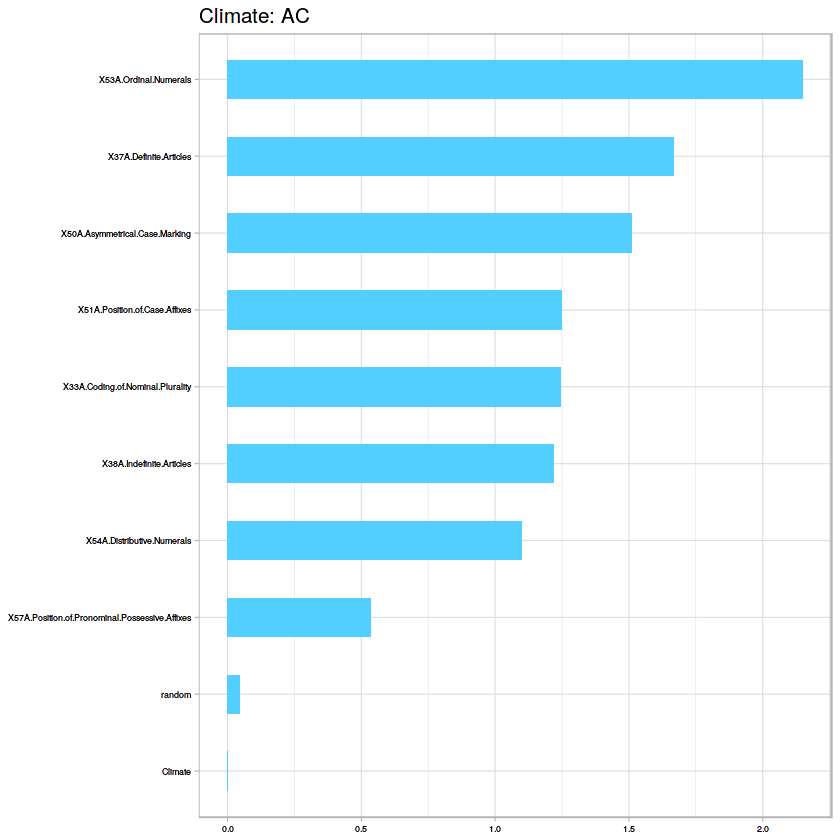

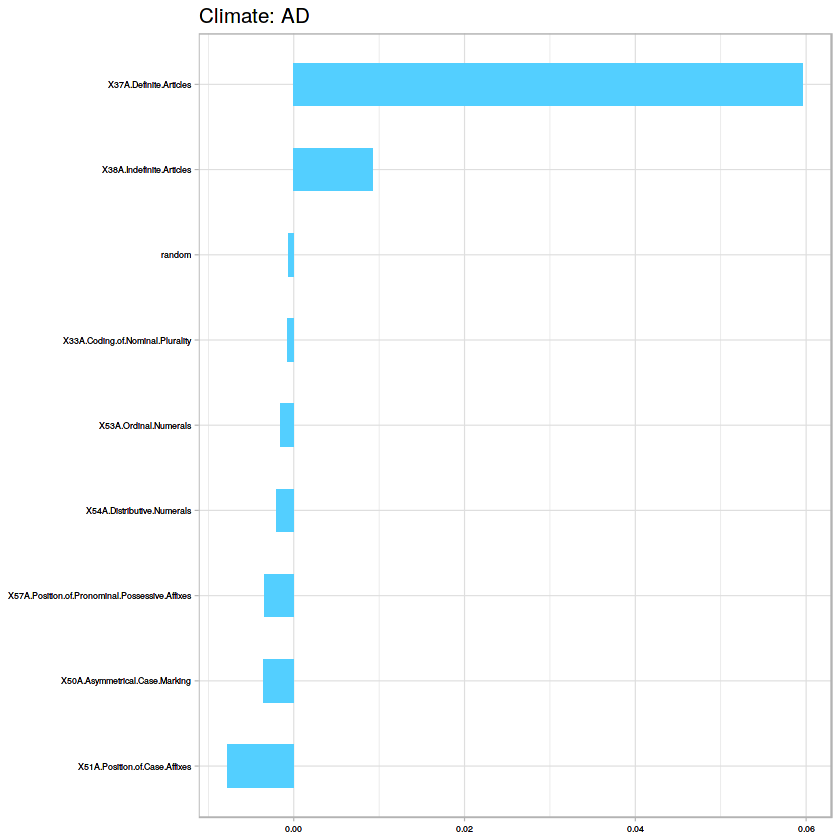

[1] "Accuracy for SVM:50.4347826086957"
   
     Y  Z
  Y 25  6
  Z  1 14
[1] "Climate: "
[1] "A" "E"
[1] "Dummy Classifier"
[1] 0.5784022
[1] 0.5784022
[1] C-V accuracy for Random Forest is 0.696296296296296
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  5  0
  Z  9 32


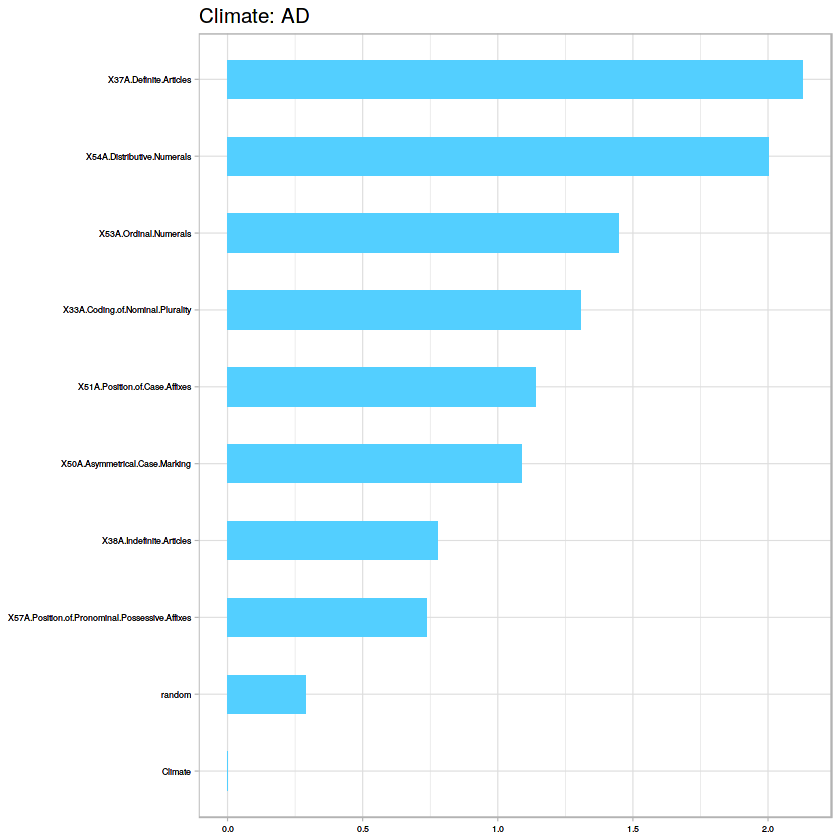

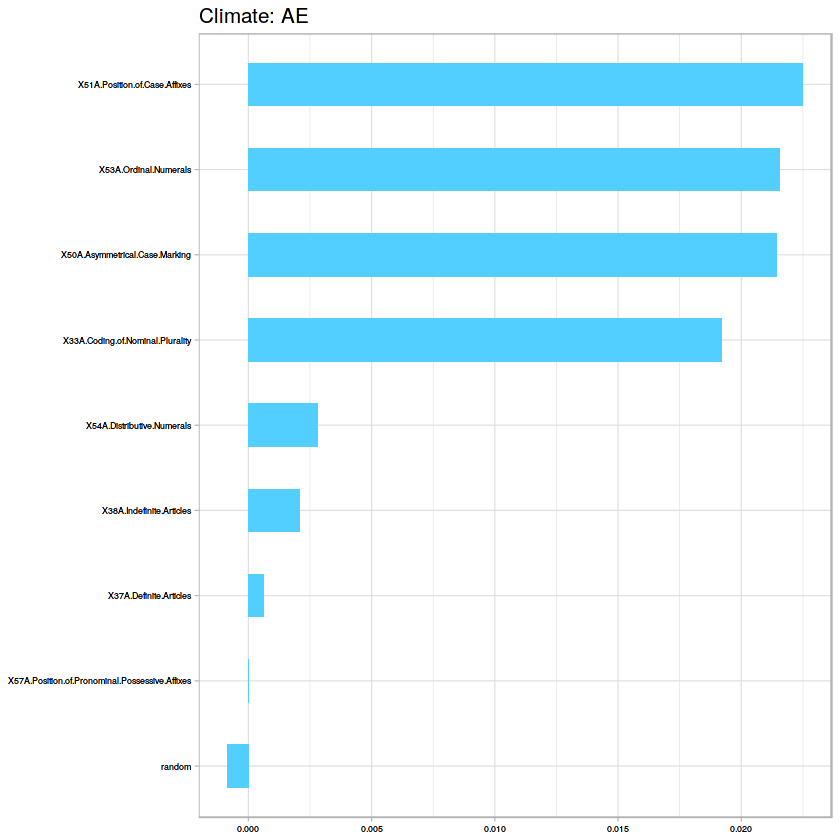

[1] "Accuracy for SVM:75.2173913043478"
   
     Y  Z
  Y 12  0
  Z  2 32
[1] "Climate: "
[1] "B" "C"
[1] "Dummy Classifier"
[1] 0.512337
[1] 0.512337
[1] C-V accuracy for Random Forest is 0.587222222222222
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  9  0
  Z 10 27


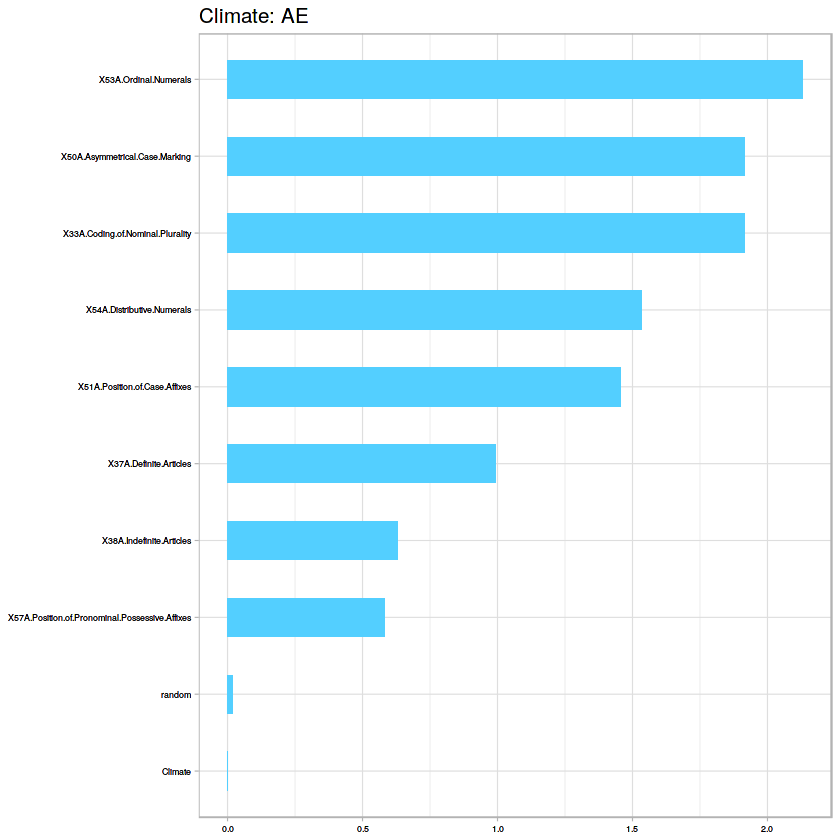

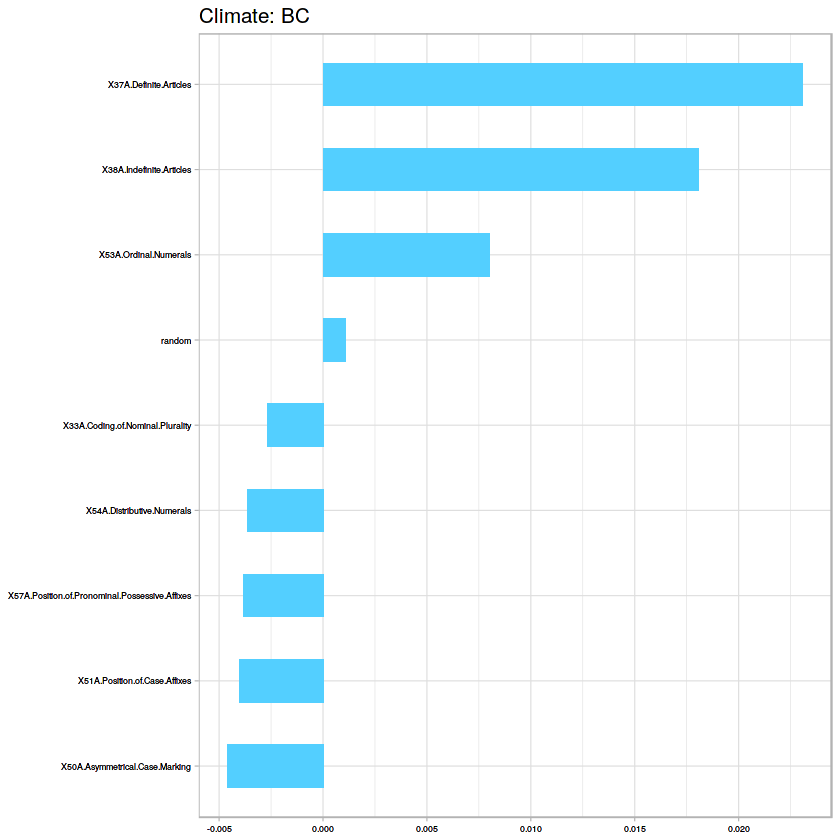

[1] "Accuracy for SVM:59.1304347826087"
   
     Y  Z
  Y 13  1
  Z  6 26
[1] "Climate: "
[1] "B" "D"
[1] "Dummy Classifier"
[1] 0.5351087
[1] 0.5351087
[1] C-V accuracy for Random Forest is 0.64537037037037
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 13  7
  Z  4 22


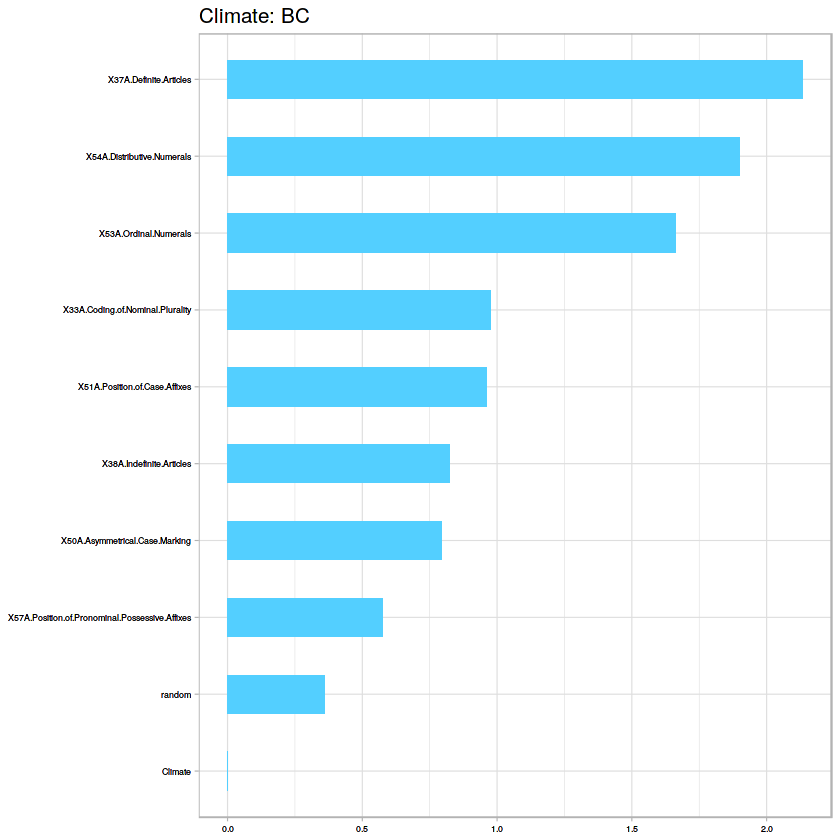

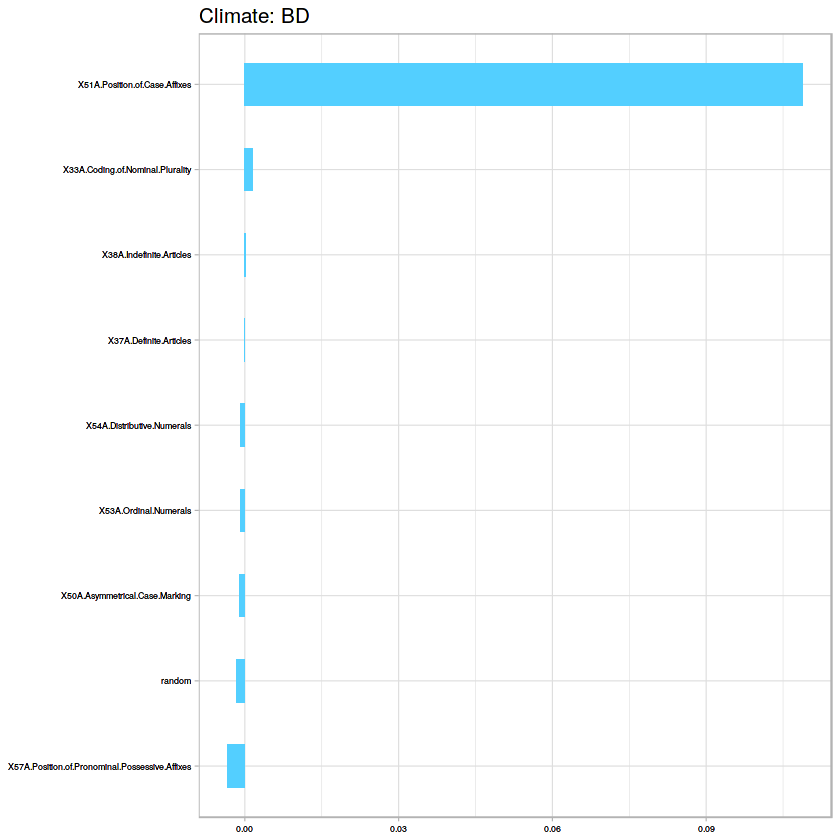

[1] "Accuracy for SVM:69.5652173913043"
   
     Y  Z
  Y 10  0
  Z  7 29
[1] "Climate: "
[1] "B" "E"
[1] "Dummy Classifier"
[1] 0.8057065
[1] 0.8057065
[1] C-V accuracy for Random Forest is 0.891111111111111
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z  5 41


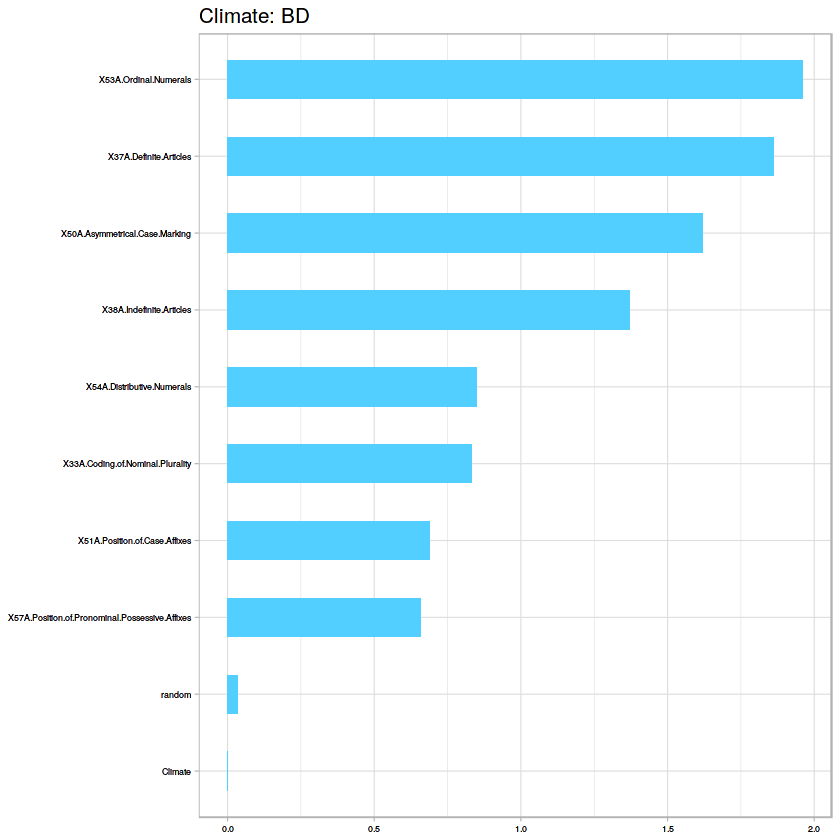

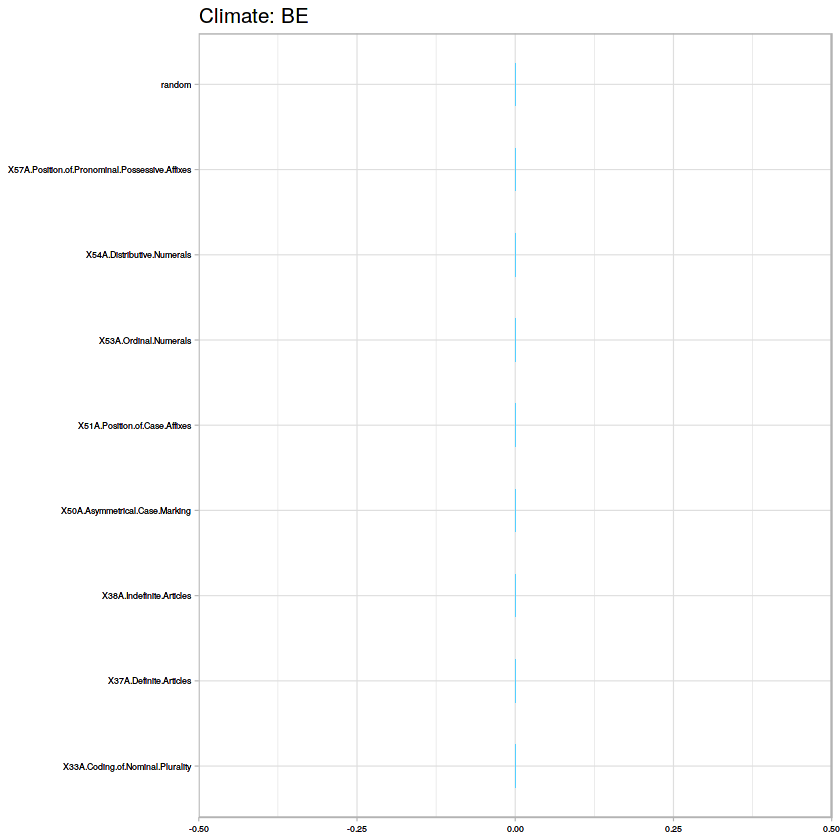

[1] "Accuracy for SVM:89.1304347826087"
   
     Y  Z
  Y  0  0
  Z  5 41
[1] "Climate: "
[1] "C" "D"
[1] "Dummy Classifier"
[1] 0.5220761
[1] 0.5220761
[1] C-V accuracy for Random Forest is 0.70962962962963
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 26  6
  Z  2 12


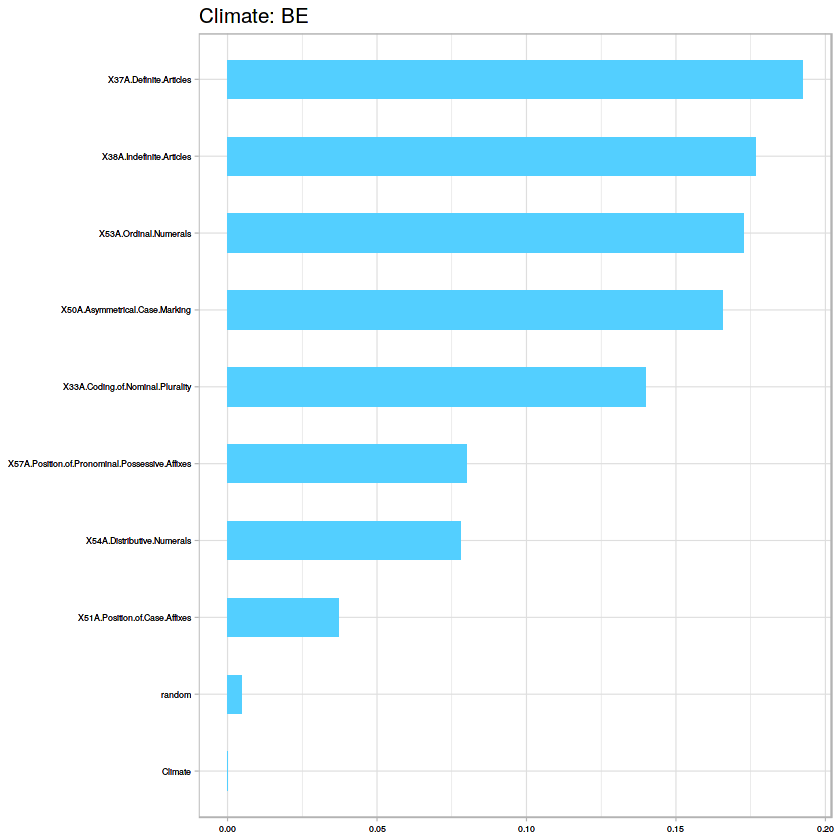

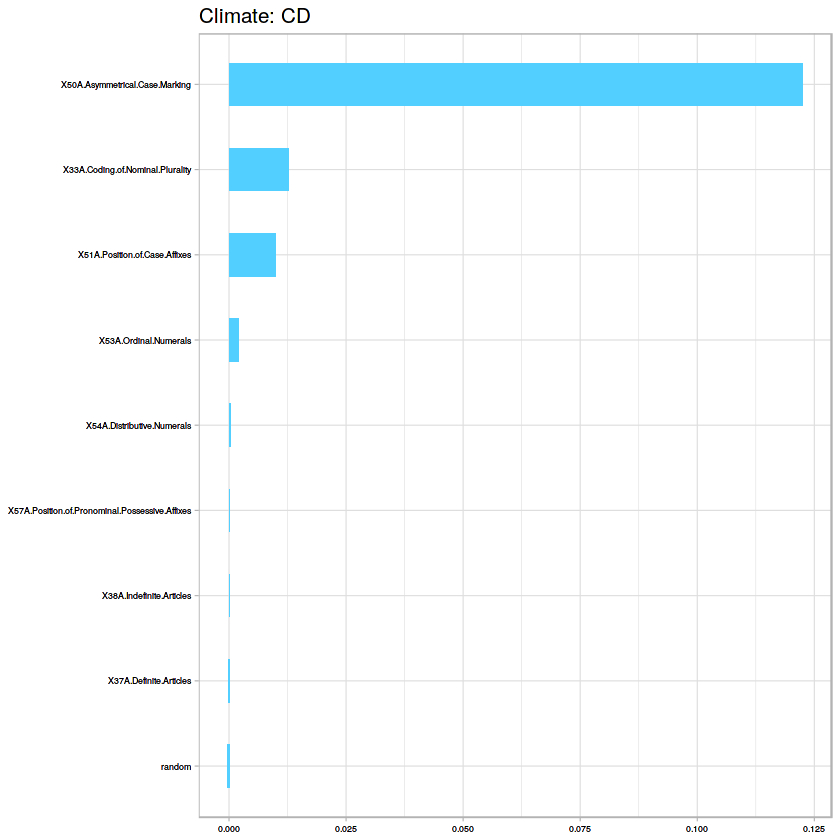

[1] "Accuracy for SVM:75.2173913043478"
   
     Y  Z
  Y 28  4
  Z  0 14
[1] "Climate: "
[1] "C" "E"
[1] "Dummy Classifier"
[1] 0.5449239
[1] 0.5449239
[1] C-V accuracy for Random Forest is 0.653333333333333
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 16 30


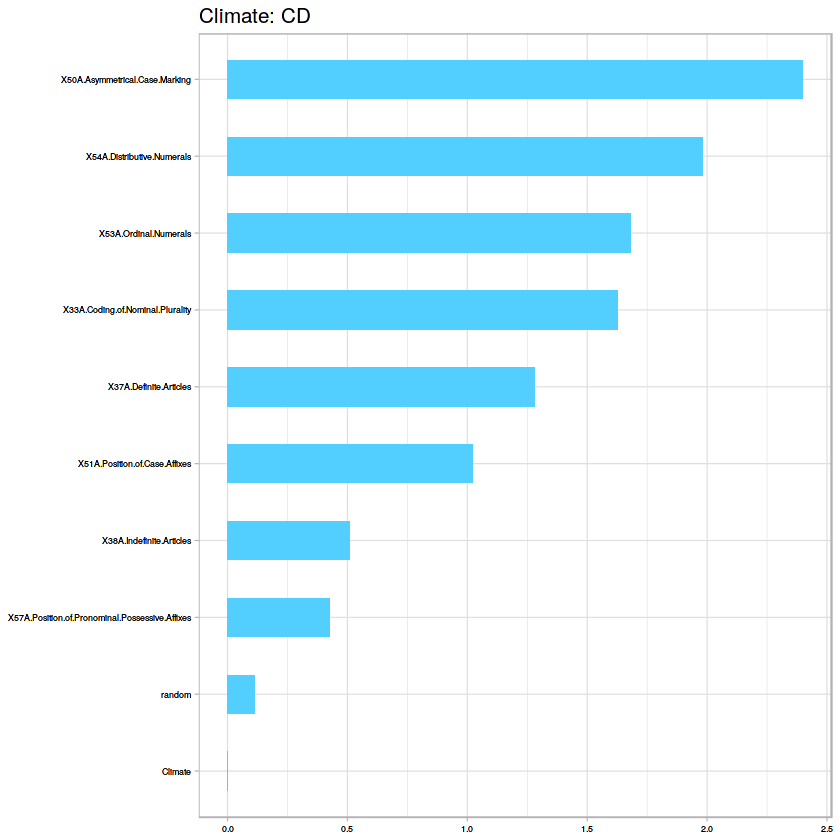

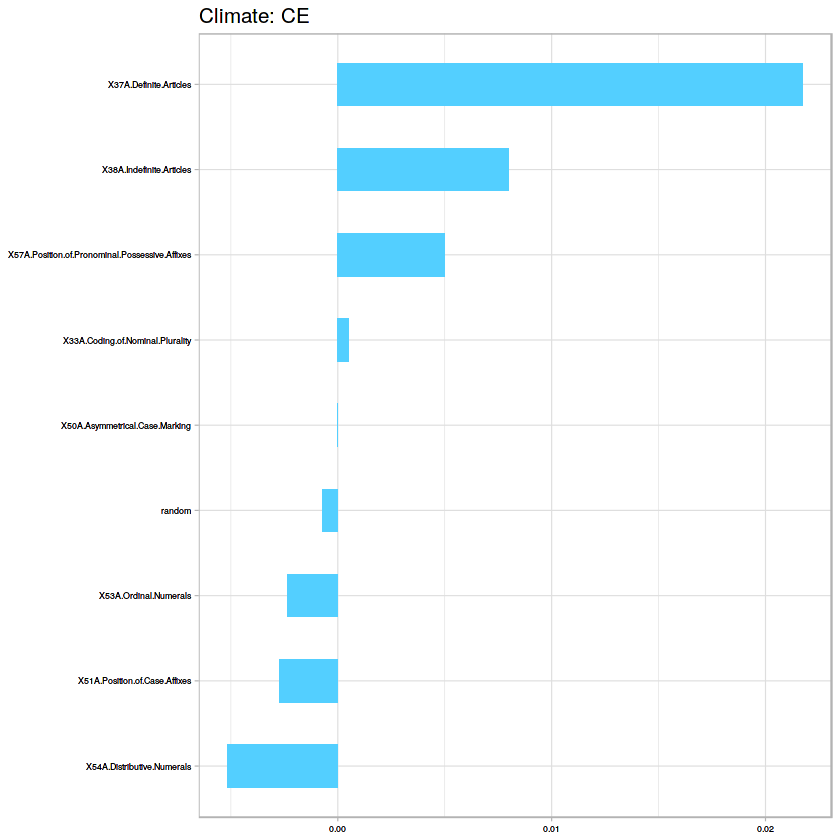

[1] "Accuracy for SVM:60"
   
     Y  Z
  Y  5  0
  Z 11 30
[1] "Climate: "
[1] "D" "E"
[1] "Dummy Classifier"
[1] 0.5733804
[1] 0.5733804
[1] C-V accuracy for Random Forest is 0.696296296296296
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 14 32


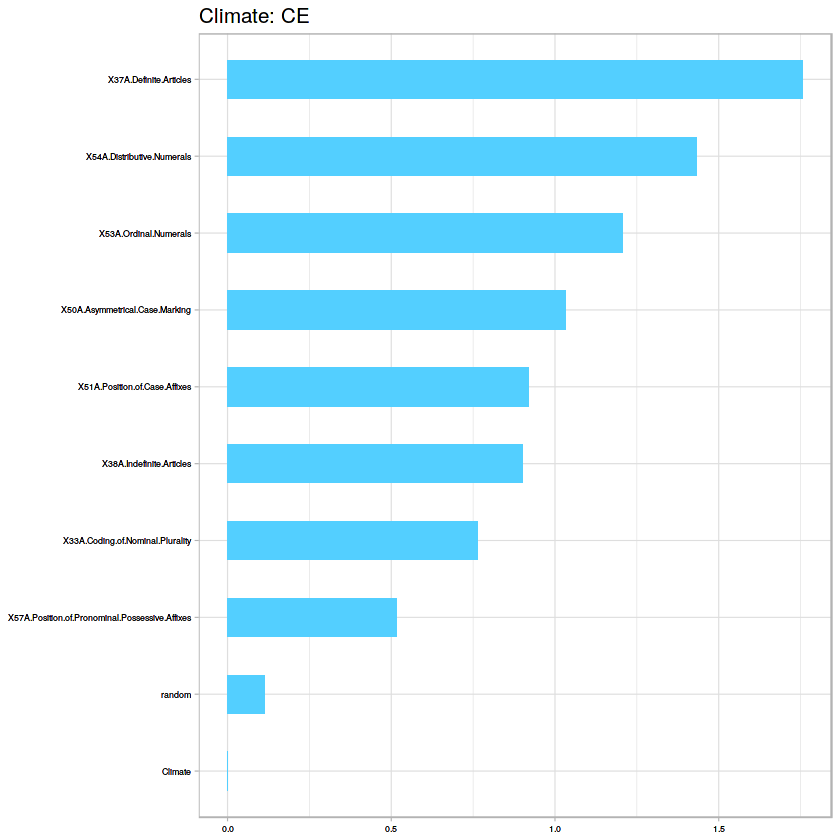

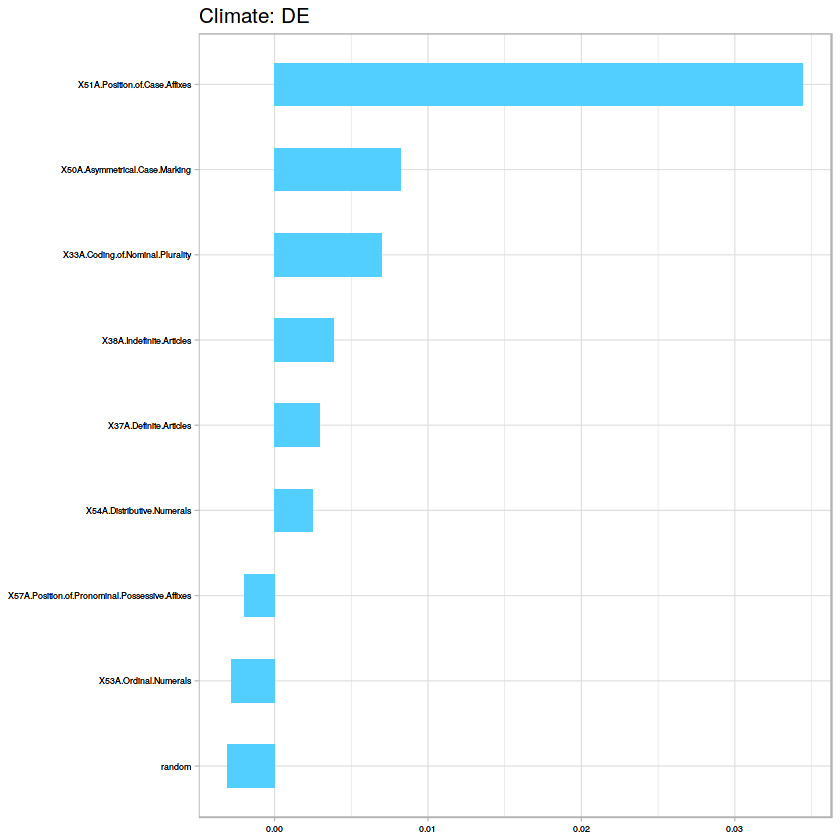

[1] "Accuracy for SVM:77.8260869565217"
   
     Y  Z
  Y  8  0
  Z  6 32


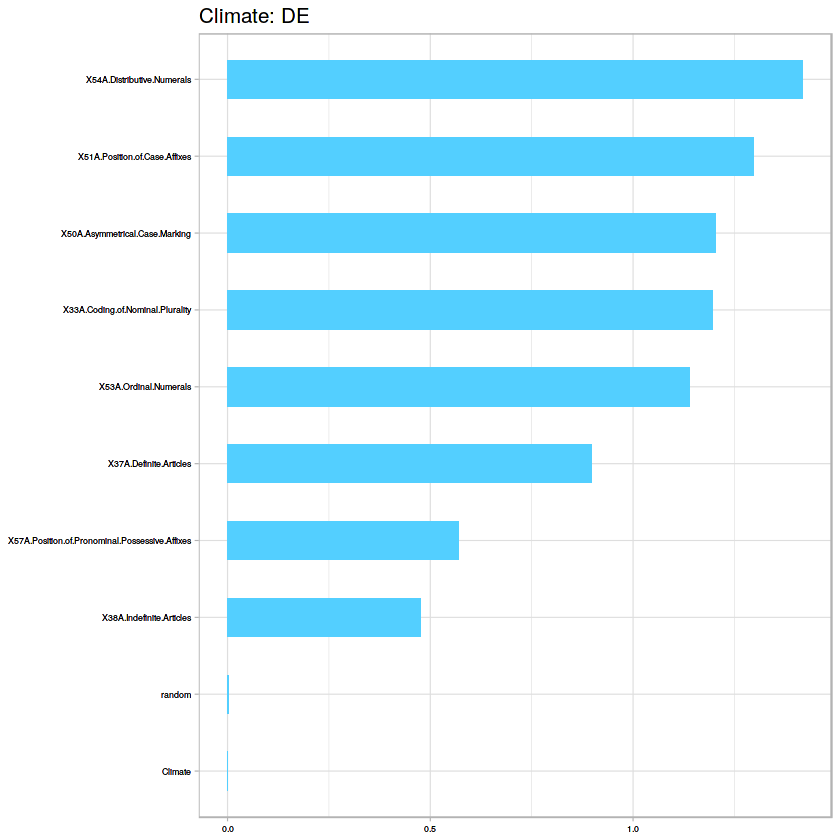

In [362]:
bin_2v3(nom_df)

In [181]:
dis<-c(86,87,97,88,90,96,83,89,81,91,85,144L,'144P',92,95,'143E','143A','143F','143G','144')
dis<-as.character(dis)
dis
ftsl <- vector("list", length(dis)) 
for (i in (1:length(dis))){
ftsl[i]<-grep(dis[i],colnames(lang_df))
}
ftsl<-as.numeric(ftsl)
lang_df[,ftsl]

[1] "86"   "87"   "97"   "88"   "90"   "96"   "83"   "89"   "81"   "91"  
[11] "85"   "144"  "144P" "92"   "95"   "143E" "143A" "143F" "143G"

Warning message:
In ftsl[i] <- grep(dis[i], colnames(lang_df)): number of items to replace is not a multiple of replacement lengthWarning message:
In ftsl[i] <- grep(dis[i], colnames(lang_df)): number of items to replace is not a multiple of replacement length

,X86A.Order.of.Genitive.and.Noun,X87A.Order.of.Adjective.and.Noun,X97A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Adjective.and.Noun,X88A.Order.of.Demonstrative.and.Noun,X90A.Order.of.Relative.Clause.and.Noun,X96A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Relative.Clause.and.Noun,X83A.Order.of.Object.and.Verb,X89A.Order.of.Numeral.and.Noun,X81A.Order.of.Subject..Object.and.Verb,X91A.Order.of.Degree.Word.and.Adjective,X85A.Order.of.Adposition.and.Noun.Phrase,X144P.NegSOV.Order,X144P.NegSOV.Order.1,X92A.Position.of.Polar.Question.Particles,X95A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Adposition.and.Noun.Phrase,X143E.Preverbal.Negative.Morphemes,X143A.Order.of.Negative.Morpheme.and.Verb,X143F.Postverbal.Negative.Morphemes,X143G.Minor.morphological.means.of.signaling.negation
1,NA,2 Noun-Adjective,4 VO and NAdj,2 Noun-Demonstrative,NA,NA,2 VO,2 Noun-Numeral,2 SVO,NA,NA,NA,NA,2 Final,NA,4 None,2 VNeg,1 VNeg,4 None
2,1 Genitive-Noun,2 Noun-Adjective,2 OV and NAdj,2 Noun-Demonstrative,1 Noun-Relative clause,2 OV and NRel,1 OV,2 Noun-Numeral,NA,NA,1 Postpositions,NA,NA,6 No question particle,1 OV and Postpositions,4 None,4 [V-Neg],2 [V-Neg],4 None
3,1 Genitive-Noun,NA,NA,2 Noun-Demonstrative,NA,NA,1 OV,2 Noun-Numeral,1 SOV,NA,1 Postpositions,4 No NegSOV,4 No NegSOV,NA,1 OV and Postpositions,4 None,2 VNeg,1 VNeg,4 None
4,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
5,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
6,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
7,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
8,3 No dominant order,3 No dominant order,5 Other,1 Demonstrative-Noun,1 Noun-Relative clause,4 VO and NRel,2 VO,NA,2 SVO,1 Degree word-Adjective,2 Prepositions,NA,NA,NA,4 VO and Prepositions,1 NegV,1 NegV,4 None,4 None
9,1 Genitive-Noun,2 Noun-Adjective,2 OV and NAdj,1 Demonstrative-Noun,2 Relative clause-Noun,1 OV and RelN,1 OV,3 No dominant order,1 SOV,1 Degree word-Adjective,1 Postpositions,4 No NegSOV,4 No NegSOV,6 No question particle,1 OV and Postpositions,2 [Neg-V],11 Type 3 / Type 4,2 [V-Neg],4 None
10,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


[1] "Abkhaz"                  "Angami"                 
 [3] "Akha"                    "Alamblak"               
 [5] "Amele"                   "Ao"                     
 [7] "Apatani"                 "Armenian (Eastern)"     
 [9] "Awtuw"                   "Bawm"                   
[11] "Burmese"                 "Basque"                 
[13] "Burushaski"              "Choctaw"                
[15] "Chuvash"                 "Comanche"               
[17] "Diegue??o (Mesa Grande)" "Dinka"                  
[19] "Darma"                   "Evenki"                 
[21] "German"                  "Gumawana"               
[23] "Greenlandic (West)"      "Gurung"                 
[25] "Haida"                   "Hayu"                   
[27] "Hindi"                   "Jamsay"                 
[29] "Japanese"                "Khalkha"                
[31] "Khoekhoe"                "Kisi"                   
[33] "Karakalpak"              "Kham"                   
[35] "Kamasau"                 "Kannada"                
[37] "Kunama"                  "Kanuri"                 
[39] "Kobon"                   "Korean"                 
[41] "Lahu"                    "Lai"                    
[43] "Lezgian"                 "Lisu"                   
[45] "Lakhota"                 "Lamani"                 
[47] "Maba"                    "Macushi"                
[49] "Marathi"                 "Manam"                  
[51] "Mansi"                   "Maru"                   
[53] "Mising"                  "Mundari"                
[55] "Namia"                   "Navajo"                 
[57] "Nubian (Dongolese)"      "Newari (Kathmandu)"     
[59] "Newar (Dolakha)"         "Oromo (Harar)"          
[61] "Panjabi"                 "Persian"                
[63] "Pashto"                  "Pattani"                
[65] "Quechua (Imbabura)"      "Rawang"                 
[67] "Sinaugoro"               "Somali"                 
[69] "Siroi"                   "Tariana"                
[71] "Telugu"                  "Tshangla"               
[73] "Kuuk Thaayorre"          "Tamil"                  
[75] "T?_mpisa Shoshone"       "Turkish"                
[77] "Una"                     "Urdu"                   
[79] "Yaqui"

[1] "Northwest Caucasian" "Sino-Tibetan"        "Sino-Tibetan"       
 [4] "Sepik"               "Trans-New Guinea"    "Sino-Tibetan"       
 [7] "Sino-Tibetan"        "Indo-European"       "Sepik"              
[10] "Sino-Tibetan"        "Sino-Tibetan"        "Basque"             
[13] "Burushaski"          "Muskogean"           "Altaic"             
[16] "Uto-Aztecan"         "Hokan"               "Eastern Sudanic"    
[19] "Sino-Tibetan"        "Altaic"              "Indo-European"      
[22] "Austronesian"        "Eskimo-Aleut"        "Sino-Tibetan"       
[25] "Haida"               "Sino-Tibetan"        "Indo-European"      
[28] "Dogon"               "Japanese"            "Altaic"             
[31] "Khoe-Kwadi"          "Niger-Congo"         "Altaic"             
[34] "Sino-Tibetan"        "Torricelli"          "Dravidian"          
[37] "Kunama"              "Saharan"             "Trans-New Guinea"   
[40] "Korean"              "Sino-Tibetan"        "Sino-Tibetan"       
[43] "Nakh-Daghestanian"   "Sino-Tibetan"        "Siouan"             
[46] "Indo-European"       "Maban"               "Cariban"            
[49] "Indo-European"       "Austronesian"        "Uralic"             
[52] "Sino-Tibetan"        "Sino-Tibetan"        "Austro-Asiatic"     
[55] "Sepik"               "Na-Dene"             "Eastern Sudanic"    
[58] "Sino-Tibetan"        "Sino-Tibetan"        "Afro-Asiatic"       
[61] "Indo-European"       "Indo-European"       "Indo-European"      
[64] "Sino-Tibetan"        "Quechuan"            "Sino-Tibetan"       
[67] "Austronesian"        "Afro-Asiatic"        "Trans-New Guinea"   
[70] "Arawakan"            "Dravidian"           "Sino-Tibetan"       
[73] "Pama-Nyungan"        "Dravidian"           "Uto-Aztecan"        
[76] "Altaic"              "Trans-New Guinea"    "Indo-European"      
[79] "Uto-Aztecan"


       Afro-Asiatic              Altaic            Arawakan      Austro-Asiatic 
                  2                   5                   1                   1 
       Austronesian              Basque          Burushaski             Cariban 
                  3                   1                   1                   1 
              Dogon           Dravidian     Eastern Sudanic        Eskimo-Aleut 
                  1                   3                   2                   1 
              Haida               Hokan       Indo-European            Japanese 
                  1                   1                   9                   1 
         Khoe-Kwadi              Korean              Kunama               Maban 
                  1                   1                   1                   1 
          Muskogean             Na-Dene   Nakh-Daghestanian         Niger-Congo 
                  1                   1                   1                   1 
Northwest Caucasian        

[1] "X86A.Order.of.Genitive.and.Noun"                                                                   
 [2] "X87A.Order.of.Adjective.and.Noun"                                                                  
 [3] "X97A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Adjective.and.Noun"        
 [4] "X88A.Order.of.Demonstrative.and.Noun"                                                              
 [5] "X90A.Order.of.Relative.Clause.and.Noun"                                                            
 [6] "X96A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Relative.Clause.and.Noun"  
 [7] "X83A.Order.of.Object.and.Verb"                                                                     
 [8] "X89A.Order.of.Numeral.and.Noun"                                                                    
 [9] "X81A.Order.of.Subject..Object.and.Verb"                                                            
[10] "X91A.Order.of.Degree.Word.and.Adjective"                                                           
[11] "X85A.Order.of.Adposition.and.Noun.Phrase"                                                          
[12] "X144P.NegSOV.Order"                                                                                
[13] "X144P.NegSOV.Order.1"                                                                              
[14] "X92A.Position.of.Polar.Question.Particles"                                                         
[15] "X95A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Adposition.and.Noun.Phrase"
[16] "X143E.Preverbal.Negative.Morphemes"                                                                
[17] "X143A.Order.of.Negative.Morpheme.and.Verb"                                                         
[18] "X143F.Postverbal.Negative.Morphemes"                                                               
[19] "X143G.Minor.morphological.means.of.signaling.negation"                                             
[20] "Climate"                                                                                           
[21] "random"

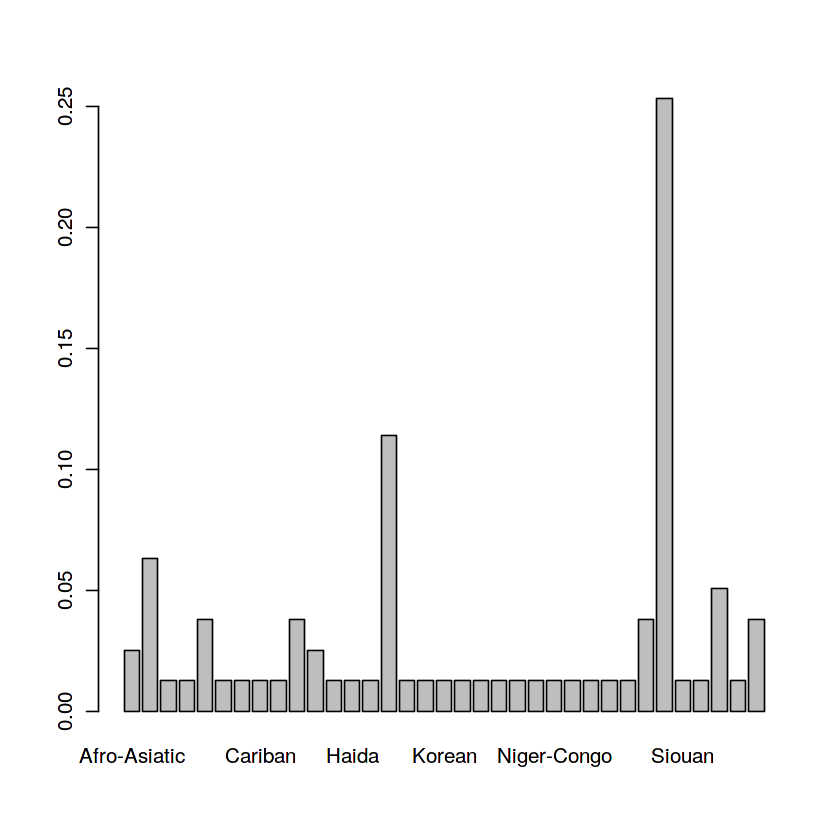

In [193]:
#Word Order and Additional Features
s<-c(1,3,ftsl,176,177)
wo_df<-na.omit(lang_df[,s])
#wo_df[,2]<-as.factor(morp_df[,2])
wo_df[,1]
wo_df[,2]
table(wo_df[,2])
barplot(prop.table(table(wo_df[,2])))
wo_df<-wo_df[,-c(1,2)]
colnames(wo_df)

wo_df[sapply(wo_df, is.character)] <- lapply(wo_df[sapply(wo_df, is.character)], as.factor)

[1] 0.2319565
[1] "C-V accuracy for Random Forest is  0.493762254901961"
[1] "0.493762254901961"
[1] "RF Confusion Matrix:"
   
     A  B  C  D  E
  A 17  4  5  0  0
  B  1 16  3  5  2
  C  3  2 16  4  1
  D  0  0  0  0  0
  E  0  0  0  0  0


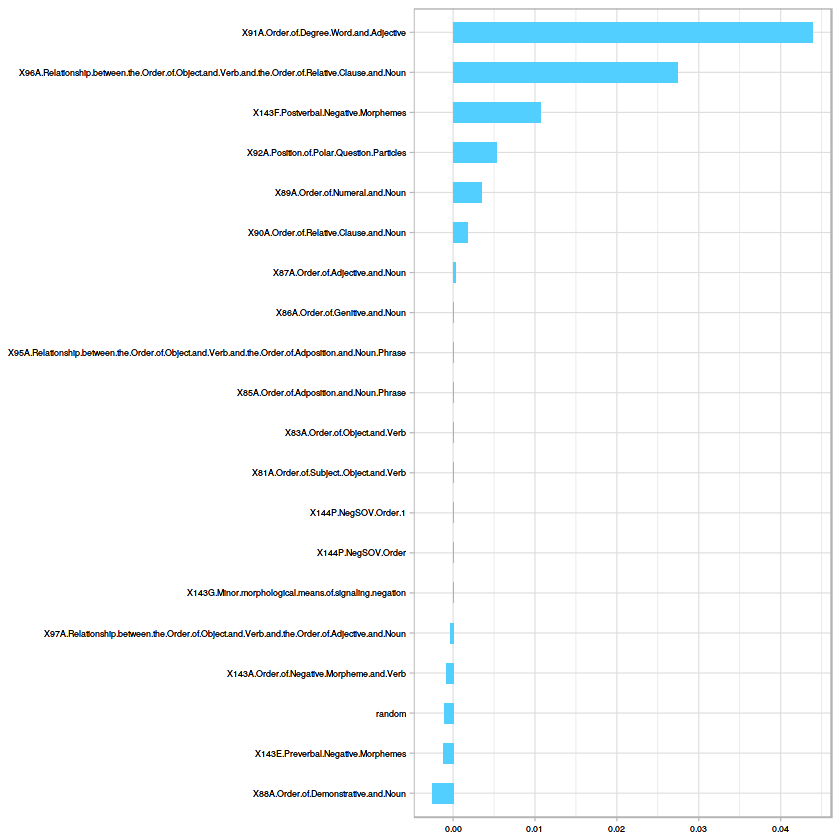

[1] "Accuracy for SVM:45.0632911392405"
   
     A  B  C  D  E
  A 17  1  1  0  0
  B  1 19  2  4  2
  C  3  2 21  5  1
  D  0  0  0  0  0
  E  0  0  0  0  0


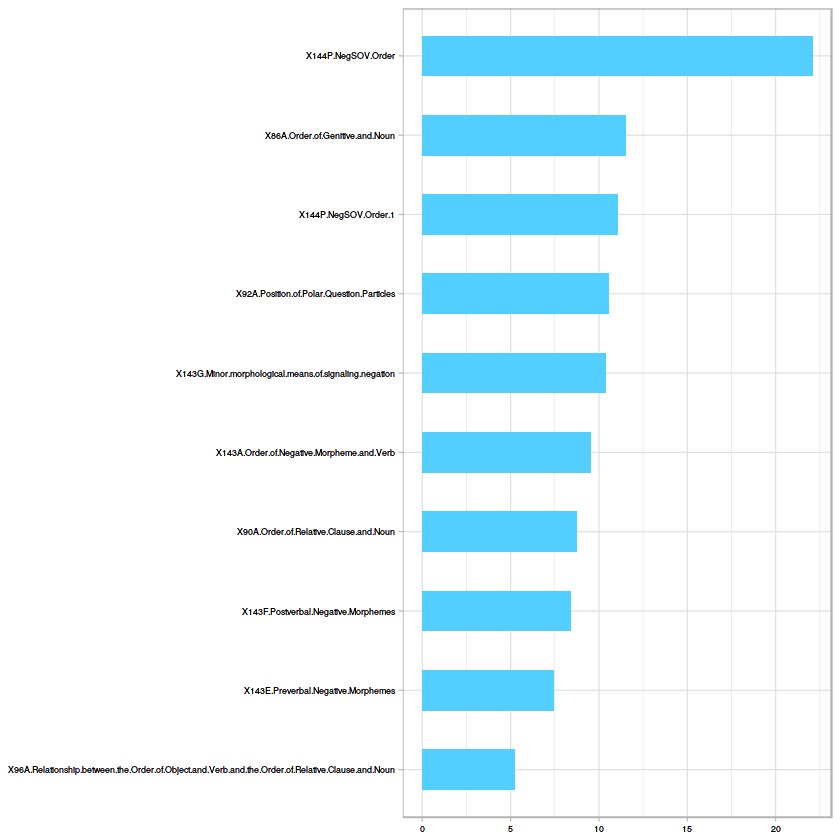

In [211]:
#Multiclass Classification for Word Order
dummy_clas(class,nom_df$Climate,dist(wo_df))
cvrf(wo_df)
svmc(wo_df)

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.6092911
[1] 0.7858497
[1] C-V accuracy for Random Forest is 0.785849673202614
[1] "RF Confusion Matrix:"
   
     A  X
  A 14  8
  X  7 50


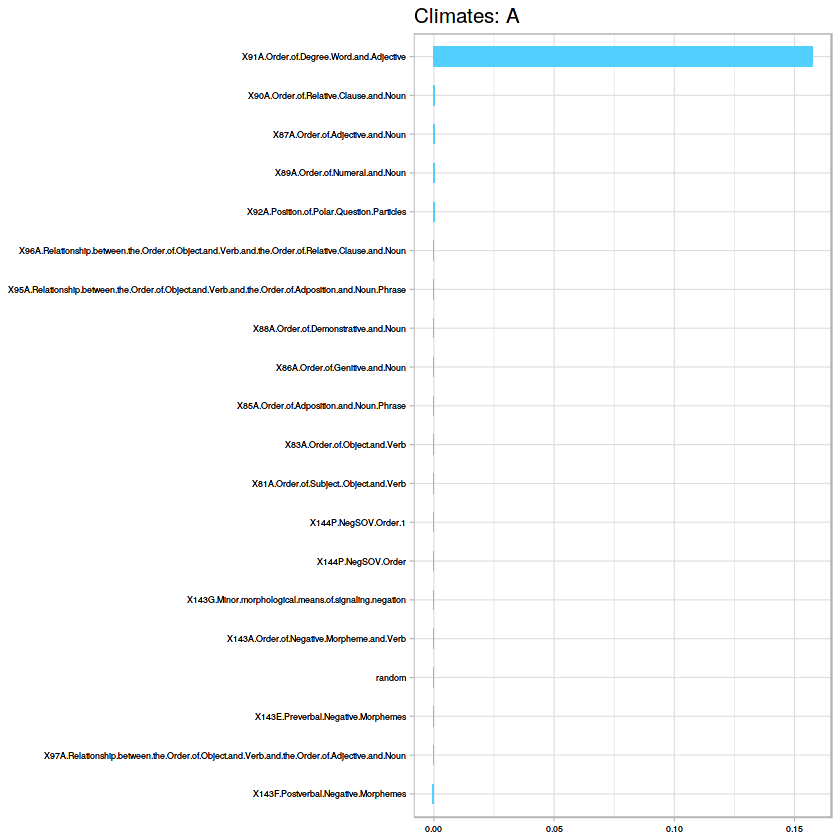

[1] "Accuracy for SVM:74.6835443037975"
   
     A  X
  A 10  0
  X 11 58
   
     A  X
  A 10  0
  X 11 58
[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.5989177
[1] 0.7311438
[1] C-V accuracy for Random Forest is 0.731143790849673
[1] "RF Confusion Matrix:"
   
     B  X
  B  5  1
  X 17 56


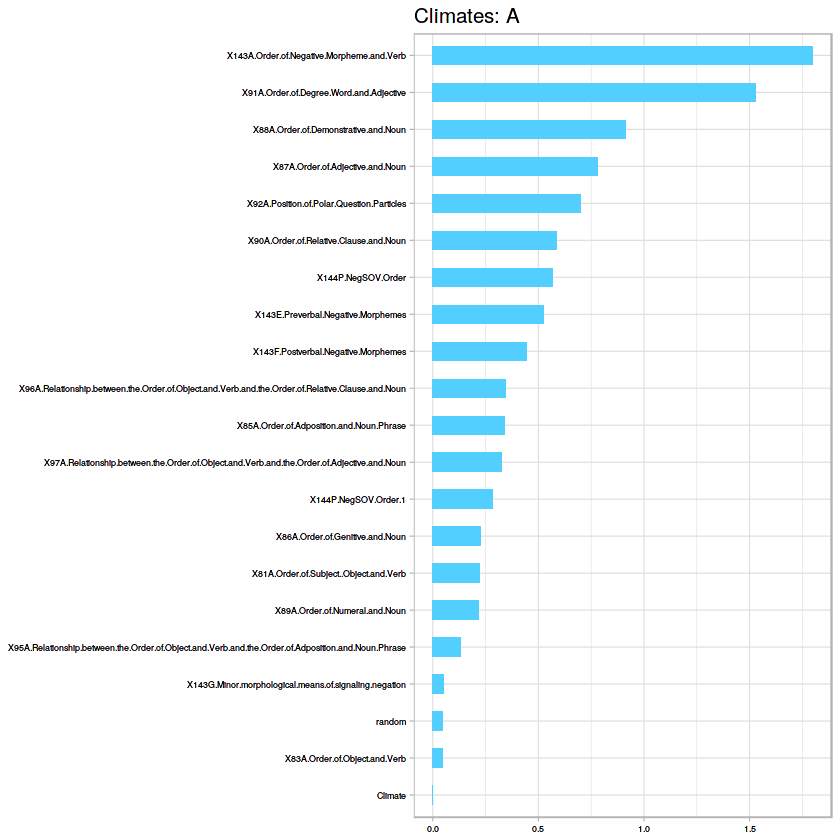

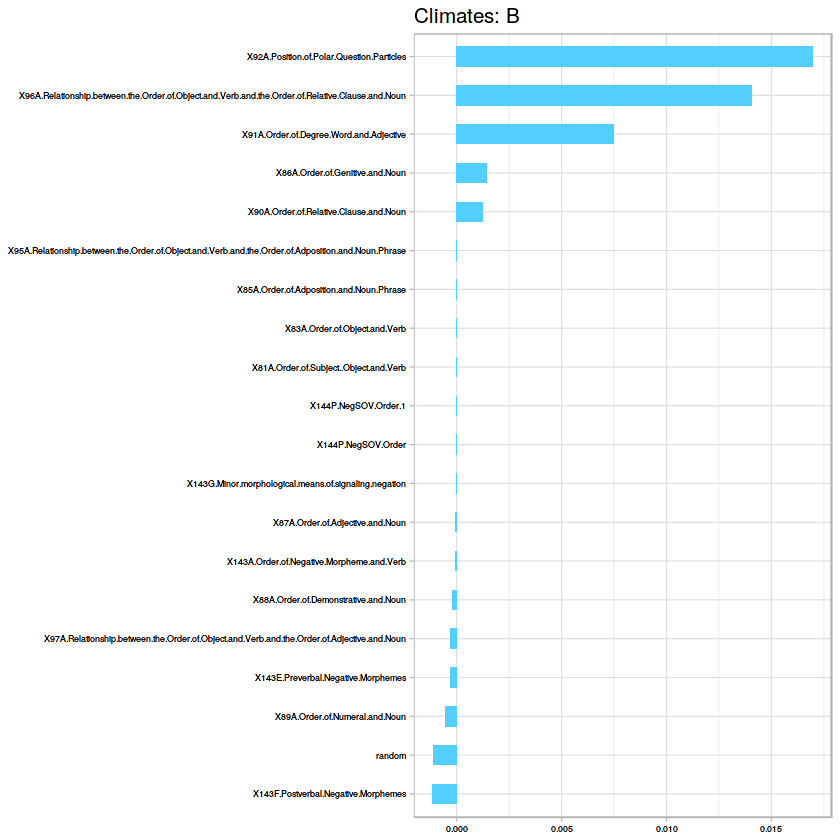

[1] "Accuracy for SVM:69.3670886075949"
   
     B  X
  B  7  0
  X 15 57
   
     B  X
  B  7  0
  X 15 57
[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.577
[1] 0.7211111
[1] C-V accuracy for Random Forest is 0.721111111111111
[1] "RF Confusion Matrix:"
   
     C  X
  C 11  3
  X 13 52


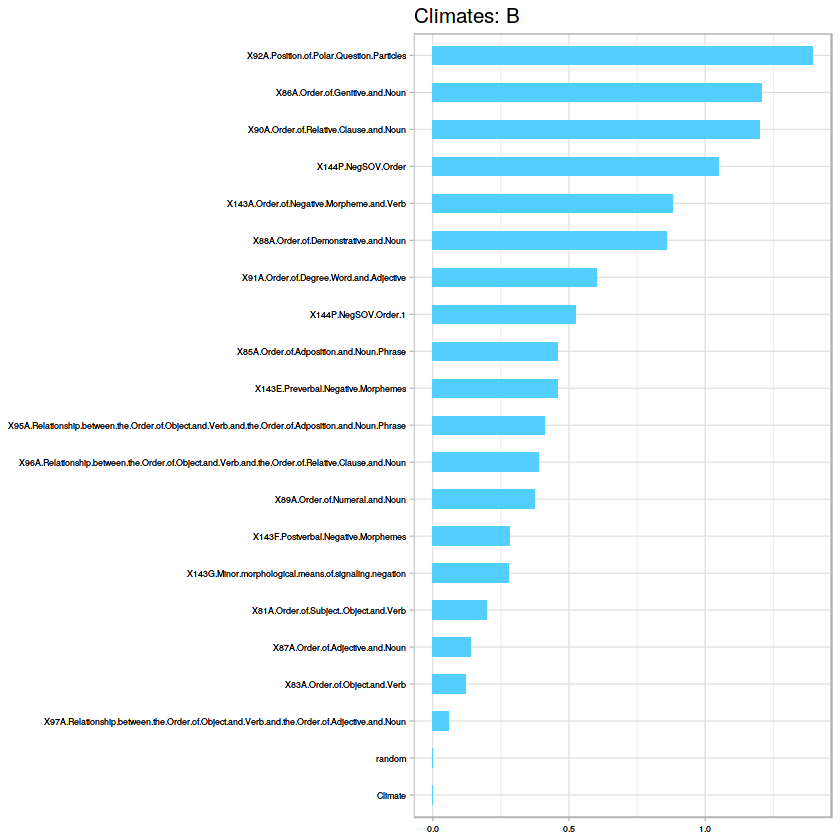

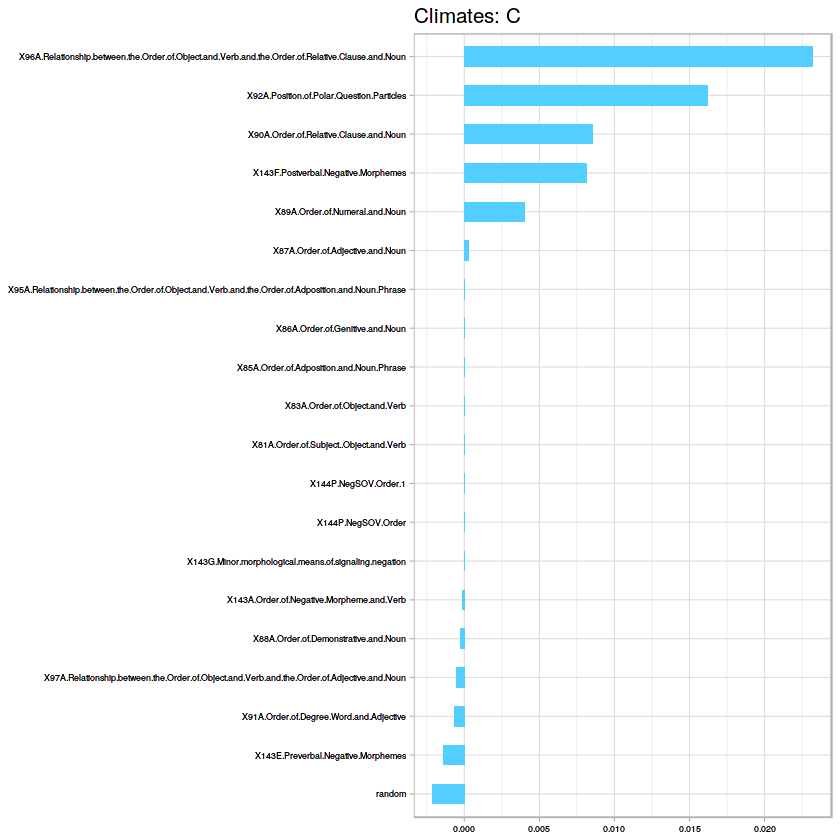

[1] "Accuracy for SVM:67.5949367088608"
   
     C  X
  C  8  0
  X 16 55
   
     C  X
  C  8  0
  X 16 55
[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.7984937
[1] 0.8866667
[1] C-V accuracy for Random Forest is 0.886666666666667
[1] "RF Confusion Matrix:"
   
     D  X
  D  0  0
  X  9 70


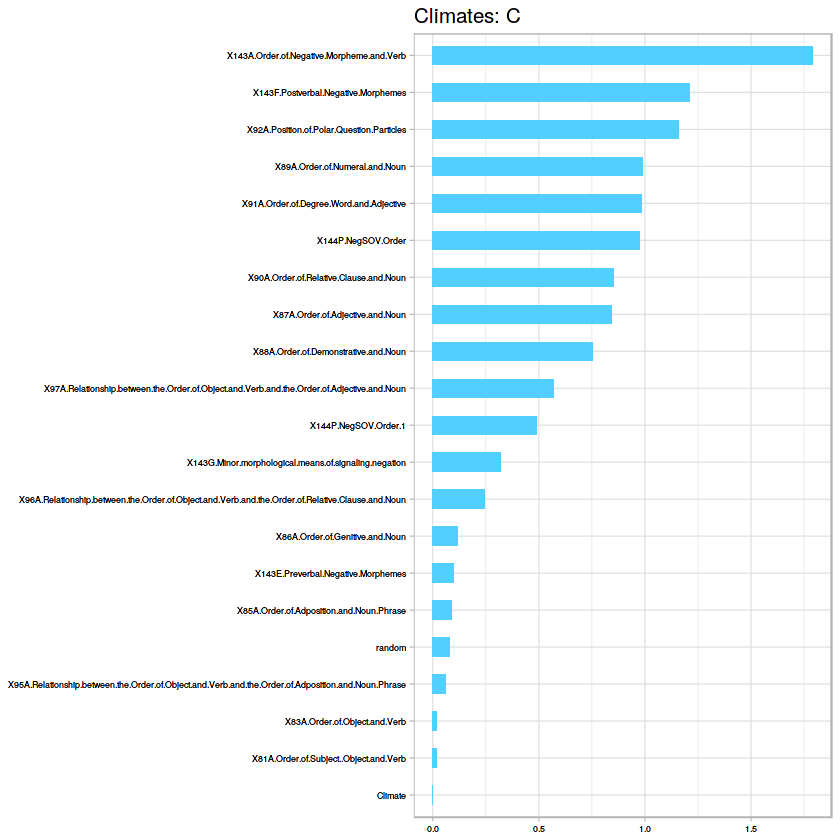

[1] "Accuracy for SVM:88.6075949367089"
   
     D  X
  D  0  0
  X  9 70
   
     D  X
  D  0  0
  X  9 70
[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.926481


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

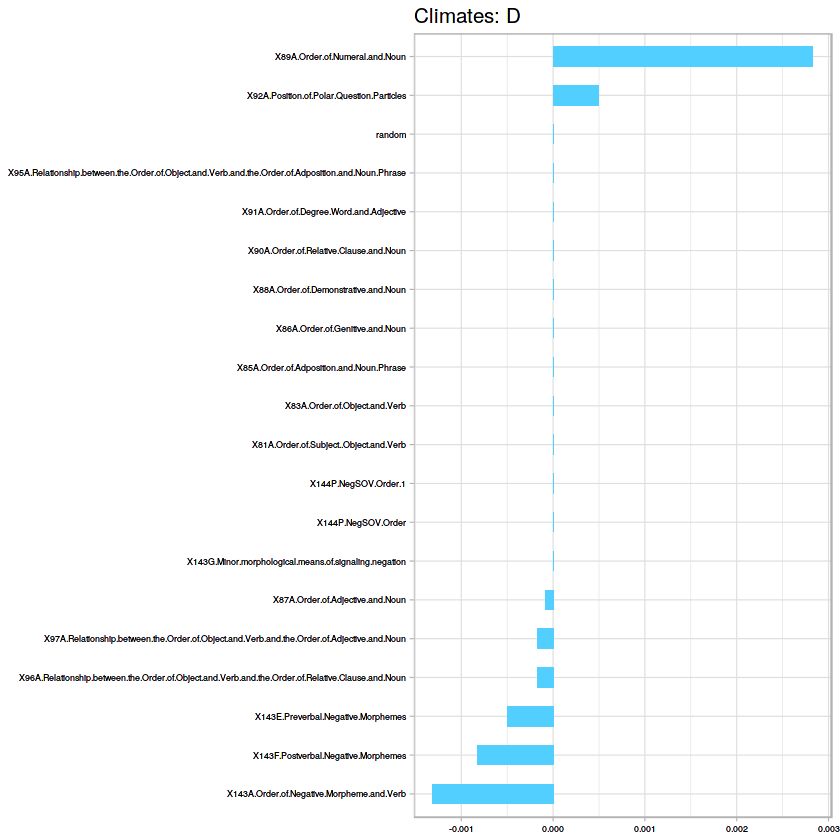

[1] 0.9627451
[1] C-V accuracy for Random Forest is 0.962745098039216
[1] "RF Confusion Matrix:"
   
     E  X
  E  0  0
  X  3 76


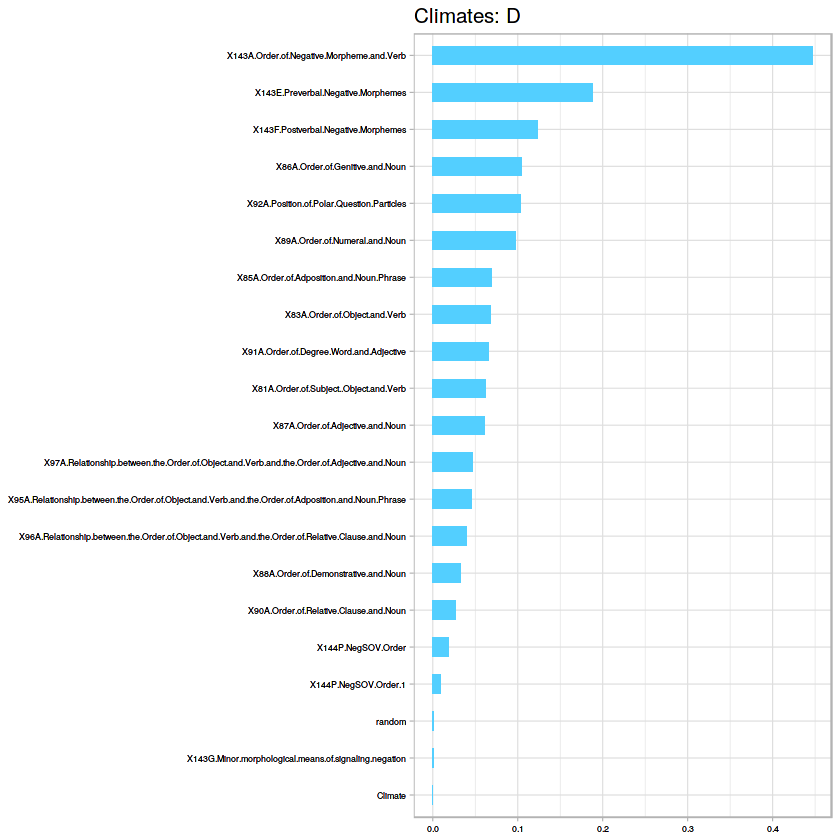

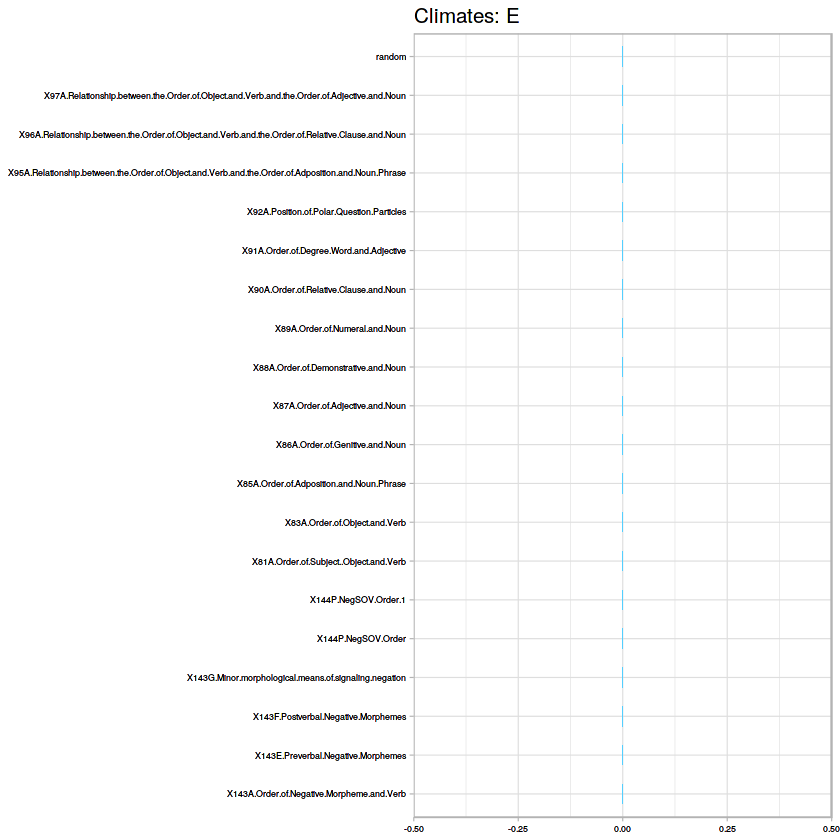

[1] "Accuracy for SVM:96.2025316455696"
   
     E  X
  E  0  0
  X  3 76
   
     E  X
  E  0  0
  X  3 76


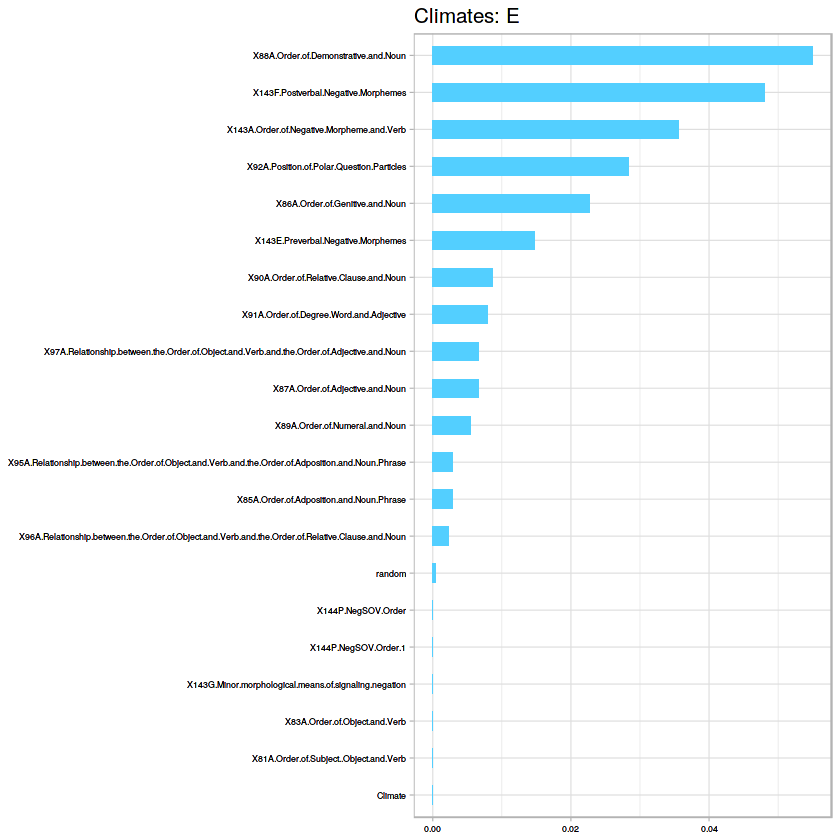

In [339]:
ovsa(wo_df)

[1] "A" "B"
[1] 0.5016628
[1] "Dummy Classifier accuracy:0.501662790697674"
[1] C-V accuracy for Random Forest is 0.733148148148148
[1] "RF Confusion Matrix:"
   
     A  B
  A 16  4
  B  5 18


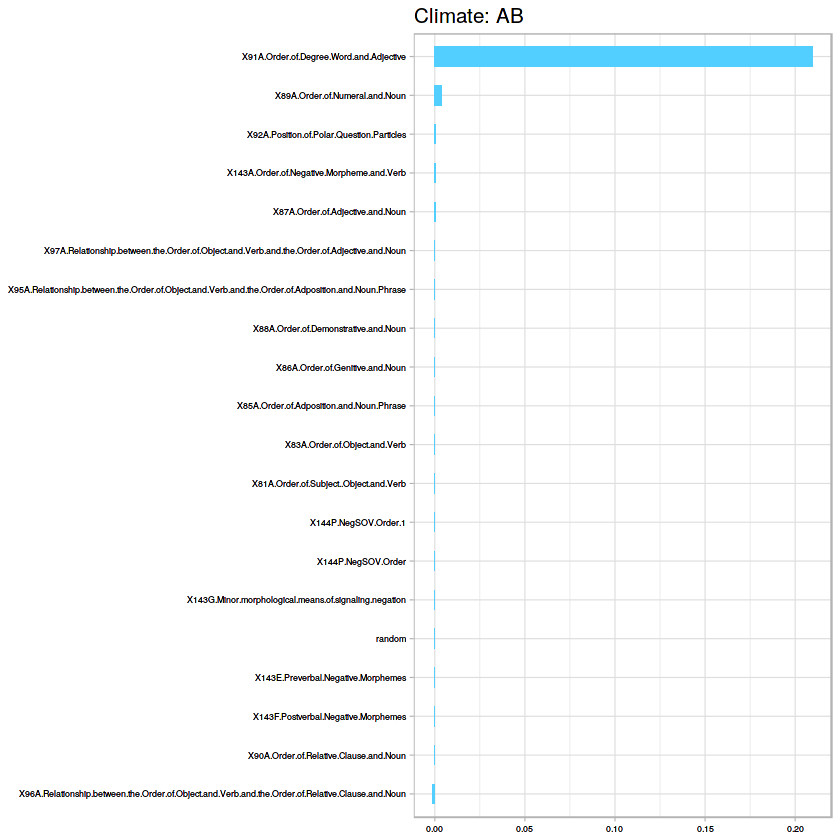

[1] "Accuracy for SVM:73.0232558139535"
   
     A  B
  A 20  1
  B  1 21
   
     A  B
  A 20  1
  B  1 21
[1] "A" "C"
[1] 0.5005778
[1] "Dummy Classifier accuracy:0.500577777777778"
[1] C-V accuracy for Random Forest is 0.687962962962963
[1] "RF Confusion Matrix:"
   
     A  C
  A 16  4
  C  5 20


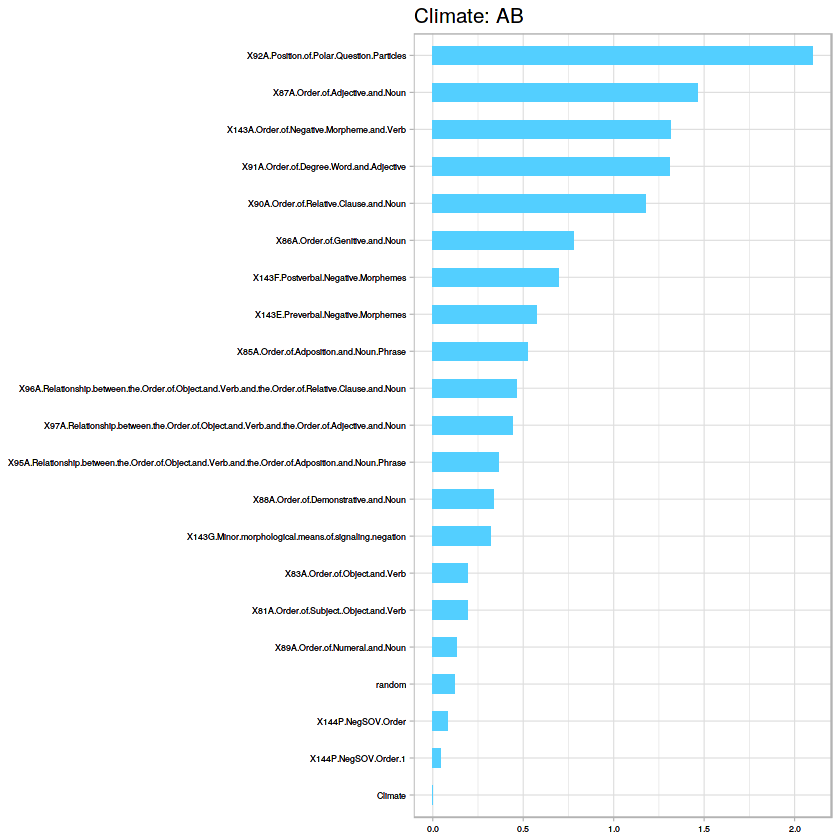

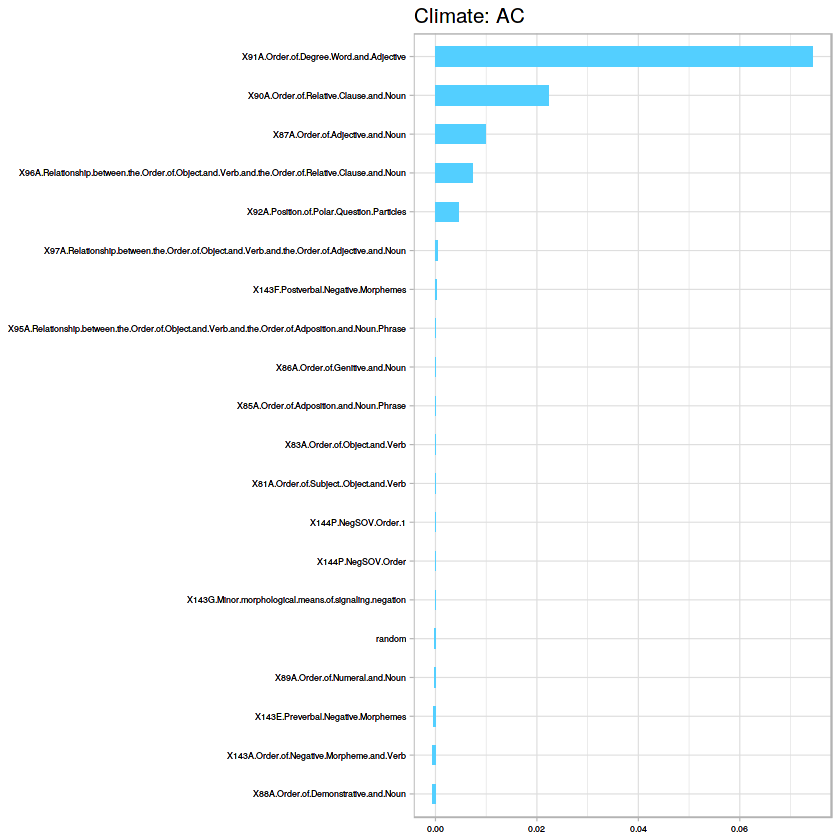

[1] "Accuracy for SVM:72"
   
     A  C
  A 17  1
  C  4 23
   
     A  C
  A 17  1
  C  4 23
[1] "A" "D"
[1] 0.584
[1] "Dummy Classifier accuracy:0.584"
[1] C-V accuracy for Random Forest is 0.803174603174603
[1] "RF Confusion Matrix:"
   
     A  D
  A 21  9
  D  0  0


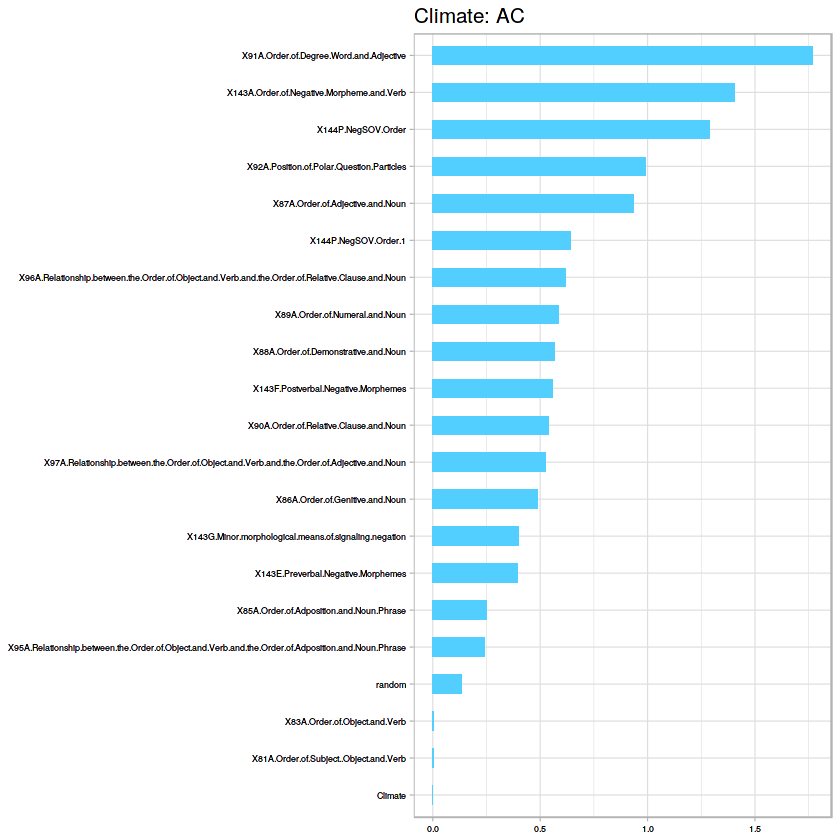

[1] "Accuracy for SVM:68"
   
     A  D
  A 21  3
  D  0  6
   
     A  D
  A 21  3
  D  0  6
[1] "A" "E"
[1] 0.7793542
[1] "Dummy Classifier accuracy:0.779354166666667"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

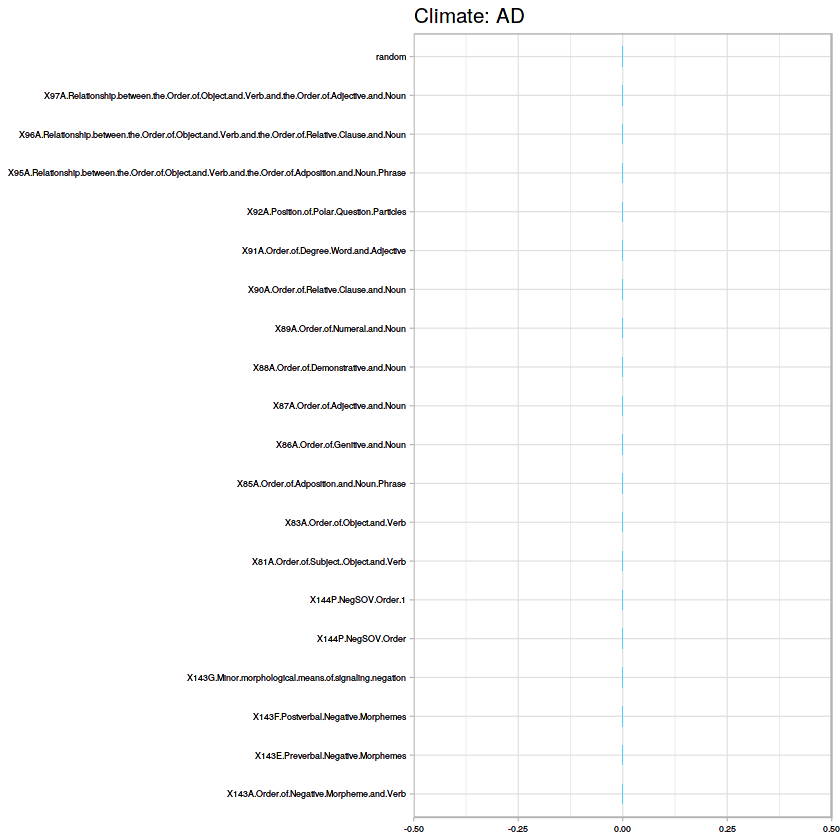

[1] C-V accuracy for Random Forest is 0.884444444444444
[1] "RF Confusion Matrix:"
   
     A  E
  A 21  3
  E  0  0


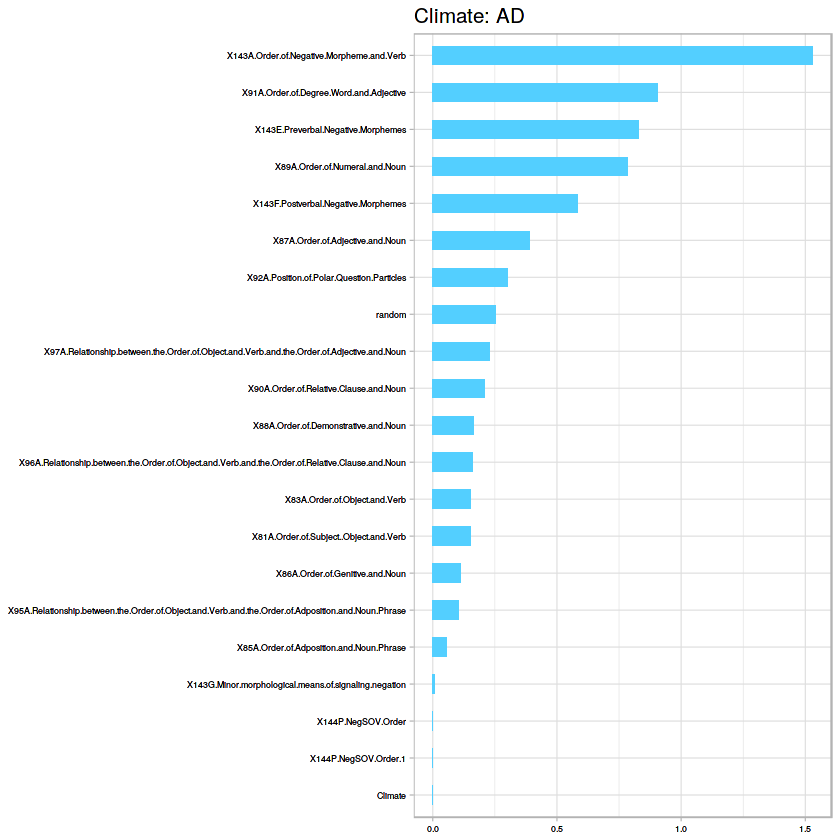

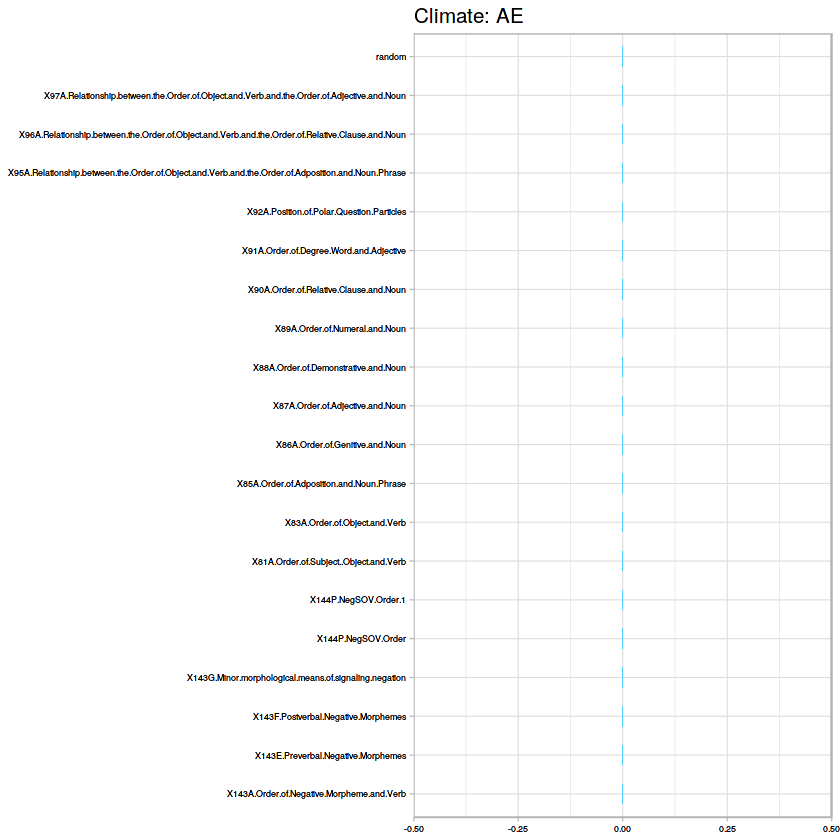

[1] "Accuracy for SVM:87.5"
   
     A  E
  A 21  3
  E  0  0
   
     A  E
  A 21  3
  E  0  0
[1] "B" "C"
[1] 0.5005
[1] "Dummy Classifier accuracy:0.5005"
[1] C-V accuracy for Random Forest is 0.710555555555555
[1] "RF Confusion Matrix:"
   
     B  C
  B 17  7
  C  5 17


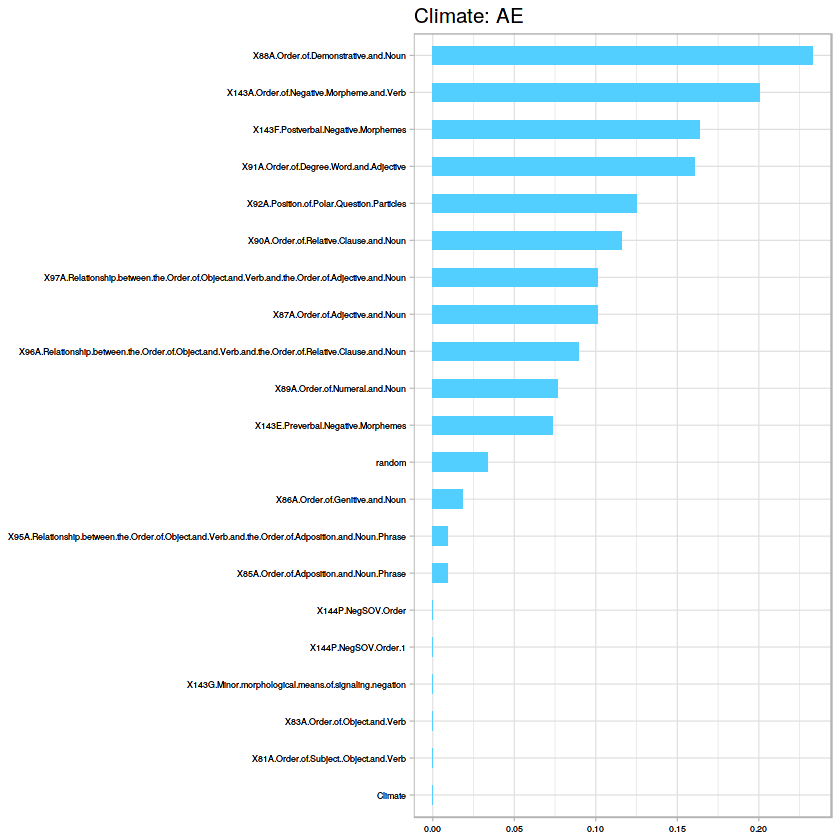

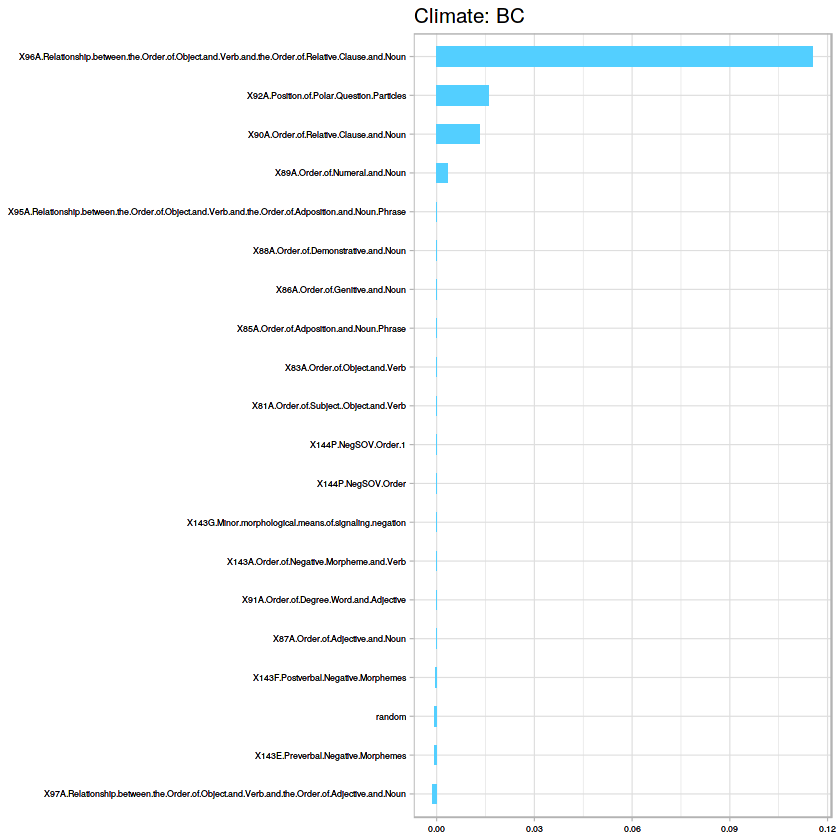

[1] "Accuracy for SVM:64.3478260869565"
   
     B  C
  B 20  1
  C  2 23
   
     B  C
  B 20  1
  C  2 23
[1] "B" "D"
[1] 0.5866613
[1] "Dummy Classifier accuracy:0.586661290322581"
[1] C-V accuracy for Random Forest is 0.71047619047619
[1] "RF Confusion Matrix:"
   
     B  D
  B 22  9
  D  0  0


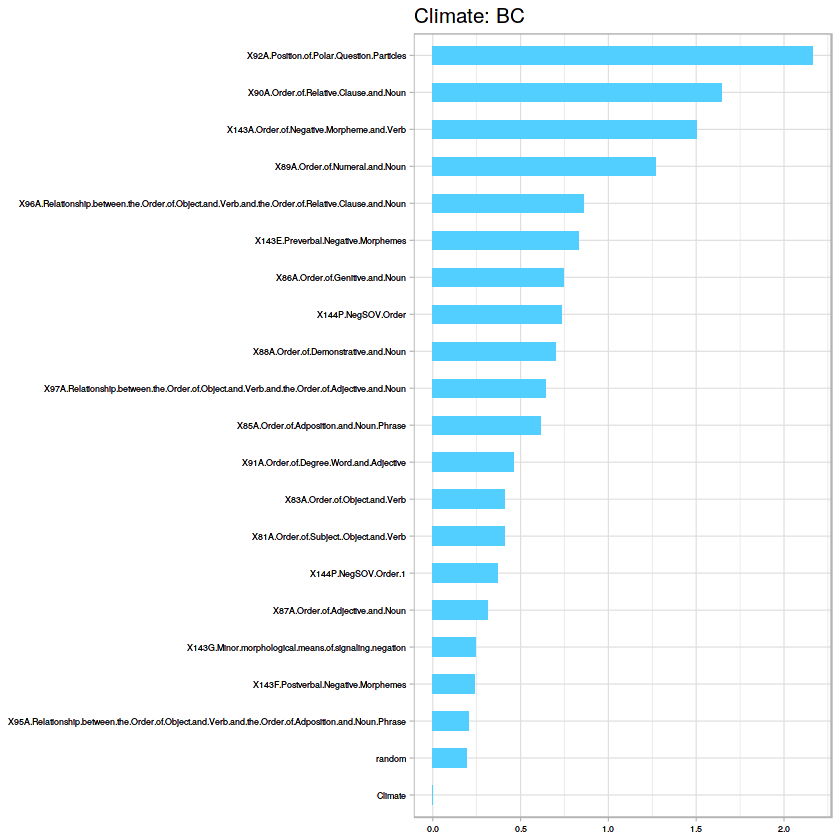

[1] "Accuracy for SVM:65.8064516129032"
   
     B  D
  B 22  7
  D  0  2
   
     B  D
  B 22  7
  D  0  2
[1] "B" "E"
[1] 0.78874
[1] "Dummy Classifier accuracy:0.78874"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

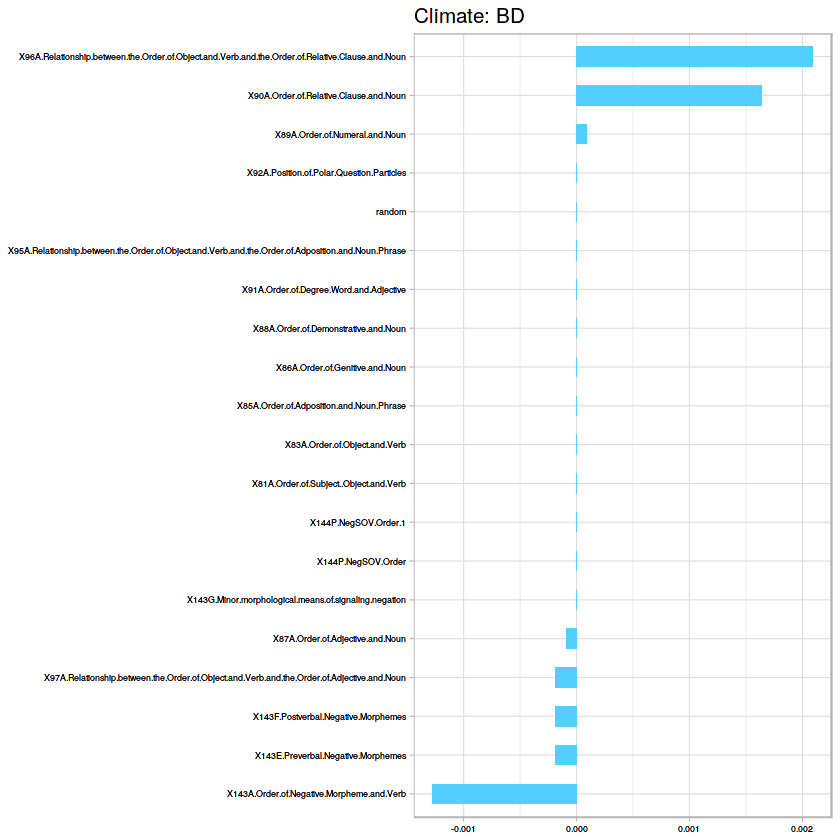

[1] C-V accuracy for Random Forest is 0.891111111111111
[1] "RF Confusion Matrix:"
   
     B  E
  B 22  3
  E  0  0


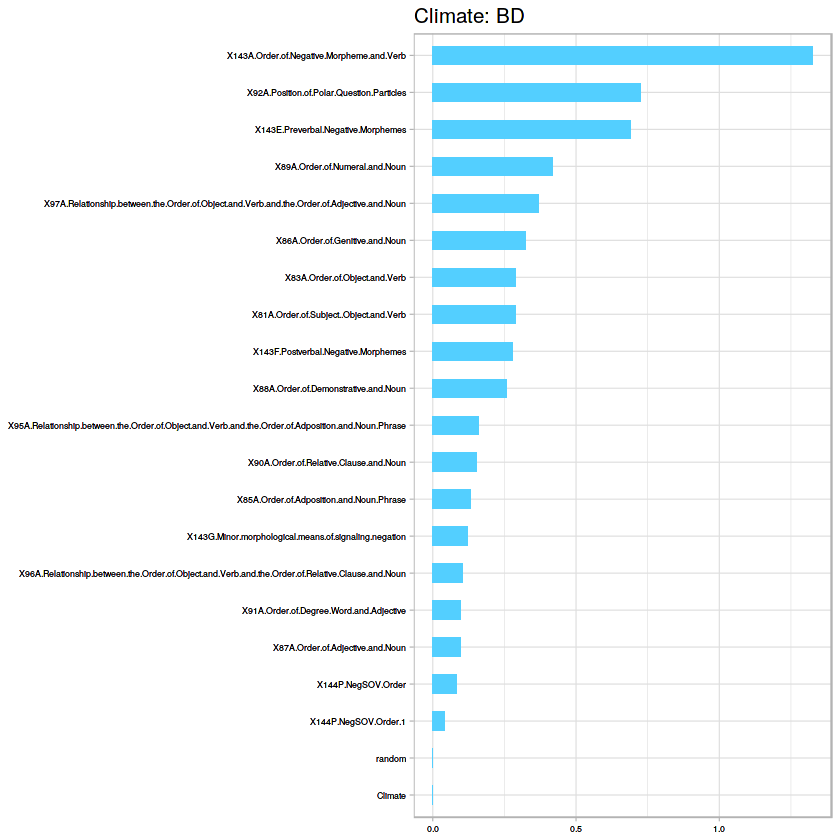

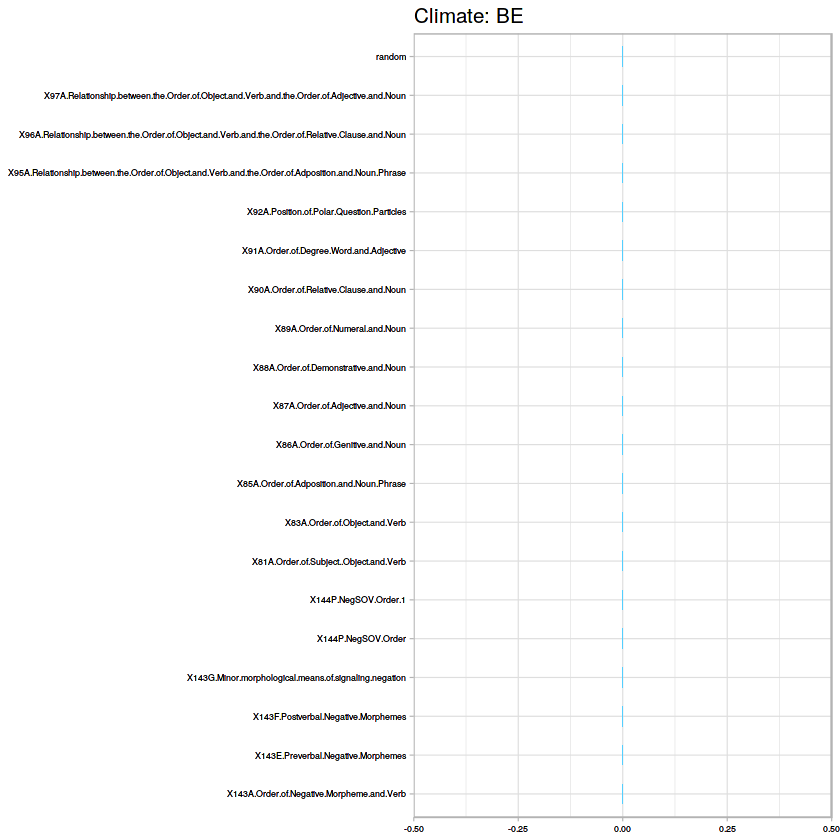

[1] "Accuracy for SVM:88"
   
     B  E
  B 22  3
  E  0  0
   
     B  E
  B 22  3
  E  0  0
[1] "C" "D"
[1] 0.6012727
[1] "Dummy Classifier accuracy:0.601272727272727"
[1] C-V accuracy for Random Forest is 0.771428571428571
[1] "RF Confusion Matrix:"
   
     C  D
  C 22  3
  D  2  6


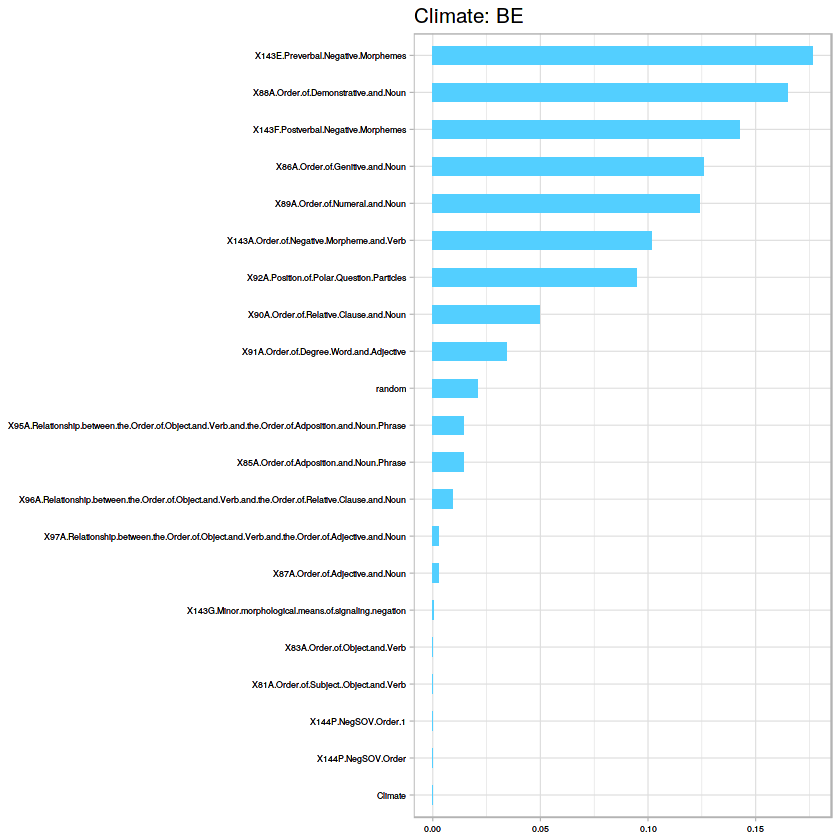

[1] "Accuracy for SVM:65.4545454545455"
   
     C  D
  C 24  8
  D  0  1
   
     C  D
  C 24  8
  D  0  1
[1] "C" "E"
[1] 0.8004444
[1] "Dummy Classifier accuracy:0.800444444444444"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

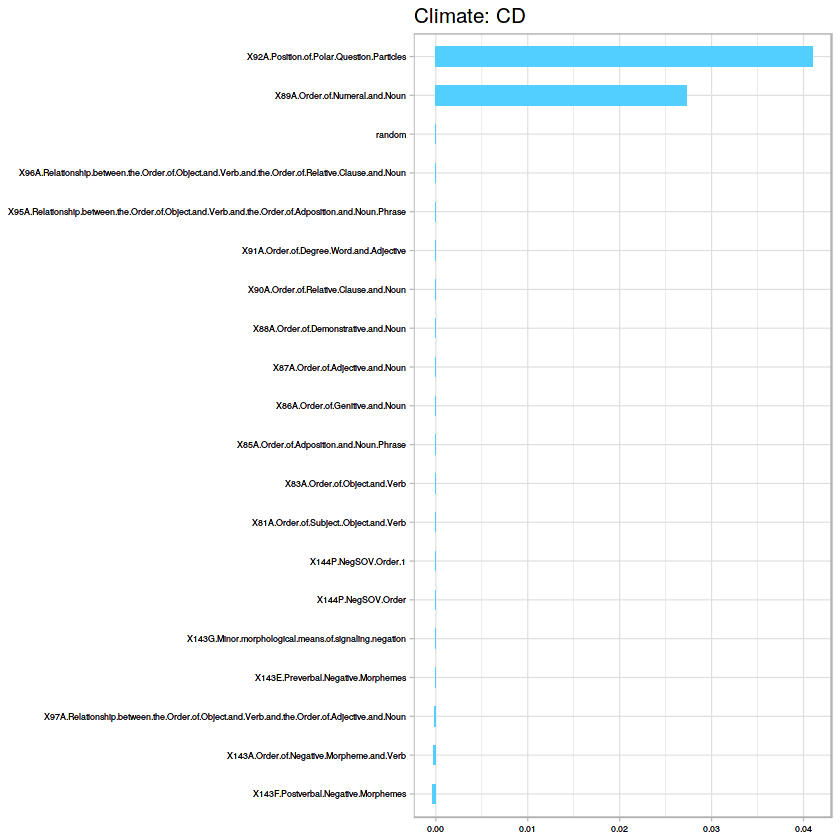

[1] C-V accuracy for Random Forest is 0.895555555555556
[1] "RF Confusion Matrix:"
   
     C  E
  C 24  3
  E  0  0


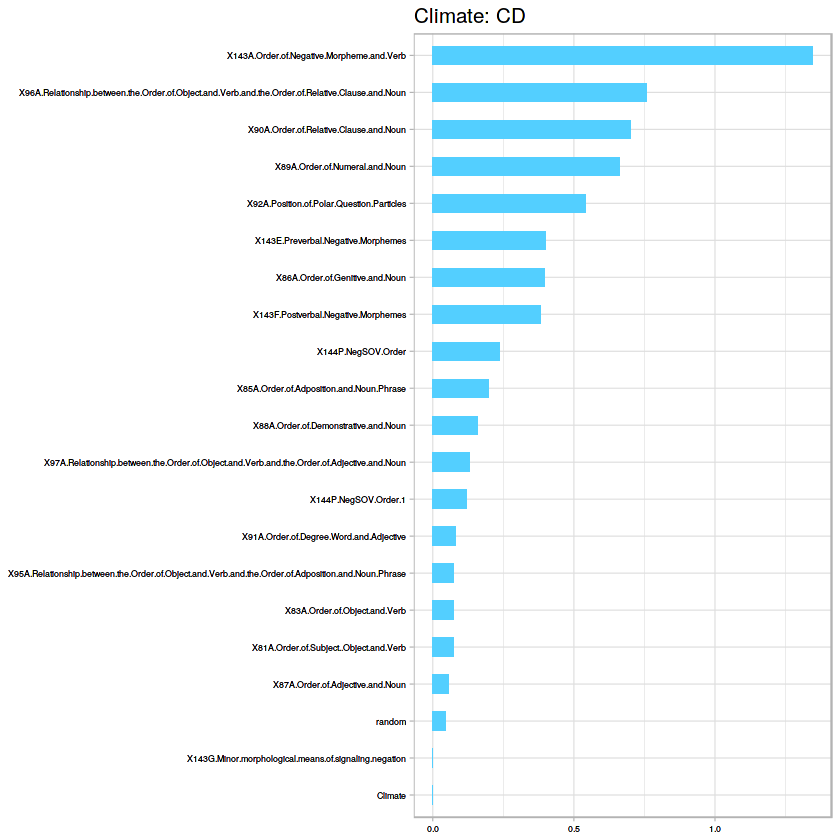

[1] "Accuracy for SVM:88.8888888888889"
   
     C  E
  C 24  3
  E  0  0
   
     C  E
  C 24  3
  E  0  0
[1] "D" "E"
[1] 0.6232917
[1] "Dummy Classifier accuracy:0.623291666666667"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

[1] C-V accuracy for Random Forest is 0.788888888888889


ERROR: Error in model@fit(data, ...): fraction of 0.000000 is too small


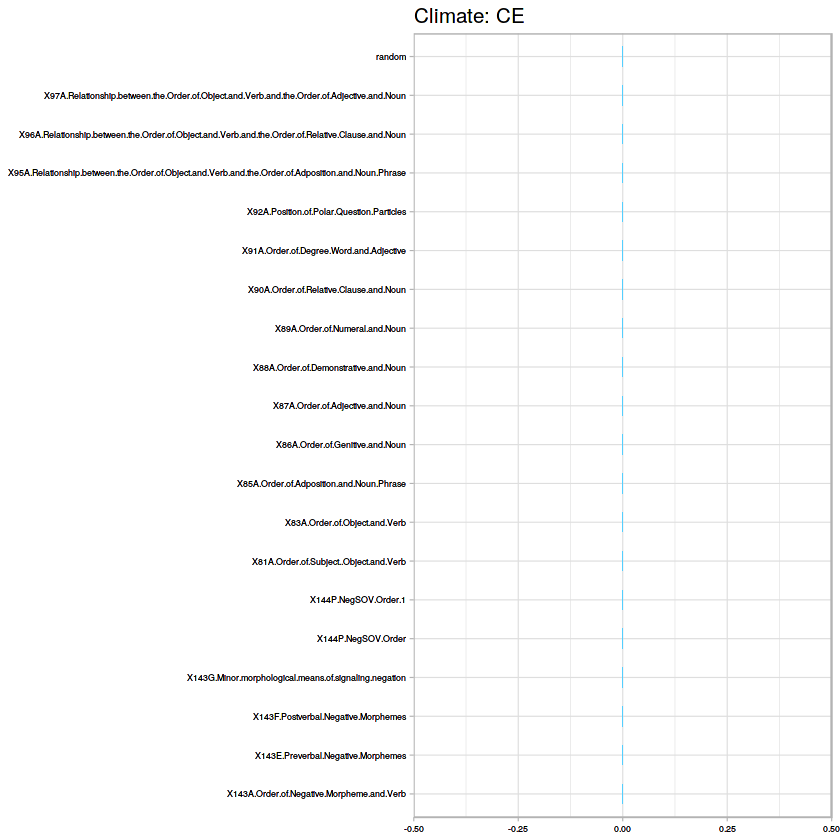

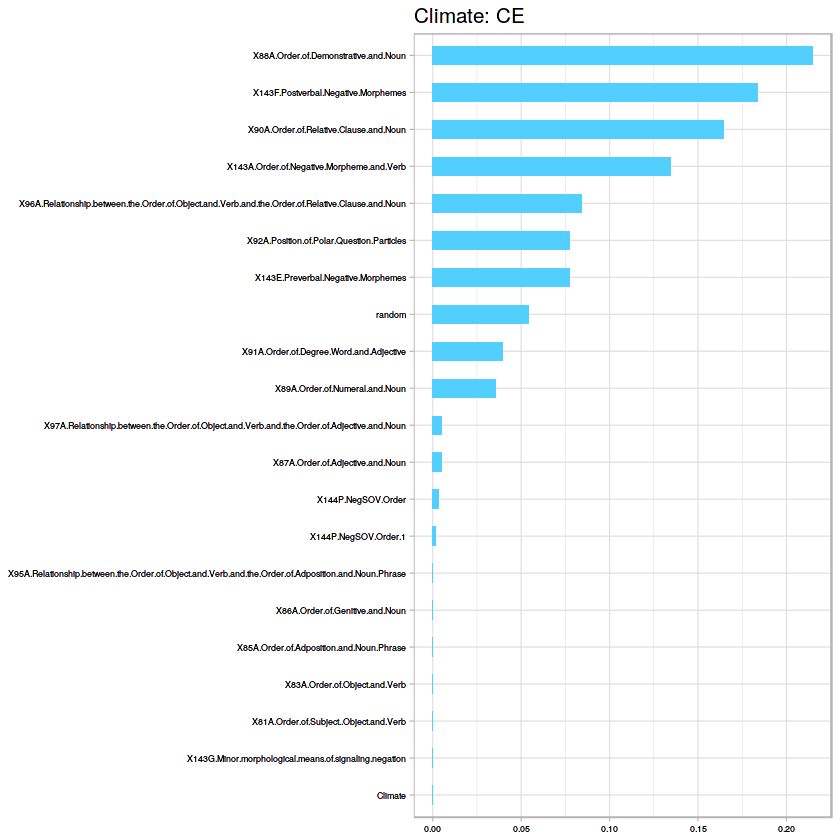

In [350]:
#One vs One
ovo(wo_df)

[1] "Climate: "
[1] "A" "B"
[1] "Dummy Classifier"
[1] 0.502981
[1] 0.502981
[1] C-V accuracy for Random Forest is 0.616339869281046
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 31 10
  Z 12 26


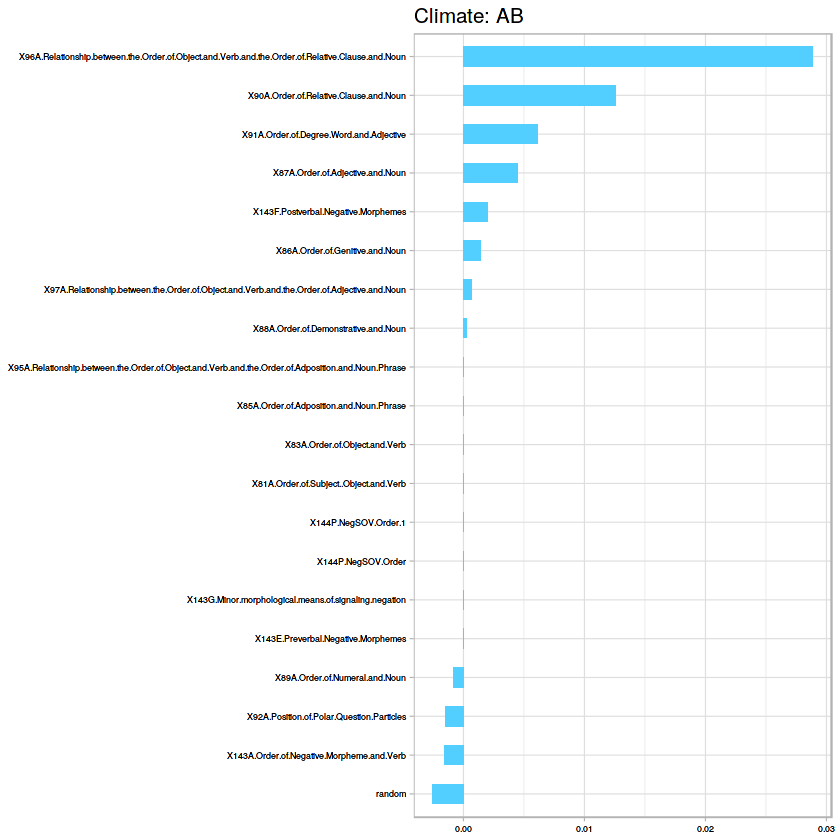

[1] "Accuracy for SVM:57.7215189873418"
   
     Y  Z
  Y 36  8
  Z  7 28
[1] "Climate: "
[1] "A" "C"
[1] "Dummy Classifier"
[1] 0.5084494
[1] 0.5084494
[1] C-V accuracy for Random Forest is 0.722222222222222
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 41  9
  Z  4 25


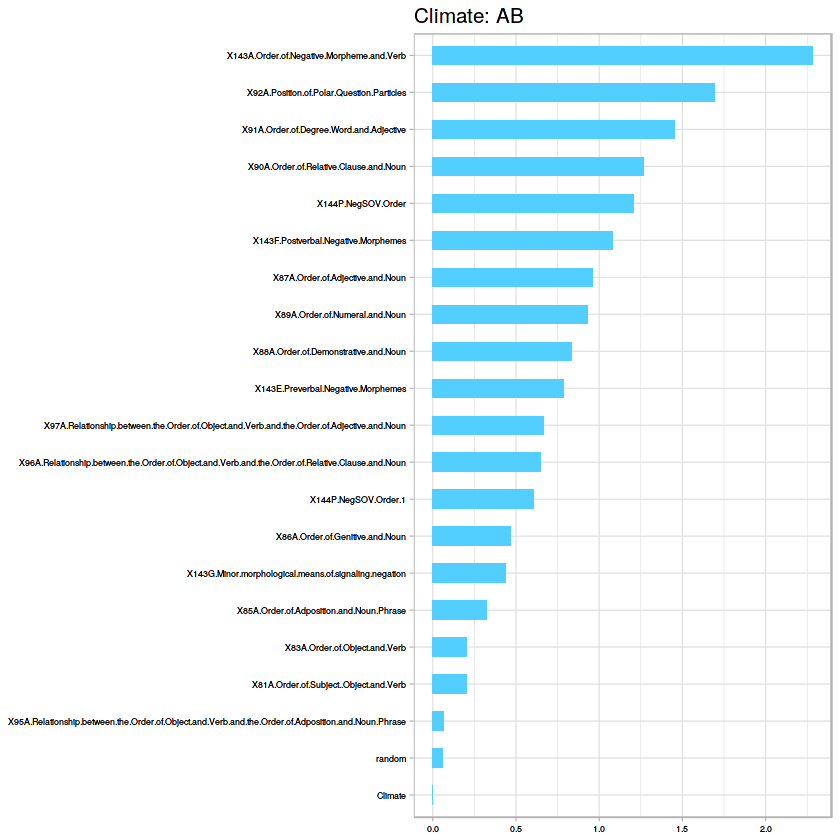

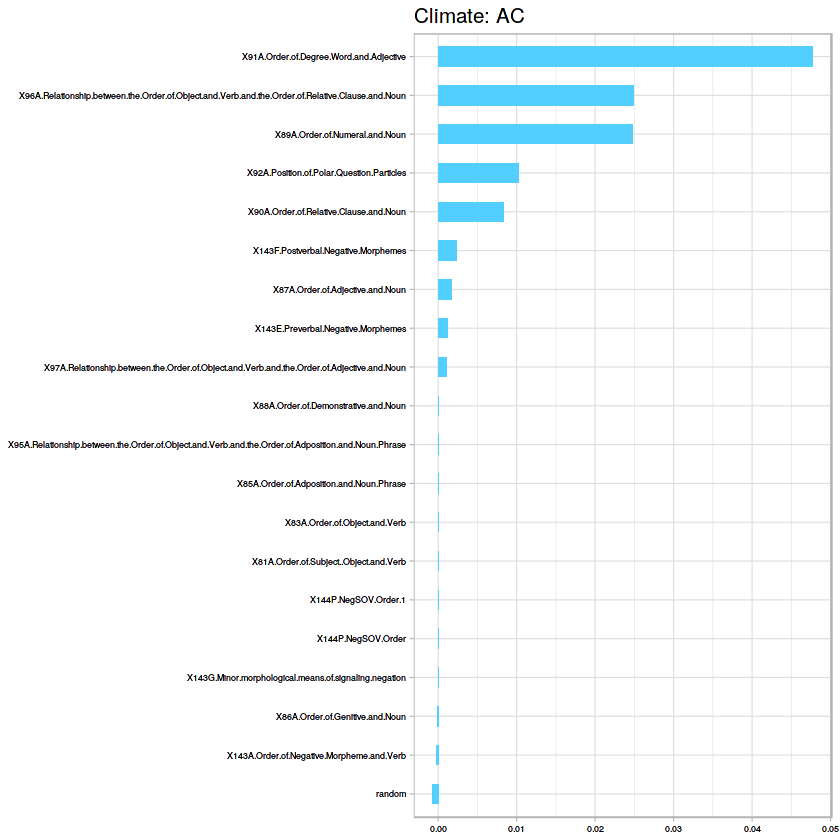

[1] "Accuracy for SVM:66.8354430379747"
   
     Y  Z
  Y 41  8
  Z  4 26
[1] "Climate: "
[1] "A" "D"
[1] "Dummy Classifier"
[1] 0.5273354
[1] 0.5273354
[1] C-V accuracy for Random Forest is 0.632777777777778
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 15  8
  Z 15 41


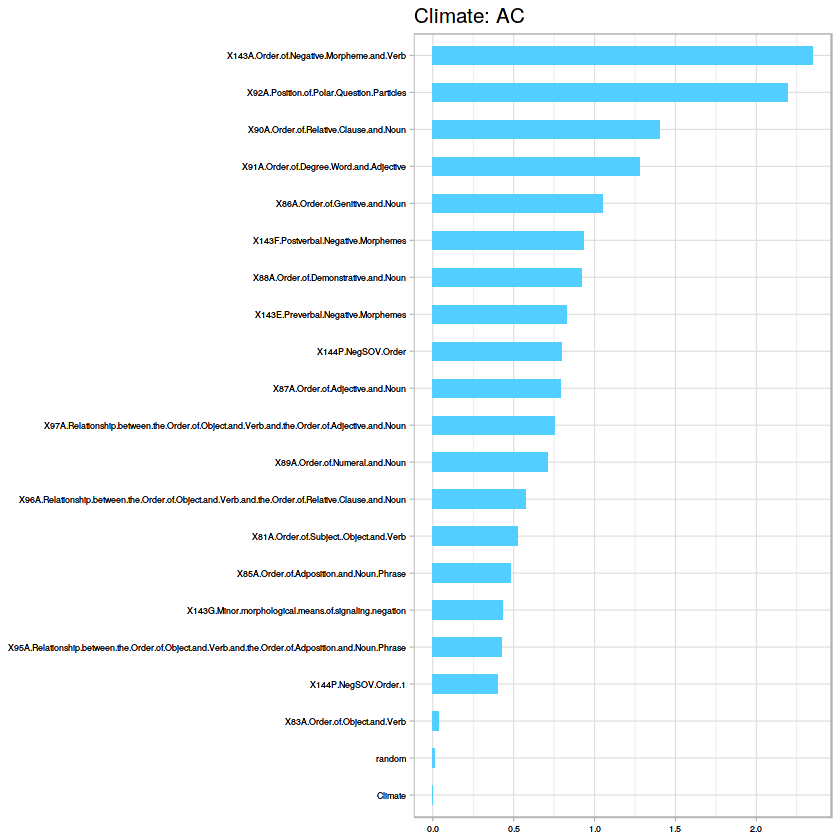

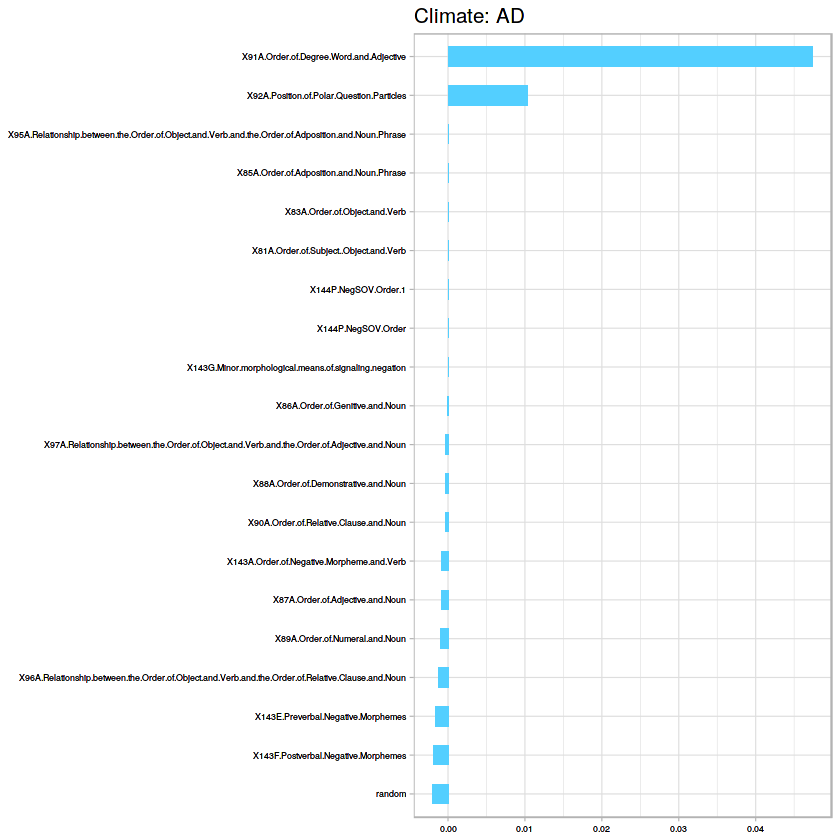

[1] "Accuracy for SVM:64.3037974683544"
   
     Y  Z
  Y 16  1
  Z 14 48
[1] "Climate: "
[1] "A" "E"
[1] "Dummy Classifier"
[1] 0.5781582
[1] 0.5781582
[1] C-V accuracy for Random Forest is 0.747222222222222
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 14  8
  Z 10 47


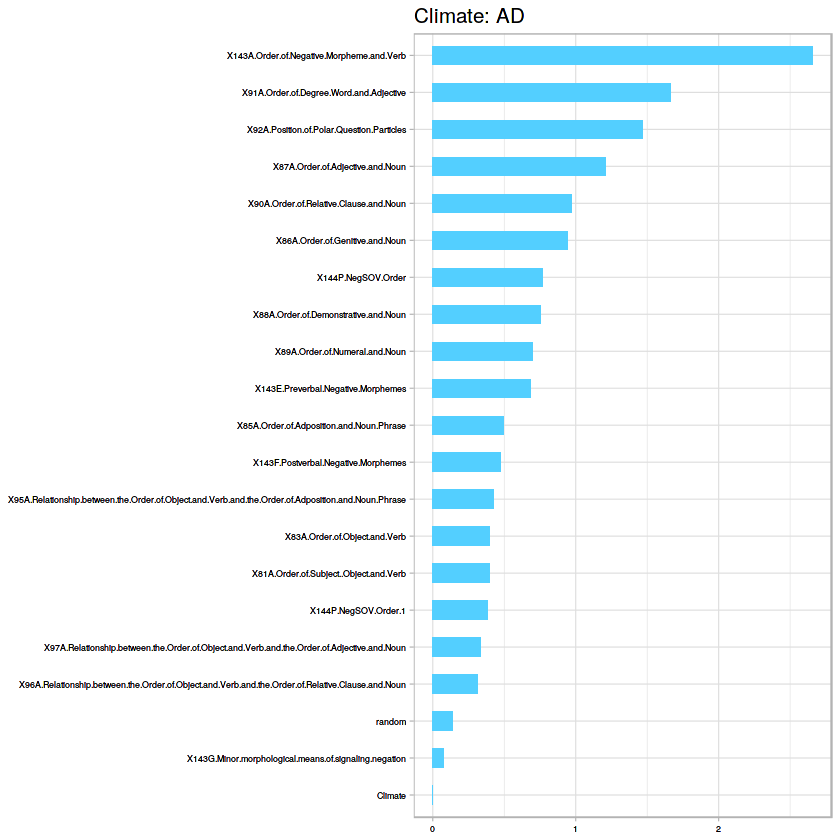

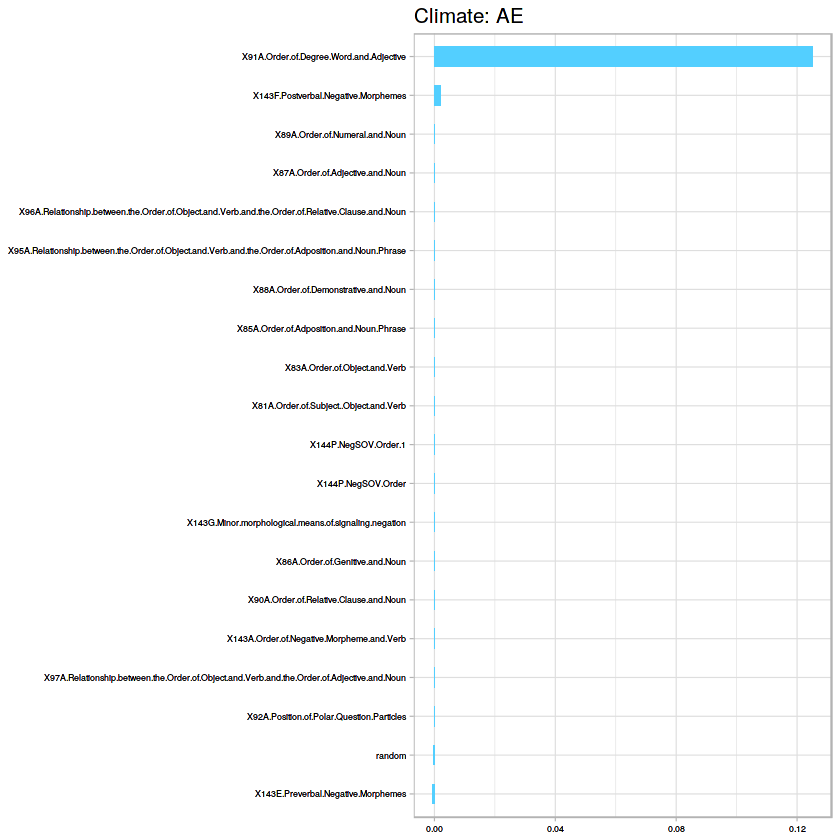

[1] "Accuracy for SVM:69.620253164557"
   
     Y  Z
  Y 10  0
  Z 14 55
[1] "Climate: "
[1] "B" "C"
[1] "Dummy Classifier"
[1] 0.5131899
[1] 0.5131899
[1] C-V accuracy for Random Forest is 0.591258169934641
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 41 18
  Z  5 15


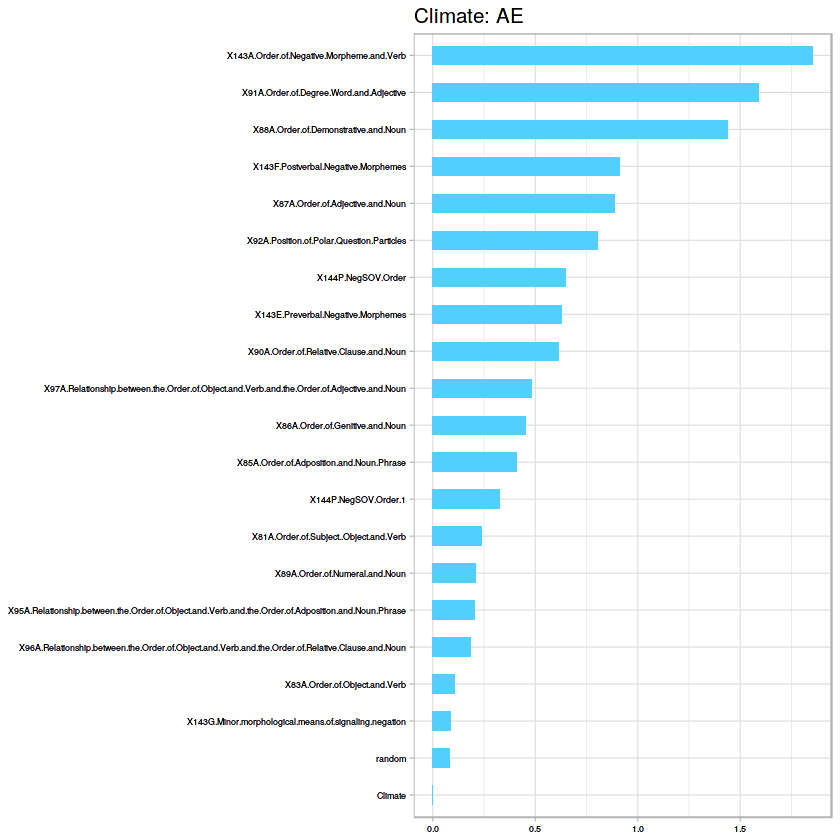

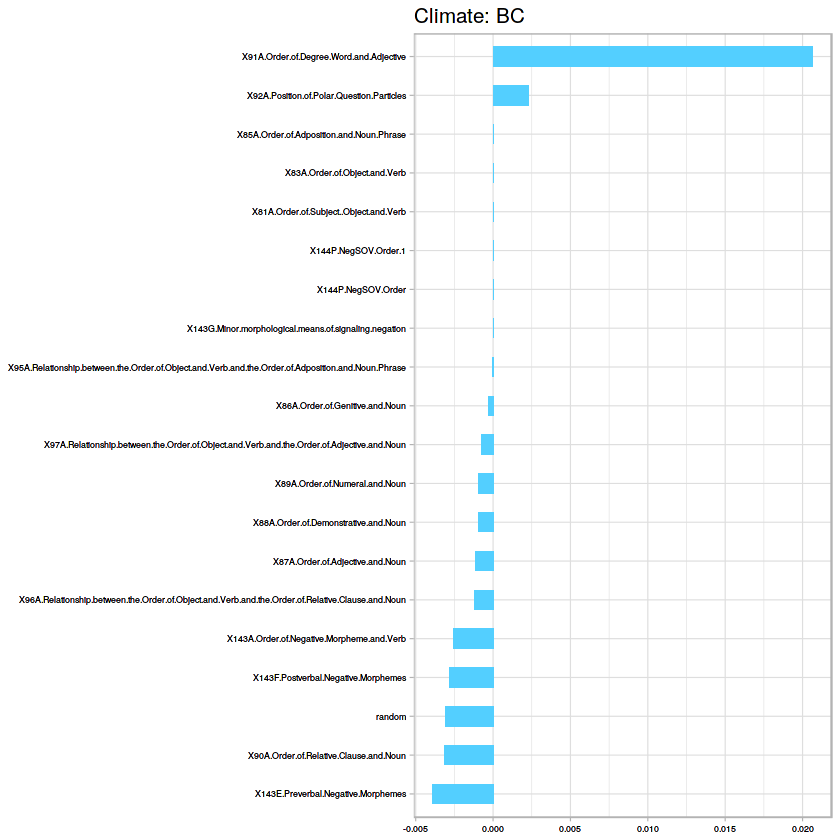

[1] "Accuracy for SVM:60"
   
     Y  Z
  Y 43 14
  Z  3 19
[1] "Climate: "
[1] "B" "D"
[1] "Dummy Classifier"
[1] 0.5200696
[1] 0.5200696
[1] C-V accuracy for Random Forest is 0.701748366013072
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 23  7
  Z  8 41


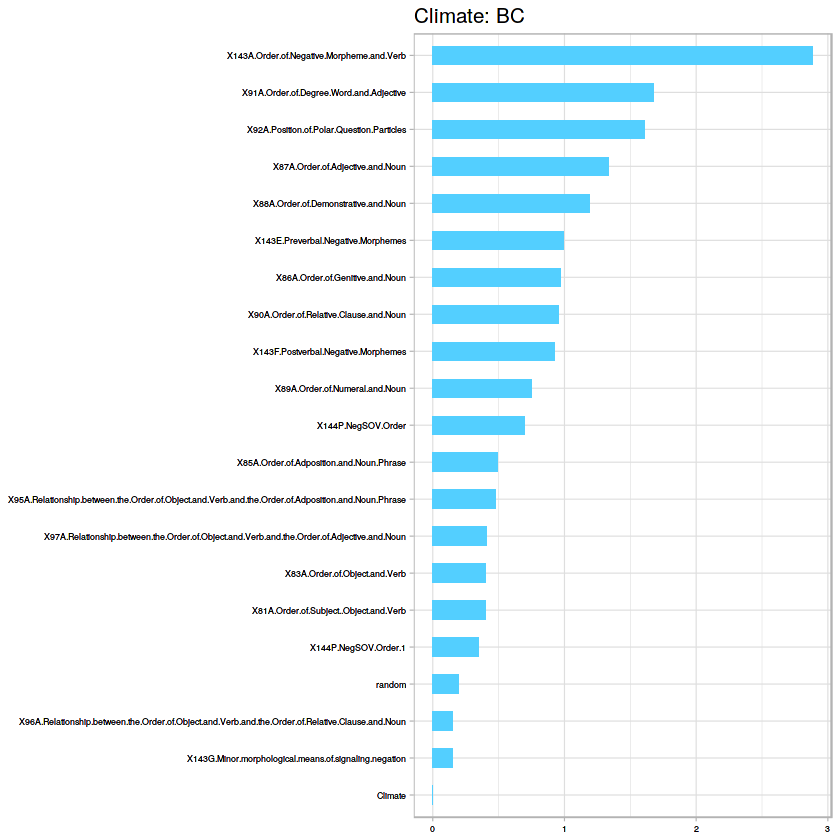

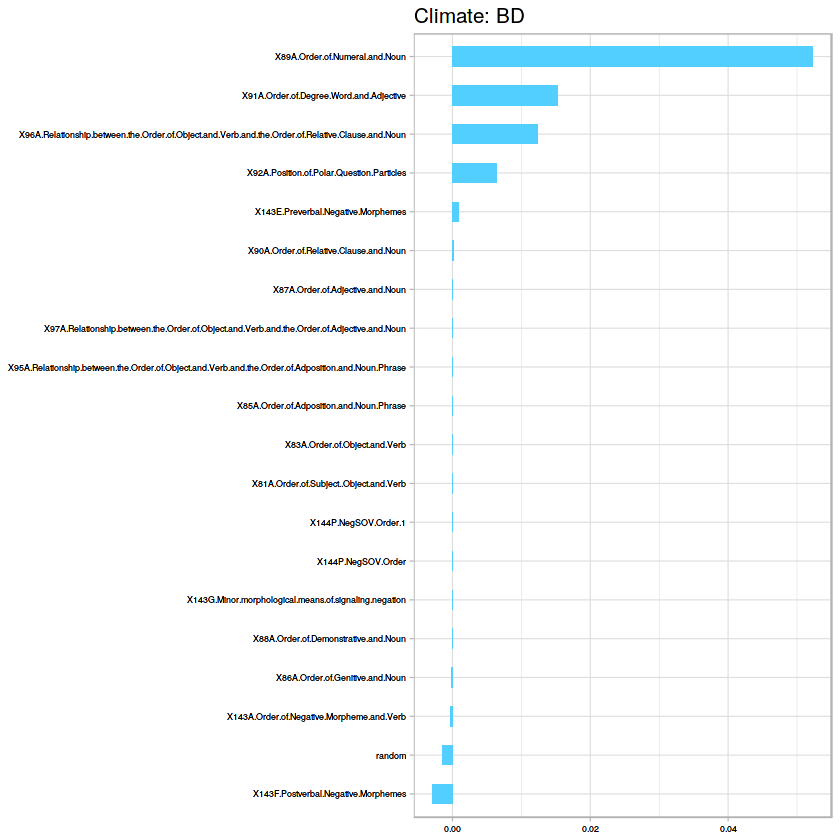

[1] "Accuracy for SVM:58.4810126582278"
   
     Y  Z
  Y 21  5
  Z 10 43
[1] "Climate: "
[1] "B" "E"
[1] "Dummy Classifier"
[1] 0.568557
[1] 0.568557
[1] C-V accuracy for Random Forest is 0.734722222222222
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 13  1
  Z 12 53


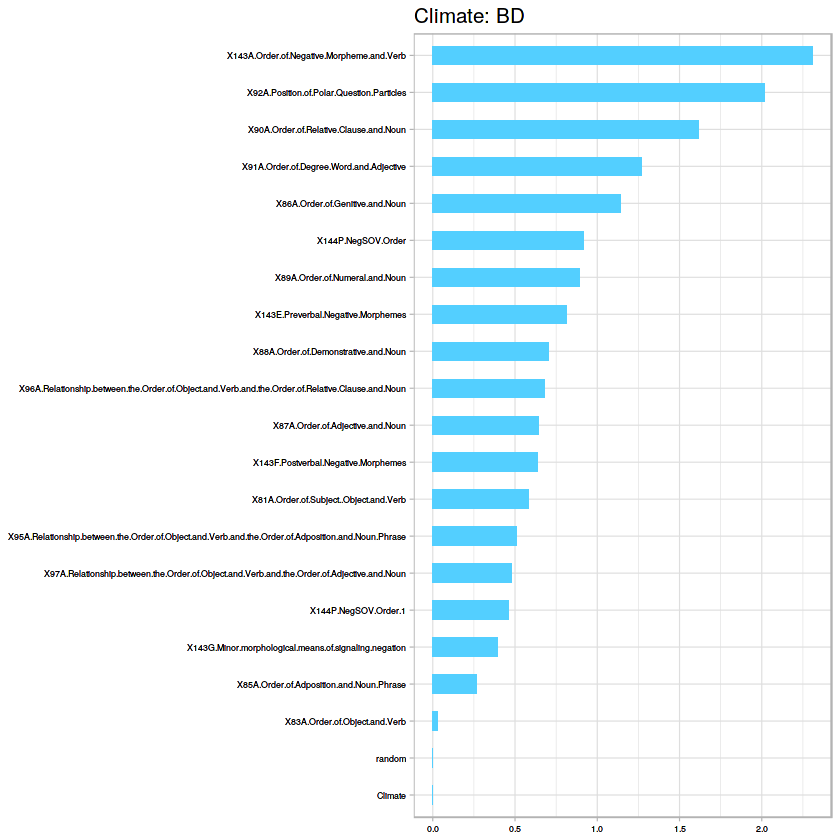

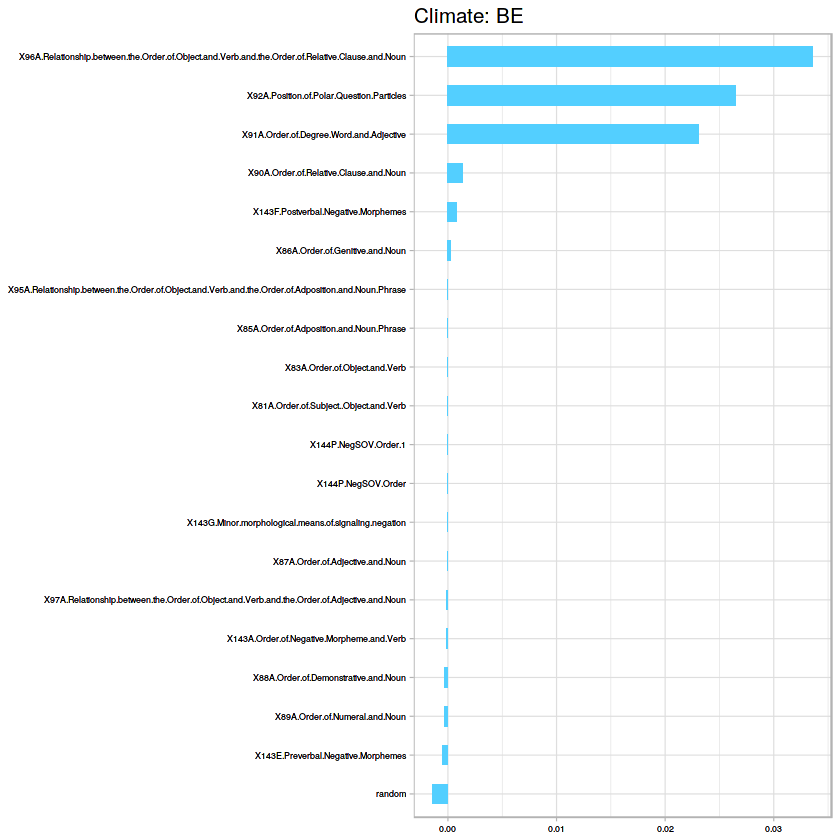

[1] "Accuracy for SVM:69.620253164557"
   
     Y  Z
  Y 13  0
  Z 12 54
[1] "Climate: "
[1] "C" "D"
[1] "Dummy Classifier"
[1] 0.5122975
[1] 0.5122975
[1] C-V accuracy for Random Forest is 0.651062091503268
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 23 10
  Z 10 36


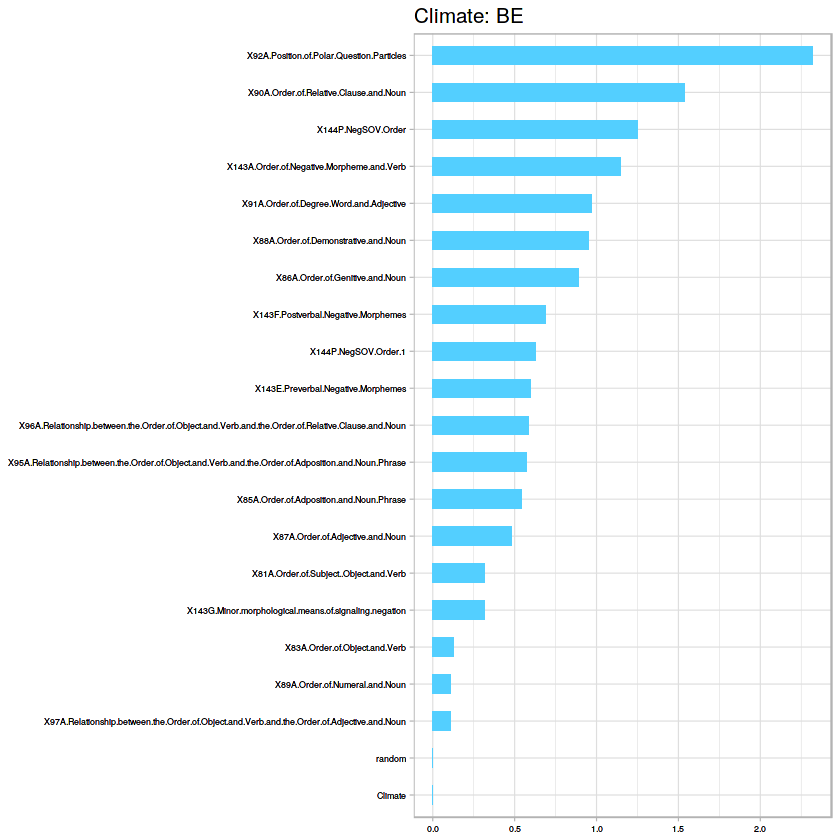

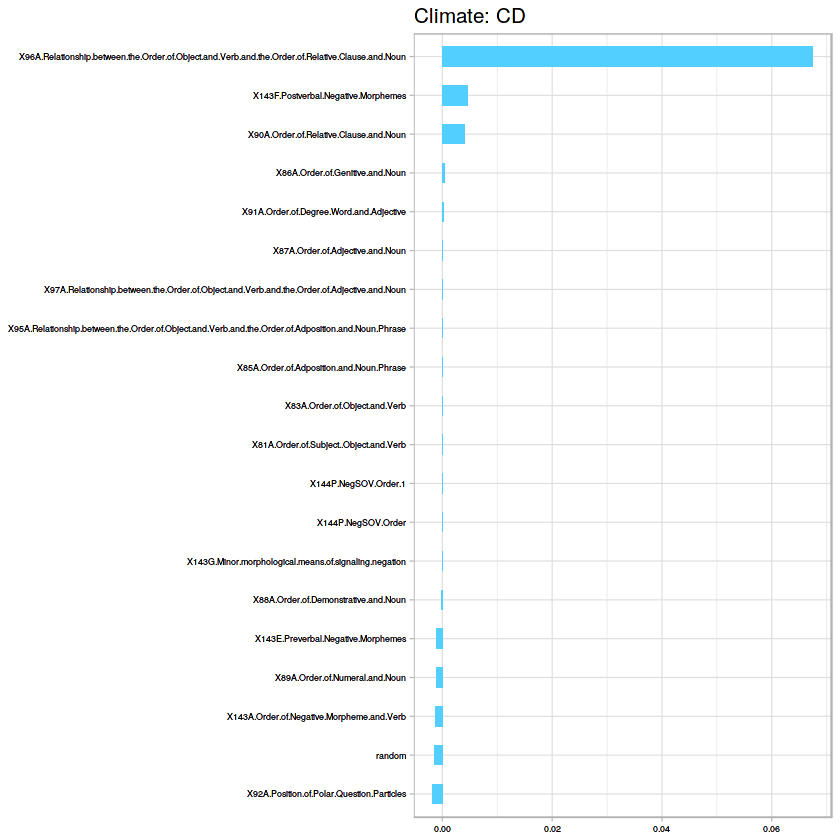

[1] "Accuracy for SVM:61.0126582278481"
   
     Y  Z
  Y 23  2
  Z 10 44
[1] "Climate: "
[1] "C" "E"
[1] "Dummy Classifier"
[1] 0.5499873
[1] 0.5499873
[1] C-V accuracy for Random Forest is 0.700915032679739
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 11  2
  Z 16 50


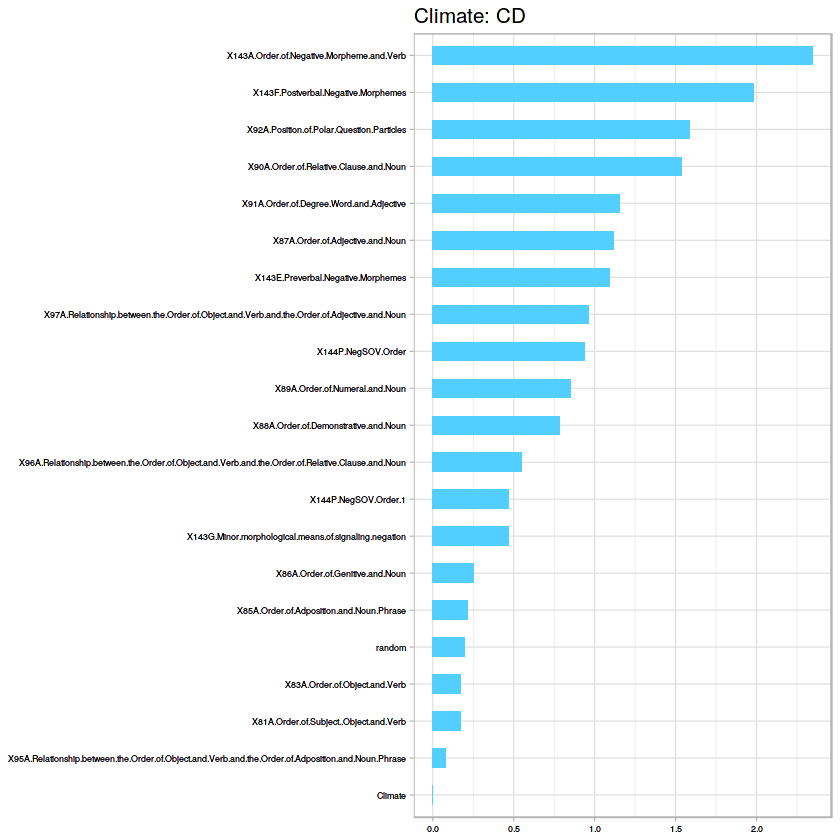

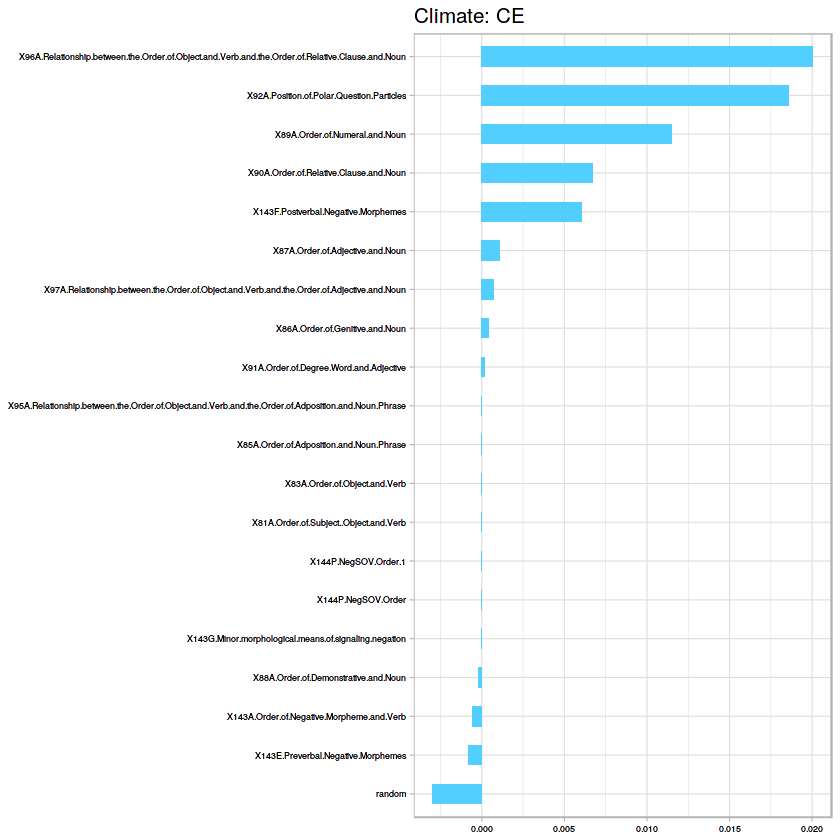

[1] "Accuracy for SVM:69.873417721519"
   
     Y  Z
  Y 13  0
  Z 14 52
[1] "Climate: "
[1] "D" "E"
[1] "Dummy Classifier"
[1] 0.740519
[1] 0.740519
[1] C-V accuracy for Random Forest is 0.848872549019608
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 12 67


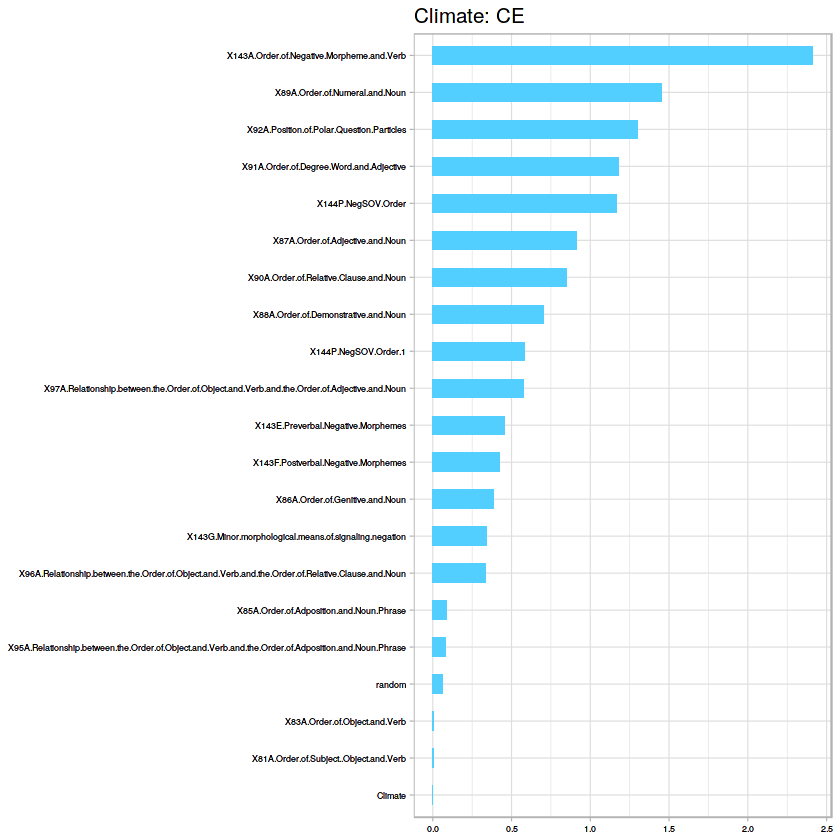

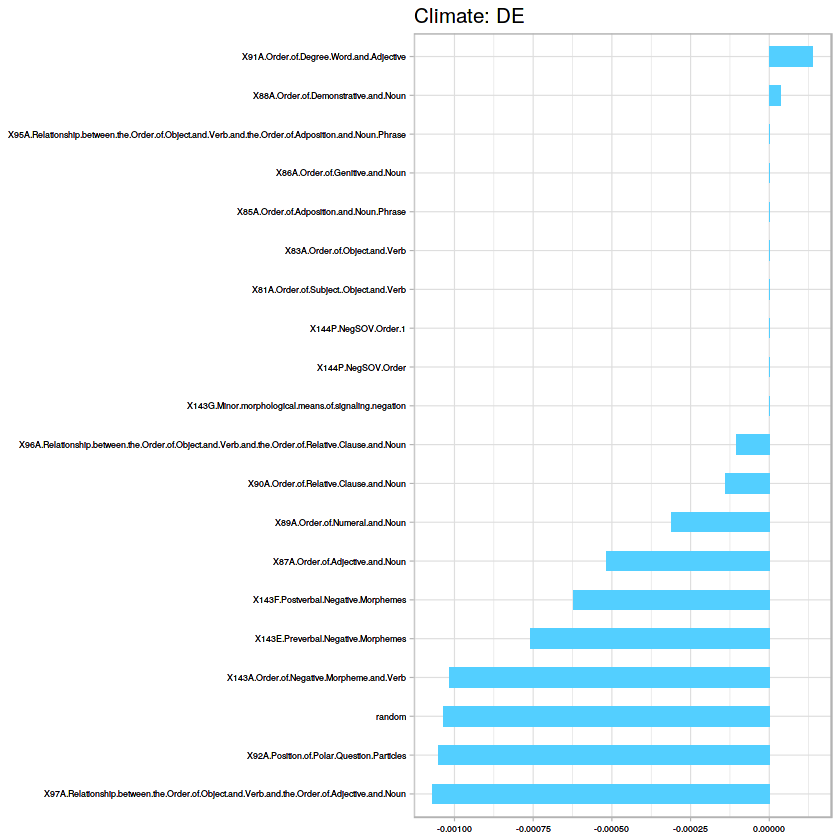

[1] "Accuracy for SVM:84.8101265822785"
   
     Y  Z
  Y  0  0
  Z 12 67


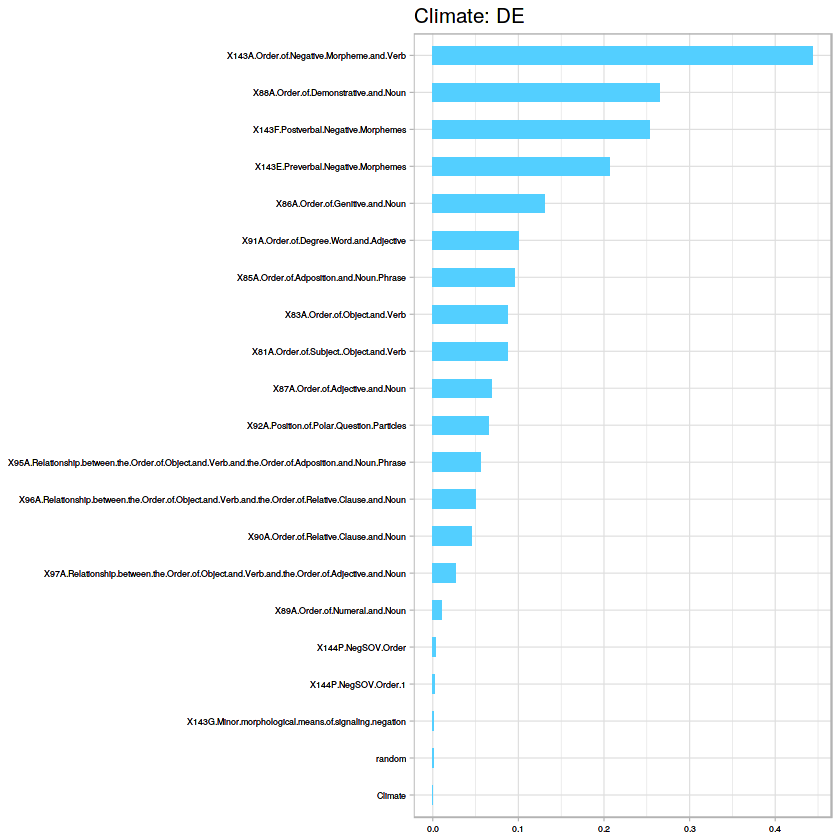

In [353]:
bin_2v3(wo_df)

In [389]:
colnames(lang_df)

[1] "Name"                                                                                                          
  [2] "genus"                                                                                                         
  [3] "family"                                                                                                        
  [4] "macroarea"                                                                                                     
  [5] "countrycodes"                                                                                                  
  [6] "X1A.Consonant.Inventories"                                                                                     
  [7] "X2A.Vowel.Quality.Inventories"                                                                                 
  [8] "X3A.Consonant.Vowel.Ratio"                                                                                     
  [9] "X4A.Voicing.in.Plosives.and.Fricatives"                                                                        
 [10] "X5A.Voicing.and.Gaps.in.Plosive.Systems"                                                                       
 [11] "X6A.Uvular.Consonants"                                                                                         
 [12] "X7A.Glottalized.Consonants"                                                                                    
 [13] "X8A.Lateral.Consonants"                                                                                        
 [14] "X9A.The.Velar.Nasal"                                                                                           
 [15] "X10A.Vowel.Nasalization"                                                                                       
 [16] "X11A.Front.Rounded.Vowels"                                                                                     
 [17] "X12A.Syllable.Structure"                                                                                       
 [18] "X13A.Tone"                                                                                                     
 [19] "X14A.Fixed.Stress.Locations"                                                                                   
 [20] "X15A.Weight.Sensitive.Stress"                                                                                  
 [21] "X16A.Weight.Factors.in.Weight.Sensitive.Stress.Systems"                                                        
 [22] "X17A.Rhythm.Types"                                                                                             
 [23] "X18A.Absence.of.Common.Consonants"                                                                             
 [24] "X19A.Presence.of.Uncommon.Consonants"                                                                          
 [25] "X20A.Fusion.of.Selected.Inflectional.Formatives"                                                               
 [26] "X21A.Exponence.of.Selected.Inflectional.Formatives"                                                            
 [27] "X22A.Inflectional.Synthesis.of.the.Verb"                                                                       
 [28] "X23A.Locus.of.Marking.in.the.Clause"                                                                           
 [29] "X24A.Locus.of.Marking.in.Possessive.Noun.Phrases"                                                              
 [30] "X25A.Locus.of.Marking..Whole.language.Typology"                                                                
 [31] "X26A.Prefixing.vs..Suffixing.in.Inflectional.Morphology"                                                       
 [32] "X27A.Reduplication"                                                                                            
 [33] "X28A.Case.Syncretism"                                                                                          
 [34] "X29A.Syncretism.in.Verbal.Person.Number.Marking"                    

In [530]:
#Select features for both data sets
#Mixed DS1 - 
#1,26,21,50,91,51,37,33,92,96,143A,14,4,6(+5) - remove 21 for later
#Mixed DS2 - Features : 1,3,6,9,15,26,33,51,53,54,81,83,87,88,89,90,96,97
#
fts1<-c(6,31,55,56,42,38,97,101,161,19,9,11,96,14)
fts2<-c(6,8,11,14,20,31,38,56,86,88,92:95,101,102)
na.omit(lang_df[,fts2])
nrow(na.omit(lang_df[,fts2]))



,X1A.Consonant.Inventories,X3A.Consonant.Vowel.Ratio,X6A.Uvular.Consonants,X9A.The.Velar.Nasal,X15A.Weight.Sensitive.Stress,X26A.Prefixing.vs..Suffixing.in.Inflectional.Morphology,X33A.Coding.of.Nominal.Plurality,X51A.Position.of.Case.Affixes,X81A.Order.of.Subject..Object.and.Verb,X83A.Order.of.Object.and.Verb,X87A.Order.of.Adjective.and.Noun,X88A.Order.of.Demonstrative.and.Noun,X89A.Order.of.Numeral.and.Noun,X90A.Order.of.Relative.Clause.and.Noun,X96A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Relative.Clause.and.Noun,X97A.Relationship.between.the.Order.of.Object.and.Verb.and.the.Order.of.Adjective.and.Noun
9,5 Large,5 High,2 Uvular stops only,3 No velar nasal,7 Not predictable,4 Equal prefixing and suffixing,2 Plural suffix,9 No case affixes or adpositional clitics,1 SOV,1 OV,2 Noun-Adjective,1 Demonstrative-Noun,3 No dominant order,2 Relative clause-Noun,1 OV and RelN,2 OV and NAdj
35,4 Moderately large,4 Moderately high,4 Uvular stops and continuants,3 No velar nasal,4 Right-oriented: One of the last three,3 Weakly suffixing,6 Mixed morphological plural,9 No case affixes or adpositional clitics,2 SVO,2 VO,2 Noun-Adjective,2 Noun-Demonstrative,3 No dominant order,1 Noun-Relative clause,4 VO and NRel,4 VO and NAdj
71,2 Moderately small,2 Moderately low,1 None,3 No velar nasal,6 Combined: Right-edge and unbounded,2 Strongly suffixing,8 Plural clitic,6 Postpositional clitics,1 SOV,1 OV,1 Adjective-Noun,1 Demonstrative-Noun,1 Numeral-Noun,2 Relative clause-Noun,1 OV and RelN,1 OV and AdjN
90,2 Moderately small,3 Average,1 None,3 No velar nasal,5 Unbounded: Stress can be anywhere,2 Strongly suffixing,6 Mixed morphological plural,9 No case affixes or adpositional clitics,1 SOV,1 OV,2 Noun-Adjective,2 Noun-Demonstrative,2 Noun-Numeral,1 Noun-Relative clause,2 OV and NRel,2 OV and NAdj
129,1 Small,3 Average,1 None,3 No velar nasal,3 Right-edge: Ultimate or penultimate,4 Equal prefixing and suffixing,2 Plural suffix,6 Postpositional clitics,2 SVO,3 No dominant order,2 Noun-Adjective,1 Demonstrative-Noun,1 Numeral-Noun,1 Noun-Relative clause,5 Other,5 Other
141,4 Moderately large,4 Moderately high,3 Uvular continuants only,3 No velar nasal,5 Unbounded: Stress can be anywhere,2 Strongly suffixing,2 Plural suffix,1 Case suffixes,7 No dominant order,3 No dominant order,1 Adjective-Noun,1 Demonstrative-Noun,1 Numeral-Noun,7 Mixed,5 Other,5 Other
154,1 Small,1 Low,1 None,3 No velar nasal,8 Fixed stress (no weight-sensitivity),2 Strongly suffixing,2 Plural suffix,9 No case affixes or adpositional clitics,1 SOV,1 OV,2 Noun-Adjective,1 Demonstrative-Noun,2 Noun-Numeral,2 Relative clause-Noun,1 OV and RelN,2 OV and NAdj
202,4 Moderately large,3 Average,1 None,1 Initial velar nasal,8 Fixed stress (no weight-sensitivity),3 Weakly suffixing,8 Plural clitic,9 No case affixes or adpositional clitics,2 SVO,2 VO,2 Noun-Adjective,2 Noun-Demonstrative,2 Noun-Numeral,1 Noun-Relative clause,4 VO and NRel,4 VO and NAdj
216,3 Average,4 Moderately high,1 None,1 Initial velar nasal,8 Fixed stress (no weight-sensitivity),1 Little affixation,7 Plural word,9 No case affixes or adpositional clitics,1 SOV,1 OV,2 Noun-Adjective,2 Noun-Demonstrative,2 Noun-Numeral,7 Mixed,5 Other,2 OV and NAdj
282,2 Moderately small,2 Moderately low,1 None,1 Initial velar nasal,3 Right-edge: Ultimate or penultimate,2 Strongly suffixing,5 Plural complete reduplication,9 No case affixes or adpositional clitics,7 No dominant order,2 VO,2 Noun-Adjective,2 Noun-Demonstrative,1 Numeral-Noun,1 Noun-Relative clause,4 VO and NRel,4 VO and NAdj


[1] 83

[1] Abkhaz               Arabic (Egyptian)    Alamblak            
 [4] Amele                Armenian (Eastern)   Asmat               
 [7] Bawm                 Batak (Karo)         Burushaski          
[10] Chuvash              Chinantec (Lealao)   Comanche            
[13] Coos (Hanis)         Drehu                English             
[16] Evenki               Finnish              French              
[19] German               Greek (Modern)       Greenlandic (West)  
[22] Hixkaryana           Iaai                 Indonesian          
[25] Jakaltek             Khalkha              Khmer               
[28] Kunama               Kobon                Krongo              
[31] Kutenai              Latvian              Lezgian             
[34] Lithuanian           Maori                Maybrat             
[37] Mundari              Ndyuka               Nahuatl (Tetelcingo)
[40] Oneida               Polish               Persian             
[43] Pashto               Romanian             Russian             
[46] Spanish              Taba                 Turkish             
[49] Wari'                Yaqui               
2677 Levels: !X?_?? !Xun (Ekoka) 'Are'are //Ani /Xam =|Hoan ??m??rillon ... rGyalrong (Caodeng)

[1] Northwest Caucasian Afro-Asiatic        Sepik              
 [4] Trans-New Guinea    Indo-European       Trans-New Guinea   
 [7] Sino-Tibetan        Austronesian        Burushaski         
[10] Altaic              Oto-Manguean        Uto-Aztecan        
[13] Oregon Coast        Austronesian        Indo-European      
[16] Altaic              Uralic              Indo-European      
[19] Indo-European       Indo-European       Eskimo-Aleut       
[22] Cariban             Austronesian        Austronesian       
[25] Mayan               Altaic              Austro-Asiatic     
[28] Kunama              Trans-New Guinea    Kadu               
[31] Kutenai             Indo-European       Nakh-Daghestanian  
[34] Indo-European       Austronesian        West Papuan        
[37] Austro-Asiatic      other               Uto-Aztecan        
[40] Iroquoian           Indo-European       Indo-European      
[43] Indo-European       Indo-European       Indo-European      
[46] Indo-European       Austronesian        Altaic             
[49] Chapacura-Wanham    Uto-Aztecan        
25 Levels: Afro-Asiatic Altaic Austro-Asiatic Austronesian ... other


       Afro-Asiatic              Altaic      Austro-Asiatic        Austronesian 
                  1                   4                   2                   6 
         Burushaski             Cariban    Chapacura-Wanham        Eskimo-Aleut 
                  1                   1                   1                   1 
      Indo-European           Iroquoian                Kadu              Kunama 
                 13                   1                   1                   1 
            Kutenai               Mayan   Nakh-Daghestanian Northwest Caucasian 
                  1                   1                   1                   1 
       Oregon Coast        Oto-Manguean               Sepik        Sino-Tibetan 
                  1                   1                   1                   1 
   Trans-New Guinea              Uralic         Uto-Aztecan         West Papuan 
                  3                   1                   3                   1 
              other 
      

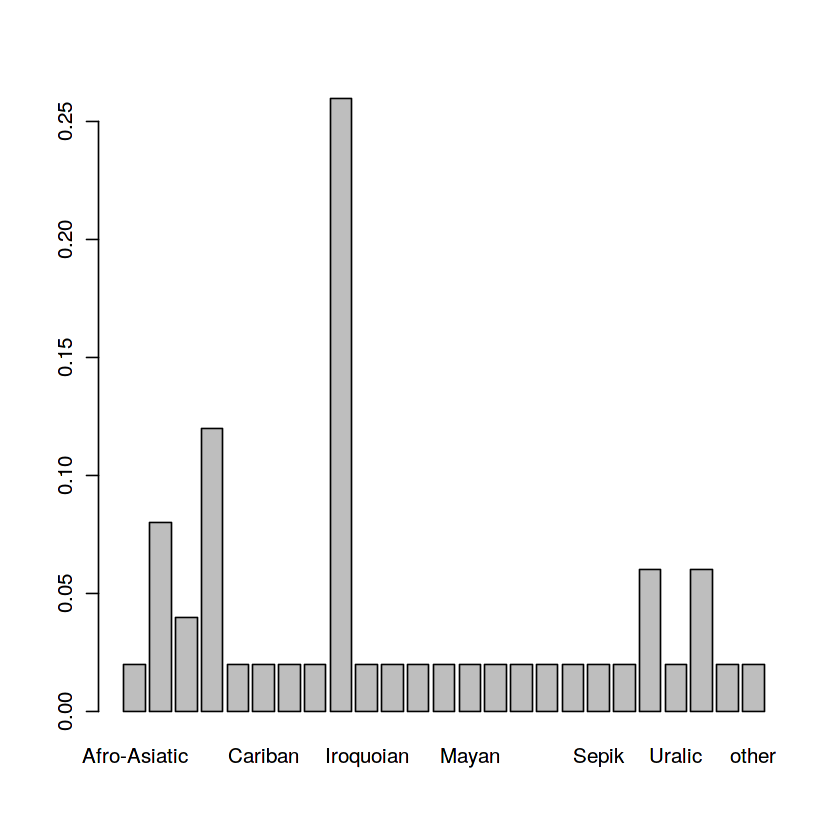

In [490]:
#Mixed Dataset 1:  top 20 features from complete dataset importance
#languages - 1,6,9,21,
s<-c(1,3,fts1,176,177)
mds1<-na.omit(lang_df[,s])

mds1[,2]<-as.factor(as.character(mds1[,2]))

mds1[,1]
mds1[,2]
table(mds1[,2])
barplot(prop.table(table(mds1[,2])))
mds1<-mds1[,-c(1,2)]
ord<-c(1)
mds1[sapply(mds1, is.character)] <- lapply(mds1[sapply(mds1, is.character)], as.factor)

mds1[ord] <- lapply(mds1[ord], ordered)

[1] 0.25299
[1] C-V accuracy for Random Forest is 0.5603367003367
[1] "RF Confusion Matrix:"
   
     A  B  C  D  E
  A 15  2  4  0  0
  B  0  0  0  0  0
  C  0  0  0  0  0
  D  1  7  6 14  1
  E  0  0  0  0  0


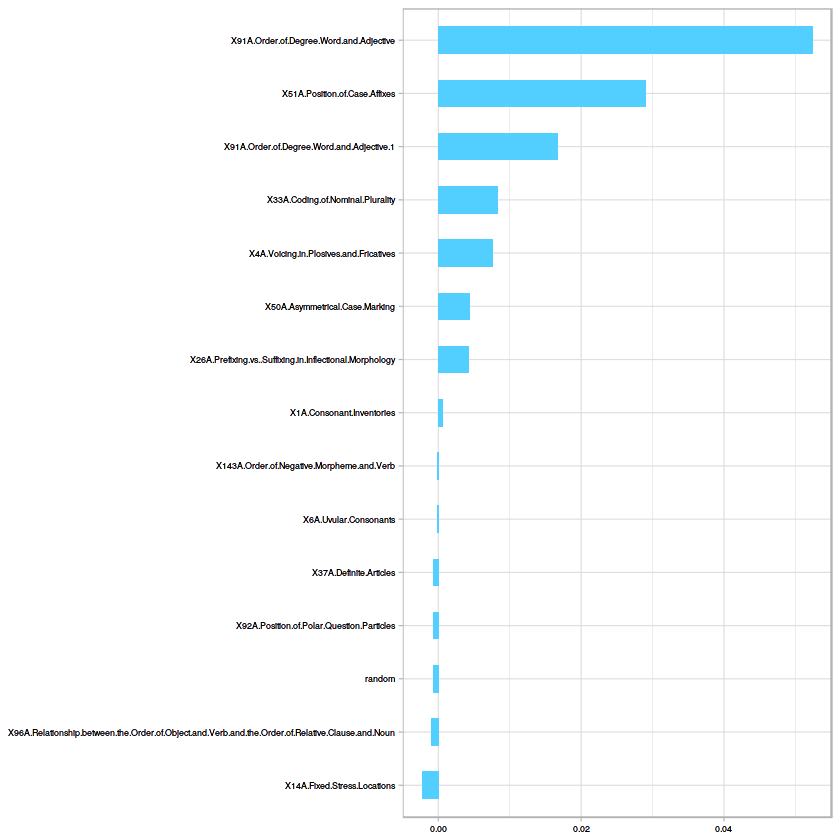

[1] "Accuracy for SVM:45.2"
   
     A  B  C  D  E
  A 16  0  1  0  0
  B  0  6  0  0  1
  C  0  1  9  0  0
  D  0  2  0 14  0
  E  0  0  0  0  0


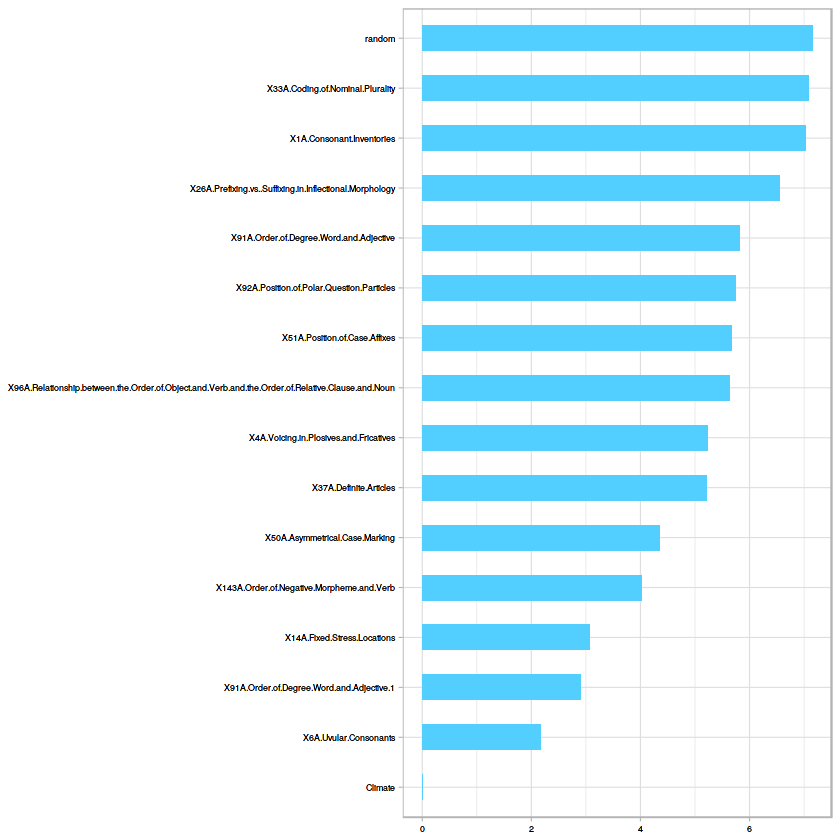

In [491]:
#Multiclass
p<-dist(mds1)
dummy_clas(class,mds1$Climate,p)
cvrf(mds1)
svmc(mds1)

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5384453
[1] C-V accuracy for Random Forest is 0.843101343101343
[1] "RF Confusion Matrix:"
   
     A  X
  A 17  4
  X  6 37


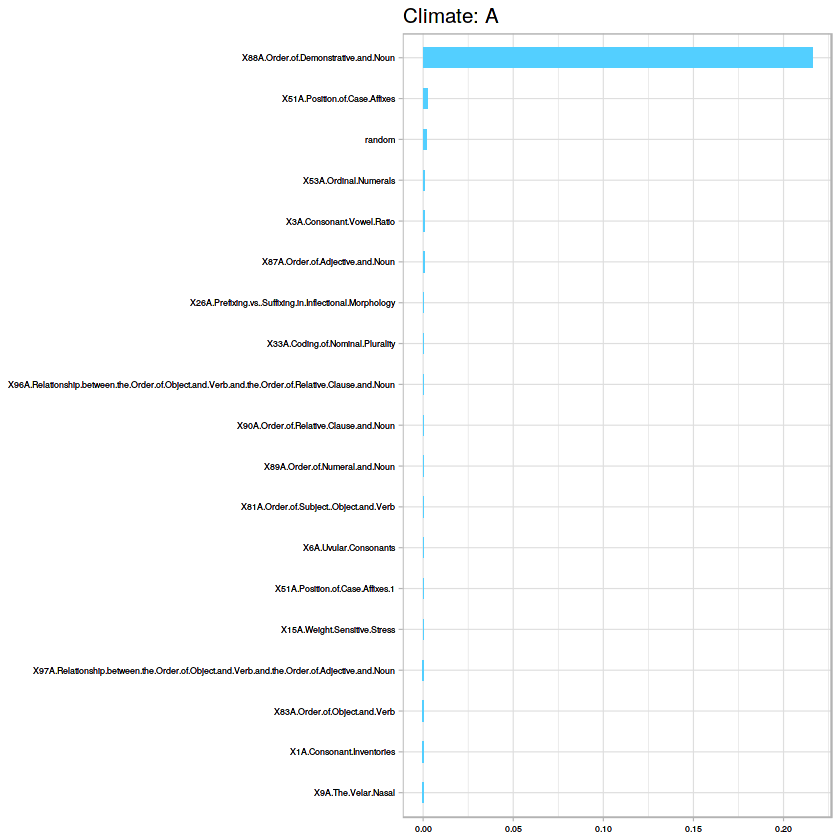

[1] "Accuracy for SVM:83.125"
   
     A  X
  A 23  0
  X  0 41
   
     A  X
  A 23  0
  X  0 41
[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7568594
[1] C-V accuracy for Random Forest is 0.86025641025641
[1] "RF Confusion Matrix:"
   
     B  X
  B  0  0
  X  9 55


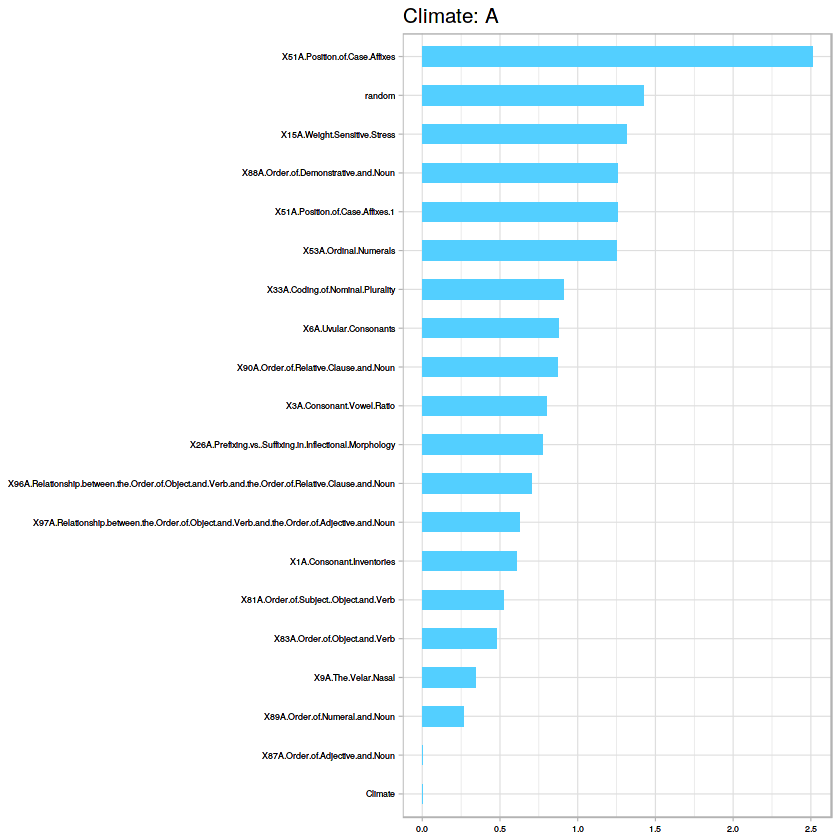

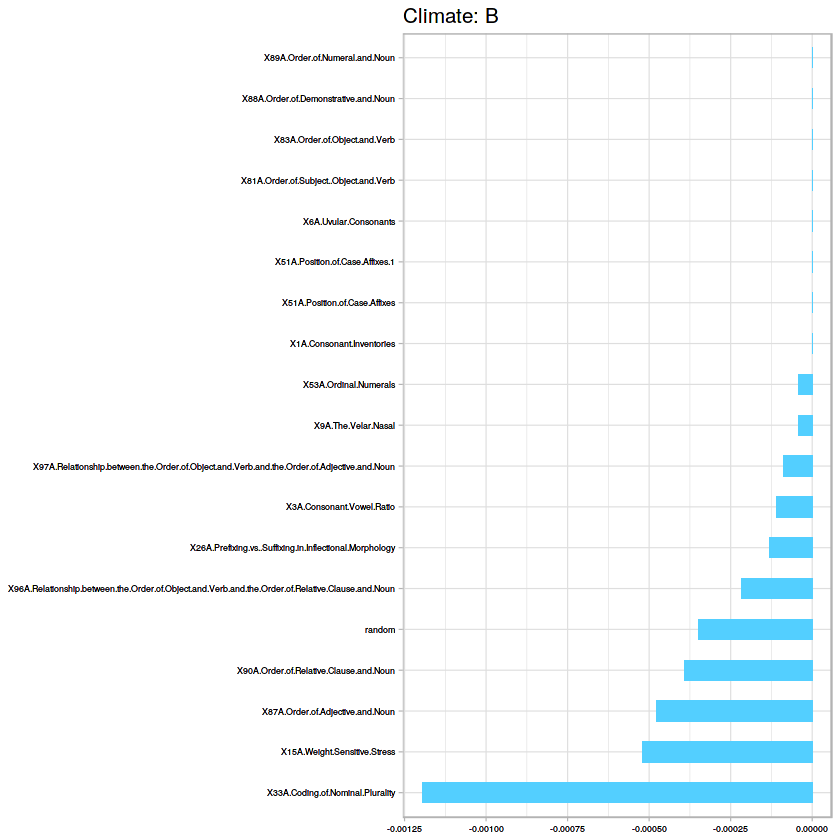

[1] "Accuracy for SVM:85.9375"
   
     B  X
  B  1  0
  X  8 55
   
     B  X
  B  1  0
  X  8 55
[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.6097813
[1] C-V accuracy for Random Forest is 0.734981684981685
[1] "RF Confusion Matrix:"
   
     C  X
  C  0  0
  X 17 47


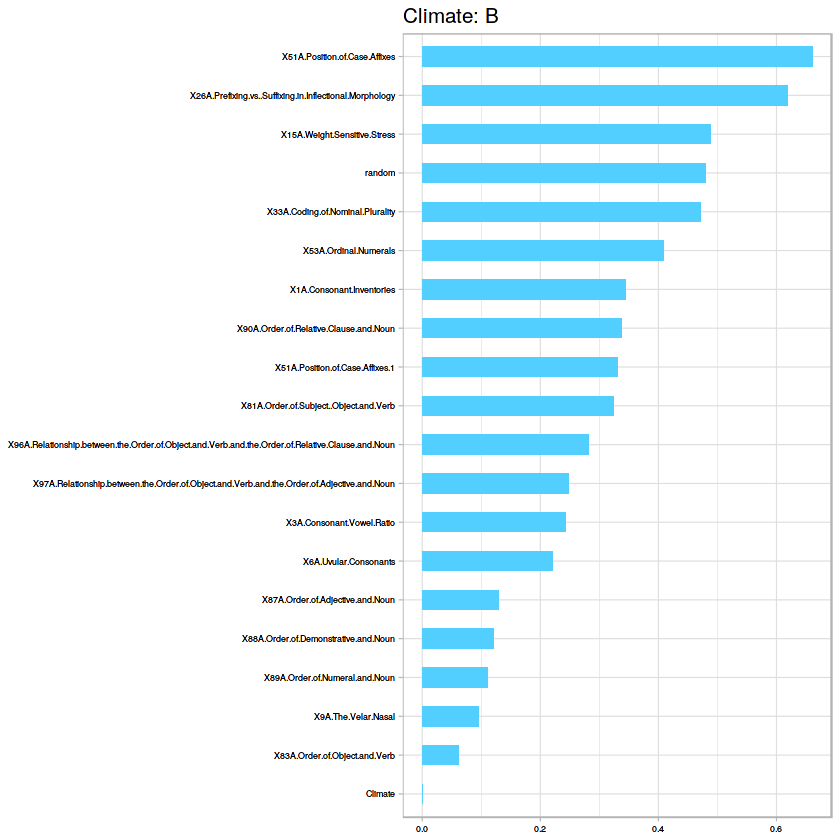

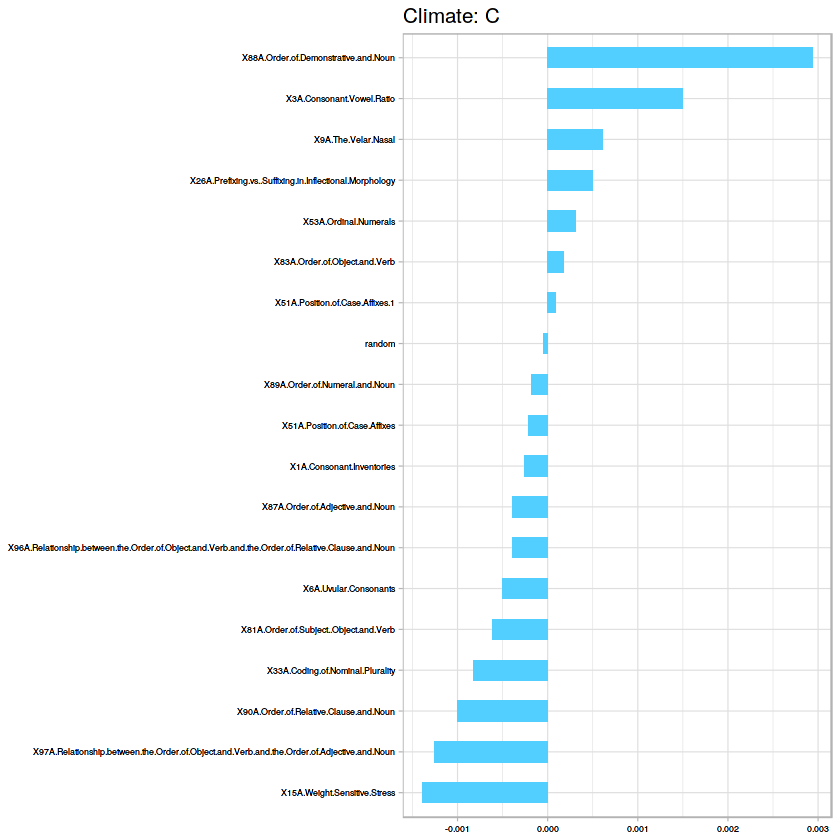

[1] "Accuracy for SVM:65"
   
     C  X
  C  9  0
  X  8 47
   
     C  X
  C  9  0
  X  8 47
[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.6769453
[1] C-V accuracy for Random Forest is 0.797924297924298
[1] "RF Confusion Matrix:"
   
     D  X
  D  0  0
  X 13 51


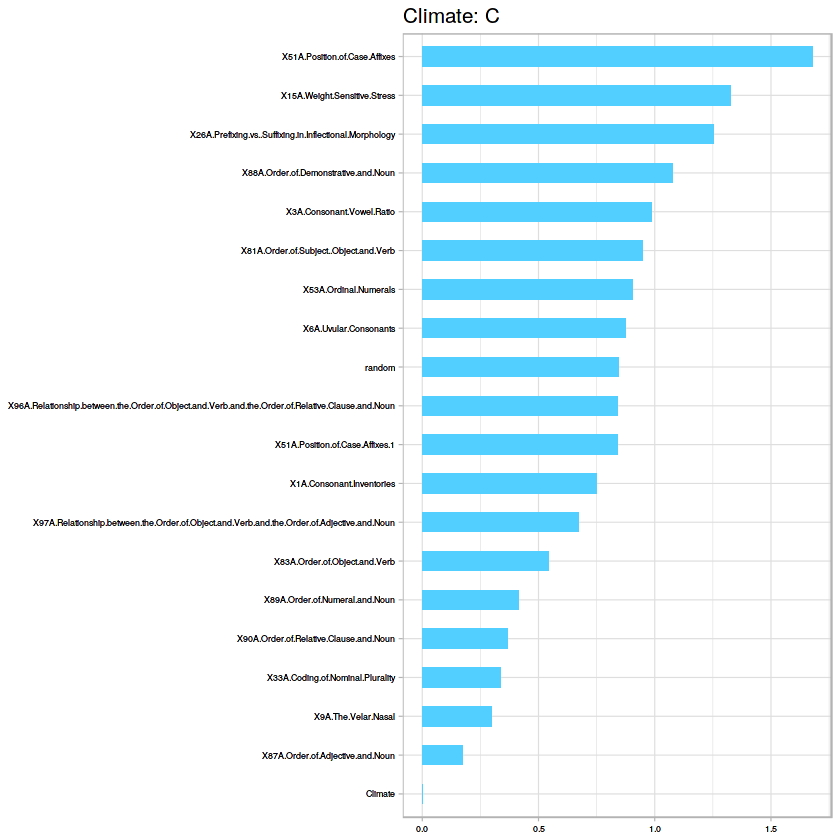

[1] "Accuracy for SVM:73.125"
   
     D  X
  D  6  0
  X  7 51
   
     D  X
  D  6  0
  X  7 51
[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9392891


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

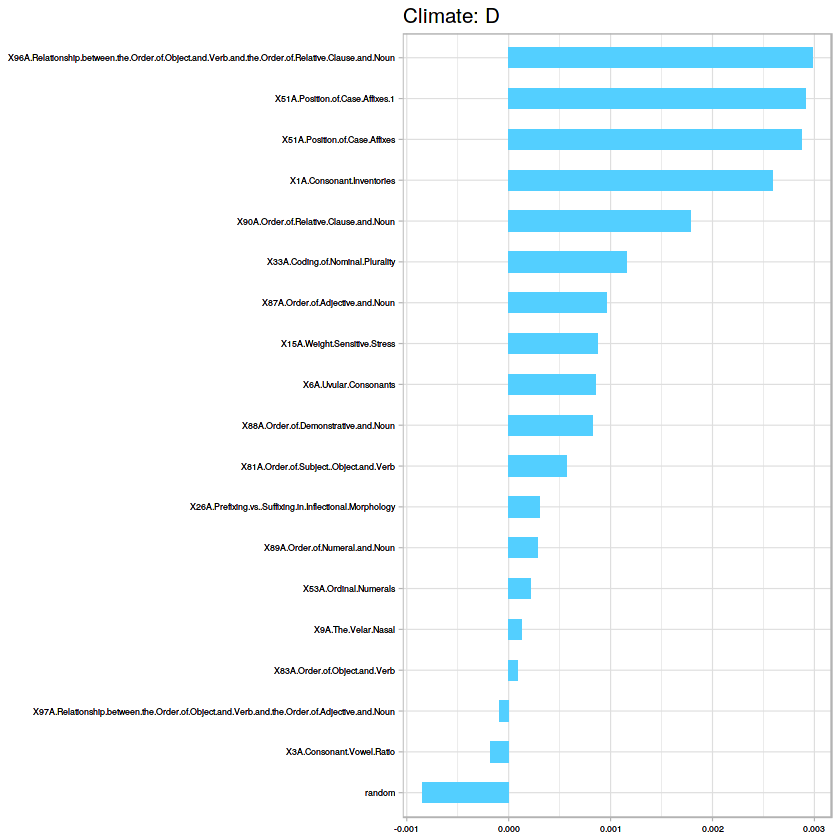

[1] C-V accuracy for Random Forest is 0.97032967032967
[1] "RF Confusion Matrix:"
   
     E  X
  E  0  0
  X  2 62


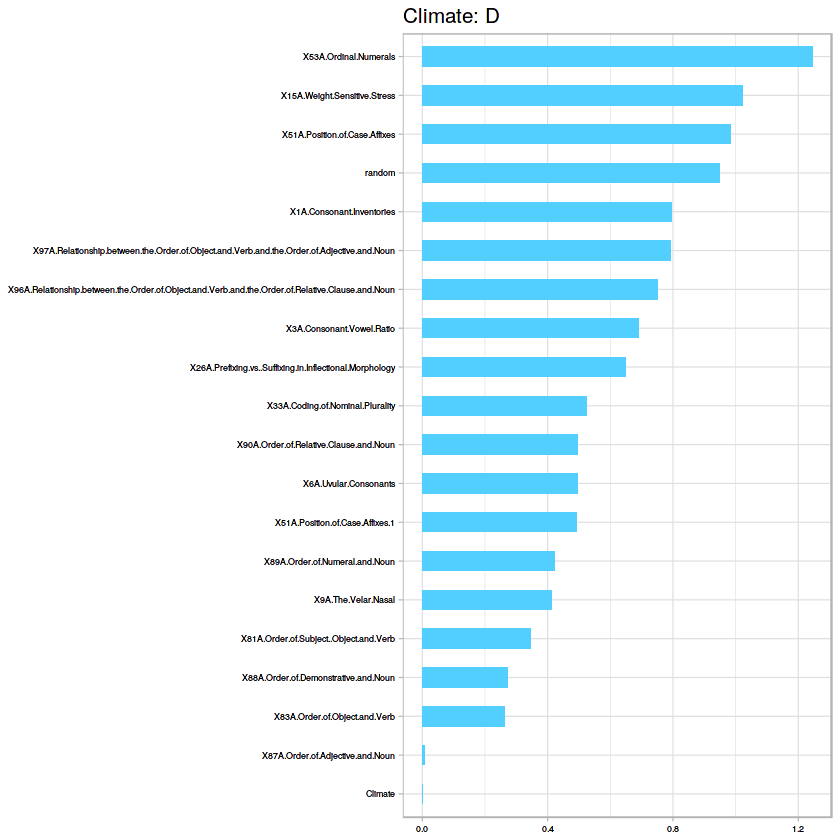

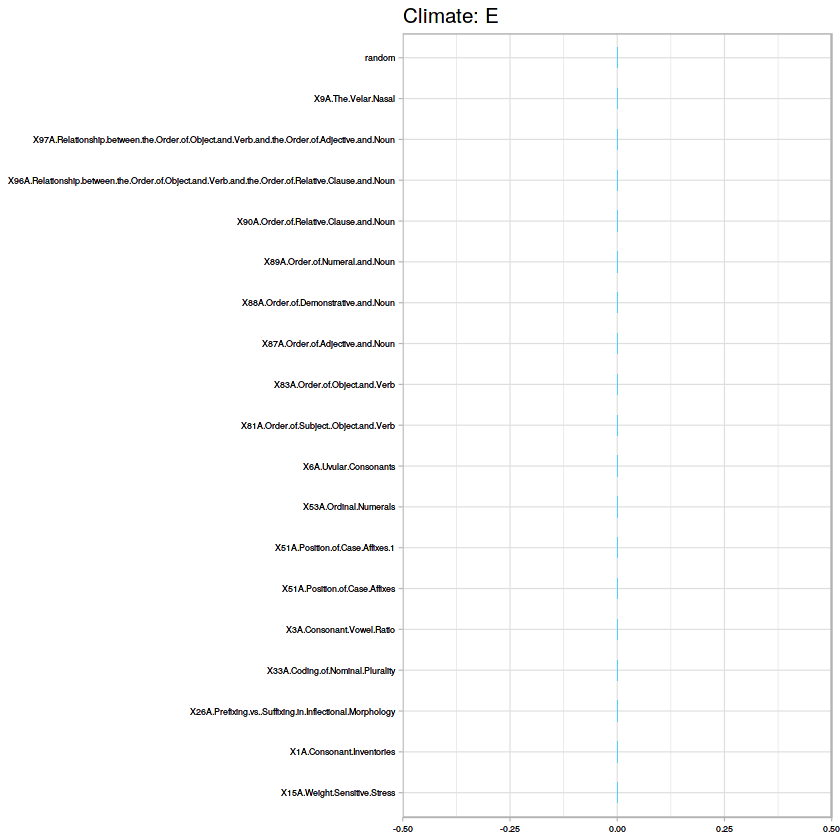

[1] "Accuracy for SVM:96.875"
   
     E  X
  E  0  0
  X  2 62
   
     E  X
  E  0  0
  X  2 62


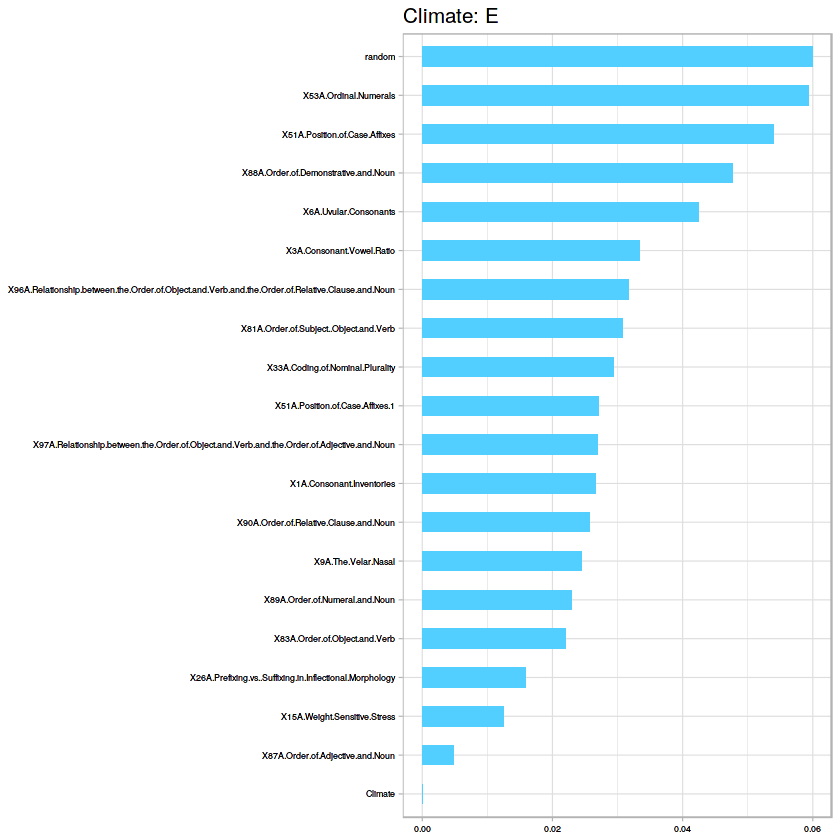

In [515]:
#One vs All
ovsa(mds1)

[1] "A" "B"
[1] 0.5950937
[1] "Dummy Classifier accuracy:0.59509375"
[1] C-V accuracy for Random Forest is 0.72
[1] "RF Confusion Matrix:"
   
     A  B
  A 23  9
  B  0  0


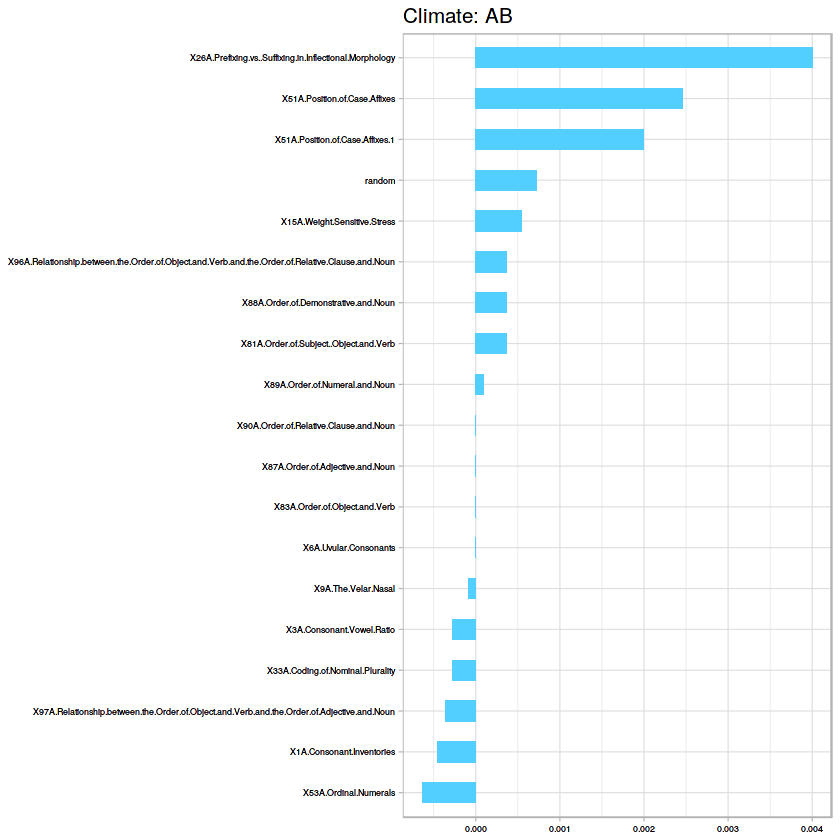

[1] "Accuracy for SVM:71.875"
   
     A  B
  A 23  0
  B  0  9
   
     A  B
  A 23  0
  B  0  9
[1] "A" "C"
[1] 0.5129625
[1] "Dummy Classifier accuracy:0.5129625"
[1] C-V accuracy for Random Forest is 0.816269841269841
[1] "RF Confusion Matrix:"
   
     A  C
  A 17  1
  C  6 16


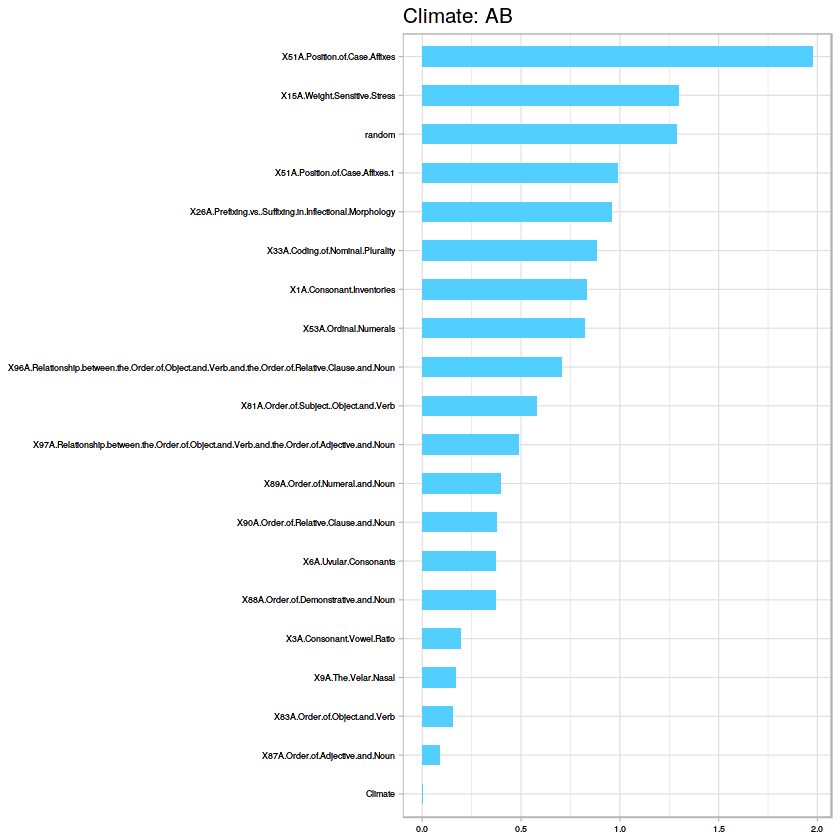

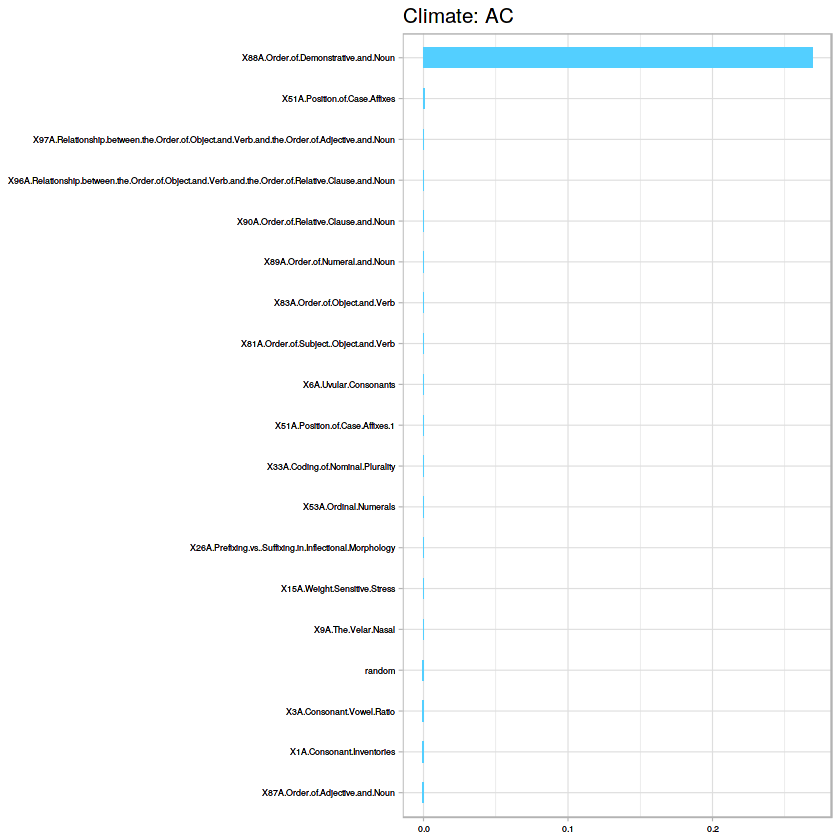

[1] "Accuracy for SVM:76.5"
   
     A  C
  A 23  1
  C  0 16
   
     A  C
  A 23  1
  C  0 16
[1] "A" "D"
[1] 0.5405139
[1] "Dummy Classifier accuracy:0.540513888888889"
[1] C-V accuracy for Random Forest is 0.827380952380952
[1] "RF Confusion Matrix:"
   
     A  D
  A 21  2
  D  2 11


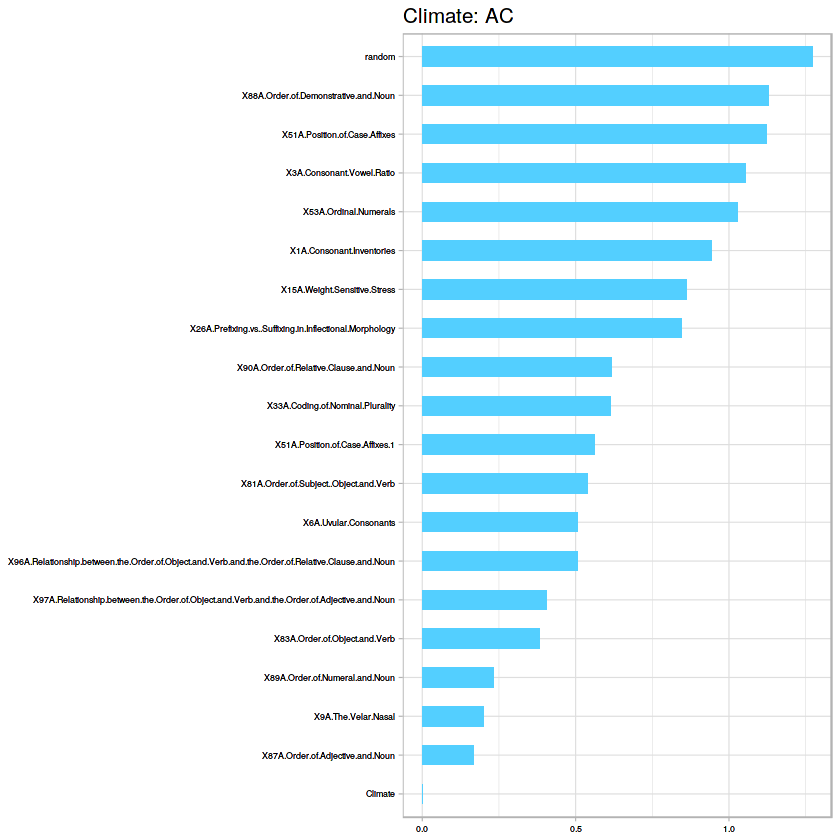

[1] "Accuracy for SVM:82.2222222222222"
   
     A  D
  A 23  0
  D  0 13
   
     A  D
  A 23  0
  D  0 13
[1] "A" "E"
[1] 0.85248
[1] "Dummy Classifier accuracy:0.85248"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

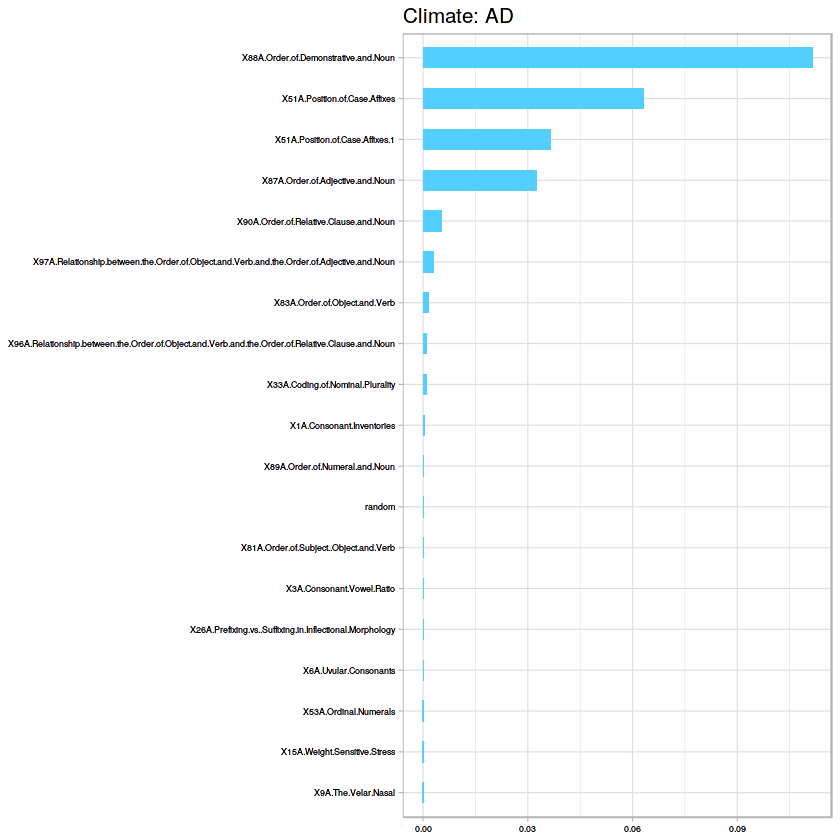

[1] C-V accuracy for Random Forest is 0.928888888888889
[1] "RF Confusion Matrix:"
   
     A  E
  A 23  2
  E  0  0


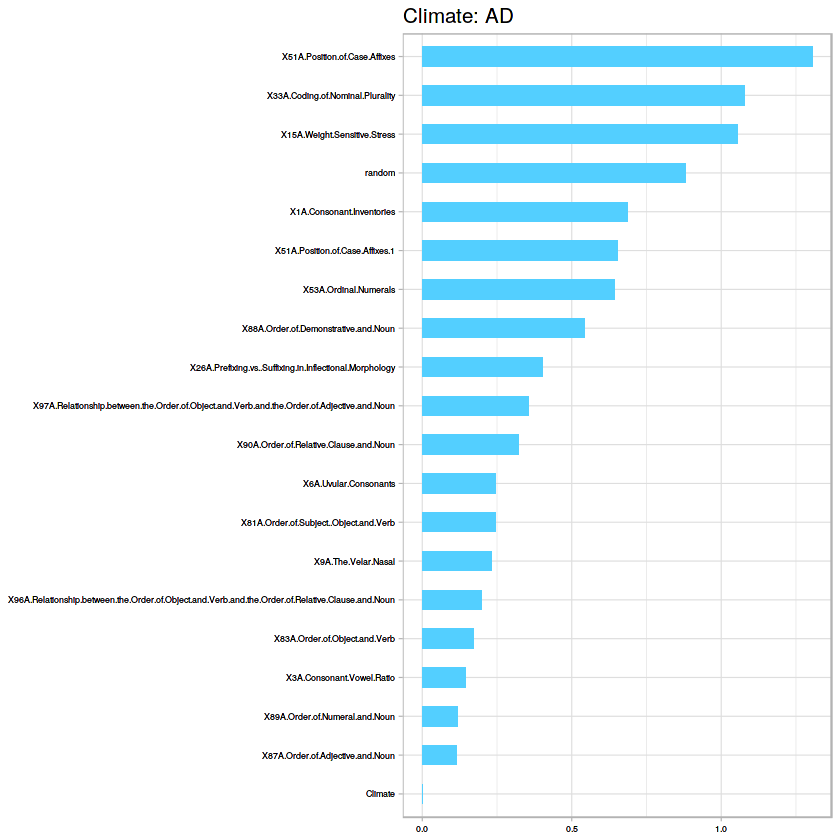

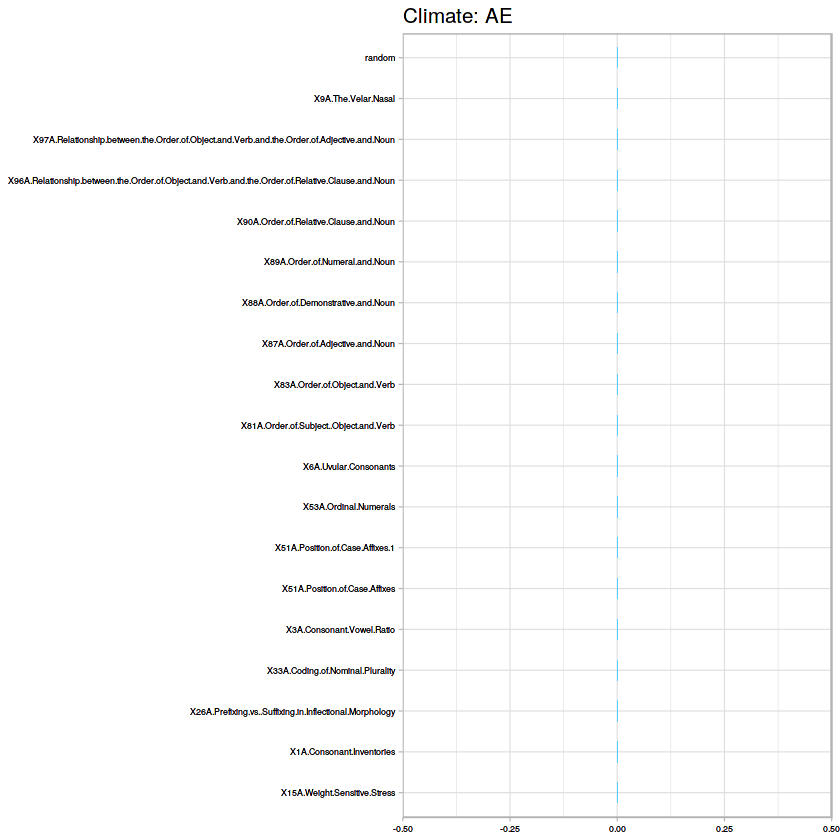

[1] "Accuracy for SVM:92"
   
     A  E
  A 23  2
  E  0  0
   
     A  E
  A 23  2
  E  0  0
[1] "B" "C"
[1] 0.54575
[1] "Dummy Classifier accuracy:0.54575"
[1] C-V accuracy for Random Forest is 0.656666666666667
[1] "RF Confusion Matrix:"
   
     B  C
  B  0  0
  C  9 17


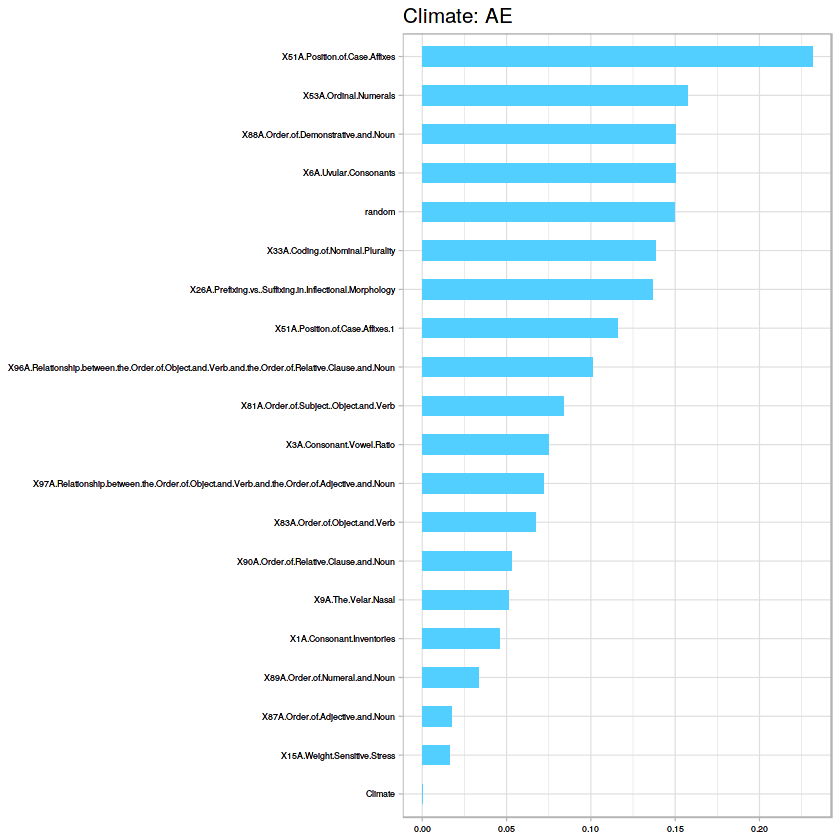

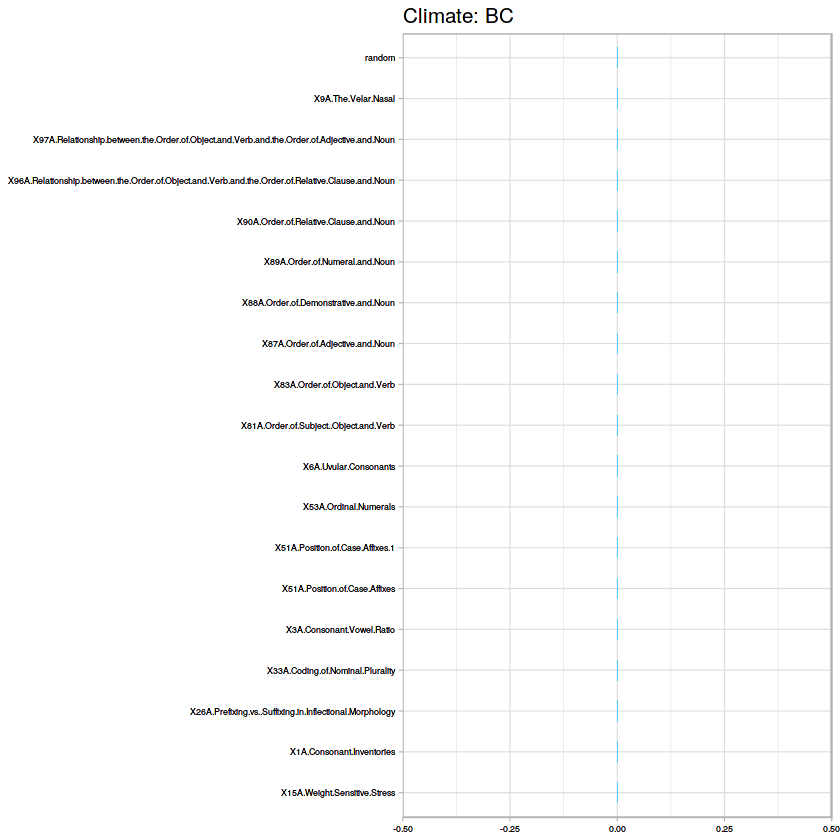

[1] "Accuracy for SVM:50.7692307692308"
   
     B  C
  B  7  0
  C  2 17
   
     B  C
  B  7  0
  C  2 17
[1] "B" "D"
[1] 0.5186591
[1] "Dummy Classifier accuracy:0.518659090909091"
[1] C-V accuracy for Random Forest is 0.591111111111111
[1] "RF Confusion Matrix:"
   
     B  D
  B  0  0
  D  9 13


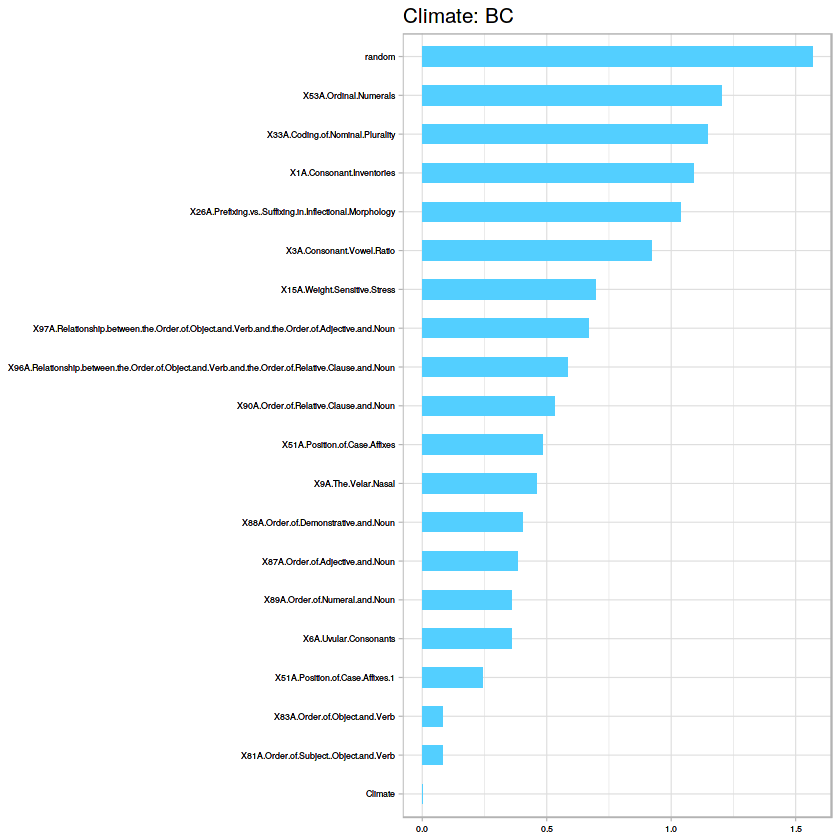

[1] "Accuracy for SVM:64.5454545454545"
   
     B  D
  B  7  0
  D  2 13
   
     B  D
  B  7  0
  D  2 13
[1] "B" "E"
[1] 0.6983182
[1] "Dummy Classifier accuracy:0.698318181818182"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

[1] C-V accuracy for Random Forest is 0.855555555555556


ERROR: Error in model@fit(data, ...): fraction of 0.000000 is too small


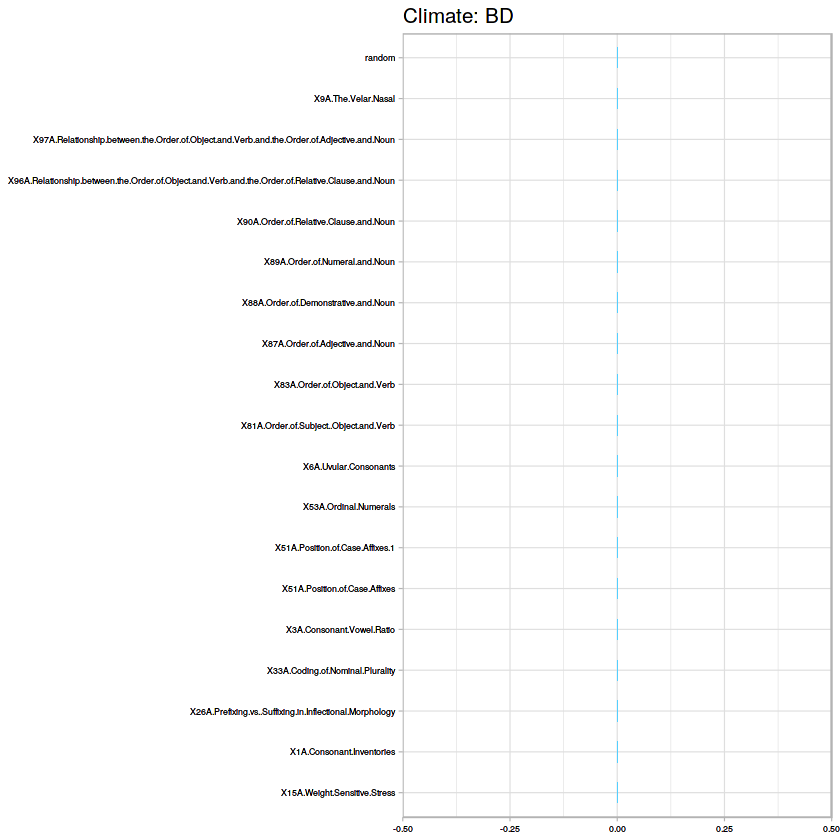

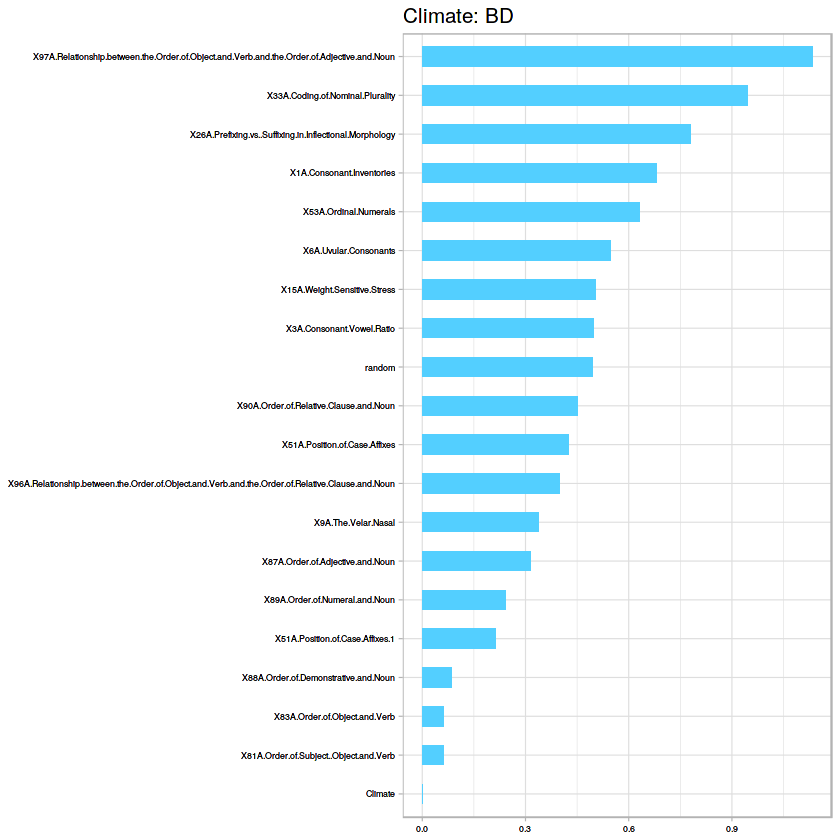

In [526]:
#One vs One
ovo(mds1)

[1] "Climate: "
[1] "A" "B"
[1] "Dummy Classifier"
[1] 0.5001562
[1] 0.5001562
[1] C-V accuracy for Random Forest is 0.774481074481075
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 24  1
  Z  8 31


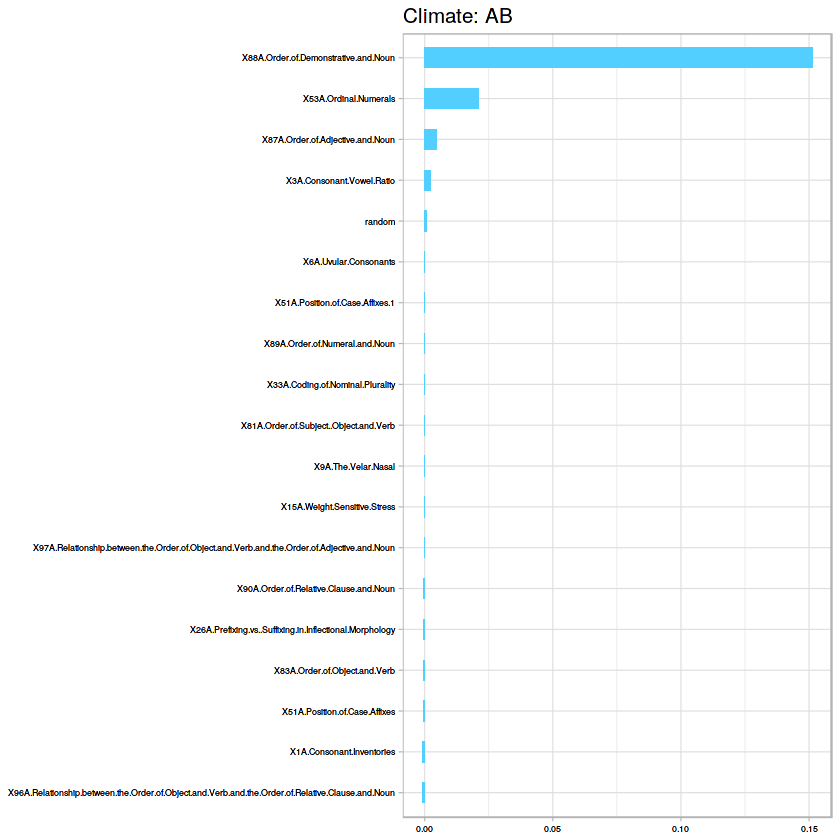

[1] "Accuracy for SVM:75"
   
     Y  Z
  Y 31  1
  Z  1 31
[1] "Climate: "
[1] "A" "C"
[1] "Dummy Classifier"
[1] 0.529875
[1] 0.529875
[1] C-V accuracy for Random Forest is 0.69957264957265
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 34  7
  Z  6 17


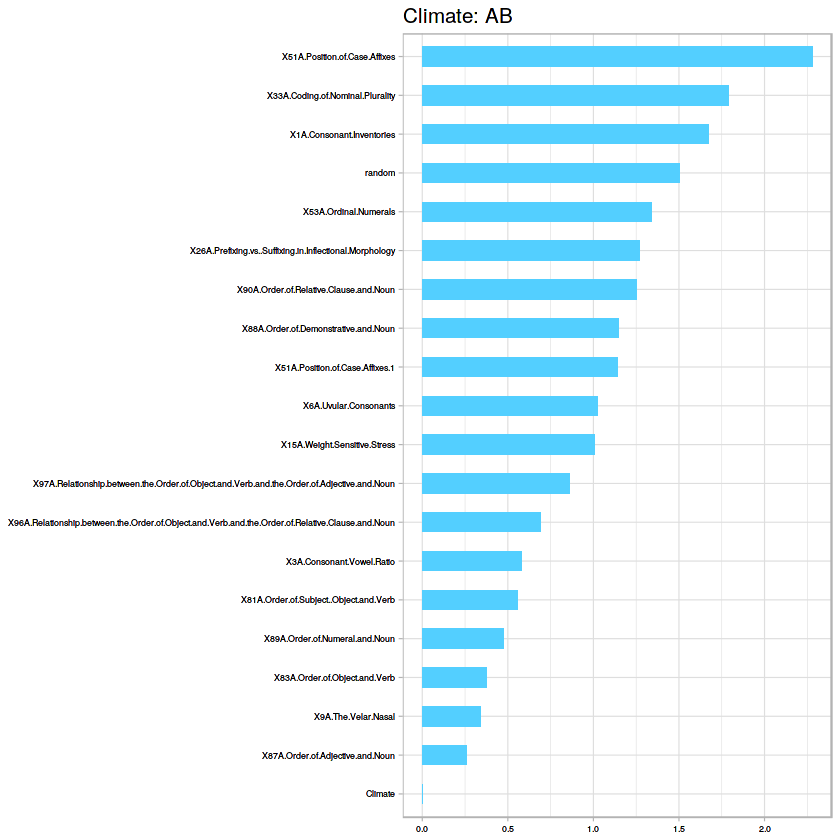

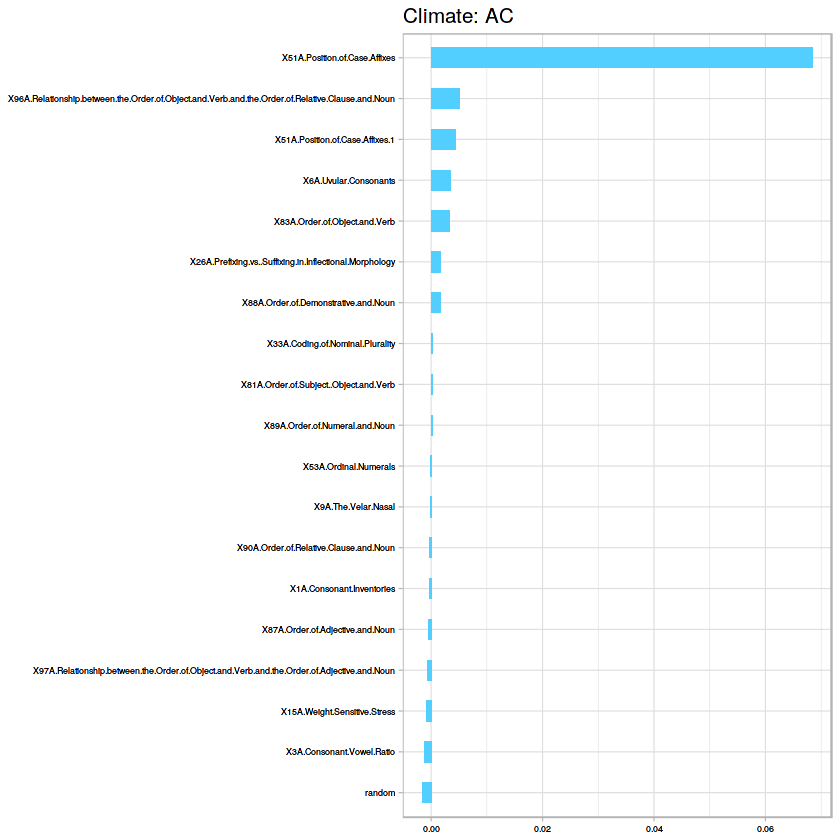

[1] "Accuracy for SVM:56.875"
   
     Y  Z
  Y 38  1
  Z  2 23
[1] "Climate: "
[1] "A" "D"
[1] "Dummy Classifier"
[1] 0.5068438
[1] 0.5068438
[1] C-V accuracy for Random Forest is 0.562881562881563
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 35 19
  Z  1  9


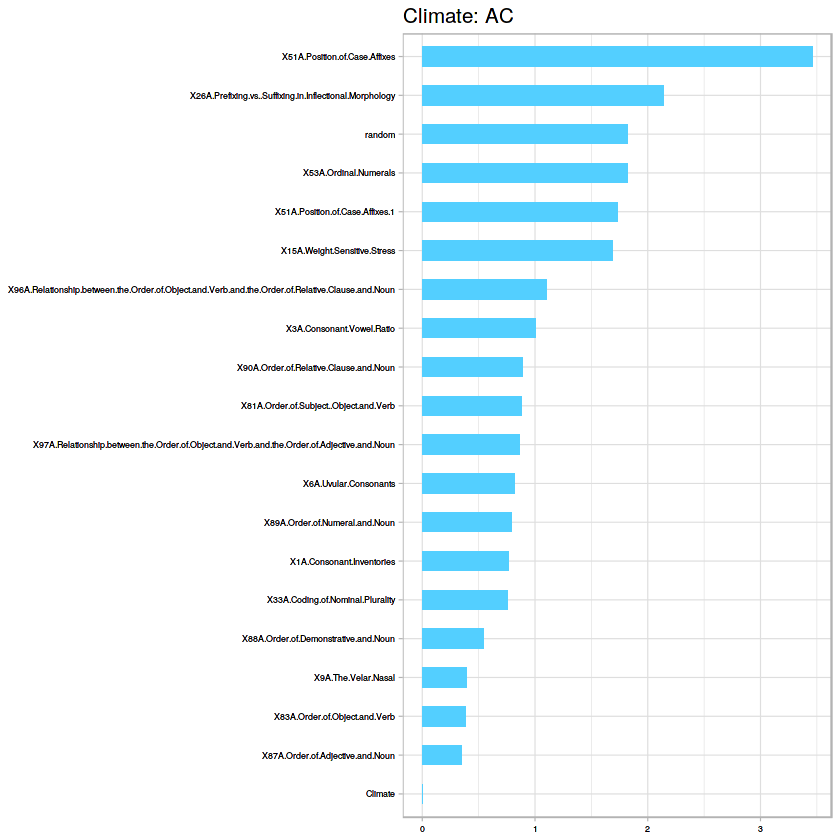

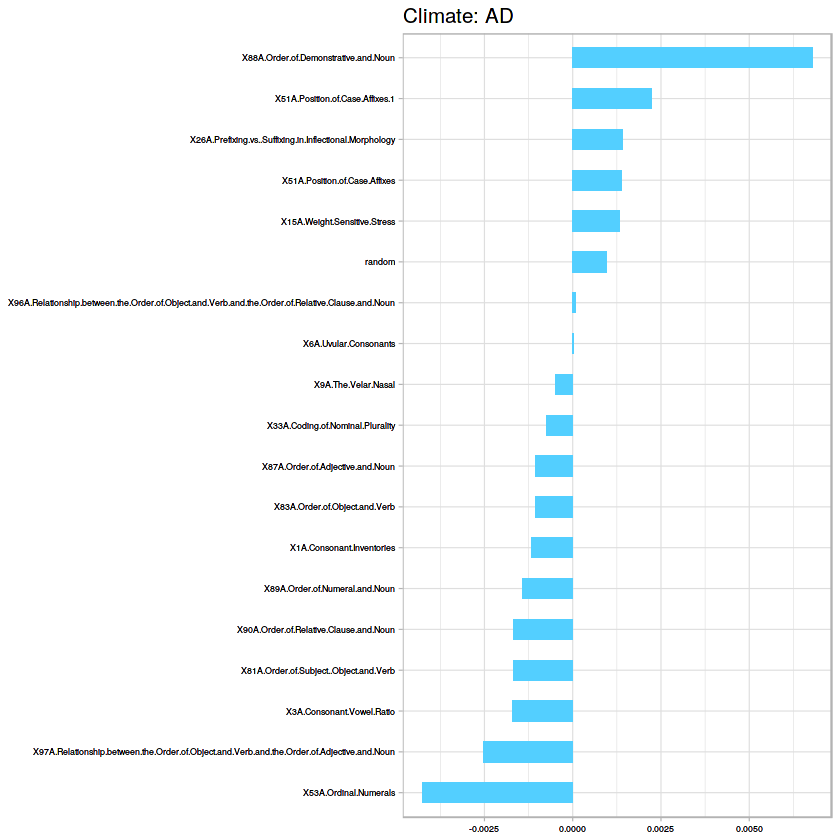

[1] "Accuracy for SVM:48.4375"
   
     Y  Z
  Y 35  5
  Z  1 23
[1] "Climate: "
[1] "A" "E"
[1] "Dummy Classifier"
[1] 0.5230781
[1] 0.5230781
[1] C-V accuracy for Random Forest is 0.812820512820513
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 17  4
  Z  8 35


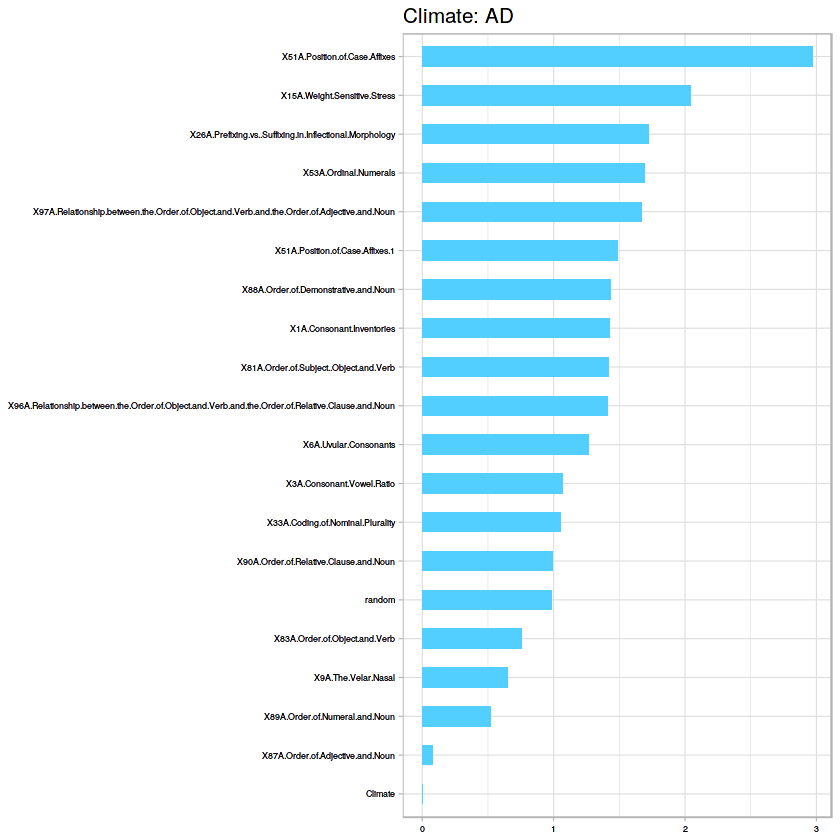

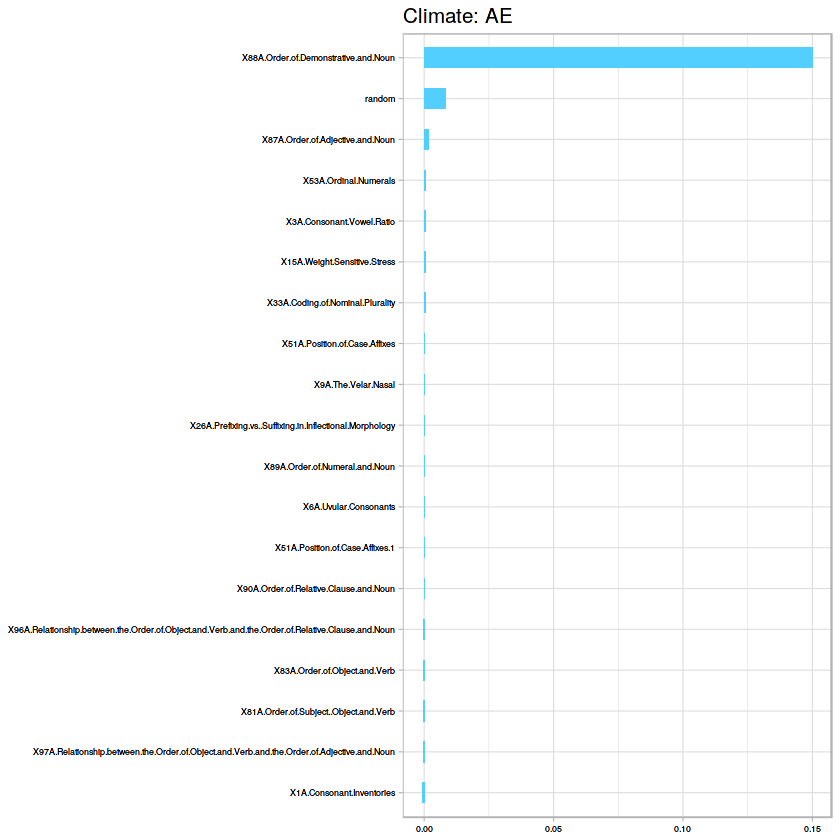

[1] "Accuracy for SVM:77.8125"
   
     Y  Z
  Y 24  0
  Z  1 39
[1] "Climate: "
[1] "B" "C"
[1] "Dummy Classifier"
[1] 0.5176094
[1] 0.5176094
[1] C-V accuracy for Random Forest is 0.593711843711844
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 26 38


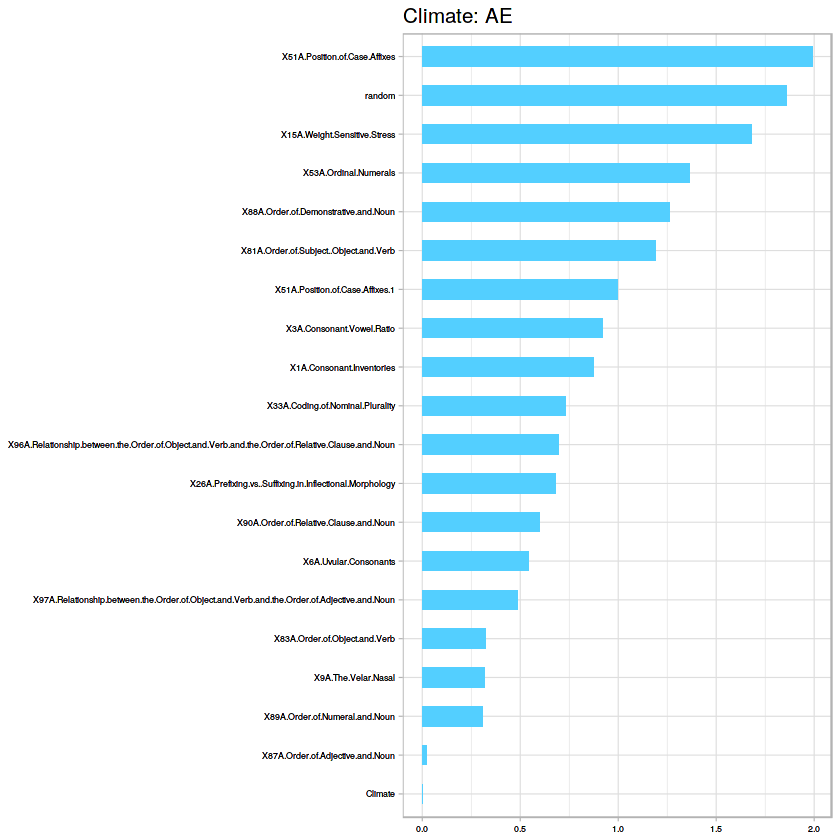

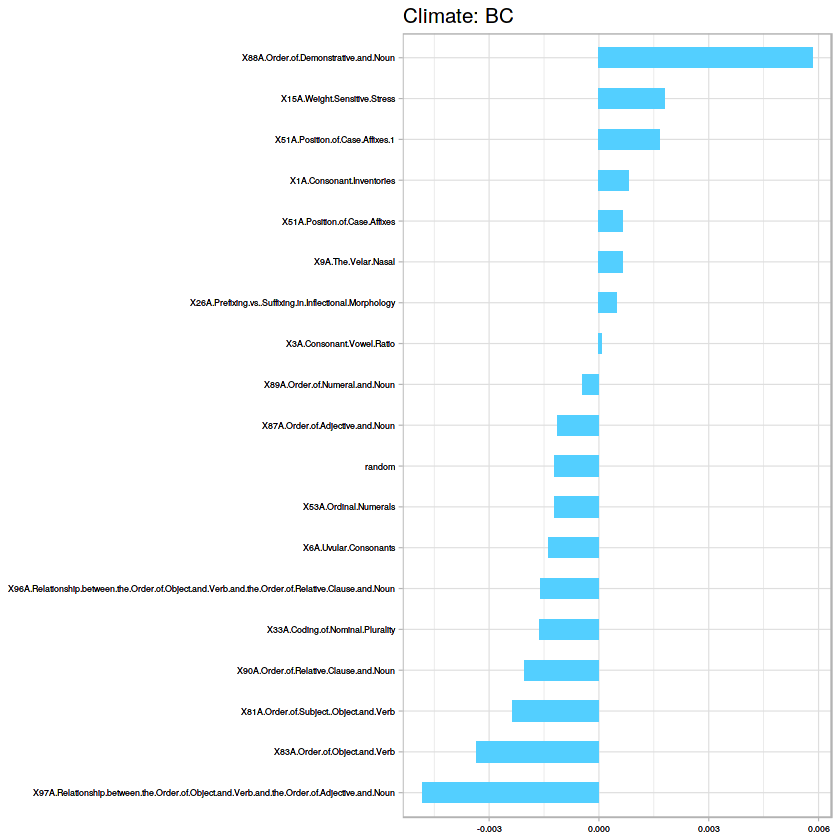

[1] "Accuracy for SVM:46.5625"
   
     Y  Z
  Y 17  1
  Z  9 37
[1] "Climate: "
[1] "B" "D"
[1] "Dummy Classifier"
[1] 0.5513125
[1] 0.5513125
[1] C-V accuracy for Random Forest is 0.704273504273504
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 13  2
  Z  9 40


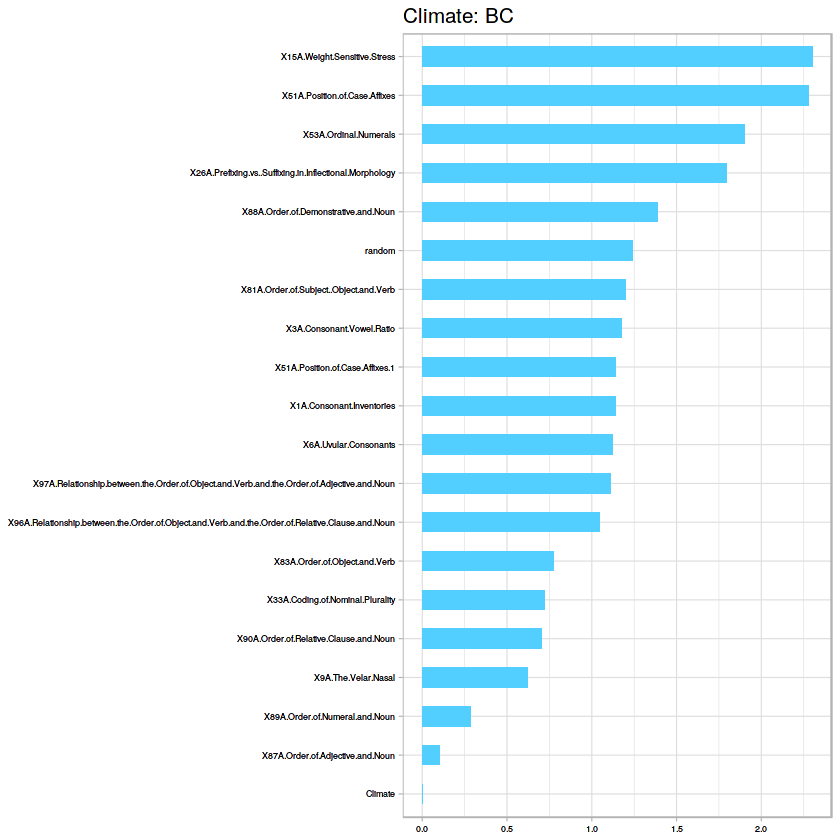

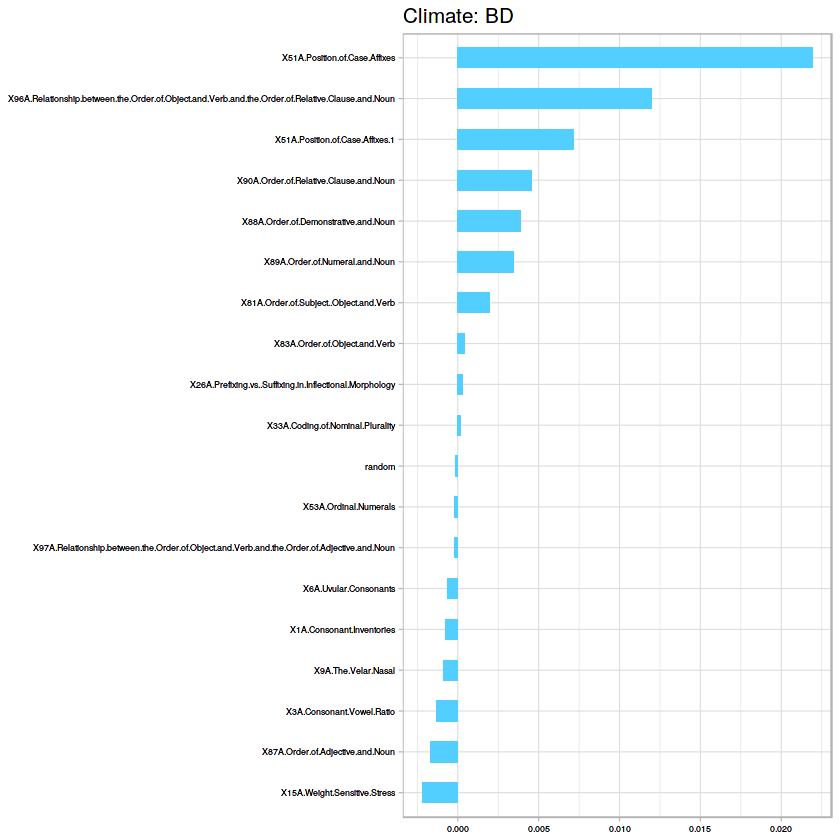

[1] "Accuracy for SVM:62.5"
   
     Y  Z
  Y 15  1
  Z  7 41
[1] "Climate: "
[1] "B" "E"
[1] "Dummy Classifier"
[1] 0.7163594
[1] 0.7163594
[1] C-V accuracy for Random Forest is 0.828205128205128
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 11 53


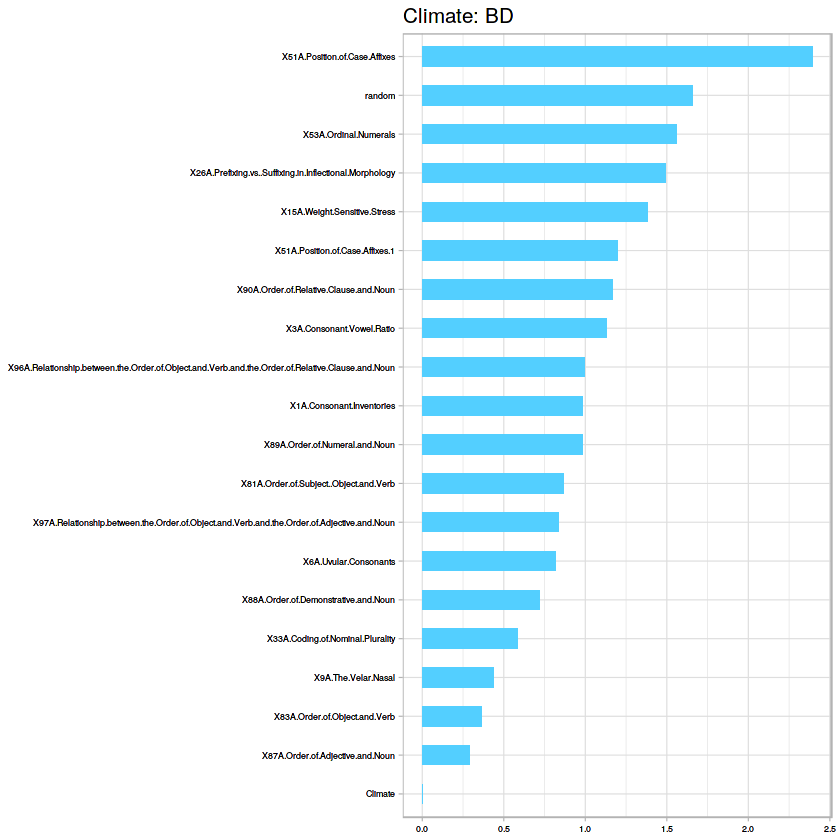

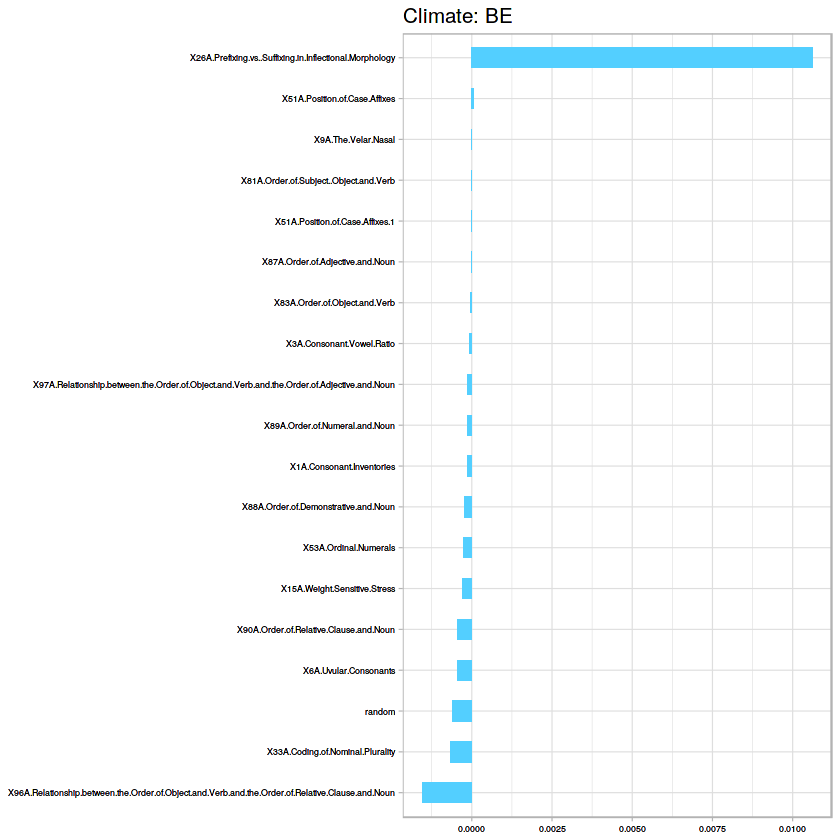

[1] "Accuracy for SVM:81.875"
   
     Y  Z
  Y  3  0
  Z  8 53
[1] "Climate: "
[1] "C" "D"
[1] "Dummy Classifier"
[1] 0.5011406
[1] 0.5011406
[1] C-V accuracy for Random Forest is 0.75042735042735
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 29  9
  Z  1 25


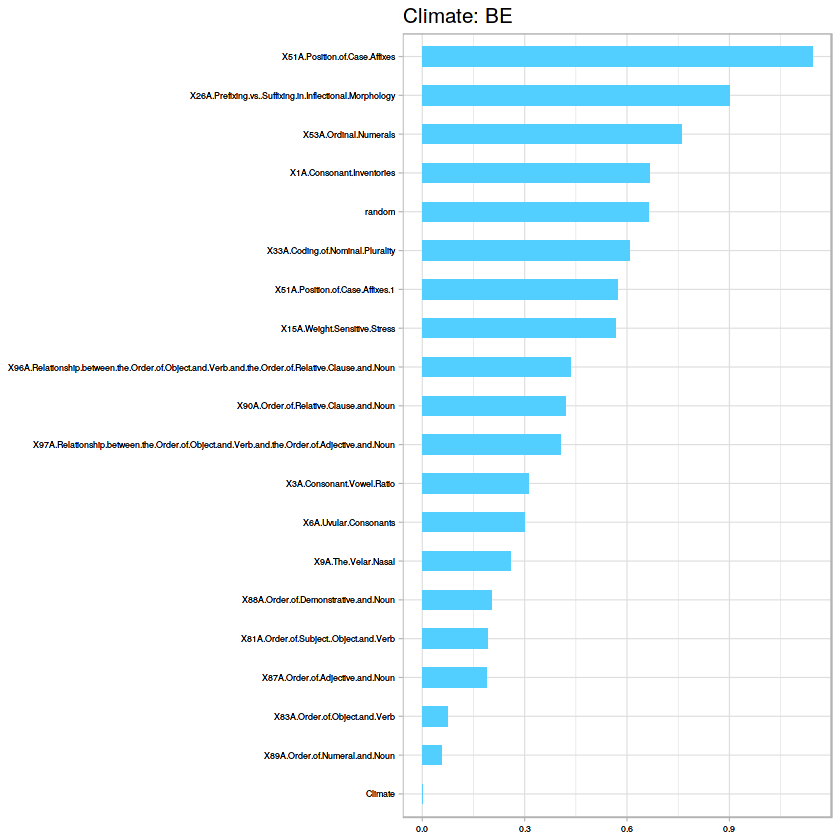

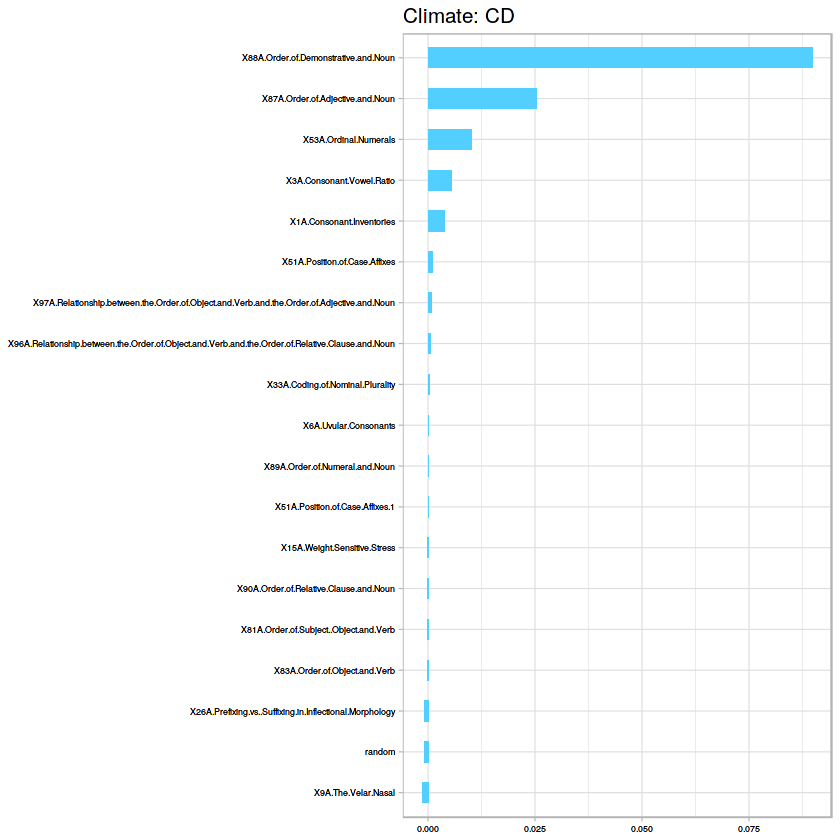

[1] "Accuracy for SVM:66.5625"
   
     Y  Z
  Y 28  1
  Z  2 33
[1] "Climate: "
[1] "C" "E"
[1] "Dummy Classifier"
[1] 0.5810469
[1] 0.5810469
[1] C-V accuracy for Random Forest is 0.703846153846154
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 19 45


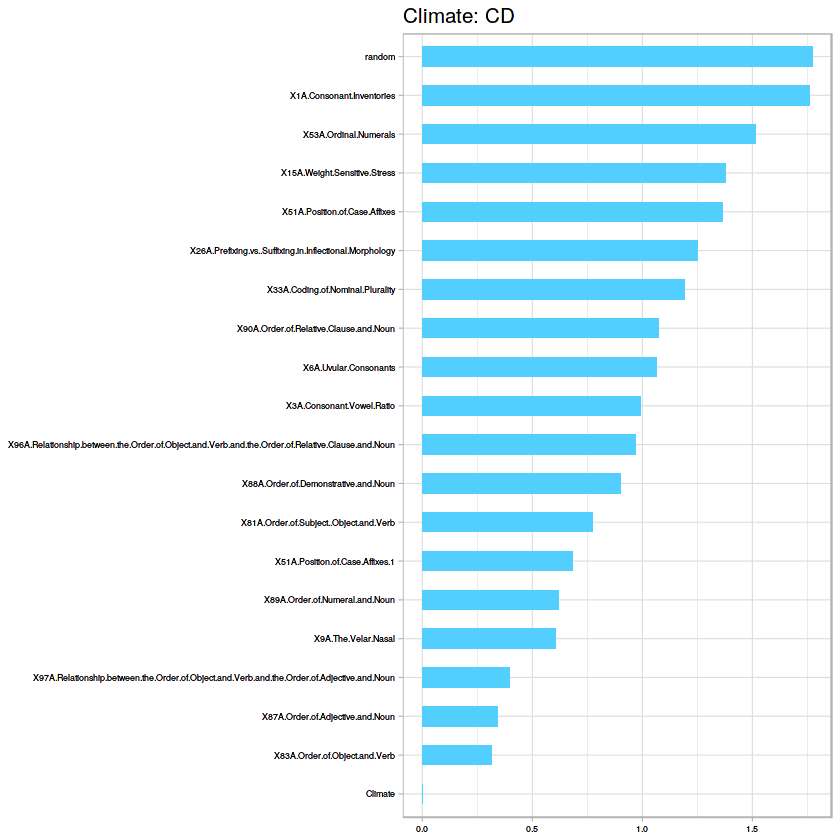

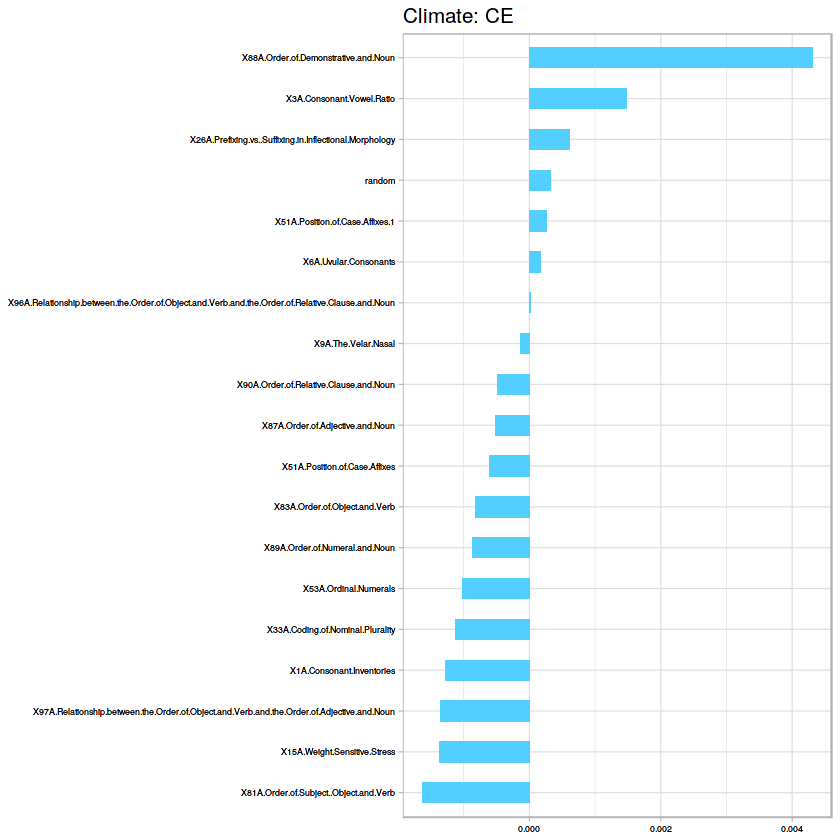

[1] "Accuracy for SVM:63.75"
   
     Y  Z
  Y 11  0
  Z  8 45
[1] "Climate: "
[1] "D" "E"
[1] "Dummy Classifier"
[1] 0.64125
[1] 0.64125
[1] C-V accuracy for Random Forest is 0.765384615384615
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 15 49


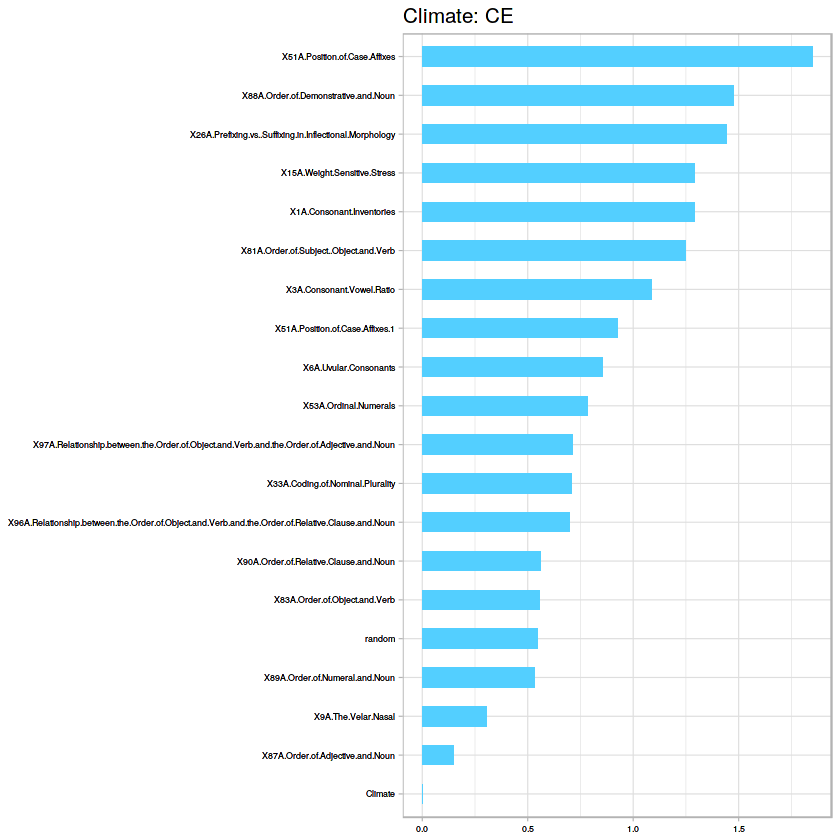

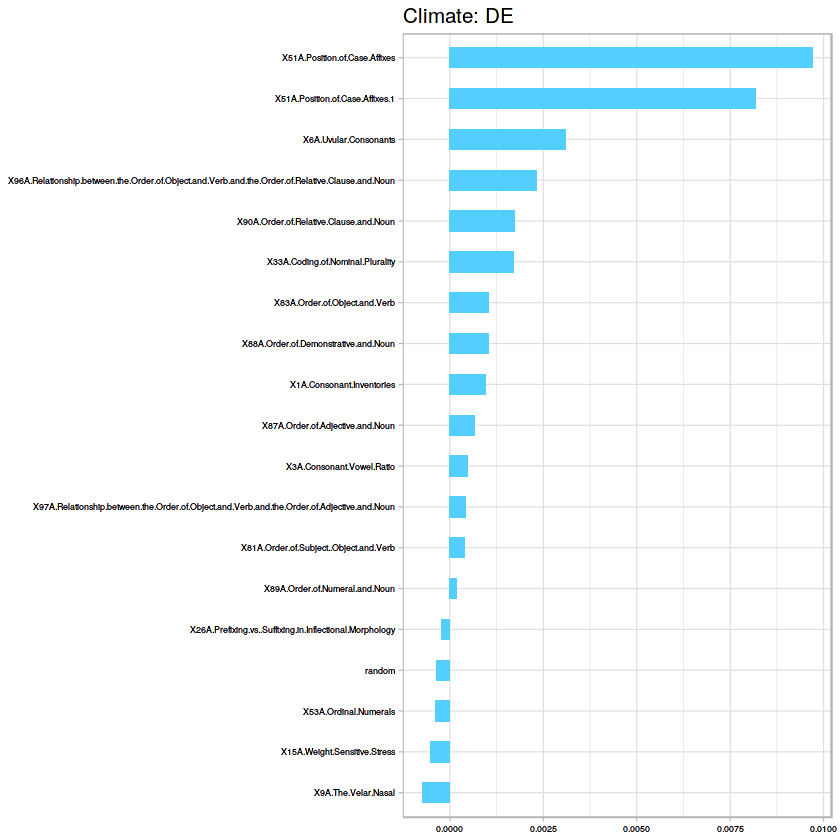

[1] "Accuracy for SVM:66.875"
   
     Y  Z
  Y  9  0
  Z  6 49


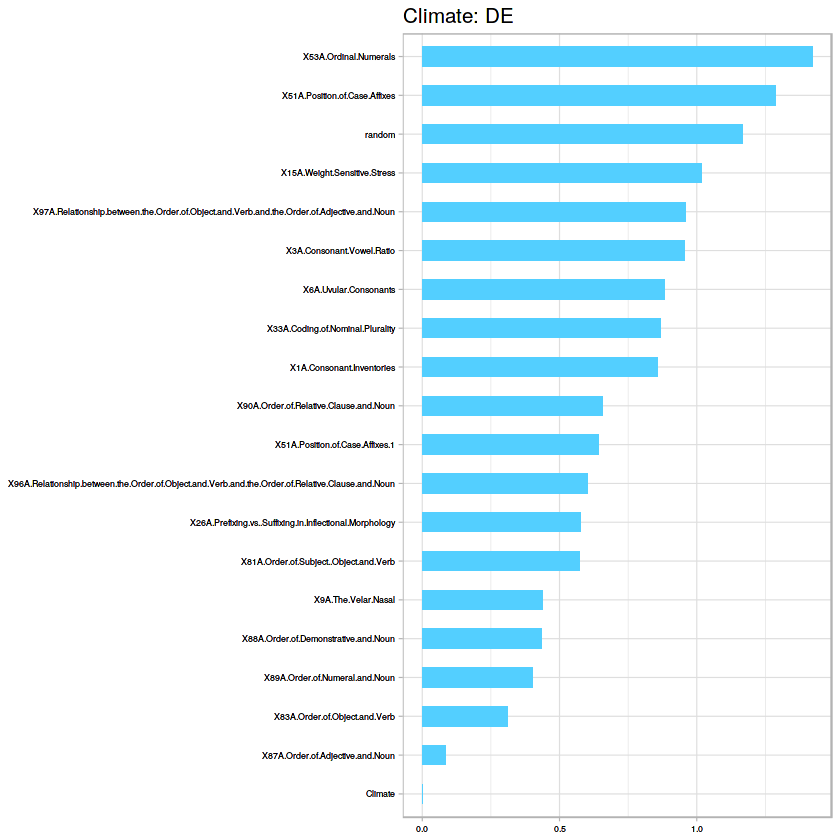

In [539]:
# 2 vs 3 
bin_2v3(mds1)

[1] Abkhaz                Arabic (Egyptian)     Alamblak             
 [4] Amele                 Apurin??              Armenian (Eastern)   
 [7] Asmat                 Bagirmi               Bawm                 
[10] Batak (Karo)          Berber (Middle Atlas) Burushaski           
[13] Chukchi               Chuvash               Chinantec (Lealao)   
[16] Comanche              Coos (Hanis)          Diola-Fogny          
[19] Drehu                 English               Epena Pedee          
[22] Evenki                Finnish               French               
[25] Georgian              German                Grebo                
[28] Greek (Modern)        Greenlandic (West)    Hindi                
[31] Hungarian             Hunzib                Indonesian           
[34] Iraqw                 Jakaltek              Kayardild            
[37] Kewa                  Koromfe               Khalkha              
[40] Khmer                 Khasi                 Kilivila             
[43] Kunama                Koasati               Kobon                
[46] Krongo                Kutenai               Lango                
[49] Latvian               Lezgian               Luise??o             
[52] Malagasy              Maori                 Maricopa             
[55] Maung                 Maybrat               Mandarin             
[58] Martuthunira          Mundari               Mangarrayi           
[61] Ndyuka                Nivkh                 Paumar?_             
[64] Persian               Pashto                Rapanui              
[67] Russian               Sedang                Slave                
[70] Spanish               Supyire               Swahili              
[73] Taba                  Tiwi                  Tukang Besi          
[76] Turkish               Ungarinjin            Wich?_               
[79] Wichita               Yaqui                 Yidiny               
[82] Yukaghir (Kolyma)     Yuchi                
2677 Levels: !X?_?? !Xun (Ekoka) 'Are'are //Ani /Xam =|Hoan ??m??rillon ... rGyalrong (Caodeng)

[1] Northwest Caucasian Afro-Asiatic        Sepik              
 [4] Trans-New Guinea    Arawakan            Indo-European      
 [7] Trans-New Guinea    Central Sudanic     Sino-Tibetan       
[10] Austronesian        Afro-Asiatic        Burushaski         
[13] Chukotko-Kamchatkan Altaic              Oto-Manguean       
[16] Uto-Aztecan         Oregon Coast        Niger-Congo        
[19] Austronesian        Indo-European       Choco              
[22] Altaic              Uralic              Indo-European      
[25] Kartvelian          Indo-European       Niger-Congo        
[28] Indo-European       Eskimo-Aleut        Indo-European      
[31] Uralic              Nakh-Daghestanian   Austronesian       
[34] Afro-Asiatic        Mayan               Tangkic            
[37] Trans-New Guinea    Niger-Congo         Altaic             
[40] Austro-Asiatic      Austro-Asiatic      Austronesian       
[43] Kunama              Muskogean           Trans-New Guinea   
[46] Kadu                Kutenai             Eastern Sudanic    
[49] Indo-European       Nakh-Daghestanian   Uto-Aztecan        
[52] Austronesian        Austronesian        Hokan              
[55] Iwaidjan            West Papuan         Sino-Tibetan       
[58] Pama-Nyungan        Austro-Asiatic      Mangarrayi-Maran   
[61] other               Nivkh               Arauan             
[64] Indo-European       Indo-European       Austronesian       
[67] Indo-European       Austro-Asiatic      Na-Dene            
[70] Indo-European       Niger-Congo         Niger-Congo        
[73] Austronesian        Tiwian              Austronesian       
[76] Altaic              Worrorran           Matacoan           
[79] Caddoan             Uto-Aztecan         Pama-Nyungan       
[82] Yukaghir            Yuchi              
44 Levels: Afro-Asiatic Altaic Arauan Arawakan Austro-Asiatic ... other


       Afro-Asiatic              Altaic              Arauan            Arawakan 
                  3                   4                   1                   1 
     Austro-Asiatic        Austronesian          Burushaski             Caddoan 
                  4                   9                   1                   1 
    Central Sudanic               Choco Chukotko-Kamchatkan     Eastern Sudanic 
                  1                   1                   1                   1 
       Eskimo-Aleut               Hokan       Indo-European            Iwaidjan 
                  1                   1                  11                   1 
               Kadu          Kartvelian              Kunama             Kutenai 
                  1                   1                   1                   1 
   Mangarrayi-Maran            Matacoan               Mayan           Muskogean 
                  1                   1                   1                   1 
            Na-Dene   Nakh-

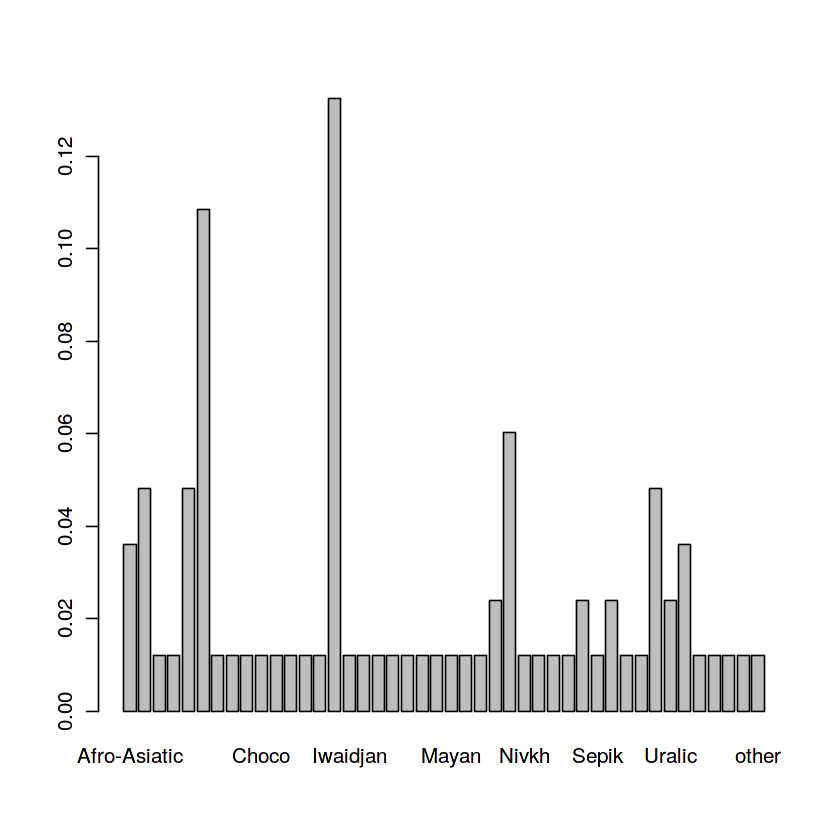

In [531]:
#Mixed Dataset 2: top 20 from each Area: Phonology, Morphology with conditional importance
s<-c(1,3,fts2,176,177)
mds2<-na.omit(lang_df[,s])

mds2[,2]<-as.factor(as.character(mds2[,2]))

mds2[,1]
mds2[,2]
table(mds2[,2])
barplot(prop.table(table(mds2[,2])))
mds2<-mds2[,-c(1,2)]
ord<-c(1,2)
mds2[sapply(mds2, is.character)] <- lapply(mds2[sapply(mds2, is.character)], as.factor)

mds2[ord] <- lapply(mds2[ord], ordered)

[1] 0.2616875
[1] C-V accuracy for Random Forest is 0.493697413697414
[1] "RF Confusion Matrix:"
   
     A  B  C  D  E
  A 19  3  2  0  0
  B  0  0  0  0  0
  C  4  5 13  4  2
  D  0  1  2  9  0
  E  0  0  0  0  0


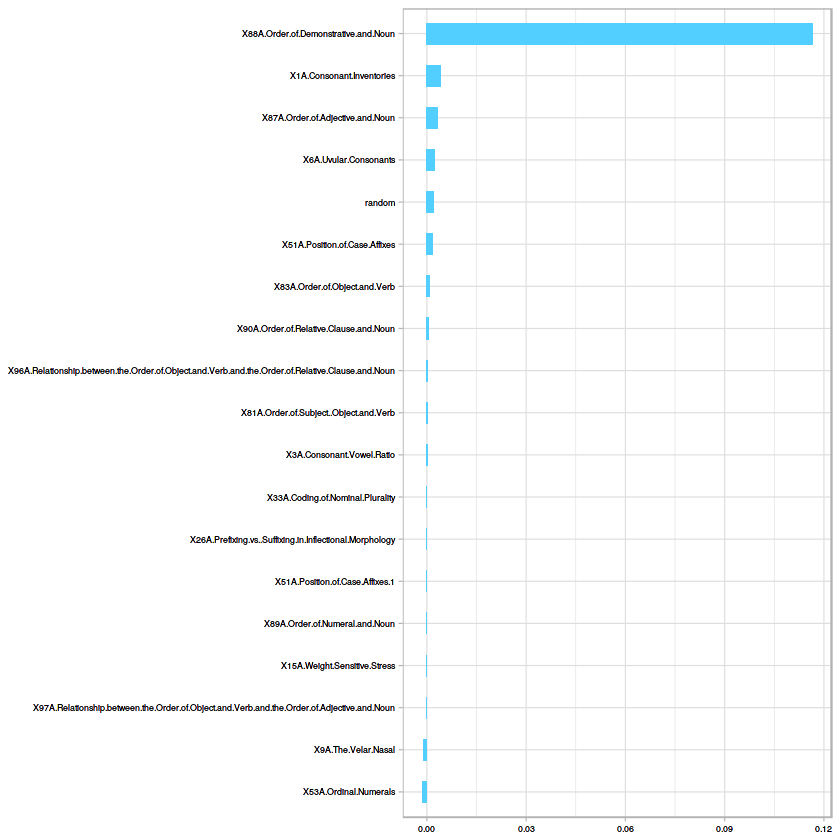

[1] "Accuracy for SVM:50"
   
     A  B  C  D  E
  A 23  0  1  0  0
  B  0  4  0  0  0
  C  0  3 14  1  1
  D  0  2  2 12  1
  E  0  0  0  0  0


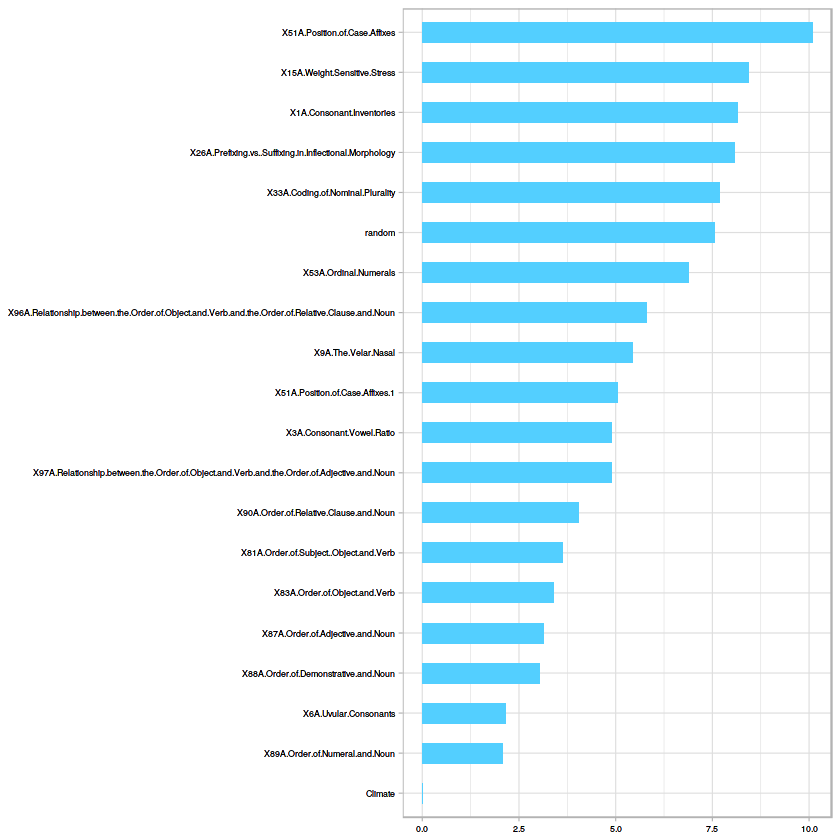

In [503]:
#Multiclass
p<-dist(mds2)
dummy_clas(class,mds2$Climate,p)
cvrf(mds2)
svmc(mds2)

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5384157
[1] C-V accuracy for Random Forest is 0.695098039215686
[1] "RF Confusion Matrix:"
   
     A  X
  A 21  5
  X  9 48


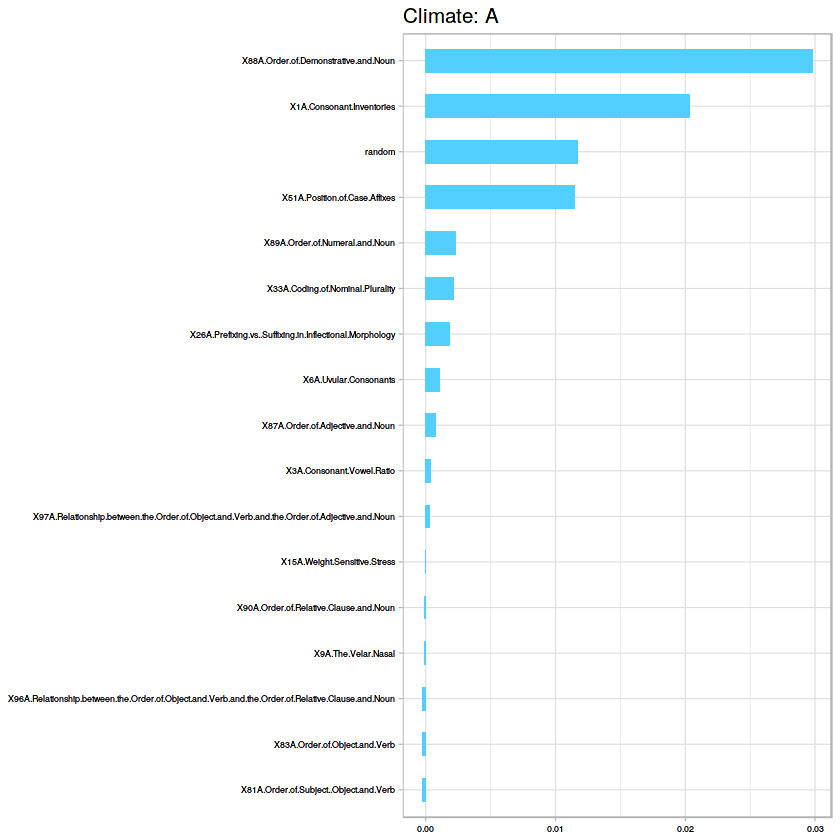

[1] "Accuracy for SVM:69.8795180722892"
   
     A  X
  A 30  1
  X  0 52
   
     A  X
  A 30  1
  X  0 52
[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7200181
[1] C-V accuracy for Random Forest is 0.831617647058823
[1] "RF Confusion Matrix:"
   
     B  X
  B  0  0
  X 14 69


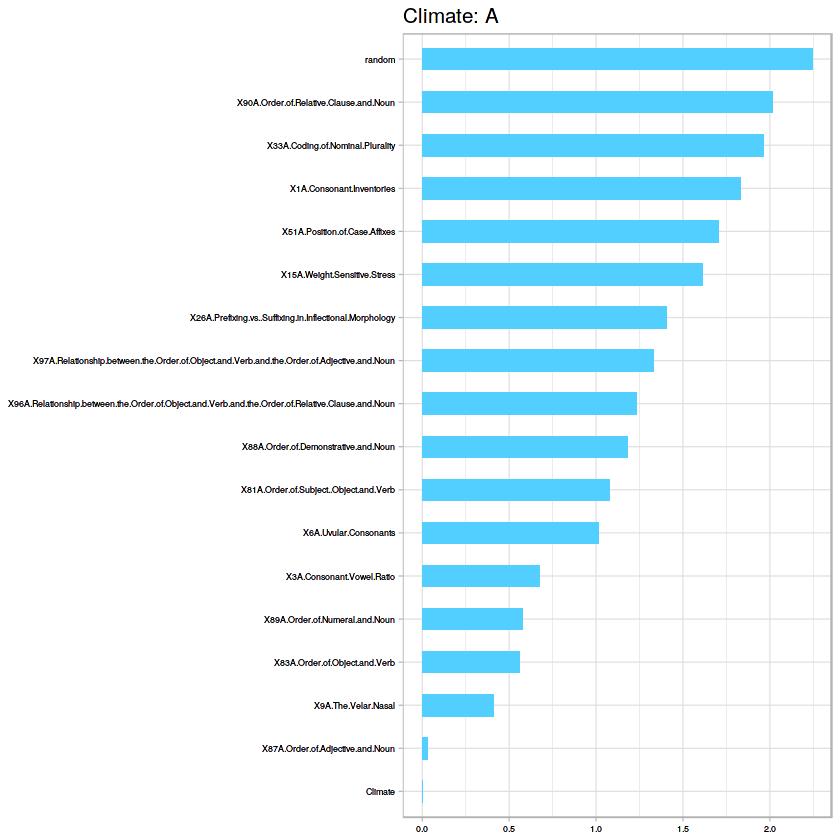

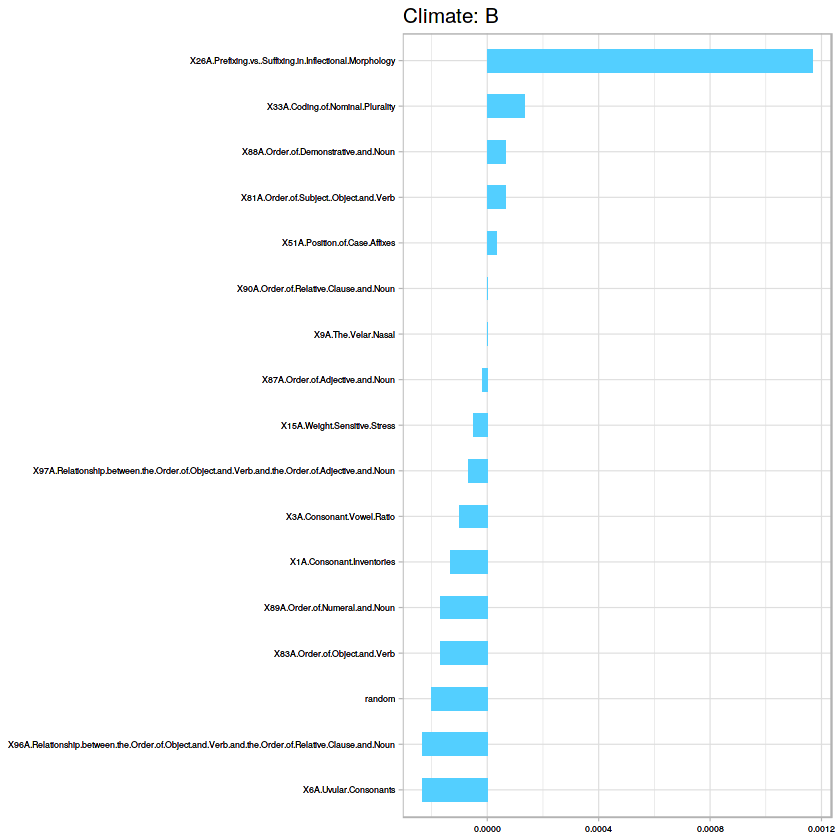

[1] "Accuracy for SVM:82.6506024096386"
   
     B  X
  B  1  0
  X 13 69
   
     B  X
  B  1  0
  X 13 69
[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.5992831
[1] C-V accuracy for Random Forest is 0.723529411764706
[1] "RF Confusion Matrix:"
   
     C  X
  C  0  0
  X 23 60


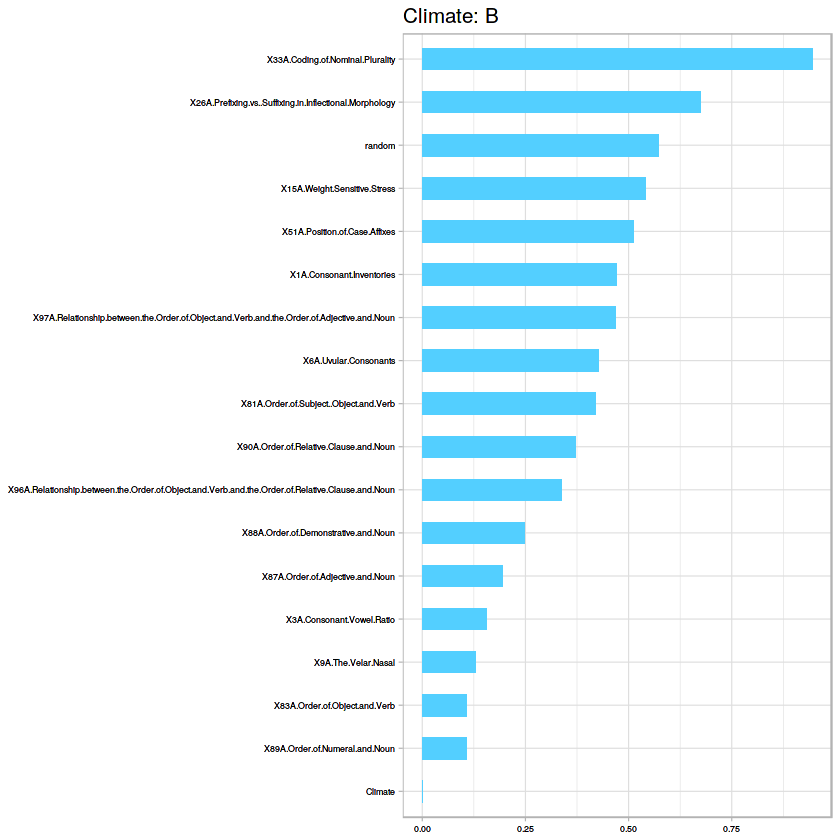

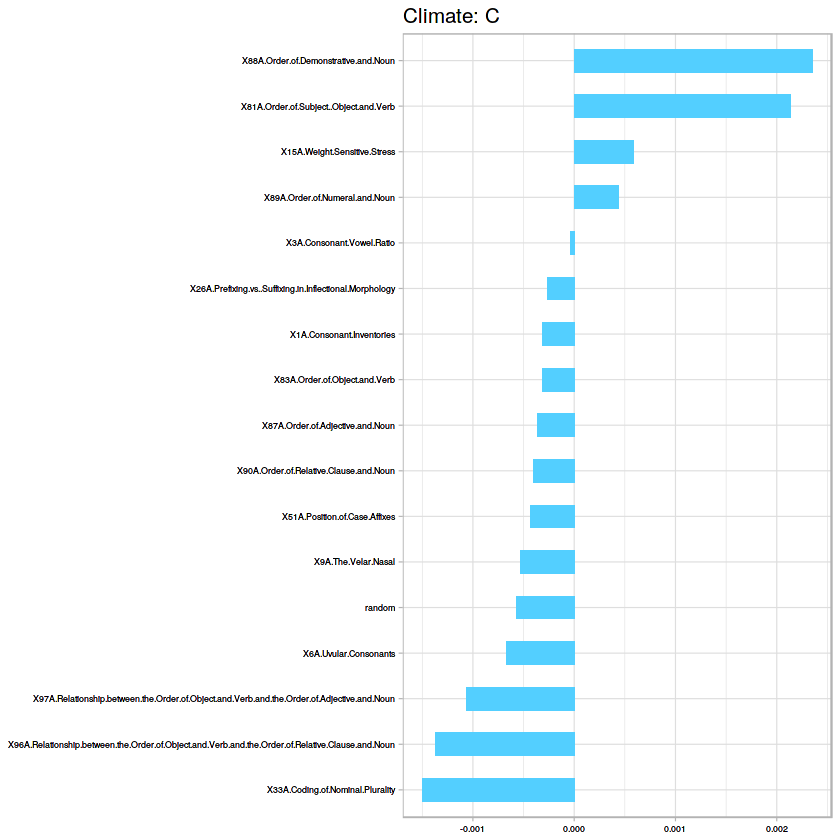

[1] "Accuracy for SVM:69.6385542168675"
   
     C  X
  C  8  0
  X 15 60
   
     C  X
  C  8  0
  X 15 60
[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.7183675
[1] C-V accuracy for Random Forest is 0.831617647058823
[1] "RF Confusion Matrix:"
   
     D  X
  D  0  0
  X 14 69


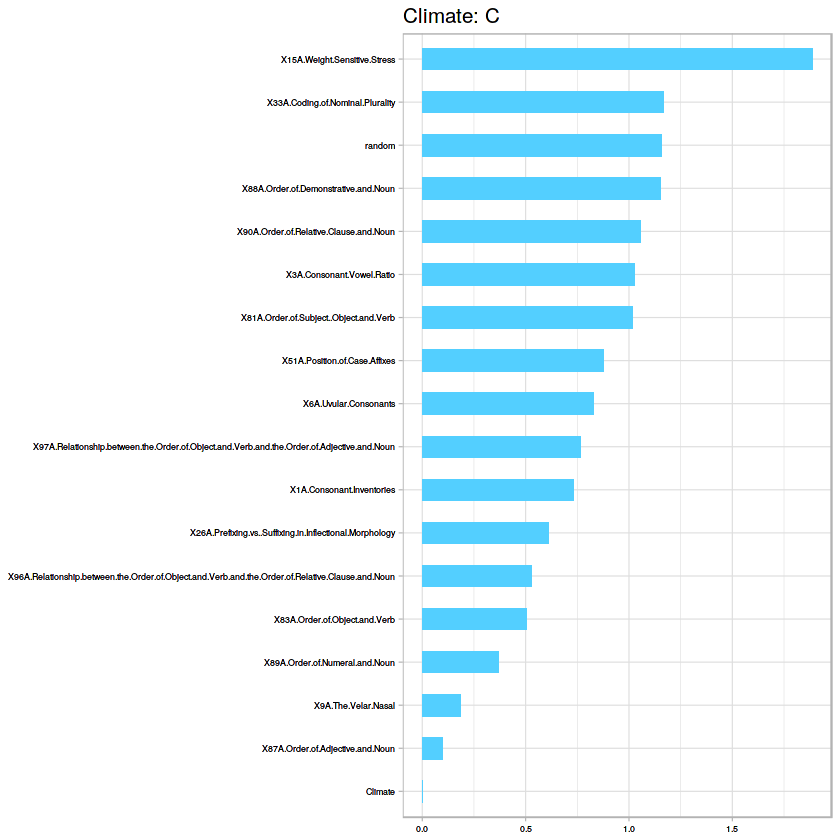

[1] "Accuracy for SVM:79.5180722891566"
   
     D  X
  D  1  0
  X 13 69
   
     D  X
  D  1  0
  X 13 69
[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9526325


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

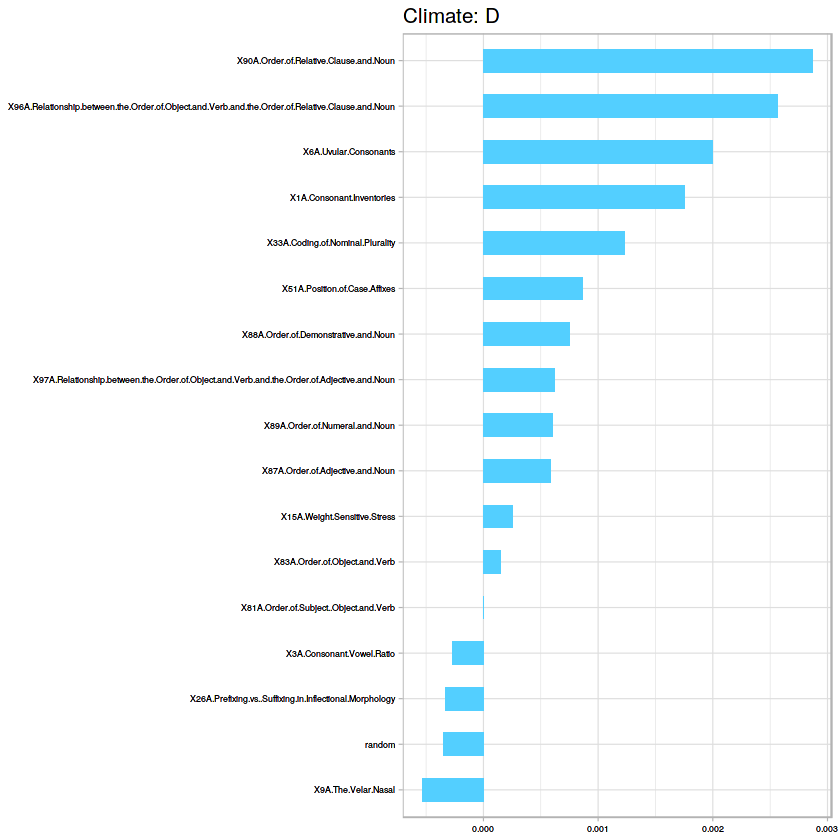

[1] C-V accuracy for Random Forest is 0.976688453159041
[1] "RF Confusion Matrix:"
   
     E  X
  E  0  0
  X  2 81


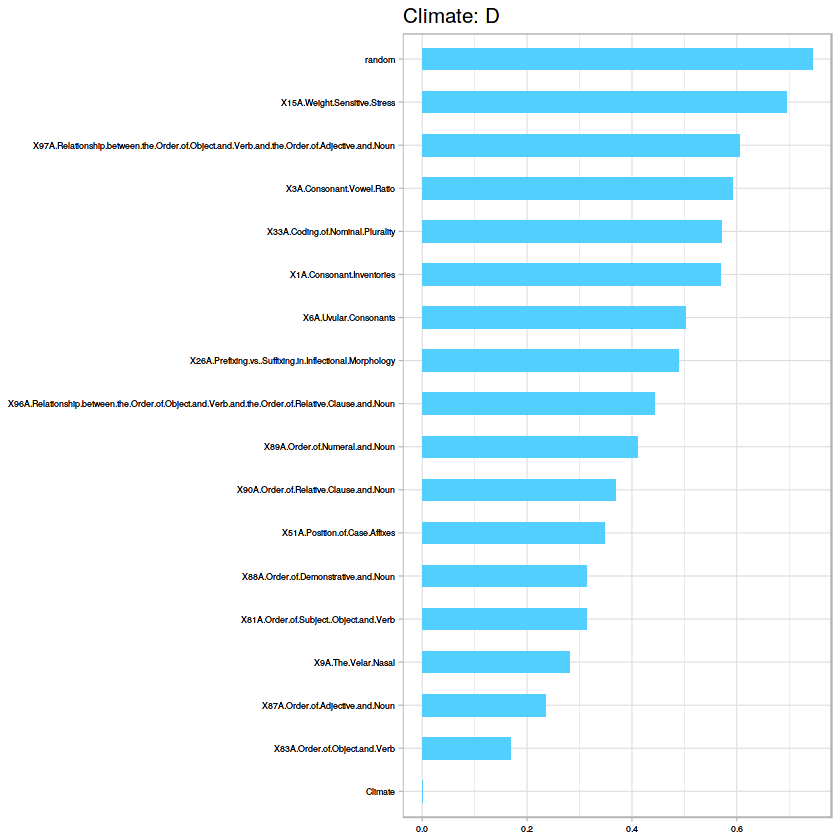

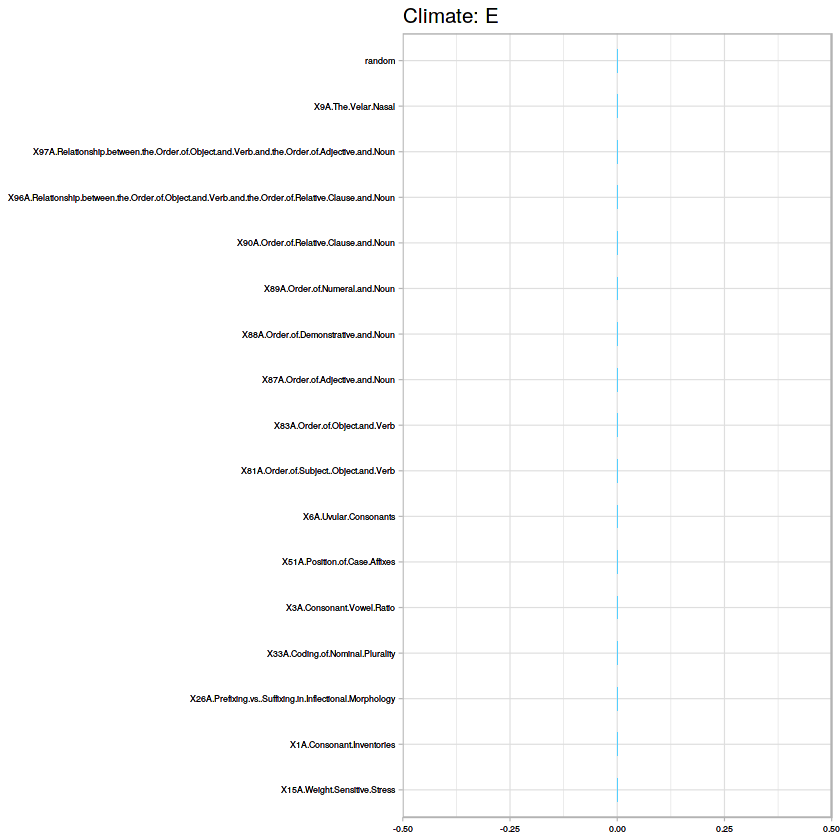

[1] "Accuracy for SVM:97.5903614457831"
   
     E  X
  E  0  0
  X  2 81
   
     E  X
  E  0  0
  X  2 81


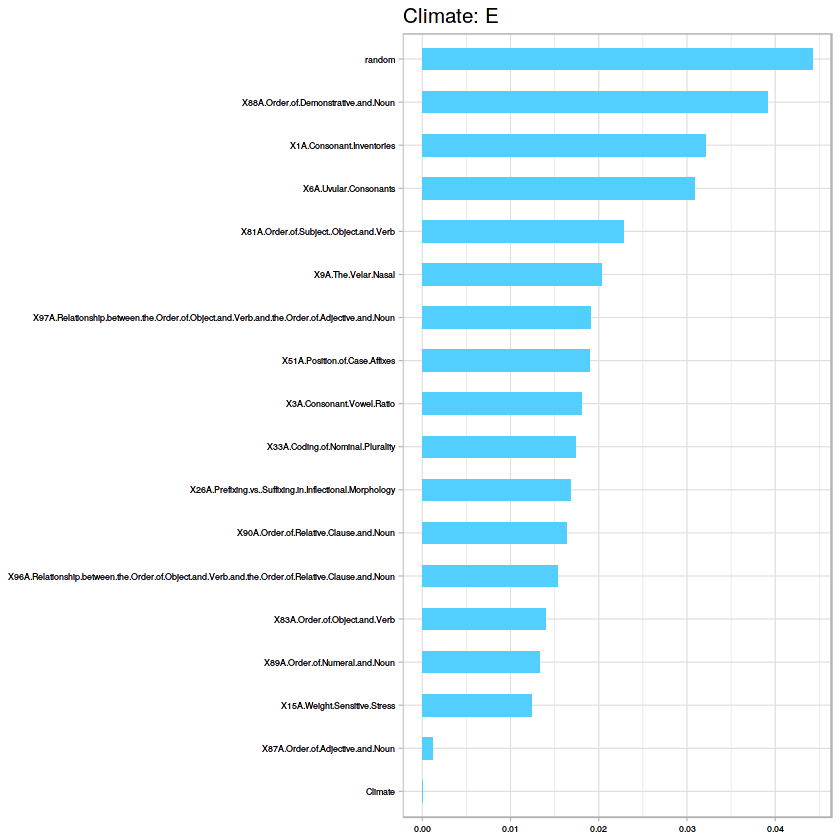

In [534]:
#One vs All
ovsa(mds2)

[1] "A" "B"
[1] 0.5651591
[1] "Dummy Classifier accuracy:0.565159090909091"
[1] C-V accuracy for Random Forest is 0.692592592592593
[1] "RF Confusion Matrix:"
   
     A  B
  A 30 12
  B  0  2


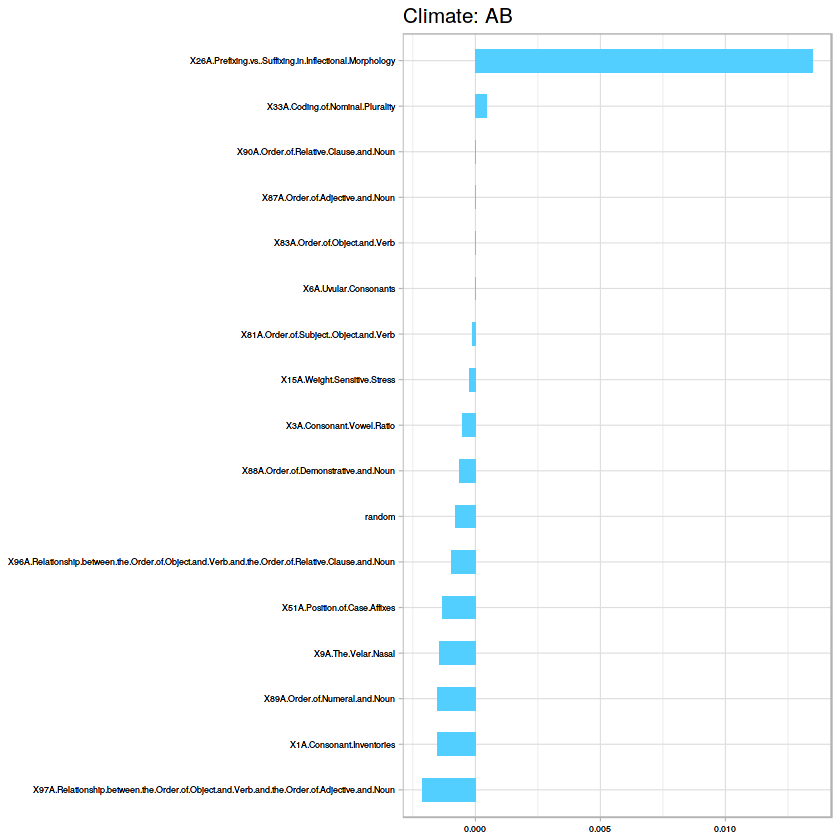

[1] "Accuracy for SVM:72.7272727272727"
   
     A  B
  A 30  1
  B  0 13
   
     A  B
  A 30  1
  B  0 13
[1] "A" "C"
[1] 0.5079245
[1] "Dummy Classifier accuracy:0.507924528301887"
[1] C-V accuracy for Random Forest is 0.737575757575758
[1] "RF Confusion Matrix:"
   
     A  C
  A 28  6
  C  2 17


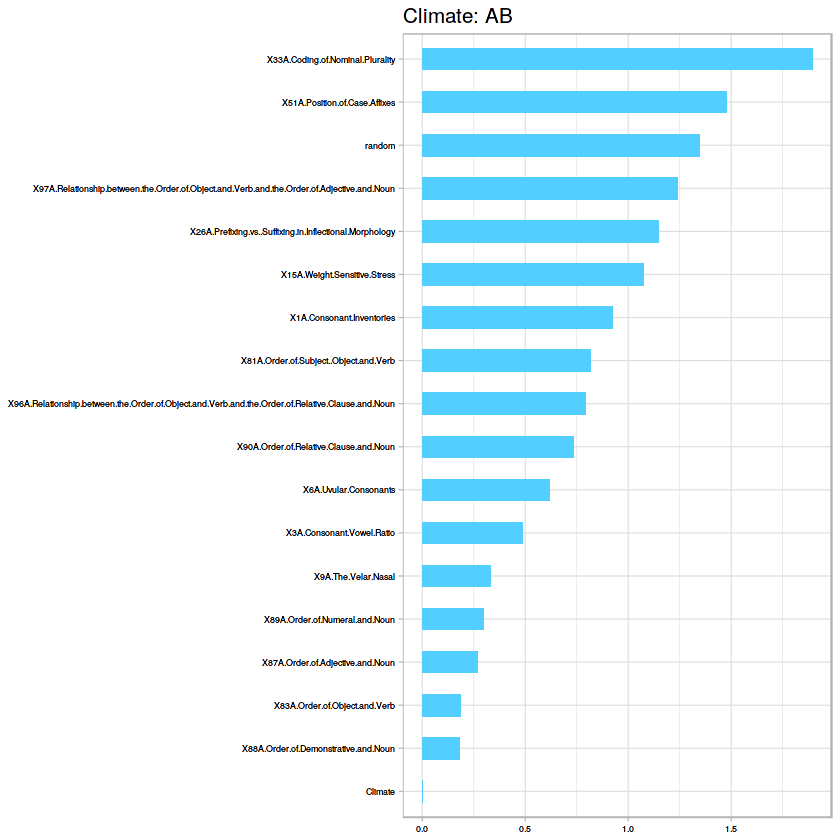

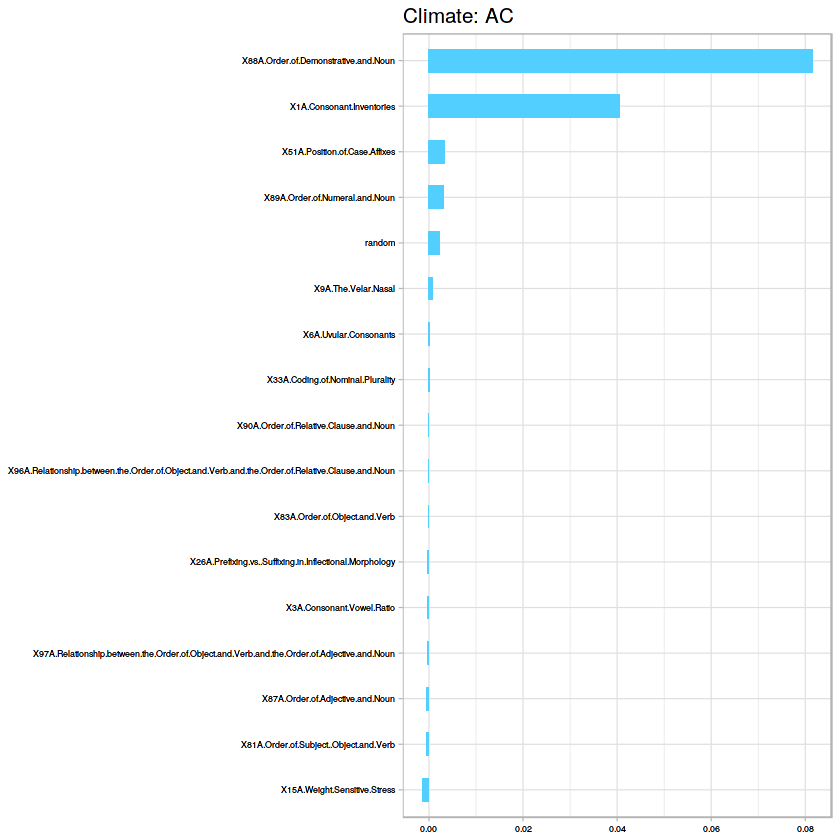

[1] "Accuracy for SVM:67.1698113207547"
   
     A  C
  A 30  3
  C  0 20
   
     A  C
  A 30  3
  C  0 20
[1] "A" "D"
[1] 0.5668068
[1] "Dummy Classifier accuracy:0.566806818181818"
[1] C-V accuracy for Random Forest is 0.872222222222222
[1] "RF Confusion Matrix:"
   
     A  D
  A 29  2
  D  1 12


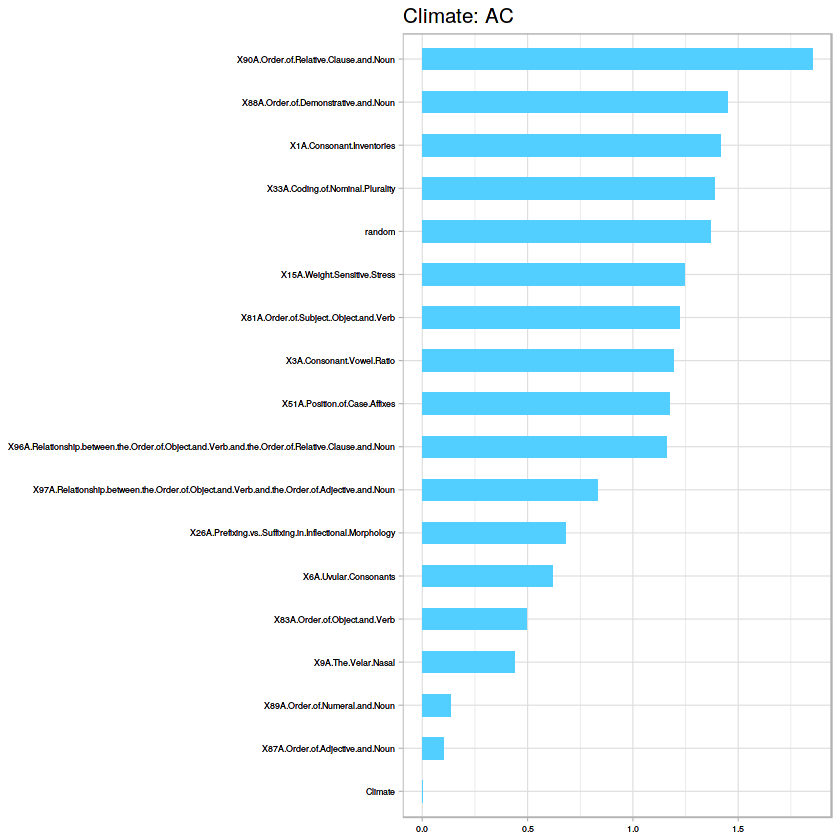

[1] "Accuracy for SVM:87.2727272727273"
   
     A  D
  A 30  0
  D  0 14
   
     A  D
  A 30  0
  D  0 14
[1] "A" "E"
[1] 0.8831094
[1] "Dummy Classifier accuracy:0.883109375"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

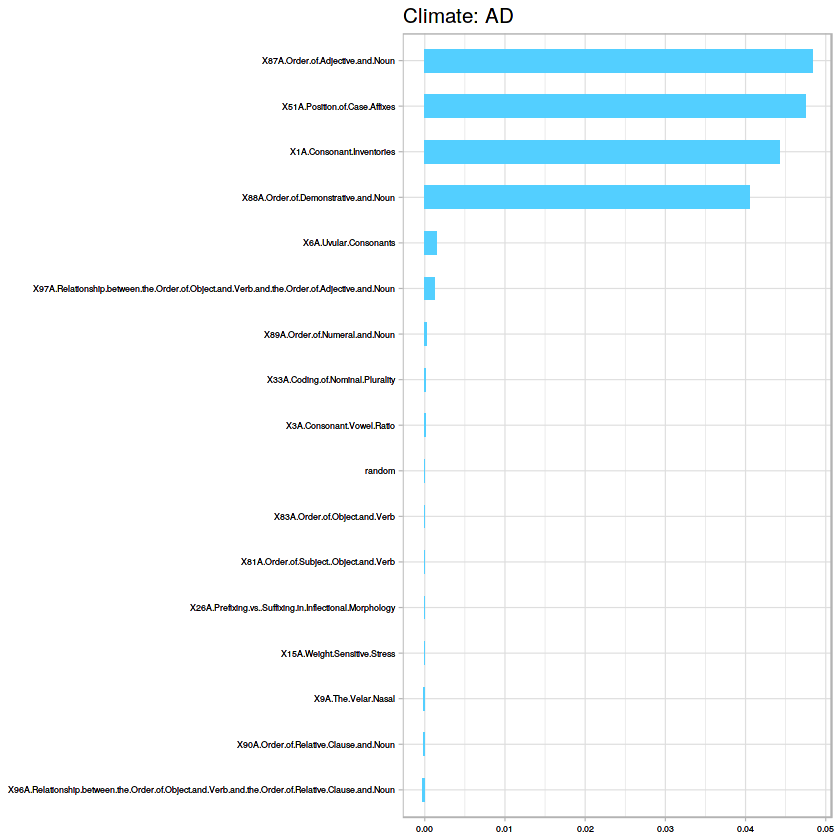

[1] C-V accuracy for Random Forest is 0.942857142857143
[1] "RF Confusion Matrix:"
   
     A  E
  A 30  2
  E  0  0


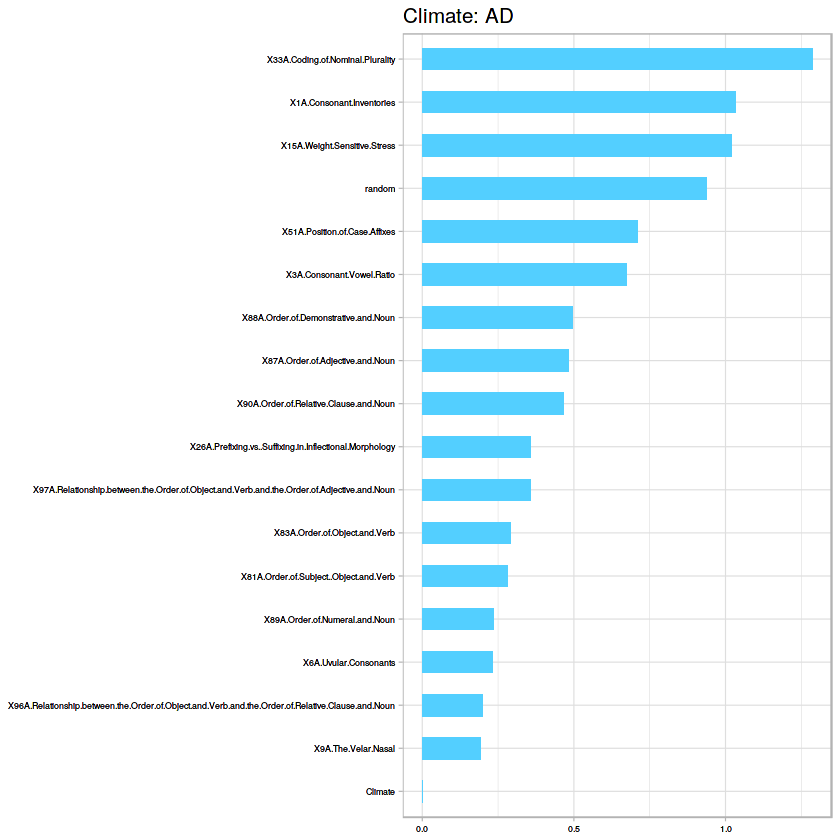

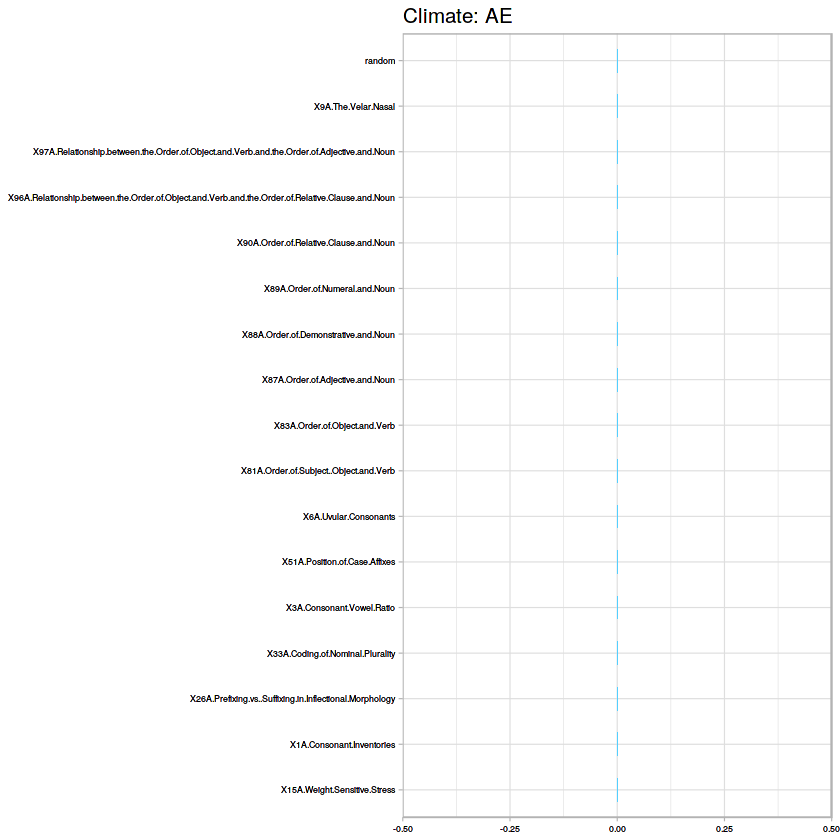

[1] "Accuracy for SVM:93.75"
   
     A  E
  A 30  2
  E  0  0
   
     A  E
  A 30  2
  E  0  0
[1] "B" "C"
[1] 0.5299189
[1] "Dummy Classifier accuracy:0.529918918918919"
[1] C-V accuracy for Random Forest is 0.63968253968254
[1] "RF Confusion Matrix:"
   
     B  C
  B  7  0
  C  7 23


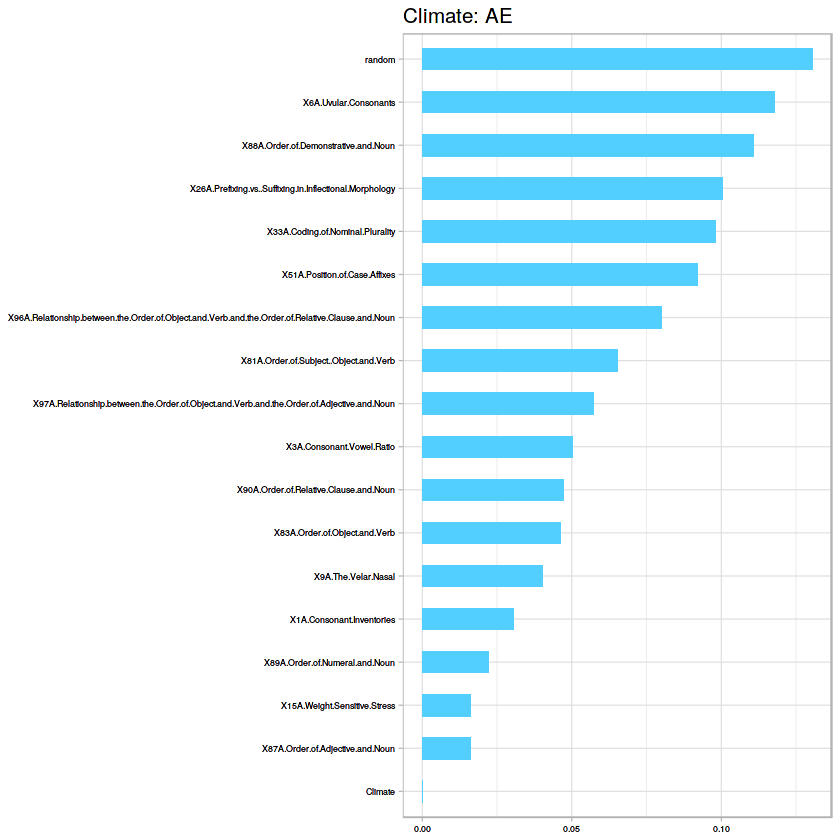

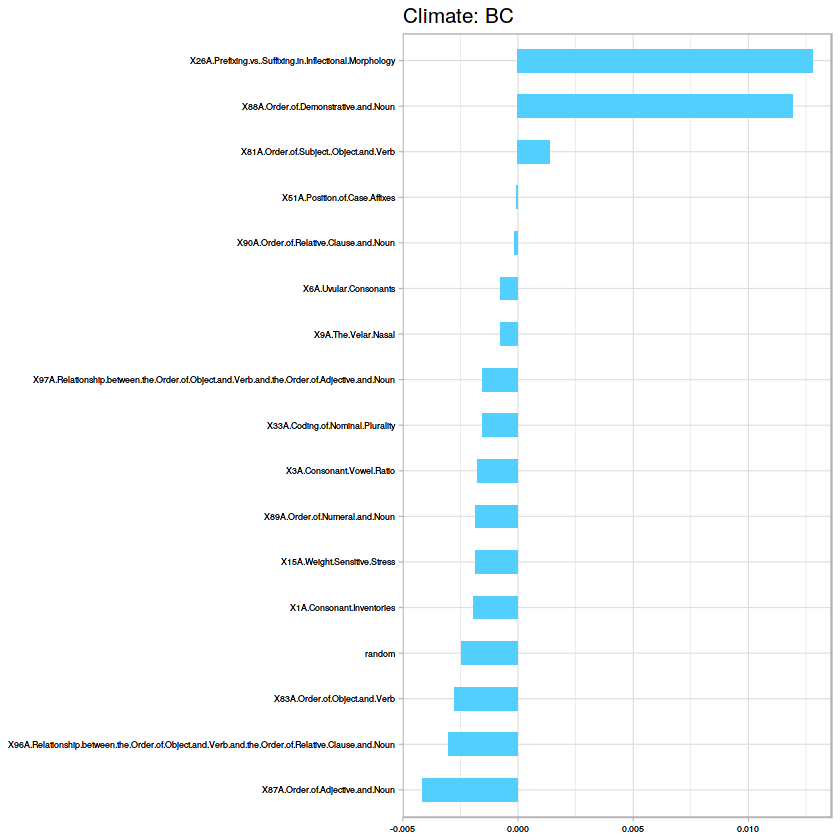

[1] "Accuracy for SVM:51.8918918918919"
   
     B  C
  B 11  0
  C  3 23
   
     B  C
  B 11  0
  C  3 23
[1] "B" "D"
[1] 0.4978036
[1] "Dummy Classifier accuracy:0.497803571428571"
[1] C-V accuracy for Random Forest is 0.688888888888889
[1] "RF Confusion Matrix:"
   
     B  D
  B 14 14
  D  0  0


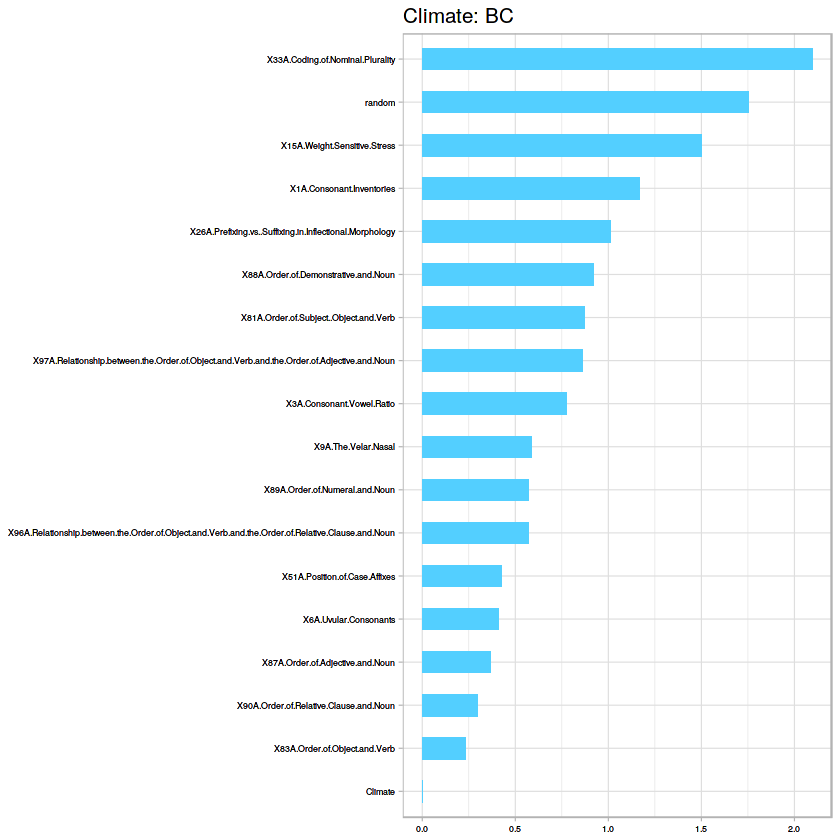

[1] "Accuracy for SVM:60"
   
     B  D
  B 13  0
  D  1 14
   
     B  D
  B 13  0
  D  1 14
[1] "B" "E"
[1] 0.7804688
[1] "Dummy Classifier accuracy:0.78046875"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

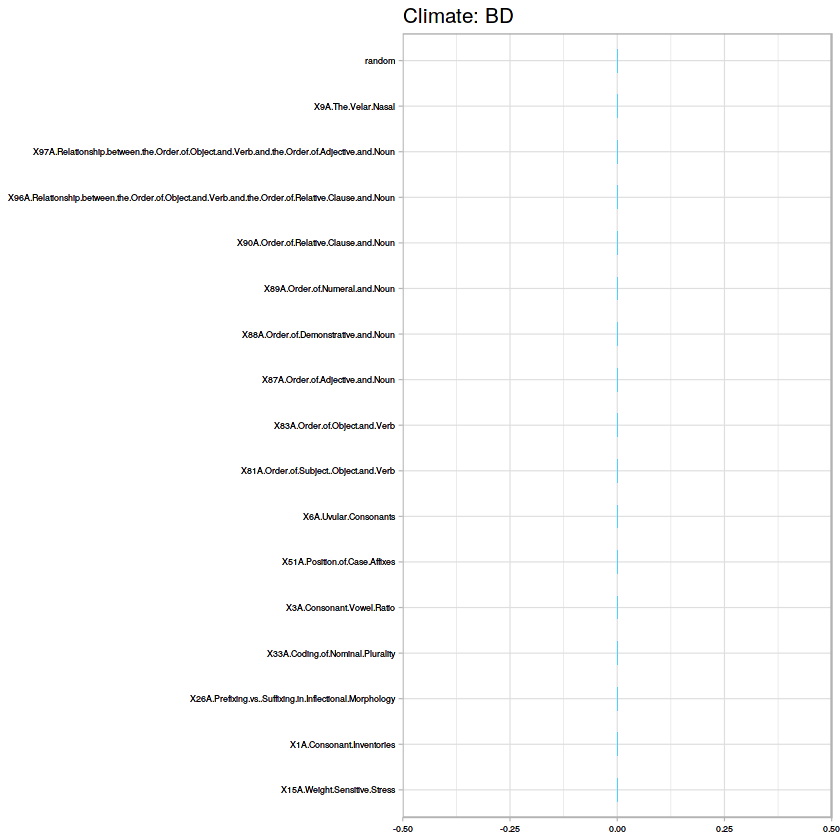

[1] C-V accuracy for Random Forest is 0.888888888888889
[1] "RF Confusion Matrix:"
   
     B  E
  B 14  2
  E  0  0


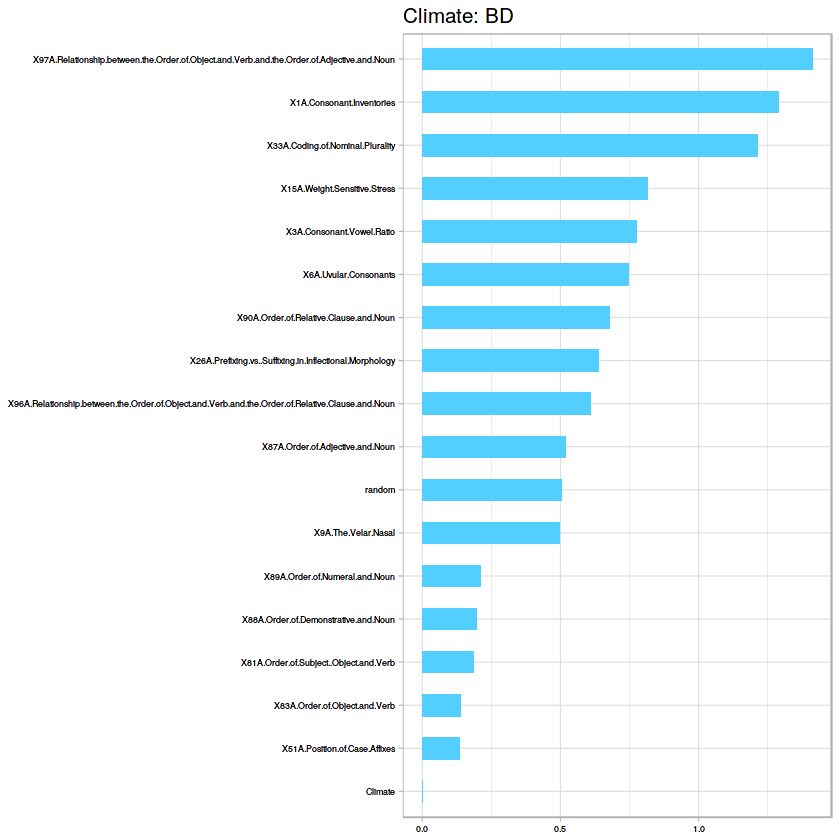

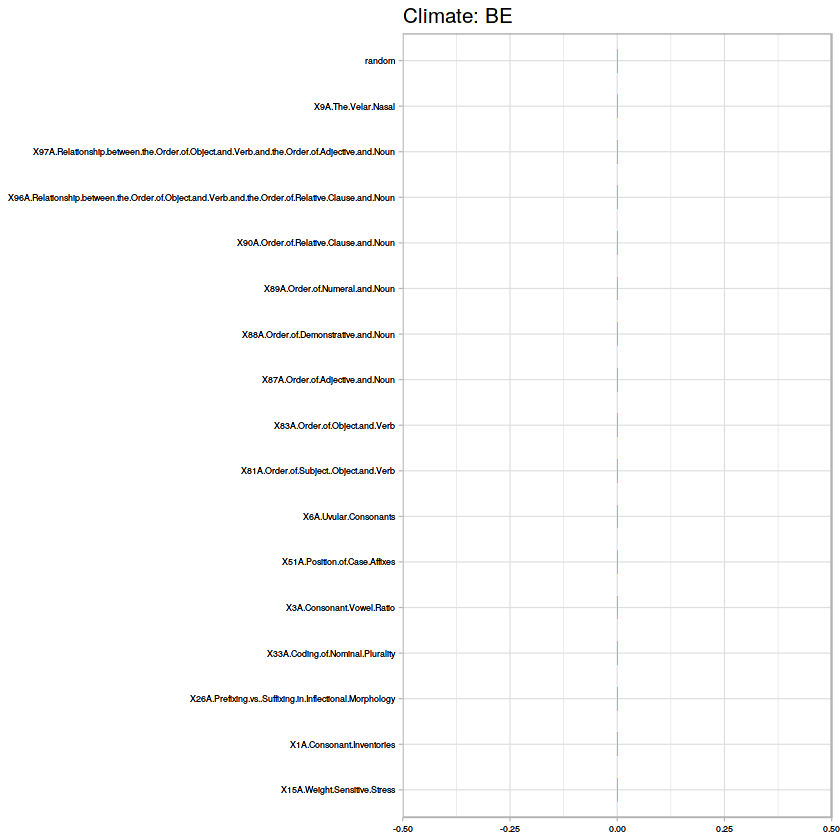

[1] "Accuracy for SVM:87.5"
   
     B  E
  B 14  2
  E  0  0
   
     B  E
  B 14  2
  E  0  0
[1] "C" "D"
[1] 0.5290946
[1] "Dummy Classifier accuracy:0.529094594594595"
[1] C-V accuracy for Random Forest is 0.621825396825397
[1] "RF Confusion Matrix:"
   
     C  D
  C 23 14
  D  0  0


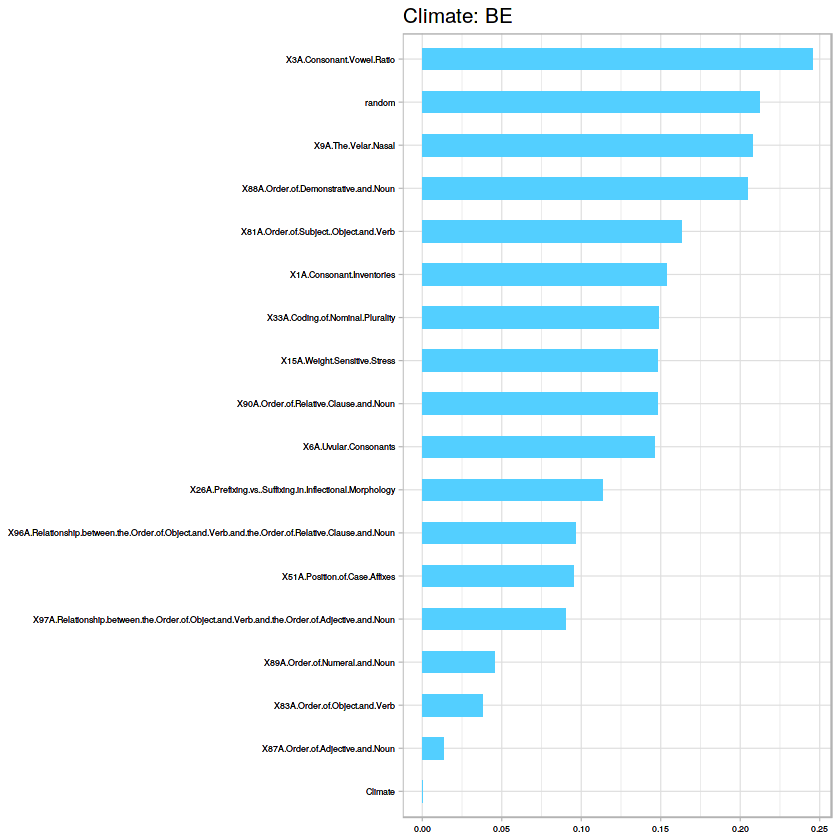

[1] "Accuracy for SVM:57.8378378378378"
   
     C  D
  C 23  2
  D  0 12
   
     C  D
  C 23  2
  D  0 12
[1] "C" "E"
[1] 0.85402
[1] "Dummy Classifier accuracy:0.85402"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

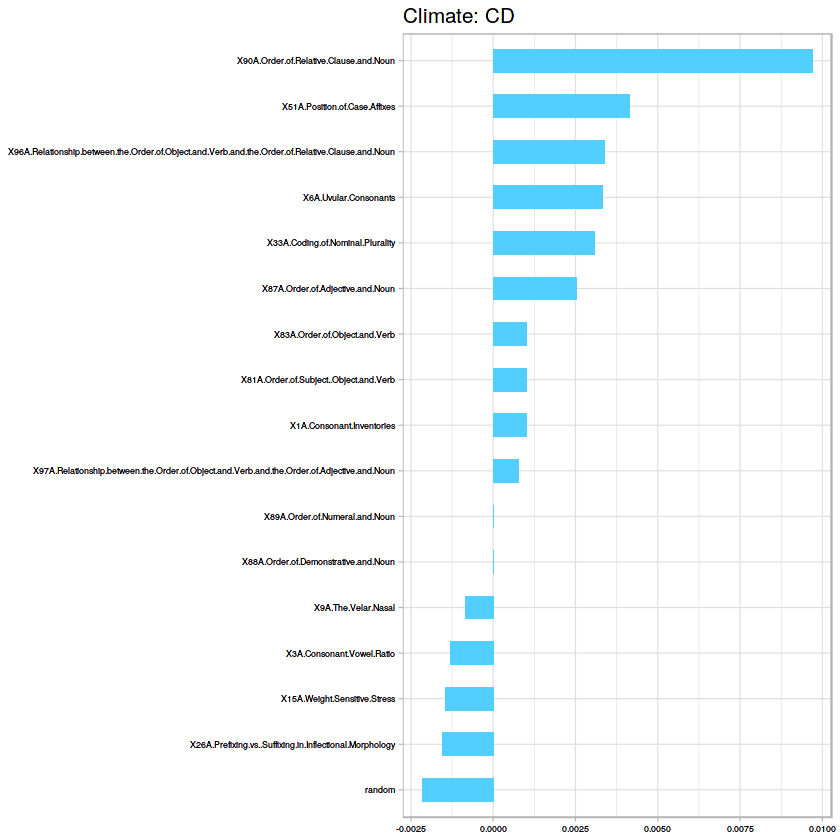

[1] C-V accuracy for Random Forest is 0.928888888888889
[1] "RF Confusion Matrix:"
   
     C  E
  C 23  2
  E  0  0


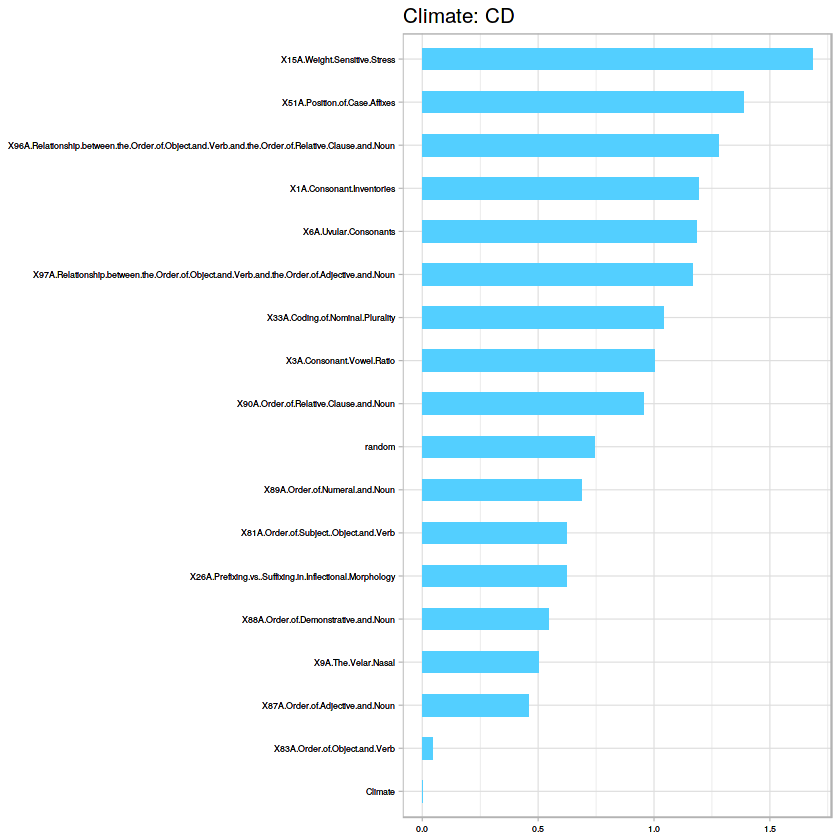

[1] "Accuracy for SVM:92"
   
     C  E
  C 23  2
  E  0  0
   
     C  E
  C 23  2
  E  0  0
[1] "D" "E"
[1] 0.781
[1] "Dummy Classifier accuracy:0.781"


Warning message:
In nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, : There were missing values in resampled performance measures.

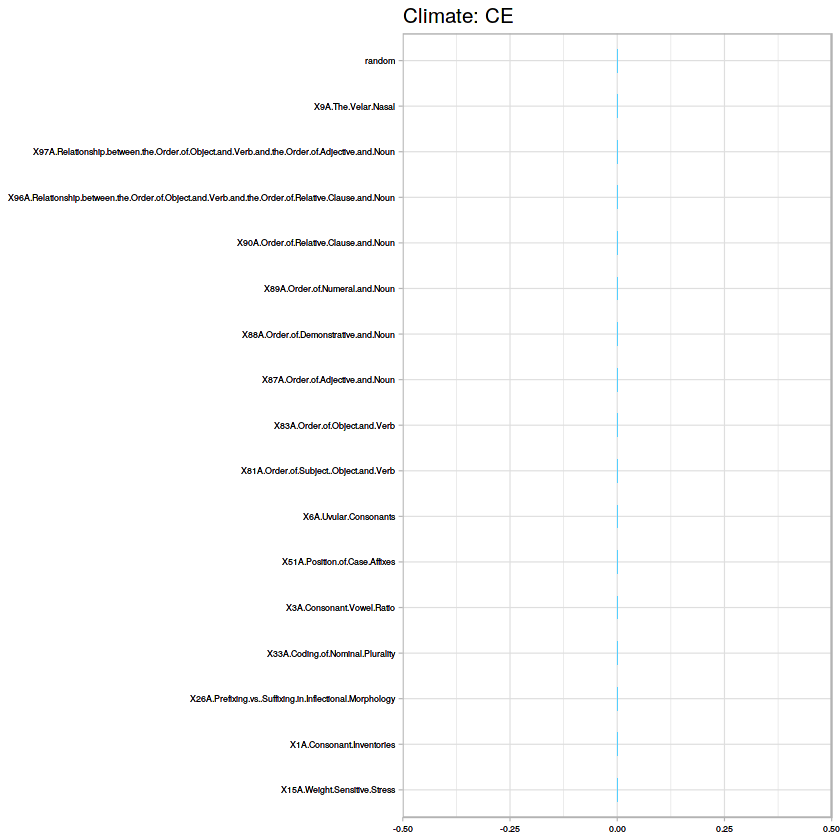

[1] C-V accuracy for Random Forest is 0.888888888888889
[1] "RF Confusion Matrix:"
   
     D  E
  D 14  2
  E  0  0


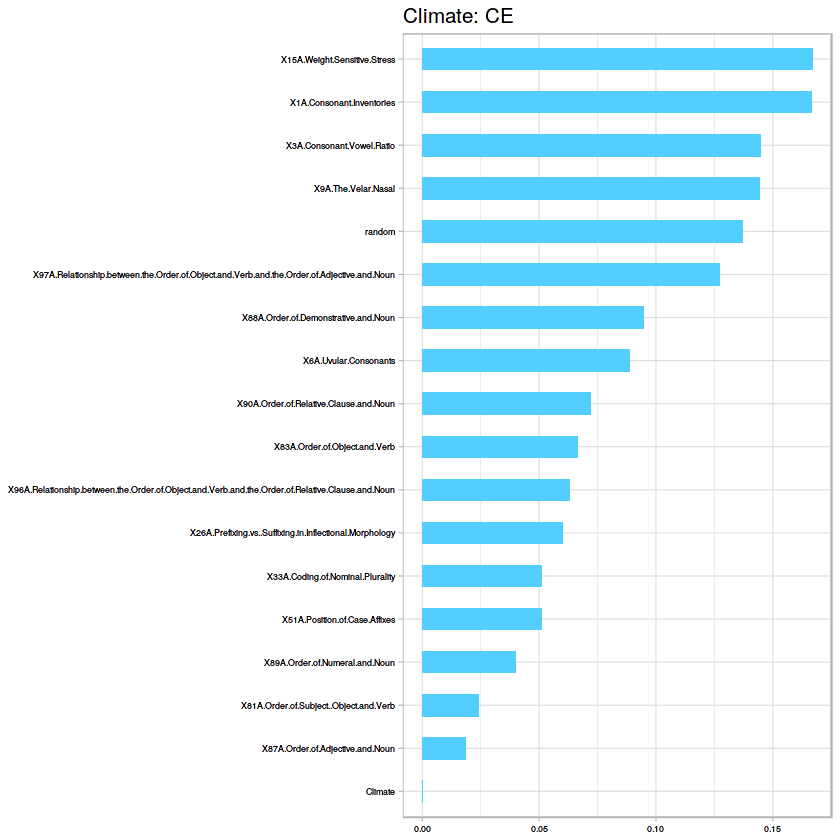

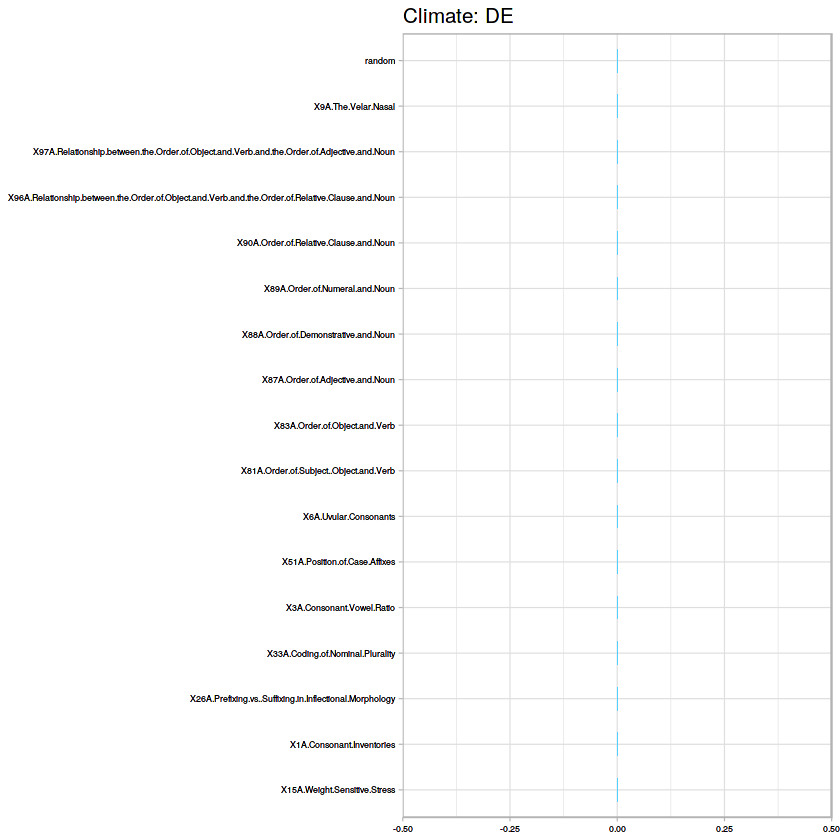

[1] "Accuracy for SVM:87.5"
   
     D  E
  D 14  2
  E  0  0
   
     D  E
  D 14  2
  E  0  0


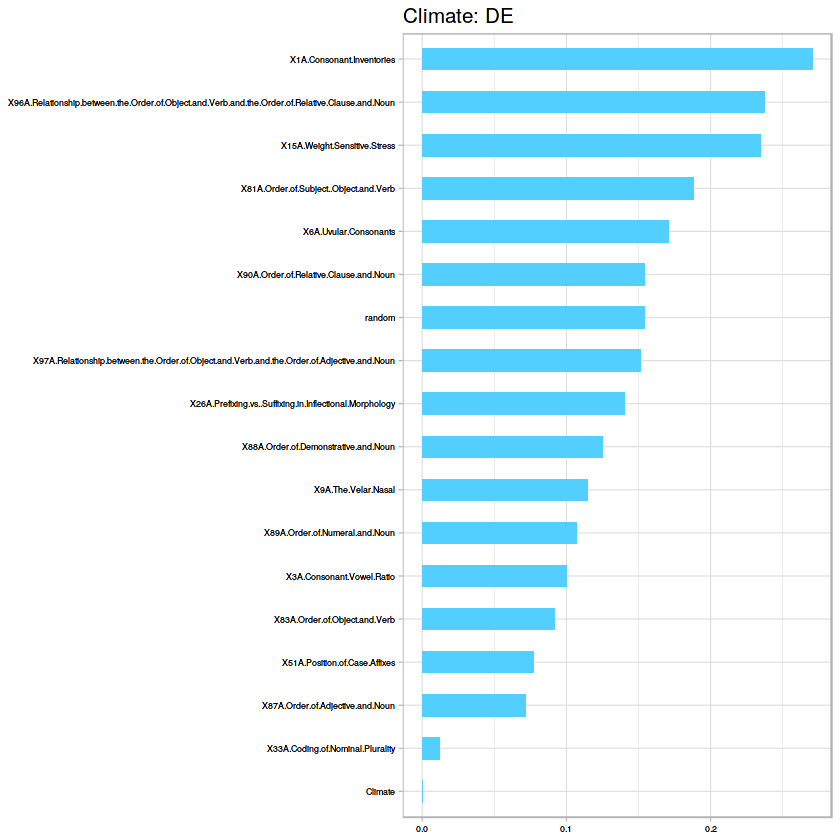

In [536]:
#One vs One
ovo(mds2)

[1] "Climate: "
[1] "A" "B"
[1] "Dummy Classifier"
[1] 0.5022831
[1] 0.5022831
[1] C-V accuracy for Random Forest is 0.732712418300654
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 38  6
  Z  6 33


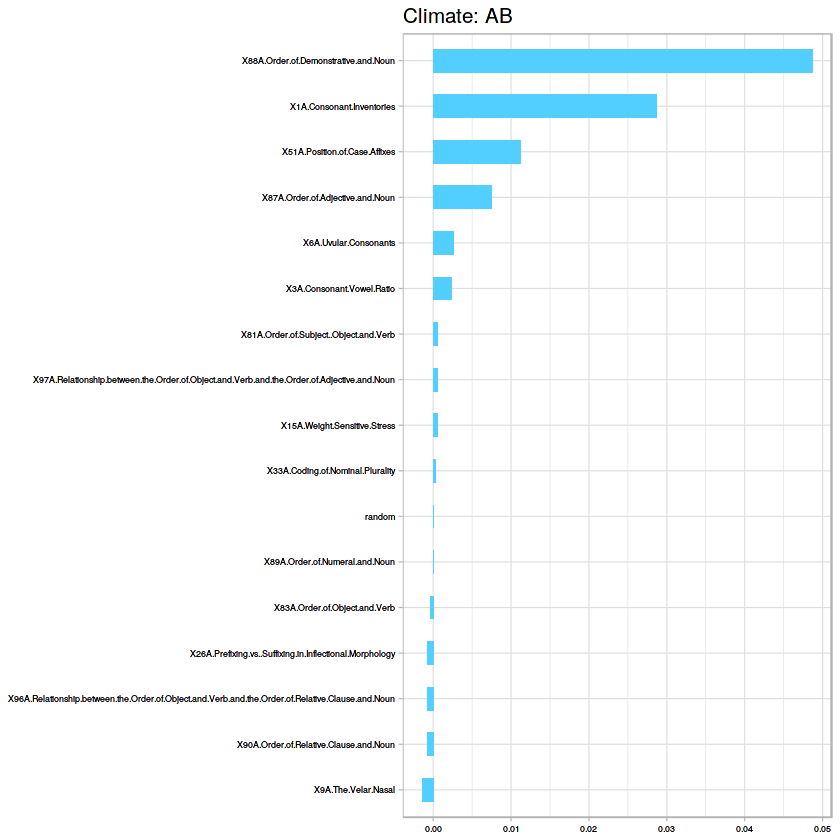

[1] "Accuracy for SVM:68.6746987951807"
   
     Y  Z
  Y 41  4
  Z  3 35
[1] "Climate: "
[1] "A" "C"
[1] "Dummy Classifier"
[1] 0.5393675
[1] 0.5393675
[1] C-V accuracy for Random Forest is 0.663235294117647
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 49 10
  Z  4 20


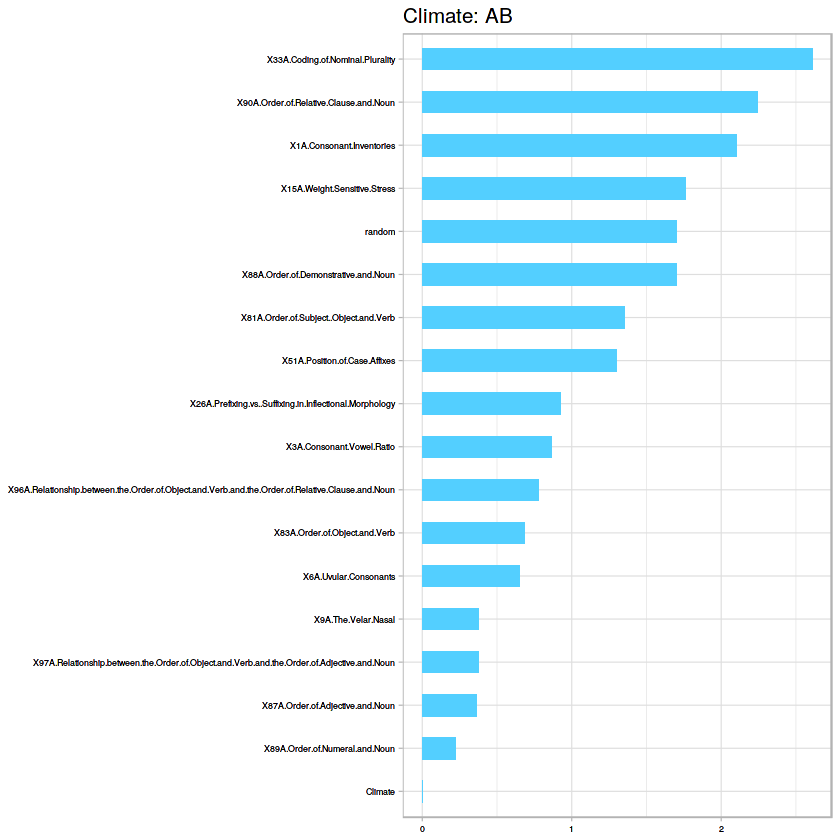

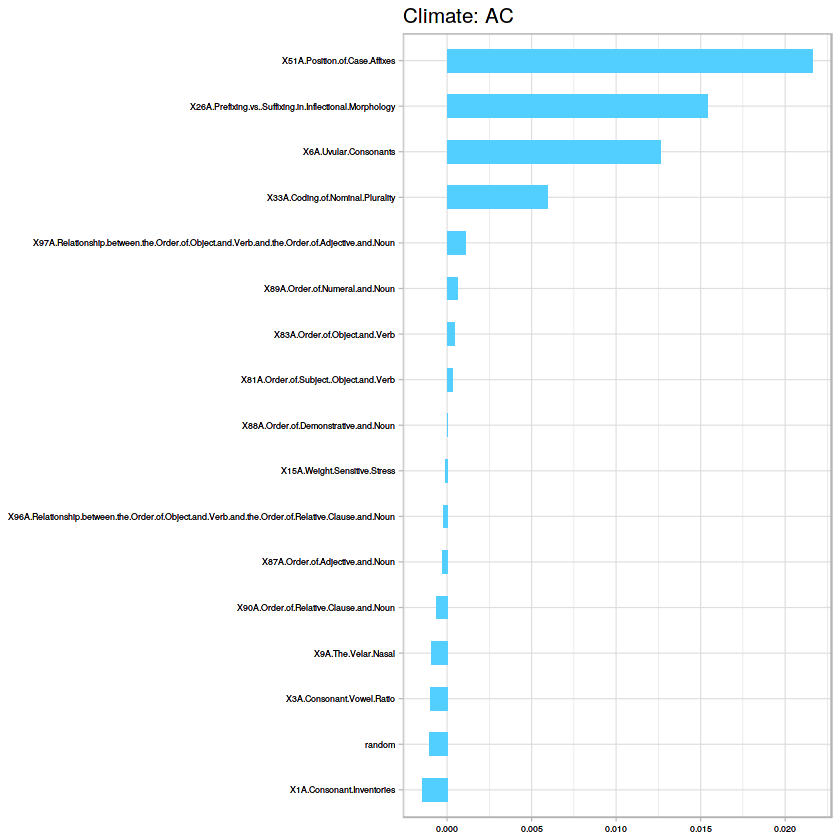

[1] "Accuracy for SVM:60.2409638554217"
   
     Y  Z
  Y 51  8
  Z  2 22
[1] "Climate: "
[1] "A" "D"
[1] "Dummy Classifier"
[1] 0.5021084
[1] 0.5021084
[1] C-V accuracy for Random Forest is 0.540441176470588
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 38  8
  Z  6 31


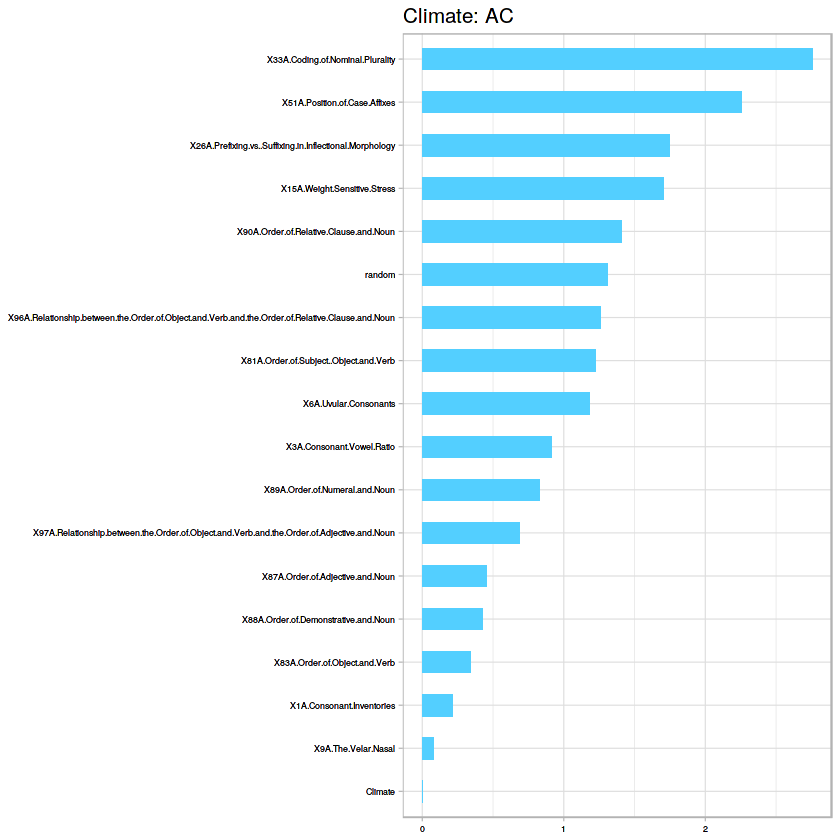

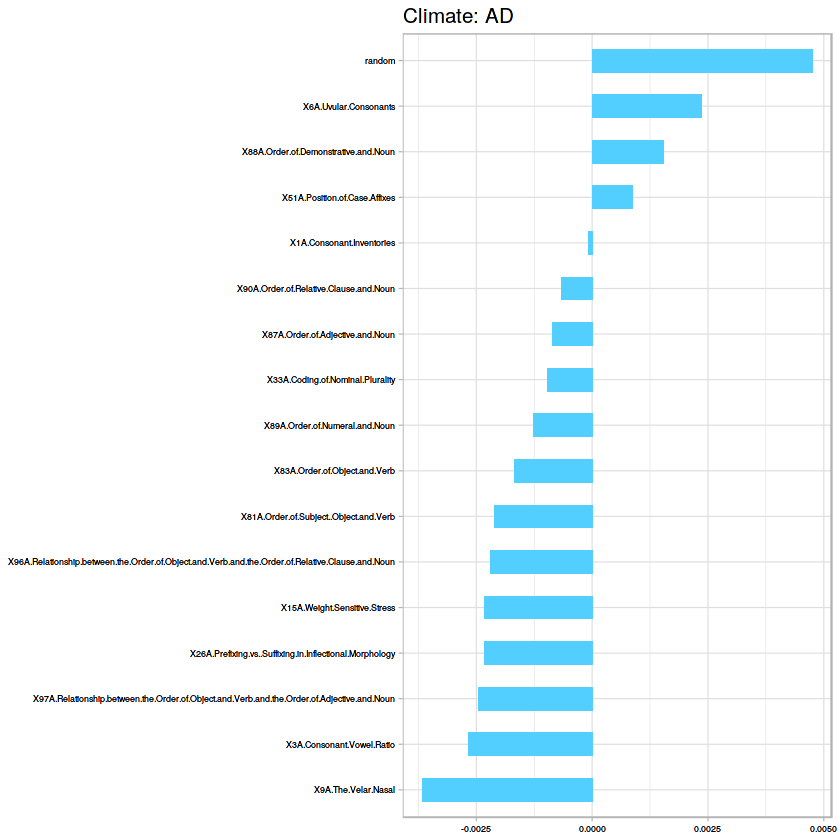

[1] "Accuracy for SVM:55.1807228915663"
   
     Y  Z
  Y 42  7
  Z  2 32
[1] "Climate: "
[1] "A" "E"
[1] "Dummy Classifier"
[1] 0.5266325
[1] 0.5266325
[1] C-V accuracy for Random Forest is 0.671650326797386
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 24  7
  Z  8 44


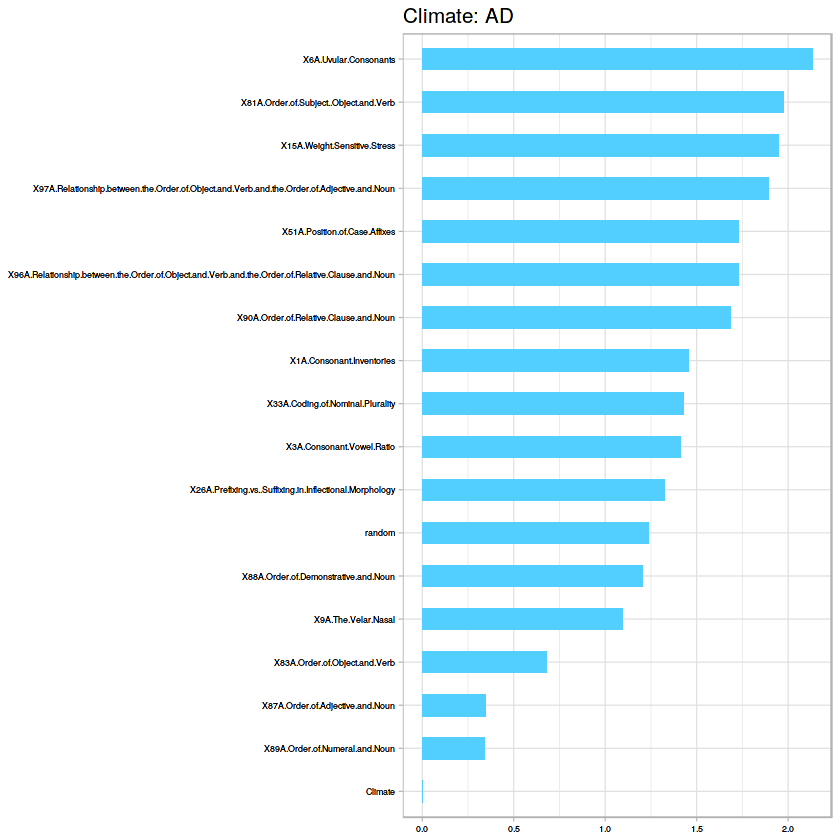

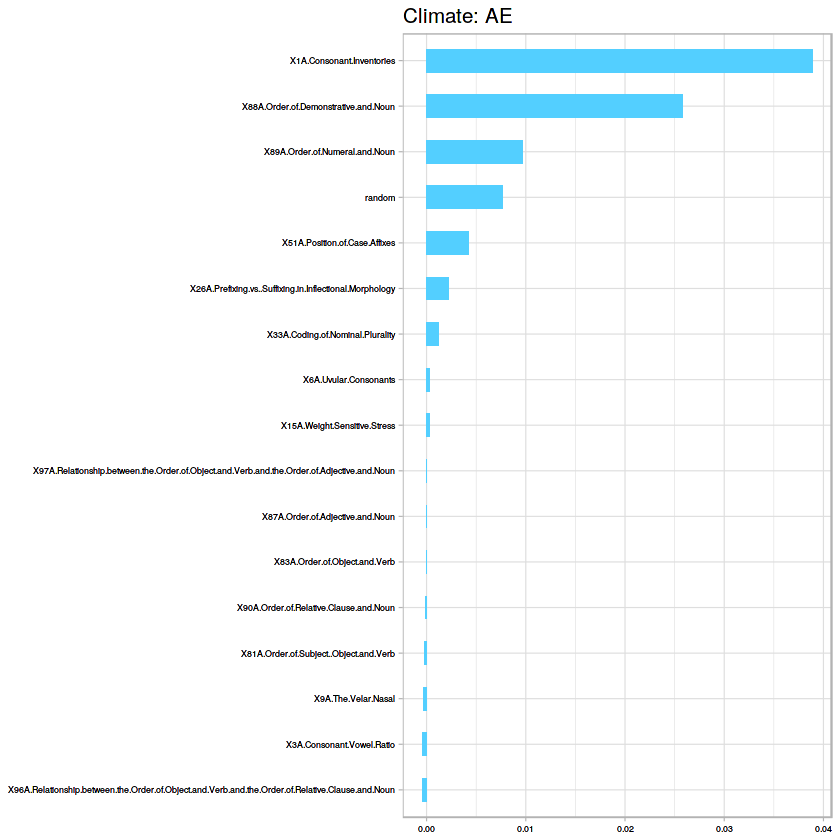

[1] "Accuracy for SVM:68.6746987951807"
   
     Y  Z
  Y 29  1
  Z  3 50
[1] "Climate: "
[1] "B" "C"
[1] "Dummy Classifier"
[1] 0.504759
[1] 0.504759
[1] C-V accuracy for Random Forest is 0.554466230936819
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 13  1
  Z 24 45


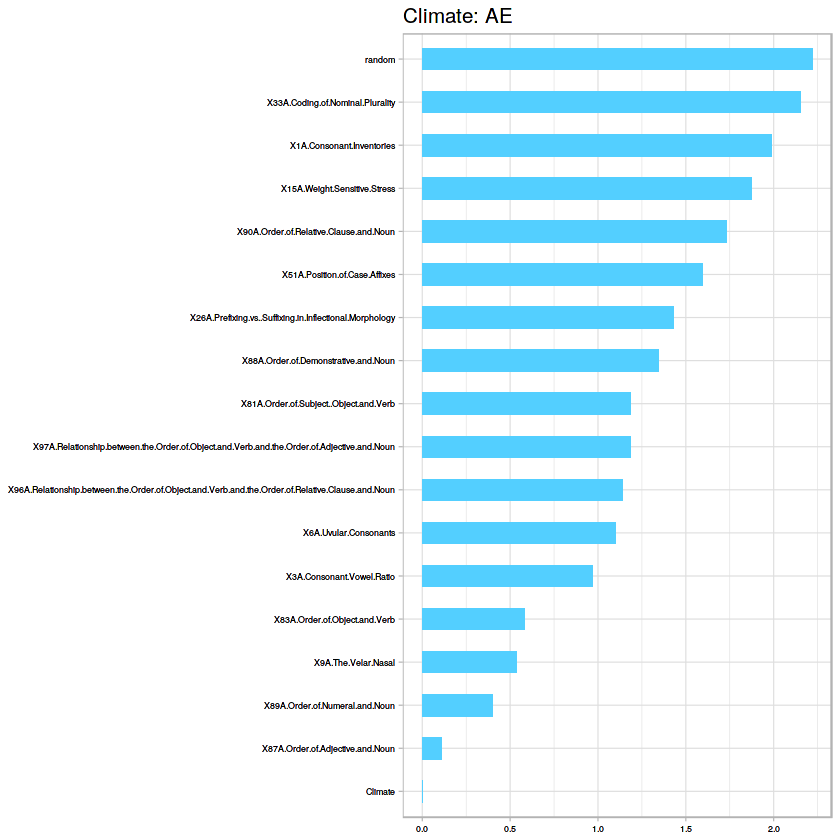

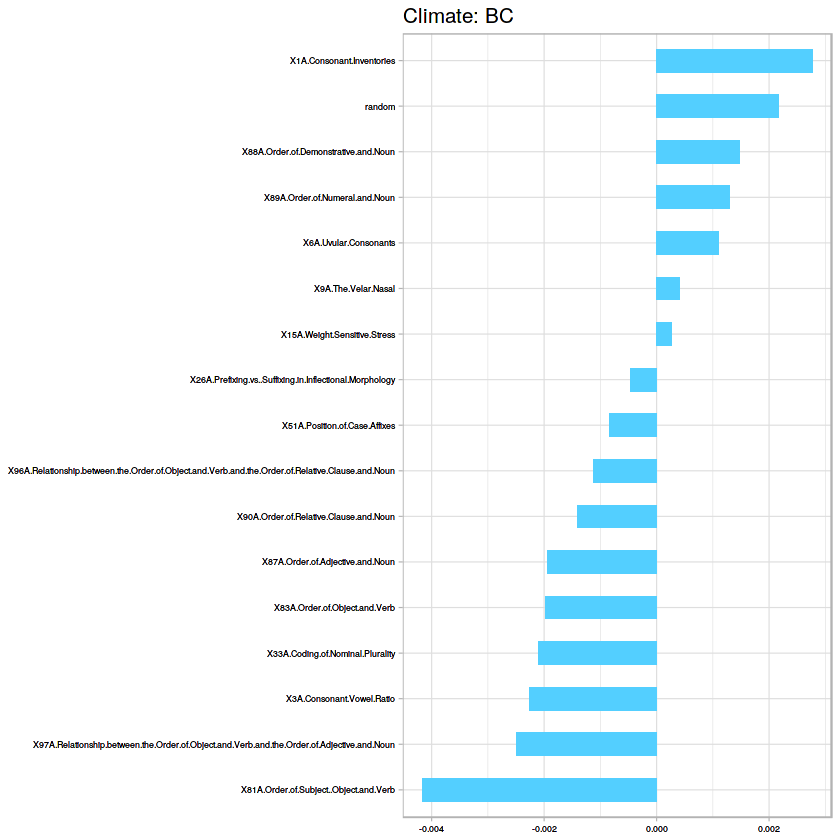

[1] "Accuracy for SVM:52.5301204819277"
   
     Y  Z
  Y 31  5
  Z  6 41
[1] "Climate: "
[1] "B" "D"
[1] "Dummy Classifier"
[1] 0.5520301
[1] 0.5520301
[1] C-V accuracy for Random Forest is 0.695098039215686
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 16  4
  Z 12 51


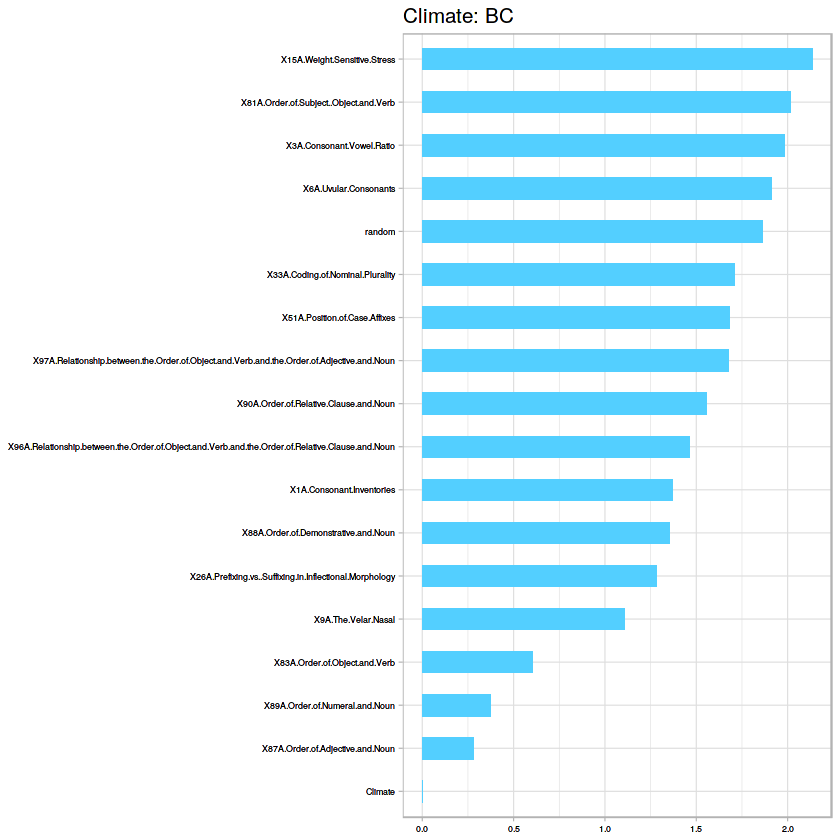

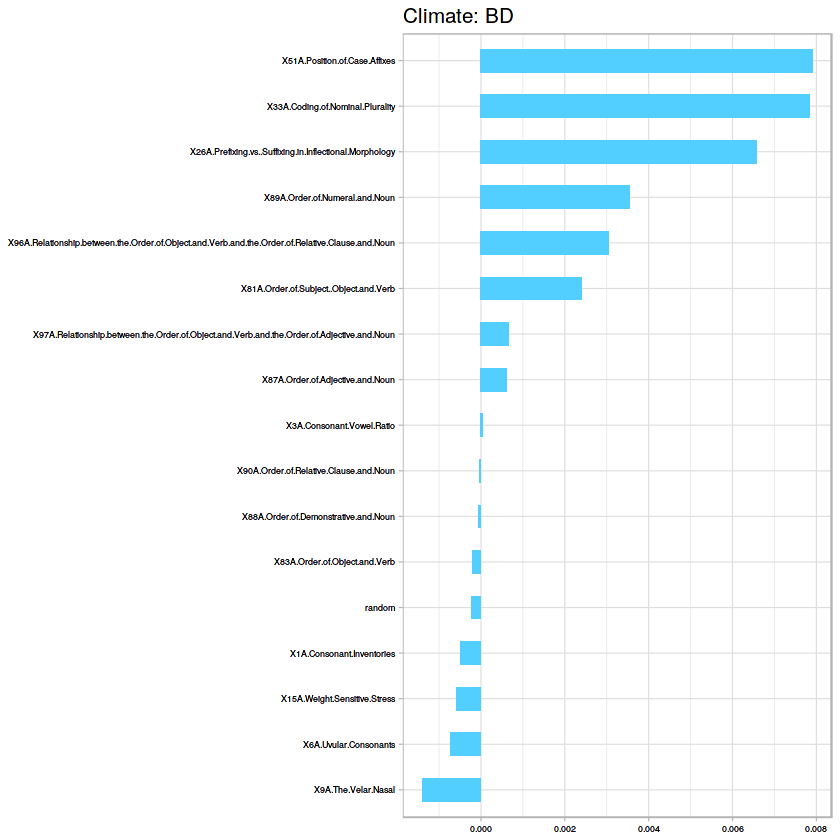

[1] "Accuracy for SVM:59.5180722891566"
   
     Y  Z
  Y 19  2
  Z  9 53
[1] "Climate: "
[1] "B" "E"
[1] "Dummy Classifier"
[1] 0.6875964
[1] 0.6875964
[1] C-V accuracy for Random Forest is 0.807352941176471
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 16 67


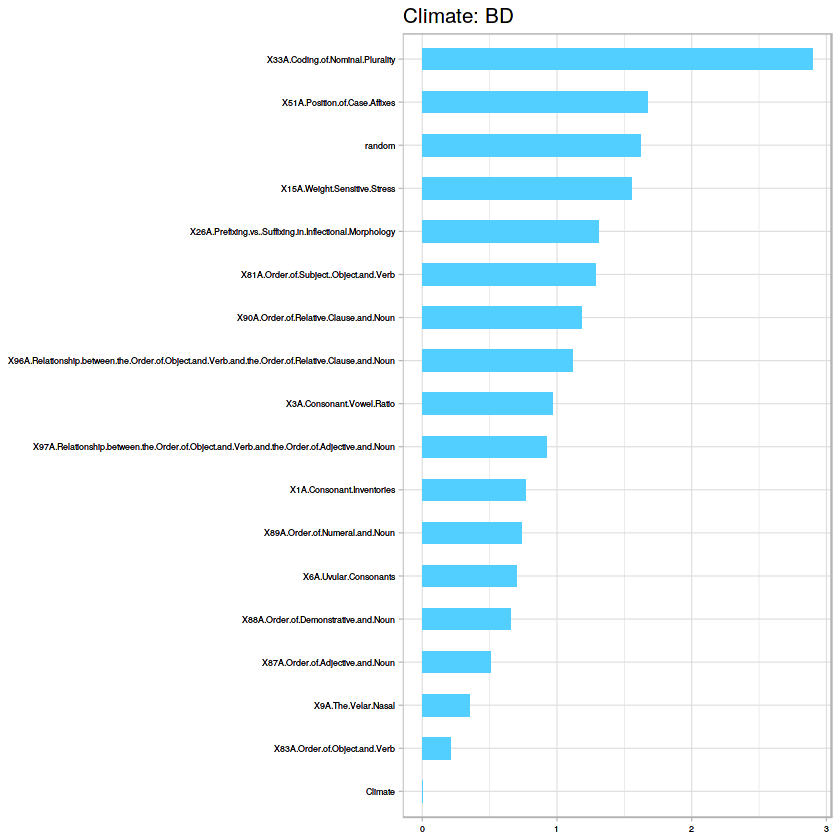

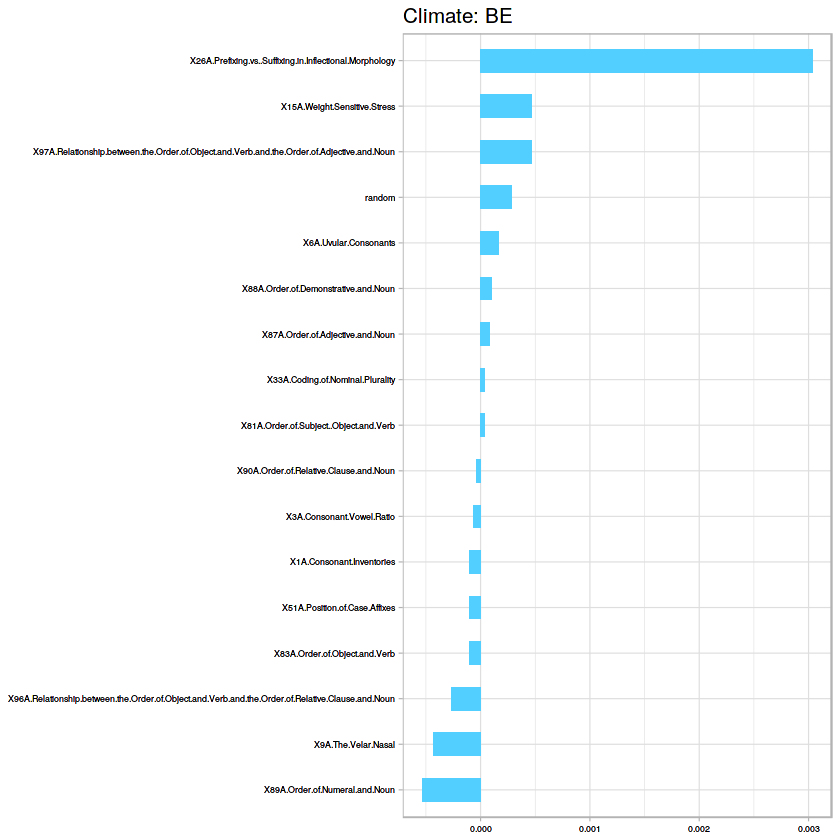

[1] "Accuracy for SVM:79.7590361445783"
   
     Y  Z
  Y  2  0
  Z 14 67
[1] "Climate: "
[1] "C" "D"
[1] "Dummy Classifier"
[1] 0.5057952
[1] 0.5057952
[1] C-V accuracy for Random Forest is 0.771078431372549
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y 30  3
  Z  7 43


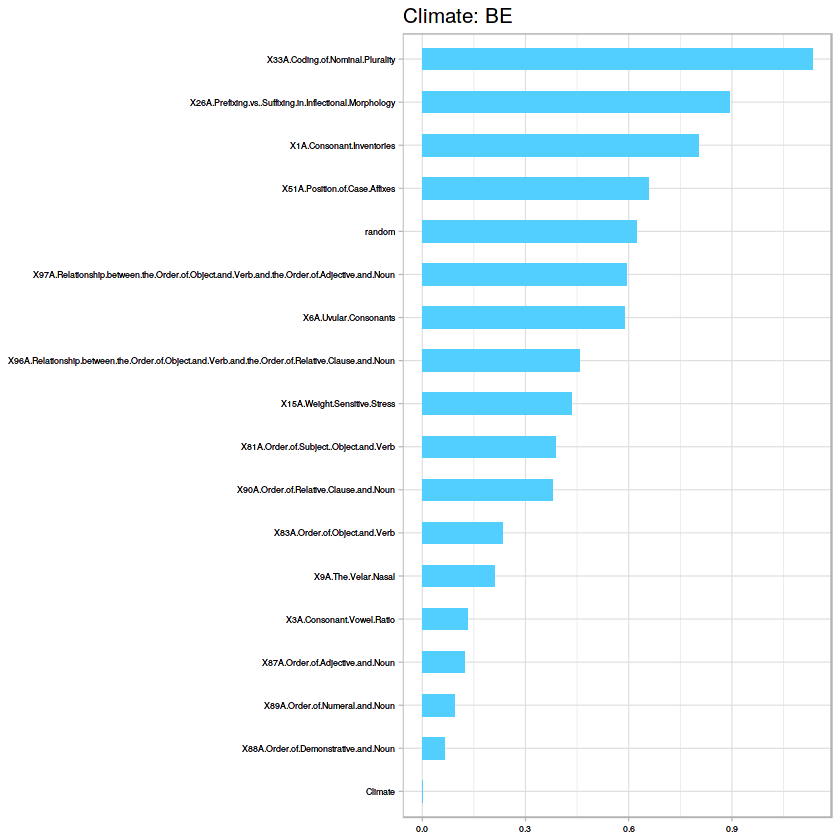

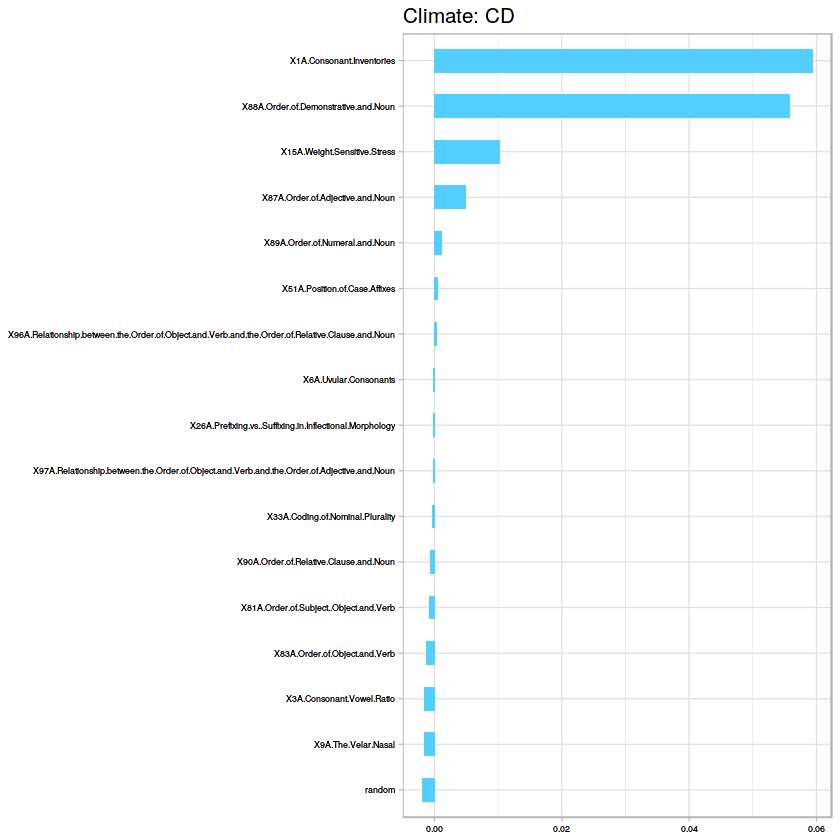

[1] "Accuracy for SVM:70.1204819277108"
   
     Y  Z
  Y 33  1
  Z  4 45
[1] "Climate: "
[1] "C" "E"
[1] "Dummy Classifier"
[1] 0.5794096
[1] 0.5794096
[1] C-V accuracy for Random Forest is 0.698529411764706
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 25 58


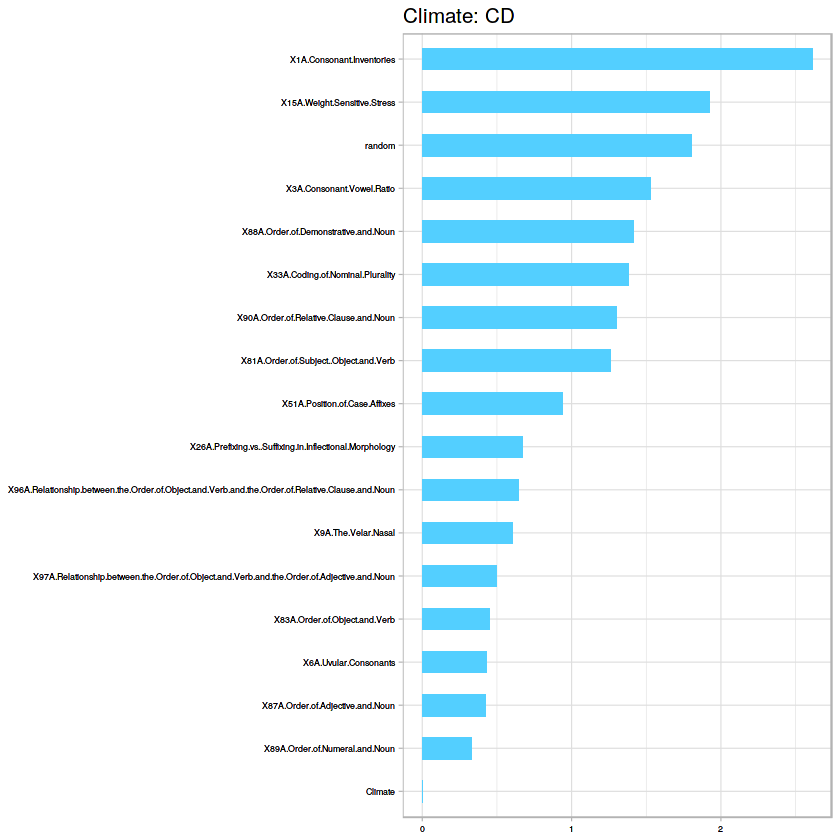

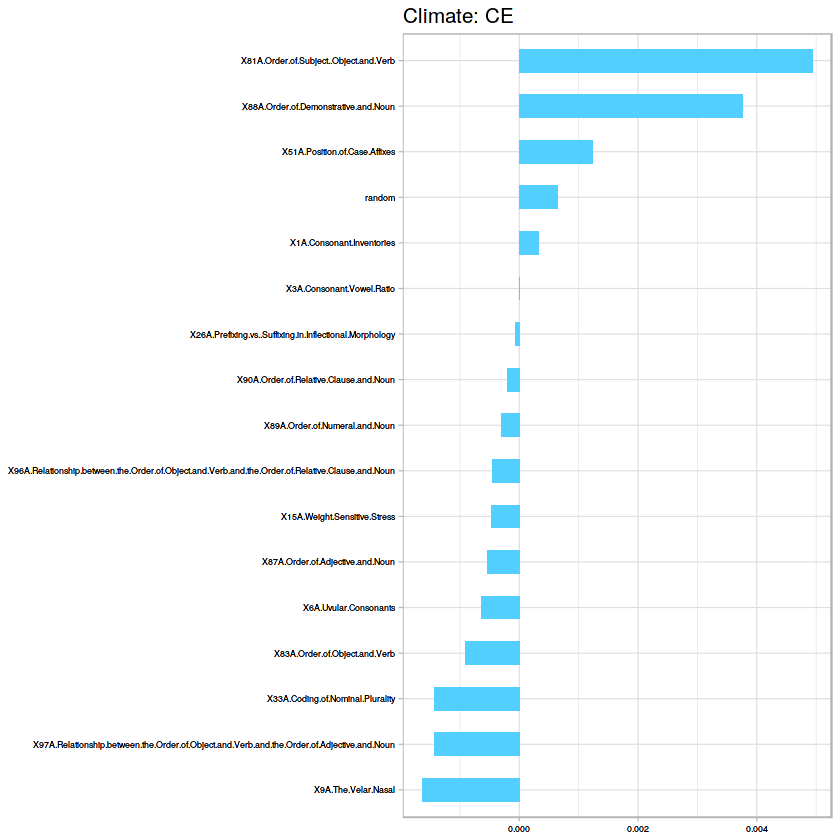

[1] "Accuracy for SVM:65.7831325301205"
   
     Y  Z
  Y  9  0
  Z 16 58
[1] "Climate: "
[1] "D" "E"
[1] "Dummy Classifier"
[1] 0.6885602
[1] 0.6885602
[1] C-V accuracy for Random Forest is 0.807352941176471
[1] "RF Confusion Matrix:"
   
     Y  Z
  Y  0  0
  Z 16 67


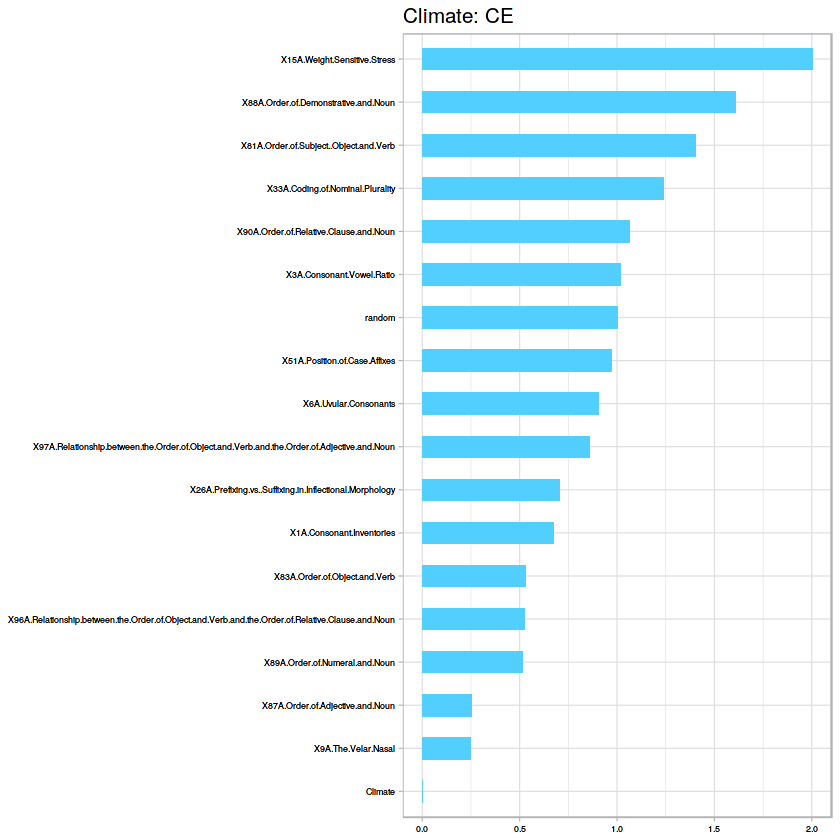

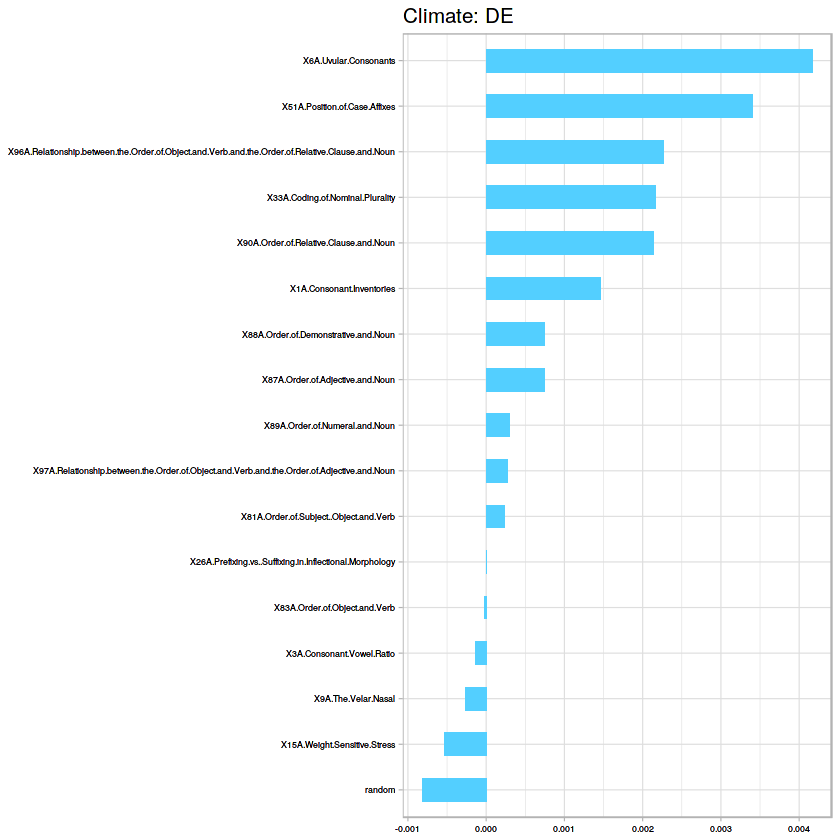

[1] "Accuracy for SVM:76.8674698795181"
   
     Y  Z
  Y  2  0
  Z 14 67


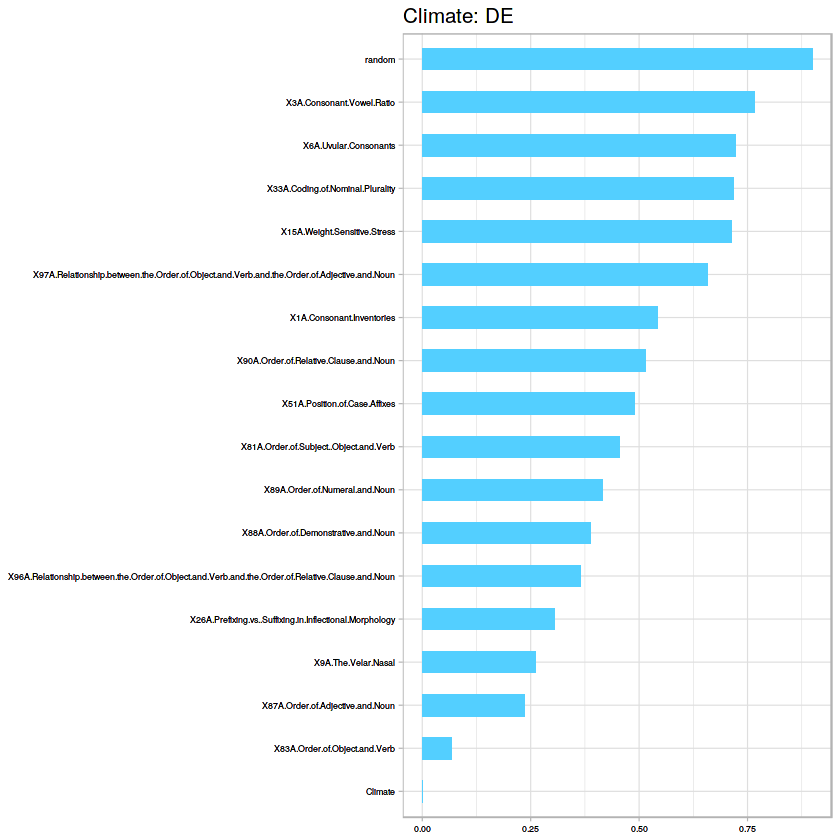

In [540]:
# 2 vs 3 
bin_2v3(mds2)